# The Homes Dataset: PART 2

A supervised machine-learning regression problem, regarding the home sale prices in the city of Ames, IA.

## 1-4. Previous Cells

In [1]:
%%capture

path = "./03_homes_01.ipynb"
%run $path

In [2]:
columns_encodings.keys()

dict_keys(['cont', 'disc', 'ordinal', 'target', 'ohe', 'bool', 'others'])

### Cleanup

In [3]:
Out.clear()

for name in dir():
    if name.startswith('_') and name[1:].isdigit():
        del globals()[name]

del name

## 5. Preprocessing

### Importing modules

In [4]:
# Train/Test split
from sklearn.model_selection import train_test_split

# Pipeline
from sklearn.pipeline import Pipeline

# to clone pipelines
from sklearn.base import clone

from sklearn.base import BaseEstimator, TransformerMixin
# from sklearn.utils.validation import validate_data

from sklearn.compose import ColumnTransformer, make_column_selector

from sklearn.preprocessing import FunctionTransformer, PowerTransformer, LabelEncoder, OneHotEncoder, OrdinalEncoder, StandardScaler, RobustScaler, MinMaxScaler

# from sklearn.preprocessing import MinMaxScaler
# from scipy.stats import boxcox
# from sklearn.model_selection import cross_val_score

from sklearn.feature_selection import VarianceThreshold, SelectKBest, RFE, RFECV

import scipy.cluster.hierarchy as sch

### Splitting: Features v. Target

Even though there is a test data, that is only for post-production and implementation of the model in the competition, since we do not have target values for it. Thus, to train our models to begin with, we need to split the data for which we *do* have target values into training and validation:

Selecting the features (all columns) and the target:

In [5]:
# features vs. target
X = raw_train.copy() # will pop out the target, then will be split into test and validation
y = X.pop('SalePrice') # target

X_test = raw_test.copy() # test

### Log of Target data

The model testing will be made with the RMSE of the _log_ of the target, so let us take the log now:

In [6]:
y_log = np.log(y)

### Splitting: Training vs. Validation

The data is to be split once, and then used in all models.

In [7]:
# training vs. validation
X_train, X_val, y_train, y_val = train_test_split(X, y_log, test_size=0.2, random_state=1)

In [8]:
# display(X_train)
# display(y_train)

# display(X_val)
# display(y_val)

### Reminder: useful lists, dictionaries, and functions

Let us now recall the different types of features we have:

In [9]:
list(columns_encodings.keys())

['cont', 'disc', 'ordinal', 'target', 'ohe', 'bool', 'others']

The rankings we have:

In [10]:
list(rankings.keys())

['default_mi',
 'default_r',
 'default_omega2',
 'default_useful',
 'new_useful',
 'definitive_yj',
 'definitive_log']

The most useful functions we have devised:

In [11]:
?cramers_v

Signature: cramers_v(x, y)
Docstring:
Computes Cramér's V statistic for measuring the strength of association between two categorical variables.

Parameters
----------
x : array-like
    First categorical variable.
y : array-like
    Second categorical variable.

Returns
-------
float
    Corrected Cramér's V statistic, ranging from 0 (no association) to 1 (perfect association).
File:      /tmp/ipykernel_10222/4169971572.py
Type:      function

In [12]:
?logify

Signature:
logify(
    dataframe,
    columns=<class 'float'>,
    prefix='',
    dexes=None,
    drop_cols=False,
    log_fn=<ufunc 'log1p'>,
)
Docstring:
Applies a logarithmic transformation to specified columns in a DataFrame.

Parameters
----------
dataframe : pd.DataFrame
    Input DataFrame to transform.
columns : list, type, or int, default float
    List of column names or a dtype (float or int) to select columns.
prefix : str, default ''
    Prefix to add to the transformed column names.
dexes : float or None, default None
    If set, filters out columns with insufficient order-of-magnitude variation.
drop_cols : bool, default False
    If True, drops original columns after transformation.
log_fn : callable, default numpy.log1p
    Log function to apply (e.g., np.log, np.log10).

Returns
-------
pd.DataFrame
    DataFrame with log-transformed columns added (and optionally original columns dropped).
File:      /tmp/ipykernel_10222/1561521445.py
Type:      function

In [13]:
?has_cols_fn

Signature:
has_cols_fn(
    dataframe,
    has_cols=['MasVnrArea', 'TotalBsmtSF', '2ndFlrSF', 'GarageArea', 'WoodDeckSF', 'Porch', 'PoolArea'],
)
Docstring:
Creates binary indicator columns for the presence of features (e.g., area > 0) in a DataFrame.

Parameters
----------
dataframe : pd.DataFrame
    Input DataFrame containing the original features.
has_cols : list of str, optional
    List of column names to check for presence.

Returns
-------
pd.DataFrame
    DataFrame containing new binary columns indicating feature presence (1 if present, 0 otherwise).
File:      /tmp/ipykernel_10222/1839177342.py
Type:      function

In [14]:
?new_features

Signature:
new_features(
    dataset,
    has_cols=['MasVnrArea', 'TotalBsmtSF', '2ndFlrSF', 'GarageArea', 'WoodDeckSF', 'Porch', 'PoolArea'],
)
Docstring:
Computes a set of engineered features from the Ames housing dataset, including age, rooms, and area metrics.

Parameters
----------
dataset : pd.DataFrame
    Original Ames housing dataset.
has_cols : list of str, optional
    List of features to create binary 'Has_X' indicators using `has_cols_fn`.

Returns
-------
pd.DataFrame
    DataFrame with new features including engineered numeric and binary indicator columns.
File:      /tmp/ipykernel_10222/3364796558.py
Type:      function

In [15]:
?add_target_encoded_features

Signature:
add_target_encoded_features(
    X: pandas.core.frame.DataFrame,
    y: pandas.core.series.Series,
    cols: list[str],
    new_col_suffix: str = '',
    n_splits: int = 5,
    smoothing: float = 20.0,
    random_state: int = 0,
)
Docstring:
Performs out-of-fold target encoding on specified categorical columns and returns the transformed DataFrame along with fitted encoders.

This function encodes each column in `cols` using K-fold target encoding, ensuring out-of-fold separation to reduce leakage.
It also fits a final encoder on the full data for use at inference time.

Parameters
----------
X : pd.DataFrame
    Input DataFrame containing training features.
y : pd.Series
    Target variable (numeric).
cols : list of str
    List of categorical column names to encode.
new_col_suffix : str, optional
    Suffix to append to the original column name for the encoded column. If empty, the original name is used.
n_splits : int, default 5
    Number of folds to use for out-of-fold 

In [16]:
?optimal_feats

Signature: optimal_feats(df, mi_df, mi_thr_or_no, r_thr)
Docstring:
Selects optimal features based on mutual information and pairwise correlation thresholds.

This function selects features whose mutual information (MI) with the target is either among the top N highest (if `mi_thr_or_no` is an integer), or above a specified threshold (if `mi_thr_or_no` is a float). It then prunes features that are highly correlated (above a given Pearson correlation coefficient threshold) with one another.

Parameters
----------
df : pd.DataFrame
    The input DataFrame containing the feature columns.
mi_df : pd.Series
    A Series with feature names as the index and their mutual information scores as values, sorted in descending order.
mi_thr_or_no : int or float
    If int, selects the top N features by mutual information.
    If float, uses it as a threshold to filter features with MI greater than this value.
r_thr : float
    Maximum allowed absolute Pearson correlation between selected features.



### Preprocessing steps:

#### Cleaning, Imputation, and Uniformization

We now define a new function, that takes care of imputing, cleaning, and uniformizing all features. We will use this in our pipeline.

First, an straightforward imputer (without demanding specific conditions to be satisfied):

In [17]:
class CustomImputer(BaseEstimator, TransformerMixin):
    """
    A custom imputer that applies various imputation strategies to specified columns.

    Supports global strategies ('mean', 'median', 'mode'), constant values, and group-based strategies
    ('group_mean', 'group_median', 'group_mode') using `groupby` columns.

    Parameters
    ----------
    strategies : dict, optional
        Dictionary mapping column names to imputation strategies or constant values.
    groupby_cols : dict, optional
        Dictionary mapping column names to lists of columns to group by (used for group-based strategies).
    """


    
    def __init__(self, strategies=None, groupby_cols=None):
        self.strategies = strategies or {}
        self.groupby_cols = groupby_cols or {}
        self.impute_values_ = {}

    def fit(self, X, y=None):
        X = X.copy()
        for col, val_strat in self.strategies.items():
            if val_strat == 'mean':
                self.impute_values_[col] = X[col].mean()
            elif val_strat == 'median':
                self.impute_values_[col] = X[col].median()
            elif val_strat == 'mode':
                self.impute_values_[col] = X[col].mode()[0]
            elif val_strat == 'group_mean':
                gb_cols = self.groupby_cols.get(col)
                if gb_cols is None:
                    raise ValueError(f"Missing groupby columns for '{col}'")
                self.impute_values_[col] = X.groupby(gb_cols)[col].mean()
            elif val_strat == 'group_median':
                gb_cols = self.groupby_cols.get(col)
                if gb_cols is None:
                    raise ValueError(f"Missing groupby columns for '{col}'")
                self.impute_values_[col] = X.groupby(gb_cols)[col].median()
            elif val_strat == 'group_mode':
                gb_cols = self.groupby_cols.get(col)
                if gb_cols is None:
                    raise ValueError(f"Missing groupby columns for '{col}'")
                self.impute_values_[col] = X.groupby(gb_cols)[col].agg(pd.Series.mode)
            else:
                self.impute_values_[col] = val_strat # it's the constant value to impute!
        return self

    def transform(self, X):
        X = X.copy()
        
        for col, val_strat in self.strategies.items():
            
            if val_strat in ('mean', 'median', 'mode'):
                X[col] = X[col].fillna(self.impute_values_[col])
            elif val_strat in ('group_mean', 'group_median', 'group_mode'):
                gb_cols = self.groupby_cols[col]
                X[col] = X[col].fillna(X[gb_cols].map(self.impute_values_[col]))
            else:
                X[col] = X[col].fillna(self.impute_values_[col])
        
        return X

Next, an imputer that requires some specific rules/conditions:

In [18]:
class RuleBasedImputer(BaseEstimator, TransformerMixin):
    """
    An imputer that fills missing values based on user-defined conditional rules.

    Each rule specifies a condition, target column, and imputation value or strategy (e.g., 'mean', 'median').

    Parameters
    ----------
    rules : list of dict
        Each dict must have keys: 'condition' (a function taking a DataFrame and returning a boolean mask), 'column' (target column), and 'value' (constant or strategy).
    groupby_cols : dict, optional
        Mapping from column names to groupby columns for group-based strategies.
    """

    def __init__(self, rules, groupby_cols=None):
        self.rules = rules
        self.groupby_cols = groupby_cols
        self.impute_values_ = {}

    def fit(self, X, y=None):
        X = X.copy()

        for i, rule in enumerate(self.rules):
            
            cond = rule["condition"](X)            
            col = rule["column"]
            val = rule["value"]

            # mask = cond & X[col].isna()

            if val == 'mean':
                self.impute_values_[i] = X[cond][col].mean()
            elif val == 'median':
                self.impute_values_[i] = X[cond][col].median()
            elif val == 'mode':
                self.impute_values_[i] = X[cond][col].mode()[0]
            elif val == 'group_mean':
                gb_cols = self.groupby_cols.get(col)
                if gb_cols is None:
                    raise ValueError(f"Missing groupby columns for '{col}'")
                self.impute_values_[i] = X[cond].groupby(gb_cols)[col].mean()
            elif val == 'group_median':
                gb_cols = self.groupby_cols.get(col)
                if gb_cols is None:
                    raise ValueError(f"Missing groupby columns for '{col}'")
                self.impute_values_[i] = X[cond].groupby(gb_cols)[col].median()
            elif val == 'group_mode':
                gb_cols = self.groupby_cols.get(col)
                if gb_cols is None:
                    raise ValueError(f"Missing groupby columns for '{col}'")
                self.impute_values_[i] = X[cond].groupby(gb_cols)[col].agg(lambda x: pd.Series.mode(x).iloc[-1])
            else:
                self.impute_values_[i] = val # it's the constant value to impute!
        
        return self

    def transform(self, X):
        X = X.copy()
        
        for i, rule in enumerate(self.rules):
            
            cond = rule["condition"](X)            
            col = rule["column"]
            val = rule["value"]

            # mask = cond & X[col].isna()

            if val in ('mean', 'median', 'mode'):
                X.loc[cond, col] = X.loc[cond, col].fillna(self.impute_values_[i])

            elif val in ('group_mean', 'group_median', 'group_mode'):
                gb_cols = self.groupby_cols[col]
                # X.loc[cond, col] = X.loc[cond, col].fillna(X[gb_cols].map(self.impute_values_[i]))

                # rows where we'll impute
                mask = cond & X[col].isna()

                # keys used to index the imputation series
                keys = X.loc[mask, gb_cols]

                # if gb_cols is a single string, we can use .map()
                if isinstance(gb_cols, str):
                    imputed_vals = keys.map(self.impute_values_[i])
                else:
                    # otherwise, make tuple keys for MultiIndex lookup
                    imputed_vals = keys.apply(lambda row: self.impute_values_[i].get(tuple(row), np.nan), axis=1)

                # set imputed values
                X.loc[mask, col] = imputed_vals
            
            else:
                X.loc[cond, col] = X.loc[cond, col].fillna(self.impute_values_[i])

        return X

Finally, a transformer that uniformizes the column types:

In [19]:
class UniformTypeTransformer(BaseEstimator, TransformerMixin):
    """
    Ensures consistent data types across columns based on a user-defined mapping.

    Can also infer and preserve data types for unspecified columns.

    Parameters
    ----------
    dtype_mapping : dict
        Dictionary mapping column names to target dtypes (e.g., {"col1": "float64"}).
    infer_undefined : bool, default False
        If True, infer data types for columns not specified in `dtype_mapping`.
    """

    def __init__(self, dtype_mapping, infer_undefined=False):
        self.dtype_mapping = dtype_mapping
        self.infer_undefined = infer_undefined

    def fit(self, X, y=None):
        self.columns_ = X.columns.tolist()
        if self.infer_undefined:
            self.inferred_types_ = X.dtypes.astype(str).to_dict()
        else:
            self.inferred_types_ = {}
        return self

    def transform(self, X):
        X = X.copy()
        for col in self.columns_:
            target_type = self.dtype_mapping.get(col, self.inferred_types_.get(col))
            if target_type:
                try:
                    X[col] = X[col].astype(target_type)
                except Exception as e:
                    raise ValueError(f"Failed to convert column '{col}' to '{target_type}': {e}")
        return X

Defining the pipeline:

In [20]:
cleaning_pipeline = Pipeline(steps=[('custom_imputer',
                                     CustomImputer(strategies=column_value_strategy, groupby_cols=groupby_cols)),
                                    ('rules_based_imputer', RuleBasedImputer(imputation_rules, groupby_cols=groupby_cols)),
                                     ('uniform_type_transformer', UniformTypeTransformer(final_column_types))])

Checking that the cleaning transformations work, by comparing with our previous work, done by hand. First, for the training dataset:

In [21]:
data_train

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450.0,Pave,NA,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706.0,Unf,0.0,150.0,856.0,GasA,Ex,Y,SBrkr,856.0,854.0,0.0,1710.0,1,0,2,1,3,1,Gd,8,Typ,0,NA,Attchd,2003,RFn,2,548.0,TA,TA,Y,0.0,61.0,0.0,0.0,0.0,0.0,NA,NA,NA,0.0,2,2008,WD,Normal,208500.0
1,2,20,RL,80.0,9600.0,Pave,NA,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,NA,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978.0,Unf,0.0,284.0,1262.0,GasA,Ex,Y,SBrkr,1262.0,0.0,0.0,1262.0,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976,RFn,2,460.0,TA,TA,Y,298.0,0.0,0.0,0.0,0.0,0.0,NA,NA,NA,0.0,5,2007,WD,Normal,181500.0
2,3,60,RL,68.0,11250.0,Pave,NA,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486.0,Unf,0.0,434.0,920.0,GasA,Ex,Y,SBrkr,920.0,866.0,0.0,1786.0,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001,RFn,2,608.0,TA,TA,Y,0.0,42.0,0.0,0.0,0.0,0.0,NA,NA,NA,0.0,9,2008,WD,Normal,223500.0
3,4,70,RL,60.0,9550.0,Pave,NA,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,NA,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216.0,Unf,0.0,540.0,756.0,GasA,Gd,Y,SBrkr,961.0,756.0,0.0,1717.0,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998,Unf,3,642.0,TA,TA,Y,0.0,35.0,272.0,0.0,0.0,0.0,NA,NA,NA,0.0,2,2006,WD,Abnorml,140000.0
4,5,60,RL,84.0,14260.0,Pave,NA,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655.0,Unf,0.0,490.0,1145.0,GasA,Ex,Y,SBrkr,1145.0,1053.0,0.0,2198.0,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000,RFn,3,836.0,TA,TA,Y,192.0,84.0,0.0,0.0,0.0,0.0,NA,NA,NA,0.0,12,2008,WD,Normal,250000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1456,60,RL,62.0,7917.0,Pave,NA,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,5,1999,2000,Gable,CompShg,VinylSd,VinylSd,NA,0.0,TA,TA,PConc,Gd,TA,No,Unf,0.0,Unf,0.0,953.0,953.0,GasA,Ex,Y,SBrkr,953.0,694.0,0.0,1647.0,0,0,2,1,3,1,TA,7,Typ,1,TA,Attchd,1999,RFn,2,460.0,TA,TA,Y,0.0,40.0,0.0,0.0,0.0,0.0,NA,NA,NA,0.0,8,2007,WD,Normal,175000.0
1456,1457,20,RL,85.0,13175.0,Pave,NA,Reg,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1978,1988,Gable,CompShg,Plywood,Plywood,Stone,119.0,TA,TA,CBlock,Gd,TA,No,ALQ,790.0,Rec,163.0,589.0,1542.0,GasA,TA,Y,SBrkr,2073.0,0.0,0.0,2073.0,1,0,2,0,3,1,TA,7,Min1,2,TA,Attchd,1978,Unf,2,500.0,TA,TA,Y,349.0,0.0,0.0,0.0,0.0,0.0,NA,MnPrv,NA,0.0,2,2010,WD,Normal,210000.0
1457,1458,70,RL,66.0,9042.0,Pave,NA,Reg,Lvl,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,9,1941,2006,Gable,CompShg,CemntBd,CmentBd,NA,0.0,Ex,Gd,Stone,TA,Gd,No,GLQ,275.0,Unf,0.0,877.0,1152.0,GasA,Ex,Y,SBrkr,1188.0,1152.0,0.0,2340.0,0,0,2,0,4,1,Gd,9,Typ,2,Gd,Attchd,1941,RFn,1,252.0,TA,TA,Y,0.0,60.0,0.0,0.0,0.0,0.0,N

In [22]:
data_train.iloc[[234, 529, 650, 936, 973, 977, 1243, 1278],:]

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
234,235,60,RL,65.0,7851.0,Pave,NA,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,5,2002,2002,Gable,CompShg,VinylSd,VinylSd,NA,0.0,Gd,TA,PConc,Gd,TA,No,GLQ,625.0,Unf,0.0,235.0,860.0,GasA,Ex,Y,SBrkr,860.0,1100.0,0.0,1960.0,1,0,2,1,4,1,Gd,8,Typ,2,TA,BuiltIn,2002,Fin,2,440.0,TA,TA,Y,288.0,48.0,0.0,0.0,0.0,0.0,NA,NA,NA,0.0,5,2010,WD,Normal,216500.0
529,530,20,RL,74.0,32668.0,Pave,NA,IR1,Lvl,AllPub,CulDSac,Gtl,Crawfor,Norm,Norm,1Fam,1Story,6,3,1957,1975,Hip,CompShg,Wd Sdng,Stone,NA,0.0,Gd,TA,PConc,TA,TA,No,Rec,1219.0,Unf,0.0,816.0,2035.0,GasA,TA,Y,SBrkr,2515.0,0.0,0.0,2515.0,1,0,3,0,4,2,TA,9,Maj1,2,TA,Attchd,1975,RFn,2,484.0,TA,TA,Y,0.0,0.0,200.0,0.0,0.0,0.0,NA,NA,NA,0.0,3,2007,WD,Alloca,200624.0
650,651,60,FV,65.0,8125.0,Pave,NA,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,2Story,7,6,2007,2007,Gable,CompShg,CemntBd,CmentBd,NA,0.0,Gd,TA,PConc,Gd,TA,No,Unf,0.0,Unf,0.0,813.0,813.0,GasA,Ex,Y,SBrkr,822.0,843.0,0.0,1665.0,0,0,2,1,3,1,Gd,7,Typ,0,NA,Attchd,2007,RFn,2,562.0,TA,TA,Y,0.0,0.0,0.0,0.0,0.0,0.0,NA,NA,NA,0.0,5,2008,WD,Normal,205950.0
936,937,20,RL,67.0,10083.0,Pave,NA,Reg,Lvl,AllPub,Inside,Gtl,SawyerW,Norm,Norm,1Fam,1Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,NA,0.0,Gd,TA,PConc,Gd,TA,No,GLQ,833.0,Unf,0.0,343.0,1176.0,GasA,Ex,Y,SBrkr,1200.0,0.0,0.0,1200.0,1,0,2,0,2,1,Gd,5,Typ,0,NA,Attchd,2003,RFn,2,555.0,TA,TA,Y,0.0,41.0,0.0,0.0,0.0,0.0,NA,NA,NA,0.0,8,2009,WD,Normal,184900.0
973,974,20,FV,95.0,11639.0,Pave,NA,Reg,Lvl,AllPub,Corner,Gtl,Somerst,Norm,Norm,1Fam,1Story,7,5,2007,2008,Gable,CompShg,CemntBd,CmentBd,NA,0.0,Gd,TA,PConc,Gd,TA,No,Unf,0.0,Unf,0.0,1428.0,1428.0,GasA,Ex,Y,SBrkr,1428.0,0.0,0.0,1428.0,0,0,2,0,3,1,Gd,6,Typ,0,NA,Attchd,2007,Fin,2,480.0,TA,TA,Y,0.0,120.0,0.0,0.0,0.0,0.0,NA,NA,NA,0.0,12,2008,New,Partial,182000.0
977,978,120,FV,35.0,4274.0,Pave,Pave,IR1,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,TwnhsE,1Story,7,5,2006,2007,Gable,CompShg,VinylSd,VinylSd,NA,0.0,Gd,TA,PConc,Gd,TA,No,GLQ,1106.0,Unf,0.0,135.0,1241.0,GasA,Ex,Y,SBrkr,1241.0,0.0,0.0,1241.0,1,0,1,1,1,1,Gd,4,Typ,0,NA,Attchd,2007,Fin,2,569.0,TA,TA,Y,0.0,116.0,0.0,0.0,0.0,0.0,NA,NA,NA,0.0,11,2007,New,Partial,199900.0
1243,1244,20,RL,107.0,13891.0,Pave,NA,Reg,Lvl,AllPub,Inside,Gtl,NridgHt,Norm,Norm,1Fam,1Story,10,5,2006,2006,Gable,CompShg,VinylSd,VinylSd,NA,0.0,Ex,TA,PConc,Ex,Gd,Gd,GLQ,1386.0,Unf,0.0,690.0,2076.0,GasA,Ex,Y,SBrkr,2076.0,0.0,0.0,2076.0,1,0,2,1,2,1,Ex,7,Typ,1,Gd,Attchd,2006,Fin,3,850.0,TA,TA,Y,216.0,229.0,0.0,0.0,0.0,0.0,NA,NA,NA,0.0,9,2006,New,Partial,465000.0
1278,1279,60,RL,75.0,9473.0,Pave,NA,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,8,5,2002,2002,Gable,CompShg,VinylSd,VinylSd,NA,0.0,Gd,TA,PConc,Gd,TA,No,GLQ,804.0,Unf,0.0,324.0,1128.0,GasA,Ex,Y,SBrkr,1128.0,903.0,0.0,2031.0,1,0,2,1,3,1,Gd,7,Typ,1,Gd,Attchd,2002,RFn,2,577.0,TA,TA,Y,0.0,211.0,0.0,0.0,0.0,0.0,NA,NA,NA,0.0,3,2008,WD,Normal,237000.0


In [23]:
train_slice = raw_train.copy()
train_slice = train_slice.drop(columns=['SalePrice'])

test_pipe = clone(cleaning_pipeline)

train_slice = test_pipe.fit_transform(train_slice)
print("Sanity check:", train_slice.equals(data_train.drop(columns='SalePrice')))

Sanity check: True


Now for the test dataset:

In [24]:
test_slice = raw_test.copy()

test_slice = test_pipe.transform(test_slice)
print("Sanity check:", test_slice.equals(data_test))

Sanity check: True


Done!!!!

In [25]:
del train_slice, test_slice, test_pipe

#### Feature Engineering

So let us define our Feature Engineering class to include in our future pipeline:

In [26]:
class FeatureEngineer(BaseEstimator, TransformerMixin):
    """
    Applies a feature engineering function to a DataFrame and concatenates the result.

    This transformer is compatible with scikit-learn pipelines and is useful for injecting custom feature logic into preprocessing flows.

    Parameters
    ----------
    func : callable
        A function that takes a DataFrame and returns a DataFrame of new features (same index).
    kwargs : dict, optional
        Additional keyword arguments to pass to the feature function.
    """

    def __init__(self, func=None, kwargs={}):
        self.func = func
        self.kwargs = kwargs

    def fit(self, X, y=None):

        # No fitting necessary
        
        return self

    def transform(self, X):
        
        # 1. Check we got a DataFrame
        if not isinstance(X, pd.DataFrame):
            raise ValueError("FeatureAdder.transform input must be a pandas DataFrame")

        if self.func == None:
            X_out = X.copy() # just pass through!

        else:
            # 2. Compute new features
            X_new = self.func(X.copy(), **self.kwargs)

            if not isinstance(X_new, pd.DataFrame):
                raise ValueError("func must return a pandas DataFrame")

            # 3. Ensure no name collisions:
            overlap = set(X.columns).intersection(X_new.columns)
            if overlap:
                # raise ValueError(f"Naming collision between original and new features: {overlap}")
                return X

            # 4. Concatenate side by side
            X_out = pd.concat([X, X_new], axis=1)

        return X_out

Checking that it works:

In [27]:
??has_cols_fn

Signature:
has_cols_fn(
    dataframe,
    has_cols=['MasVnrArea', 'TotalBsmtSF', '2ndFlrSF', 'GarageArea', 'WoodDeckSF', 'Porch', 'PoolArea'],
)
Source:   
def has_cols_fn(dataframe, has_cols=has_cols):
    """
    Creates binary indicator columns for the presence of features (e.g., area > 0) in a DataFrame.

    Parameters
    ----------
    dataframe : pd.DataFrame
        Input DataFrame containing the original features.
    has_cols : list of str, optional
        List of column names to check for presence.

    Returns
    -------
    pd.DataFrame
        DataFrame containing new binary columns indicating feature presence (1 if present, 0 otherwise).
    """


    df = pd.DataFrame(index=dataframe.index)

    has_columns = []

    for col in has_cols:
        if col == 'Porch':
            df['Has_Porch'] = ((dataframe['EnclosedPorch'] > 0) | (dataframe['3SsnPorch'] > 0) | (dataframe['ScreenPorch'] > 0)).astype(int)
            has_columns.append('Has_Porch')

        elif ('SF' 

In [28]:
# copying
train_slice = raw_train.copy()
train_slice = train_slice.drop(columns=['SalePrice'])

# cleaning + feature engineering
test_pipe = Pipeline(steps=[('cleaning', cleaning_pipeline),
                            ('fe', FeatureEngineer(func=new_features,
                                                   kwargs={'has_cols':has_cols}))])

train_slice = test_pipe.fit_transform(train_slice)

display(train_slice.head())

print("\nSanity check:", sorted(train_slice.columns.to_list()) == sorted(rankings['definitive_log'].index.to_list()))

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,HouseAge,GarageAge,RemodAge,BathsAbvGr,BsmtBaths,AllBaths,AllRmsAbvGr,AllRooms,TotalSF,1and2FlrSF,OverallQualCond,Has_MasVnr,Has_Bsmt,Has_2ndFlr,Has_Garage,Has_WoodDeck,Has_Porch,Has_Pool
0,1,60,RL,65.0,8450.0,Pave,NA,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706.0,Unf,0.0,150.0,856.0,GasA,Ex,Y,SBrkr,856.0,854.0,0.0,1710.0,1,0,2,1,3,1,Gd,8,Typ,0,NA,Attchd,2003,RFn,2,548.0,TA,TA,Y,0.0,61.0,0.0,0.0,0.0,0.0,NA,NA,NA,0.0,2,2008,WD,Normal,5,5,5,2.5,1.0,3.5,10.5,11.5,2566.0,1710.0,35,1,1,1,1,0,0,0
1,2,20,RL,80.0,9600.0,Pave,NA,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,NA,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978.0,Unf,0.0,284.0,1262.0,GasA,Ex,Y,SBrkr,1262.0,0.0,0.0,1262.0,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976,RFn,2,460.0,TA,TA,Y,298.0,0.0,0.0,0.0,0.0,0.0,NA,NA,NA,0.0,5,2007,WD,Normal,31,31,31,2.0,0.5,2.5,8.0,8.5,2524.0,1262.0,48,0,1,0,1,1,0,0
2,3,60,RL,68.0,11250.0,Pave,NA,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486.0,Unf,0.0,434.0,920.0,GasA,Ex,Y,SBrkr,920.0,866.0,0.0,1786.0,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001,RFn,2,608.0,TA,TA,Y,0.0,42.0,0.0,0.0,0.0,0.0,NA,NA,NA,0.0,9,2008,WD,Normal,7,7,6,2.5,1.0,3.5,8.5,9.5,2706.0,1786.0,35,1,1,1,1,0,0,0
3,4,70,RL,60.0,9550.0,Pave,NA,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,NA,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216.0,Unf,0.0,540.0,756.0,GasA,Gd,Y,SBrkr,961.0,756.0,0.0,1717.0,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998,Unf,3,642.0,TA,TA,Y,0.0,35.0,272.0,0.0,0.0,0.0,NA,NA,NA,0.0,2,2006,WD,Abnorml,91,8,36,1.0,1.0,2.0,8.0,9.0,2473.0,1717.0,35,0,1,1,1,0,1,0
4,5,60,RL,84.0,14260.0,Pave,NA,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655.0,Unf,0.0,490.0,1145.0,GasA,Ex,Y,SBrkr,1145.0,1053.0,0.0,2198.0,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000,RFn,3,836.0,TA,TA,Y,192.0,84.0,0.0,0.0,0.0,0.0,NA,NA,NA,0.0,12,2008,WD,Normal,8,8,8,2.5,1.0,3.5,11.5,12.5,3343.0,2198.0,40,1,1,1,1,1,0,0



Sanity check: True


Done!

In [29]:
del train_slice, test_pipe

#### Unsupervised Encoder

We need to encode all categorical columns, except those that need to undergo target encoding.

For that, we first need to write a function that creates an object-selector from a predetermined list of columns.

In [30]:
def object_from_subset(subset, except_list=[]):
    """
    Creates a selector function that filters object-dtype columns from a given subset.

    This function returns another function that, when called with a DataFrame `X`, returns the list of column names from the provided `subset` that exist in `X` and have an object dtype.

    Parameters
    ----------
    subset : list of str
        A list of column names to consider for object-dtype filtering.

    Returns
    -------
    function
        A selector function that takes a DataFrame and returns a list of object-dtype column names from the subset.
    """
    
    def selector(X):
        
        cols_list = []

        for col in subset:
            if col not in X.columns:
                continue
            if col in except_list:
                continue
            if pd.api.types.is_object_dtype(X[col]):
                cols_list.append(col)
        
        return cols_list
    
    return selector

For example, selects the object columns from the boolean encoding list:

In [31]:
def column_encoder(verbose_feature_names_out=False, encodings=columns_encodings):
    """
    Creates a scikit-learn ColumnTransformer for ordinal and boolean encoding of categorical features.

    This function builds a ColumnTransformer that applies ordinal encoders to various subsets of categorical columns. It supports predefined ordinal categories for known features and applies a shared encoding for remaining features based on their classification in the `encodings` dictionary. It also encodes additional "ohe" and "boolean" features as ordinal.

    Parameters
    ----------
    verbose_feature_names_out : bool, default False
        If True, the output feature names will include the transformer name as a prefix.
    encodings : dict
        A dictionary mapping encoding types ('ordinal', 'ohe', 'bool') to lists of column names.

    Returns
    -------
    ColumnTransformer
        A configured ColumnTransformer that applies ordinal encoding to multiple categorical subsets, and passes through all remaining columns.
    """


    # create the list of columns to encode
    ordinal_cols = [['BsmtFinType1', 'BsmtFinType2'],
                    ['Functional'],
                    ['BsmtExposure'],
                    ['GarageFinish'],
                    object_from_subset(columns_encodings['ordinal'],
                                       except_list=['BsmtFinType1',
                                                    'BsmtFinType2',
                                                    'Functional',
                                                    'BsmtExposure',
                                                    'GarageFinish'])]

    # create the ordinal categories
    ordinal_categories = [[["NA", "Unf", "LwQ", "Rec", "BLQ", "ALQ", "GLQ"]]*2, # BsmtFinType1 & BsmtFinType2
                          [["Sal", "Sev", "Maj2", "Maj1", "Mod", "Min2", "Min1", "Typ"]],
                          [["NA", "No", "Mn", "Av", "Gd"]],
                          [["NA", "Unf", "RFn", "Fin"]],
                          [["NA", "Po", "Fa", "TA", "Gd", "Ex"]]*10] # 10 different columns with the same categories

    # create the ordinal transformers
    ordinal_transformers = [('ordinal'+str(i+1),
                             OrdinalEncoder(categories=ordinal_categories[i], dtype=int),
                             ordinal_cols[i]) for i in range(len(ordinal_cols))]

    # for ohe-ordinal encoding:
    ohelabel_pipe = OrdinalEncoder(dtype=int, handle_unknown="use_encoded_value", unknown_value=-1)
    ohelabel_obj_cols = object_from_subset(columns_encodings['ohe'])
    
    # for boolean encoding:
    bool_pipe = OrdinalEncoder(dtype=int, handle_unknown="use_encoded_value", unknown_value=-1)
    bool_obj_cols = object_from_subset(columns_encodings['bool'])

    # final list of transformers:
    transformers = ordinal_transformers+[('ohelabel',
                                          ohelabel_pipe,
                                          ohelabel_obj_cols),
                                         ('boolean',
                                          bool_pipe,
                                          bool_obj_cols)]

    # ColumnTransformer object:
    ct = ColumnTransformer(transformers=transformers,
                           remainder='passthrough',
                           verbose_feature_names_out=verbose_feature_names_out)

    return ct

In [32]:
# copying
train_slice = raw_train.copy()
train_slice = train_slice.drop(columns=['SalePrice'])

# cleaning + feature engineering + encoding
test_pipe = Pipeline(steps=[('cleaning', cleaning_pipeline),
                            ('feature_engineer', FeatureEngineer(func=new_features,
                                                                 kwargs={'has_cols':has_cols})),
                            ('encoder', column_encoder(verbose_feature_names_out=False, encodings=columns_encodings))])

train_slice = test_pipe.fit_transform(train_slice)

display(train_slice.head())

print("\nSanity check:", sorted(train_slice.columns.to_list()) == sorted(rankings['definitive_log'].index.to_list()))

print("Remaining object-type columns:", train_slice.select_dtypes(include='object').columns.to_list())

,BsmtFinType1,BsmtFinType2,Functional,BsmtExposure,GarageFinish,GarageCond,FireplaceQu,GarageQual,ExterCond,BsmtQual,HeatingQC,BsmtCond,ExterQual,KitchenQual,PoolQC,Condition1,SaleType,HouseStyle,RoofMatl,Condition2,GarageType,Heating,SaleCondition,RoofStyle,Foundation,MiscFeature,Fence,BldgType,LotConfig,MSZoning,Electrical,LandContour,LotShape,MasVnrType,Alley,LandSlope,PavedDrive,Street,Utilities,CentralAir,Id,MSSubClass,LotFrontage,LotArea,Neighborhood,OverallQual,OverallCond,YearBuilt,YearRemodAdd,Exterior1st,Exterior2nd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,HouseAge,GarageAge,RemodAge,BathsAbvGr,BsmtBaths,AllBaths,AllRmsAbvGr,AllRooms,TotalSF,1and2FlrSF,OverallQualCond,Has_MasVnr,Has_Bsmt,Has_2ndFlr,Has_Garage,Has_WoodDeck,Has_Porch,Has_Pool
0,6,1,7,1,2,3,0,3,3,4,5,3,4,4,0,2,8,5,1,2,1,1,4,1,2,1,4,0,4,3,4,3,3,1,1,0,2,1,0,1,1,60,65.0,8450.0,CollgCr,7,5,2003,2003,VinylSd,VinylSd,196.0,706.0,0.0,150.0,856.0,856.0,854.0,0.0,1710.0,1,0,2,1,3,1,8,0,2003,2,548.0,0.0,61.0,0.0,0.0,0.0,0.0,0.0,2,2008,5,5,5,2.5,1.0,3.5,10.5,11.5,2566.0,1710.0,35,1,1,1,1,0,0,0
1,5,1,7,4,2,3,3,3,3,4,5,3,3,3,0,1,8,2,1,2,1,1,4,1,1,1,4,0,2,3,4,3,3,2,1,0,2,1,0,1,2,20,80.0,9600.0,Veenker,6,8,1976,1976,MetalSd,MetalSd,0.0,978.0,0.0,284.0,1262.0,1262.0,0.0,0.0,1262.0,0,1,2,0,3,1,6,1,1976,2,460.0,298.0,0.0,0.0,0.0,0.0,0.0,0.0,5,2007,31,31,31,2.0,0.5,2.5,8.0,8.5,2524.0,1262.0,48,0,1,0,1,1,0,0
2,6,1,7,2,2,3,3,3,3,4,5,3,4,4,0,2,8,5,1,2,1,1,4,1,2,1,4,0,4,3,4,3,0,1,1,0,2,1,0,1,3,60,68.0,11250.0,CollgCr,7,5,2001,2002,VinylSd,VinylSd,162.0,486.0,0.0,434.0,920.0,920.0,866.0,0.0,1786.0,1,0,2,1,3,1,6,1,2001,2,608.0,0.0,42.0,0.0,0.0,0.0,0.0,0.0,9,2008,7,7,6,2.5,1.0,3.5,8.5,9.5,2706.0,1786.0,35,1,1,1,1,0,0,0
3,5,1,7,1,1,3,4,3,3,3,4,4,3,4,0,2,8,5,1,2,5,1,0,1,0,1,4,0,0,3,4,3,0,2,1,0,2,1,0,1,4,70,60.0,9550.0,Crawfor,7,5,1915,1970,Wd Sdng,Wd Shng,0.0,216.0,0.0,540.0,756.0,961.0,756.0,0.0,1717.0,1,0,1,0,3,1,7,1,1998,3,642.0,0.0,35.0,272.0,0.0,0.0,0.0,0.0,2,2006,91,8,36,1.0,1.0,2.0,8.0,9.0,2473.0,1717.0,35,0,1,1,1,0,1,0
4,6,1,7,3,2,3,3,3,3,4,5,3,4,4,0,2,8,5,1,2,1,1,4,1,2,1,4,0,2,3,4,3,0,1,1,0,2,1,0,1,5,60,84.0,14260.0,NoRidge,8,5,2000,2000,VinylSd,VinylSd,350.0,655.0,0.0,490.0,1145.0,1145.0,1053.0,0.0,2198.0,1,0,2,1,4,1,9,1,2000,3,836.0,192.0,84.0,0.0,0.0,0.0,0.0,0.0,12,2008,8,8,8,2.5,1.0,3.5,11.5,12.5,3343.0,2198.0,40,1,1,1,1,1,0,0



Sanity check: True
Remaining object-type columns: ['Neighborhood', 'Exterior1st', 'Exterior2nd']


In [33]:
del train_slice, test_pipe

#### Target Encoder

Let us create a Target Encoder that implements our OOF encoding.

In [34]:
class OOFTargetEncoderTransformer(BaseEstimator, TransformerMixin):
    """
    A scikit-learn compatible transformer that performs out-of-fold target encoding.

    Useful for reducing leakage during training and preparing final encoders for inference.

    Parameters
    ----------
    cols : list of str
        Categorical column names to target encode.
    new_col_suffix : str, default ""
        Suffix to append to the encoded feature names.
    n_splits : int, default 5
        Number of folds for out-of-fold encoding.
    smoothing : float, default 20.0
        Smoothing parameter for balancing category mean and global mean.
    random_state : int, default 0
        Random seed for fold reproducibility.
    """

    def __init__(self, cols, new_col_suffix="", n_splits=5, smoothing=20.0, random_state=0):
        self.cols = cols
        self.new_col_suffix = new_col_suffix
        self.n_splits = n_splits
        self.smoothing = smoothing
        self.random_state = random_state

    def fit(self, X, y):

        self._train_idx = X.index  # Save for later
        self._oof_encoded_ = pd.DataFrame(index=X.index)
        
        # Here we perform OOF target encoding and store the final encoder.
        X_enc, self._final_encoders_ = add_target_encoded_features(X=X, y=y,
            cols=self.cols,
            new_col_suffix=self.new_col_suffix,
            n_splits=self.n_splits,
            smoothing=self.smoothing,
            random_state=self.random_state)

        # storing encoded columns only
        self._oof_encoded_ = X_enc[[col+self.new_col_suffix for col in self.cols]]
        
        # Optionally, you can store the encoded feature into self or drop the original column.
        return self

    def transform(self, X):
        X = X.copy() # shallow copy for safety!
        # X_out = pd.DataFrame(index=X.index)
        X_out = X.copy() # copy we will change and output

        for col in self.cols:
            if X.index.equals(self._train_idx):  # Same data as during .fit()
                new_col = col + self.new_col_suffix # encoded column may have different name
                X_out[col] = self._oof_encoded_[new_col]
            else:
                X_out[col] = self._final_encoders_[col].transform(X[[col]])[col].values

        return X_out

We now test it, make sure it works:

In [35]:
# copying training dataframe
train_slice = raw_train.copy()
train_slice = train_slice.drop(columns=['SalePrice'])

# cleaning + feature engineering + unsupervised encoding + target encoding

oof_te = OOFTargetEncoderTransformer(cols=columns_encodings['target'],
                                     new_col_suffix="",
                                     n_splits=5,
                                     smoothing=20.0,
                                     random_state=42)

test_pipe = Pipeline(steps=[('cleaning', cleaning_pipeline),
                            ('feature_engineer', FeatureEngineer(func=new_features,
                                                                 kwargs={'has_cols':has_cols})),
                            ('encoder', column_encoder(verbose_feature_names_out=False, encodings=columns_encodings)),
                            ('tenc', oof_te)])

train_slice = test_pipe.fit_transform(train_slice, y_log)

display(train_slice.head())

print("\nSanity check:", sorted(train_slice.columns.to_list()) == sorted(rankings['definitive_log'].index.to_list()))

print("Remaining object-type columns:", train_slice.select_dtypes(include='object').columns.to_list())

# now for test dataframe:
test_slice = raw_test.copy()
test_slice = test_pipe.transform(test_slice)

display(test_slice.head())
print("\nSanity check:", sorted(test_slice.columns.to_list()) == sorted(rankings['definitive_log'].index.to_list()))

print("Remaining object-type columns:", test_slice.select_dtypes(include='object').columns.to_list())

,BsmtFinType1,BsmtFinType2,Functional,BsmtExposure,GarageFinish,GarageCond,FireplaceQu,GarageQual,ExterCond,BsmtQual,HeatingQC,BsmtCond,ExterQual,KitchenQual,PoolQC,Condition1,SaleType,HouseStyle,RoofMatl,Condition2,GarageType,Heating,SaleCondition,RoofStyle,Foundation,MiscFeature,Fence,BldgType,LotConfig,MSZoning,Electrical,LandContour,LotShape,MasVnrType,Alley,LandSlope,PavedDrive,Street,Utilities,CentralAir,Id,MSSubClass,LotFrontage,LotArea,Neighborhood,OverallQual,OverallCond,YearBuilt,YearRemodAdd,Exterior1st,Exterior2nd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,HouseAge,GarageAge,RemodAge,BathsAbvGr,BsmtBaths,AllBaths,AllRmsAbvGr,AllRooms,TotalSF,1and2FlrSF,OverallQualCond,Has_MasVnr,Has_Bsmt,Has_2ndFlr,Has_Garage,Has_WoodDeck,Has_Porch,Has_Pool
0,6,1,7,1,2,3,0,3,3,4,5,3,4,4,0,2,8,5,1,2,1,1,4,1,2,1,4,0,4,3,4,3,3,1,1,0,2,1,0,1,1,12.349499,65.0,8450.0,12.157655,7,5,2003,2003,12.212989,12.220666,196.0,706.0,0.0,150.0,856.0,856.0,854.0,0.0,1710.0,1,0,2,1,3,1,8,0,2003,2,548.0,0.0,61.0,0.0,0.0,0.0,0.0,0.0,2,2008,5,5,5,2.5,1.0,3.5,10.5,11.5,2566.0,1710.0,35,1,1,1,1,0,0,0
1,5,1,7,4,2,3,3,3,3,4,5,3,3,3,0,1,8,2,1,2,1,1,4,1,1,1,4,0,2,3,4,3,3,2,1,0,2,1,0,1,2,12.058297,80.0,9600.0,12.115101,6,8,1976,1976,11.841638,11.844342,0.0,978.0,0.0,284.0,1262.0,1262.0,0.0,0.0,1262.0,0,1,2,0,3,1,6,1,1976,2,460.0,298.0,0.0,0.0,0.0,0.0,0.0,0.0,5,2007,31,31,31,2.0,0.5,2.5,8.0,8.5,2524.0,1262.0,48,0,1,0,1,1,0,0
2,6,1,7,2,2,3,3,3,3,4,5,3,4,4,0,2,8,5,1,2,1,1,4,1,2,1,4,0,4,3,4,3,0,1,1,0,2,1,0,1,3,12.349499,68.0,11250.0,12.157655,7,5,2001,2002,12.212989,12.220666,162.0,486.0,0.0,434.0,920.0,920.0,866.0,0.0,1786.0,1,0,2,1,3,1,6,1,2001,2,608.0,0.0,42.0,0.0,0.0,0.0,0.0,0.0,9,2008,7,7,6,2.5,1.0,3.5,8.5,9.5,2706.0,1786.0,35,1,1,1,1,0,0,0
3,5,1,7,1,1,3,4,3,3,3,4,4,3,4,0,2,8,5,1,2,5,1,0,1,0,1,4,0,0,3,4,3,0,2,1,0,2,1,0,1,4,11.975710,60.0,9550.0,12.181571,7,5,1915,1970,11.809570,11.957456,0.0,216.0,0.0,540.0,756.0,961.0,756.0,0.0,1717.0,1,0,1,0,3,1,7,1,1998,3,642.0,0.0,35.0,272.0,0.0,0.0,0.0,0.0,2,2006,91,8,36,1.0,1.0,2.0,8.0,9.0,2473.0,1717.0,35,0,1,1,1,0,1,0
4,6,1,7,3,2,3,3,3,3,4,5,3,4,4,0,2,8,5,1,2,1,1,4,1,2,1,4,0,2,3,4,3,0,1,1,0,2,1,0,1,5,12.337278,84.0,14260.0,12.472243,8,5,2000,2000,12.208053,12.212578,350.0,655.0,0.0,490.0,1145.0,1145.0,1053.0,0.0,2198.0,1,0,2,1,4,1,9,1,2000,3,836.0,192.0,84.0,0.0,0.0,0.0,0.0,0.0,12,2008,8,8,8,2.5,1.0,3.5,11.5,12.5,3343.0,2198.0,40,1,1,1,1,1,0,0



Sanity check: True
Remaining object-type columns: []


,BsmtFinType1,BsmtFinType2,Functional,BsmtExposure,GarageFinish,GarageCond,FireplaceQu,GarageQual,ExterCond,BsmtQual,HeatingQC,BsmtCond,ExterQual,KitchenQual,PoolQC,Condition1,SaleType,HouseStyle,RoofMatl,Condition2,GarageType,Heating,SaleCondition,RoofStyle,Foundation,MiscFeature,Fence,BldgType,LotConfig,MSZoning,Electrical,LandContour,LotShape,MasVnrType,Alley,LandSlope,PavedDrive,Street,Utilities,CentralAir,Id,MSSubClass,LotFrontage,LotArea,Neighborhood,OverallQual,OverallCond,YearBuilt,YearRemodAdd,Exterior1st,Exterior2nd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,HouseAge,GarageAge,RemodAge,BathsAbvGr,BsmtBaths,AllBaths,AllRmsAbvGr,AllRooms,TotalSF,1and2FlrSF,OverallQualCond,Has_MasVnr,Has_Bsmt,Has_2ndFlr,Has_Garage,Has_WoodDeck,Has_Porch,Has_Pool
0,3,2,7,1,1,3,0,3,3,3,3,3,3,3,0,1,8,2,1,2,1,1,4,1,1,1,2,0,4,2,4,3,3,2,1,0,2,1,0,1,1461,12.052788,80.0,11622.0,11.868050,5,6,1961,1961,12.205873,12.209631,0.0,468.0,144.0,270.0,882.0,896.0,0.0,0.0,896.0,0,0,1,0,2,1,5,0,1961,1,730.0,140.0,0.0,0.0,0.0,120.0,0.0,0.0,6,2010,49,49,49,1.0,0.0,1.0,6.0,6.0,1778.0,896.0,30,0,1,0,1,1,1,0
1,5,1,7,1,1,3,0,3,3,3,3,3,3,4,0,2,8,2,1,2,1,1,4,3,1,0,4,0,0,3,4,3,0,1,1,0,2,1,0,1,1462,12.052788,81.0,14267.0,11.868050,6,6,1958,1958,11.838523,11.838506,108.0,923.0,0.0,406.0,1329.0,1329.0,0.0,0.0,1329.0,0,0,1,1,3,1,6,0,1958,1,312.0,393.0,36.0,0.0,0.0,0.0,0.0,12500.0,6,2010,52,52,52,1.5,0.0,1.5,7.5,7.5,2658.0,1329.0,36,1,1,0,1,1,0,0
2,6,1,7,1,3,3,3,3,3,4,4,3,3,3,0,2,8,5,1,2,1,1,4,1,2,1,2,0,4,3,4,3,0,2,1,0,2,1,0,1,1463,12.339974,74.0,13830.0,12.149250,5,5,1997,1998,12.205873,12.209631,0.0,791.0,0.0,137.0,928.0,928.0,701.0,0.0,1629.0,0,0,2,1,3,1,6,1,1997,2,482.0,212.0,34.0,0.0,0.0,0.0,0.0,0.0,3,2010,13,13,12,2.5,0.0,2.5,8.5,8.5,2557.0,1629.0,25,0,1,1,1,1,0,0
3,6,1,7,1,3,3,4,3,3,3,5,3,3,4,0,2,8,5,1,2,1,1,4,1,2,1,4,0,4,3,4,3,0,1,1,0,2,1,0,1,1464,12.339974,78.0,9978.0,12.149250,6,6,1998,1998,12.205873,12.209631,20.0,602.0,0.0,324.0,926.0,926.0,678.0,0.0,1604.0,0,0,2,1,3,1,7,1,1998,2,470.0,360.0,36.0,0.0,0.0,0.0,0.0,0.0,6,2010,12,12,12,2.5,0.0,2.5,9.5,9.5,2530.0,1604.0,36,1,1,1,1,1,0,0
4,5,1,7,1,2,3,0,3,3,4,5,3,4,4,0,2,8,2,1,2,1,1,4,1,2,1,4,4,4,3,4,1,0,2,1,0,2,1,0,1,1465,12.166555,43.0,5005.0,12.339677,8,5,1992,1992,11.951901,11.974937,0.0,263.0,0.0,1017.0,1280.0,1280.0,0.0,0.0,1280.0,0,0,2,0,2,1,5,0,1992,2,506.0,0.0,82.0,0.0,0.0,144.0,0.0,0.0,1,2010,18,18,18,2.0,0.0,2.0,7.0,7.0,2560.0,1280.0,40,0,1,0,1,0,1,0



Sanity check: True
Remaining object-type columns: []


In [36]:
del train_slice, test_slice, oof_te, test_pipe

#### Function Transformer

After encoding and imputation, we must transform the data.

In [37]:
class SelectorFunctionTransformer(BaseEstimator, TransformerMixin):
    """
    A transformer that selects columns based on spread and skewness thresholds and applies a transformation only to them.

    This transformer computes log-scale spread (in decades) and skewness for continuous columns, selects those exceeding the specified thresholds, and applies a transformation (log or Yeo-Johnson). All other columns are passed through unchanged.

    Compatible with scikit-learn pipelines.

    Parameters
    ----------
    dex_threshold : float, default 2.0
        Minimum log-scale spread (in decades) required to select a column for transformation.
    skew_threshold : float, default 1.0
        Minimum absolute skewness required to select a column for transformation.
    trans_method : {'log', 'yeo-johnson'}, default 'log'
        Transformation method to apply to selected columns.
    cont_cols : list of str
        List of candidate continuous column names to evaluate.
    verbose_feature_names_out : bool, default False
        If True, feature names are prefixed with the transformer name in the output.

    Attributes
    ----------
    selected_columns_ : list of str
        Columns selected for transformation based on spread and skewness thresholds.
    column_transformer_ : ColumnTransformer
        Internal ColumnTransformer used to apply the transformation.
    """

    def __init__(self, dex_threshold=2.0, skew_threshold=1.0, trans_method='log', cont_cols=pruned_cont_cols, verbose_feature_names_out=False):

        # storing input quantities
        self.dex_threshold = dex_threshold
        self.skew_threshold = skew_threshold
        self.trans_method = trans_method
        self.cont_cols = cont_cols
        
        if self.trans_method not in ['log', 'yeo-johnson']:
            raise ValueError(f"{self.trans_method} must be either 'log' or 'yeo-johnson'.")

        # defining the transformation function
        if self.trans_method == 'log':
            transformer = FunctionTransformer(func=np.log1p, inverse_func=np.expm1)
        elif self.trans_method == 'yeo-johnson':
            transformer = PowerTransformer(method="yeo-johnson", standardize=False)
        
        self.transformer = transformer

        self.verbose_feature_names_out = verbose_feature_names_out
    

    def fit(self, X, y=None):
        # Compute spread and skewness on numeric columns
        
        df = X.copy() # shallow copy

        # selecting the columns to slice the data
        slice_cols = [col for col in self.cont_cols if col in df.columns]

        # Series w/ decades per column
        decades = (np.log10((df[slice_cols].max()+1)/(df[slice_cols].min()+1)))
        # columns w/ spread above decades threshold
        col_decades = decades[decades >= self.dex_threshold].index.to_list()

        # Series w/ skewness per column
        skewness = df[slice_cols].skew()
        # columns w/ skewness above decades threshold
        col_skew = skewness[skewness.abs() > self.skew_threshold].index.to_list()

        # Determine which columns to transform
        self.selected_columns_ = list(set(col_decades+col_skew))

        # Build internal ColumnTransformer
        self.column_transformer_ = ColumnTransformer(
            transformers=[('fn_trans', self.transformer, self.selected_columns_)],
            remainder='passthrough',
            verbose_feature_names_out=self.verbose_feature_names_out)
        
        # Fit the ColumnTransformer
        self.column_transformer_.fit(X)
        
        return self
    

    def transform(self, X):
        
        # Transform data: large spread & skewed columns transformed, others passed through
        return self.column_transformer_.transform(X)

We can now check that this works:

In [38]:
# copying training dataframe
train_slice = raw_train.copy()
train_slice = train_slice.drop(columns=['SalePrice'])

# cleaning + feature engineering + unsupervised encoding + target encoding + function transformer

oof_te = OOFTargetEncoderTransformer(cols=columns_encodings['target'],
                                     new_col_suffix="",
                                     n_splits=5,
                                     smoothing=20.0,
                                     random_state=42)

# ft = function_transformer(verbose_feature_names_out=False,
#                           trans_method='log',
#                           dexes_skew=(2, 1),
#                           dexes_skew_series=(col_decades, col_skew))

ft = SelectorFunctionTransformer(dex_threshold=2.0,
                                 skew_threshold=1.0,
                                 trans_method='log',
                                 cont_cols=pruned_cont_cols,
                                 verbose_feature_names_out=False)

test_pipe = Pipeline(steps=[('cleaning', cleaning_pipeline),
                            ('feature_engineer', FeatureEngineer(func=new_features,
                                                                 kwargs={'has_cols':has_cols})),
                            ('encoder', column_encoder(verbose_feature_names_out=False, encodings=columns_encodings)),
                            ('tenc', oof_te),
                            ('transf1', ft)])

train_slice = test_pipe.fit_transform(train_slice, y_log)

display(train_slice.head())

print("\nSanity check:", sorted(train_slice.columns.to_list()) == sorted(rankings['definitive_log'].index.to_list()))

print("Remaining object-type columns:", train_slice.select_dtypes(include='object').columns.to_list())

display(train_slice.describe())

# now for test dataframe:
test_slice = raw_test.copy()
test_slice = test_pipe.transform(test_slice)

display(test_slice.head())
print("\nSanity check:", sorted(test_slice.columns.to_list()) == sorted(rankings['definitive_log'].index.to_list()))

print("Remaining object-type columns:", test_slice.select_dtypes(include='object').columns.to_list())

display(test_slice.describe())

,ScreenPorch,LotFrontage,GarageArea,1stFlrSF,LotArea,OpenPorchSF,GarageYrBlt,3SsnPorch,MiscVal,BsmtFinSF1,TotalBsmtSF,HouseAge,BsmtFinSF2,GrLivArea,2ndFlrSF,EnclosedPorch,PoolArea,TotalSF,MasVnrArea,GarageAge,BsmtUnfSF,WoodDeckSF,LowQualFinSF,1and2FlrSF,BsmtFinType1,BsmtFinType2,Functional,BsmtExposure,GarageFinish,GarageCond,FireplaceQu,GarageQual,ExterCond,BsmtQual,HeatingQC,BsmtCond,ExterQual,KitchenQual,PoolQC,Condition1,SaleType,HouseStyle,RoofMatl,Condition2,GarageType,Heating,SaleCondition,RoofStyle,Foundation,MiscFeature,Fence,BldgType,LotConfig,MSZoning,Electrical,LandContour,LotShape,MasVnrType,Alley,LandSlope,PavedDrive,Street,Utilities,CentralAir,Id,MSSubClass,Neighborhood,OverallQual,OverallCond,YearBuilt,YearRemodAdd,Exterior1st,Exterior2nd,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,MoSold,YrSold,RemodAge,BathsAbvGr,BsmtBaths,AllBaths,AllRmsAbvGr,AllRooms,OverallQualCond,Has_MasVnr,Has_Bsmt,Has_2ndFlr,Has_Garage,Has_WoodDeck,Has_Porch,Has_Pool
0,0.0,4.189655,6.308098,6.753438,9.042040,4.127134,7.602900,0.0,0.0,6.561031,6.753438,1.791759,0.0,7.444833,6.751101,0.000000,0.0,7.850493,5.283204,1.791759,5.017280,0.000000,0.0,7.444833,6,1,7,1,2,3,0,3,3,4,5,3,4,4,0,2,8,5,1,2,1,1,4,1,2,1,4,0,4,3,4,3,3,1,1,0,2,1,0,1,1,12.349499,12.157655,7,5,2003,2003,12.212989,12.220666,1,0,2,1,3,1,8,0,2,2,2008,5,2.5,1.0,3.5,10.5,11.5,35,1,1,1,1,0,0,0
1,0.0,4.394449,6.133398,7.141245,9.169623,0.000000,7.589336,0.0,0.0,6.886532,7.141245,3.465736,0.0,7.141245,0.000000,0.000000,0.0,7.833996,0.000000,3.465736,5.652489,5.700444,0.0,7.141245,5,1,7,4,2,3,3,3,3,4,5,3,3,3,0,1,8,2,1,2,1,1,4,1,1,1,4,0,2,3,4,3,3,2,1,0,2,1,0,1,2,12.058297,12.115101,6,8,1976,1976,11.841638,11.844342,0,1,2,0,3,1,6,1,2,5,2007,31,2.0,0.5,2.5,8.0,8.5,48,0,1,0,1,1,0,0
2,0.0,4.234107,6.411818,6.825460,9.328212,3.761200,7.601902,0.0,0.0,6.188264,6.825460,2.079442,0.0,7.488294,6.765039,0.000000,0.0,7.903596,5.093750,2.079442,6.075346,0.000000,0.0,7.488294,6,1,7,2,2,3,3,3,3,4,5,3,4,4,0,2,8,5,1,2,1,1,4,1,2,1,4,0,4,3,4,3,0,1,1,0,2,1,0,1,3,12.349499,12.157655,7,5,2001,2002,12.212989,12.220666,1,0,2,1,3,1,6,1,2,9,2008,6,2.5,1.0,3.5,8.5,9.5,35,1,1,1,1,0,0,0
3,0.0,4.110874,6.466145,6.869014,9.164401,3.583519,7.600402,0.0,0.0,5.379897,6.629363,4.521789,0.0,7.448916,6.629363,5.609472,0.0,7.813592,0.000000,2.197225,6.293419,0.000000,0.0,7.448916,5,1,7,1,1,3,4,3,3,3,4,4,3,4,0,2,8,5,1,2,5,1,0,1,0,1,4,0,0,3,4,3,0,2,1,0,2,1,0,1,4,11.975710,12.181571,7,5,1915,1970,11.809570,11.957456,1,0,1,0,3,1,7,1,3,2,2006,36,1.0,1.0,2.0,8.0,9.0,35,0,1,1,1,0,1,0
4,0.0,4.442651,6.729824,7.044033,9.565284,4.442651,7.601402,0.0,0.0,6.486161,7.044033,2.197225,0.0,7.695758,6.960348,0.000000,0.0,8.114923,5.860786,2.197225,6.196444,5.262690,0.0,7.695758,6,1,7,3,2,3,3,3,3,4,5,3,4,4,0,2,8,5,1,2,1,1,4,1,2,1,4,0,2,3,4,3,0,1,1,0,2,1,0,1,5,12.337278,12.472243,8,5,2000,2000,12.208053,12.212578,1,0,2,1,4,1,9,1,3,12,2008,8,2.5,1.0,3.5,11.5,12.5,40,1,1,1,1,1,0,0



Sanity check: True
Remaining object-type columns: []


,ScreenPorch,LotFrontage,GarageArea,1stFlrSF,LotArea,OpenPorchSF,GarageYrBlt,3SsnPorch,MiscVal,BsmtFinSF1,TotalBsmtSF,HouseAge,BsmtFinSF2,GrLivArea,2ndFlrSF,EnclosedPorch,PoolArea,TotalSF,MasVnrArea,GarageAge,BsmtUnfSF,WoodDeckSF,LowQualFinSF,1and2FlrSF,BsmtFinType1,BsmtFinType2,Functional,BsmtExposure,GarageFinish,GarageCond,FireplaceQu,GarageQual,ExterCond,BsmtQual,HeatingQC,BsmtCond,ExterQual,KitchenQual,PoolQC,Condition1,SaleType,HouseStyle,RoofMatl,Condition2,GarageType,Heating,SaleCondition,RoofStyle,Foundation,MiscFeature,Fence,BldgType,LotConfig,MSZoning,Electrical,LandContour,LotShape,MasVnrType,Alley,LandSlope,PavedDrive,Street,Utilities,CentralAir,Id,MSSubClass,Neighborhood,OverallQual,OverallCond,YearBuilt,YearRemodAdd,Exterior1st,Exterior2nd,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,MoSold,YrSold,RemodAge,BathsAbvGr,BsmtBaths,AllBaths,AllRmsAbvGr,AllRooms,OverallQualCond,Has_MasVnr,Has_Bsmt,Has_2ndFlr,Has_Garage,Has_WoodDeck,Has_Porch,Has_Pool
count,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.00000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,0.410671,4.216797,5.808156,7.008452,9.110966,2.308541,7.169406,0.085679,0.233456,4.229731,6.750560,3.050047,0.655398,7.268512,2.864586,0.698019,0.030431,7.805225,2.120264,3.112827,5.648378,2.457206,0.099814,7.264729,3.545890,1.247945,6.841781,1.630822,1.715753,2.808904,1.825342,2.810274,3.083562,3.489041,4.145205,2.934932,3.39589,3.511644,0.017808,2.031507,7.513014,3.038356,1.075342,2.008219,2.485616,1.036301,3.770548,1.410274,1.396575,1.069178,3.504795,0.493151,3.019178,3.028767,3.682192,2.777397,1.942466,1.758904,0.993836,0.062329,1.856164,0.995890,0.000685,0.934932,730.500000,12.040894,12.017925,6.099315,5.575342,1971.267808,1984.865753,12.029216,12.029421,0.425342,0.057534,1.565068,0.382877,2.866438,1.046575,6.517808,0.613014,1.767123,6.321918,2007.815753,22.950685,1.756507,0.454110,2.210616,8.274315,8.728425,33.864384,0.404795,0.974658,0.432192,0.944521,0.478767,0.233562,0.004795
std,1.403194,0.323806,1.455118,0.317431,0.517369,2.152387,1.738213,0.666876,1.226030,2.992052,1.145712,1.316619,1.845045,0.333303,3.293311,1.727317,0.438685,0.313094,2.628759,1.655180,1.854020,2.596435,0.747354,0.333612,2.107776,0.891758,0.667698,1.066665,0.892831,0.719685,1.810877,0.722898,0.351054,0.876478,0.959501,0.552159,0.57428,0.663760,0.268952,0.868515,1.552100,1.911305,0.599127,0.259040,1.933206,0.295124,1.100854,0.834998,0.722394,0.372102,1.082912,1.198277,1.622634,0.632017,1.051301,0.707666,1.409156,0.615726,0.249667,0.276232,0.496592,0.063996,0.026171,0.246731,421.610009,0.202801,0.237736,1.382997,1.112799,30.202904,20.645407,0.153862,0.151642,0.518911,0.238753,0.550916,0.502885,0.815778,0.220338,1.625393,0.644666,0.747315,2.703626,1.328095,20.639875,0.636015,0.514975,0.785399,2.078627,2.105684,9.219624,0.491020,0.157217,0.495550,0.228992,0.499720,0.423241,0

,ScreenPorch,LotFrontage,GarageArea,1stFlrSF,LotArea,OpenPorchSF,GarageYrBlt,3SsnPorch,MiscVal,BsmtFinSF1,TotalBsmtSF,HouseAge,BsmtFinSF2,GrLivArea,2ndFlrSF,EnclosedPorch,PoolArea,TotalSF,MasVnrArea,GarageAge,BsmtUnfSF,WoodDeckSF,LowQualFinSF,1and2FlrSF,BsmtFinType1,BsmtFinType2,Functional,BsmtExposure,GarageFinish,GarageCond,FireplaceQu,GarageQual,ExterCond,BsmtQual,HeatingQC,BsmtCond,ExterQual,KitchenQual,PoolQC,Condition1,SaleType,HouseStyle,RoofMatl,Condition2,GarageType,Heating,SaleCondition,RoofStyle,Foundation,MiscFeature,Fence,BldgType,LotConfig,MSZoning,Electrical,LandContour,LotShape,MasVnrType,Alley,LandSlope,PavedDrive,Street,Utilities,CentralAir,Id,MSSubClass,Neighborhood,OverallQual,OverallCond,YearBuilt,YearRemodAdd,Exterior1st,Exterior2nd,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,MoSold,YrSold,RemodAge,BathsAbvGr,BsmtBaths,AllBaths,AllRmsAbvGr,AllRooms,OverallQualCond,Has_MasVnr,Has_Bsmt,Has_2ndFlr,Has_Garage,Has_WoodDeck,Has_Porch,Has_Pool
0,4.795791,4.394449,6.594413,6.799056,9.360741,0.000000,7.581720,0.0,0.000000,6.150603,6.783325,3.912023,4.976734,6.799056,0.000000,0.0,0.0,7.483807,0.000000,3.912023,5.602119,4.948760,0.0,6.799056,3,2,7,1,1,3,0,3,3,3,3,3,3,3,0,1,8,2,1,2,1,1,4,1,1,1,2,0,4,2,4,3,3,2,1,0,2,1,0,1,1461,12.052788,11.868050,5,6,1961,1961,12.205873,12.209631,0,0,1,0,2,1,5,0,1,6,2010,49,1.0,0.0,1.0,6.0,6.0,30,0,1,0,1,1,1,0
1,0.000000,4.406719,5.746203,7.192934,9.565775,3.610918,7.580189,0.0,9.433564,6.828712,7.192934,3.970292,0.000000,7.192934,0.000000,0.0,0.0,7.885705,4.691348,3.970292,6.008813,5.976351,0.0,7.192934,5,1,7,1,1,3,0,3,3,3,3,3,3,4,0,2,8,2,1,2,1,1,4,3,1,0,4,0,0,3,4,3,0,1,1,0,2,1,0,1,1462,12.052788,11.868050,6,6,1958,1958,11.838523,11.838506,0,0,1,1,3,1,6,0,1,6,2010,52,1.5,0.0,1.5,7.5,7.5,36,1,1,0,1,1,0,0
2,0.000000,4.317488,6.180017,6.834109,9.534668,3.555348,7.599902,0.0,0.000000,6.674561,6.834109,2.639057,0.000000,7.396335,6.553933,0.0,0.0,7.846981,0.000000,2.639057,4.927254,5.361292,0.0,7.396335,6,1,7,1,3,3,3,3,3,4,4,3,3,3,0,2,8,5,1,2,1,1,4,1,2,1,2,0,4,3,4,3,0,2,1,0,2,1,0,1,1463,12.339974,12.149250,5,5,1997,1998,12.205873,12.209631,0,0,2,1,3,1,6,1,2,3,2010,12,2.5,0.0,2.5,8.5,8.5,25,0,1,1,1,1,0,0
3,0.000000,4.369448,6.154858,6.831954,9.208238,3.610918,7.600402,0.0,0.000000,6.401917,6.831954,2.564949,0.000000,7.380879,6.520621,0.0,0.0,7.836370,3.044522,2.564949,5.783825,5.888878,0.0,7.380879,6,1,7,1,3,3,4,3,3,3,5,3,3,4,0,2,8,5,1,2,1,1,4,1,2,1,4,0,4,3,4,3,0,1,1,0,2,1,0,1,1464,12.339974,12.149250,6,6,1998,1998,12.205873,12.209631,0,0,2,1,3,1,7,1,2,6,2010,12,2.5,0.0,2.5,9.5,9.5,36,1,1,1,1,1,0,0
4,4.976734,3.784190,6.228511,7.155396,8.518392,4.418841,7.597396,0.0,0.000000,5.575949,7.155396,2.944439,0.000000,7.155396,0.000000,0.0,0.0,7.848153,0.000000,2.944439,6.925595,0.000000,0.0,7.155396,5,1,7,1,2,3,0,3,3,4,5,3,4,4,0,2,8,2,1,2,1,1,4,1,2,1,4,4,4,3,4,1,0,2,1,0,2,1,0,1,1465,12.166555,12.339677,8,5,1992,1992,11.951901,11.974937,0,0,2,0,2,1,5,0,2,1,2010,18,2.0,0.0,2.0,7.0,7.0,40,0,1,0,1,0,1,0



Sanity check: True
Remaining object-type columns: []


,ScreenPorch,LotFrontage,GarageArea,1stFlrSF,LotArea,OpenPorchSF,GarageYrBlt,3SsnPorch,MiscVal,BsmtFinSF1,TotalBsmtSF,HouseAge,BsmtFinSF2,GrLivArea,2ndFlrSF,EnclosedPorch,PoolArea,TotalSF,MasVnrArea,GarageAge,BsmtUnfSF,WoodDeckSF,LowQualFinSF,1and2FlrSF,BsmtFinType1,BsmtFinType2,Functional,BsmtExposure,GarageFinish,GarageCond,FireplaceQu,GarageQual,ExterCond,BsmtQual,HeatingQC,BsmtCond,ExterQual,KitchenQual,PoolQC,Condition1,SaleType,HouseStyle,RoofMatl,Condition2,GarageType,Heating,SaleCondition,RoofStyle,Foundation,MiscFeature,Fence,BldgType,LotConfig,MSZoning,Electrical,LandContour,LotShape,MasVnrType,Alley,LandSlope,PavedDrive,Street,Utilities,CentralAir,Id,MSSubClass,Neighborhood,OverallQual,OverallCond,YearBuilt,YearRemodAdd,Exterior1st,Exterior2nd,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,MoSold,YrSold,RemodAge,BathsAbvGr,BsmtBaths,AllBaths,AllRmsAbvGr,AllRooms,OverallQualCond,Has_MasVnr,Has_Bsmt,Has_2ndFlr,Has_Garage,Has_WoodDeck,Has_Porch,Has_Pool
count,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.0,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.00000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000
mean,0.491784,4.197382,5.820901,6.999917,9.078854,2.357489,7.194716,0.046702,0.236078,4.220176,6.711094,3.036434,0.706567,7.254488,2.794559,0.816893,0.024288,7.789615,2.038185,3.117749,5.602043,2.442117,0.054371,7.252010,3.537354,1.300206,6.854695,1.618917,1.717615,2.812886,1.710761,2.795751,3.087731,3.470185,4.158328,2.908156,3.397533,3.509938,0.017820,2.049349,7.469500,3.015079,1.050720,1.995888,2.481837,1.014393,3.787526,1.382454,1.389993,1.063742,3.482522,0.518163,3.092529,3.028787,3.688143,2.776559,1.952707,1.771076,0.977382,0.045236,1.805346,0.995888,0.0,0.930775,2190.000000,12.031414,12.012382,6.078821,5.553804,1971.357779,1983.662783,12.026652,12.028625,0.433859,0.065113,1.570939,0.377656,2.854010,1.042495,6.385195,0.58122,1.765593,6.104181,2007.769705,24.108979,1.759767,0.466415,2.226182,8.144962,8.611378,33.607265,0.388622,0.971213,0.424949,0.947910,0.477724,0.262509,0.004112
std,1.513738,0.334147,1.416321,0.327842,0.501942,2.156551,1.687218,0.493994,1.254650,2.972605,1.218197,1.321196,1.911742,0.315917,3.261396,1.814052,0.379828,0.312445,2.613299,1.635773,1.884929,2.589094,0.557179,0.316076,2.120627,1.013797,0.610379,1.071554,0.900258,0.697791,1.801147,0.701328,0.392637,0.924982,0.956684,0.581902,0.586444,0.660780,0.279055,0.879755,1.634125,1.915153,0.471584,0.143385,1.933083,0.182758,1.055436,0.806605,0.731936,0.358200,1.100039,1.214981,1.585797,0.685331,1.043993,0.701340,1.410751,0.598088,0.269956,0.217566,0.574204,0.064018,0.0,0.253924,421.321334,0.208411,0.259782,1.436812,1.113740,30.390071,21.130467,0.155595,0.153457,0.530527,0.252307,0.555190,0.503017,0.829788,0.208472,1.508895,0.64742,0.775938,2.722432,1.301740,21.129454,0.649495,0.526626,0.831834,1.949744,2.001226,9.153993,0.487604,0.167264,0.494505,0.222286,0.499675,0.440148,0.064018
min,0.

In [39]:
del train_slice, test_slice, oof_te, ft, test_pipe

#### Scaling Transformer

After transforming the data, we now must rescale it.

In [40]:
class SelectorScalerTransformer(BaseEstimator, TransformerMixin):
    """
    Scales selected columns based on continuity, target-encoding, and cardinality thresholds.

    This transformer identifies columns to scale by including:
    - Continuous columns (`cont_cols`)
    - Target-encoded columns (`encodings['target']`)
    - Discrete/ordinal columns with a number of unique values above a threshold

    Applies the specified scaling method (standard, robust, or minmax) to those columns, while leaving all others unchanged.

    Parameters
    ----------
    unique_counts_threshold : int, default 10
        Minimum number of unique values required for a discrete/ordinal column to be scaled.
    scaling_method : {'standard', 'robust', 'minmax'}, default 'robust'
        Scaling method to apply to selected columns.
    cont_cols : list of str
        List of continuous feature names to scale.
    encodings : dict
        Dictionary categorizing columns (e.g., 'disc', 'ordinal', 'target').
    verbose_feature_names_out : bool, default False
        If True, output feature names will include the transformer name as a prefix.

    Attributes
    ----------
    selected_columns_ : list of str
        List of columns selected for scaling.
    column_transformer_ : ColumnTransformer
        Internal transformer that performs the actual scaling.
    """

    def __init__(self, unique_counts_threshold=10, scaling_method='robust', cont_cols=pruned_cont_cols, encodings=columns_encodings, verbose_feature_names_out=False):

        # storing input quantities
        self.unique_counts_threshold = unique_counts_threshold
        self.scaling_method = scaling_method
        self.cont_cols = cont_cols
        self.encodings = encodings
        
        # the scaler to use:
        if self.scaling_method == 'standard':
            scaler = StandardScaler()
        elif self.scaling_method == 'robust':
            scaler = RobustScaler()
        elif self.scaling_method == 'minmax':
            scaler = MinMaxScaler()
        else:
            raise ValueError(f"{self.scaling_method} must be either 'standard', 'robust', or 'minmax'.")
        
        self.scaler = scaler

        self.verbose_feature_names_out = verbose_feature_names_out
    

    def fit(self, X, y=None):
        # Compute spread and skewness on numeric columns
        
        df = X.copy() # shallow copy

        encs = self.encodings.copy() # copying encodings

        # selecting the columns to slice the data
        slice_cols = [col for col in (encs['disc']+encs['ordinal']) if col in df.columns]

        # Series w/ unique counts per column
        unique_counts = pd.Series({col:len(df[col].unique()) for col in slice_cols})
        # columns w/ unique counts above threshold
        col_unique_counts = unique_counts[unique_counts > self.unique_counts_threshold].index.to_list()

        # the names of the columns to scale
        scale_cols = [col for col in (self.cont_cols + encs['target']) if col in df.columns] # first, all the continuous ones, and also the target-encoded ones
        # then, those with a large enough number of unique values (they are broad!)
        scale_cols += col_unique_counts

        # Determine which columns to transform
        self.selected_columns_ = scale_cols

        # Build internal ColumnTransformer
        self.column_transformer_ = ColumnTransformer(
            transformers=[('scale_trans', self.scaler, self.selected_columns_)],
            remainder='passthrough',
            verbose_feature_names_out=self.verbose_feature_names_out)
        
        # Fit the ColumnTransformer
        self.column_transformer_.fit(X)
        
        return self
    

    def transform(self, X):
        
        # Scale data: continuous, target-encoded, and discrete w/ enough unique values, others passed through
        return self.column_transformer_.transform(X)

Checking that it works:

In [41]:
# copying training dataframe
train_slice = raw_train.copy()
train_slice = train_slice.drop(columns=['SalePrice'])

# cleaning + feature engineering + unsupervised encoding + target encoding + function transformer + scaler transformer

oof_te = OOFTargetEncoderTransformer(cols=columns_encodings['target'],
                                     new_col_suffix="",
                                     n_splits=5,
                                     smoothing=20.0,
                                     random_state=42)

ft = SelectorFunctionTransformer(dex_threshold=2.0,
                                 skew_threshold=1.0,
                                 trans_method='log',
                                 cont_cols=pruned_cont_cols,
                                 verbose_feature_names_out=False)

sc = SelectorScalerTransformer(unique_counts_threshold=10,
                               scaling_method='robust',
                               cont_cols=pruned_cont_cols,
                               encodings=columns_encodings,
                               verbose_feature_names_out=False)

# sc = scaling_transformer(verbose_feature_names_out=False,
#                          encodings=columns_encodings,
#                          scaling_method='robust',
#                          value_counts=10,
#                          counts_series=col_valuecounts)

test_pipe = Pipeline(steps=[('cleaning', cleaning_pipeline),
                            ('feature_engineer', FeatureEngineer(func=new_features,
                                                                 kwargs={'has_cols':has_cols})),
                            ('encoder', column_encoder(verbose_feature_names_out=False, encodings=columns_encodings)),
                            ('tenc', oof_te),
                            ('transf1', ft),
                            ('transf2', sc)])

train_slice = test_pipe.fit_transform(train_slice, y_log)

display(train_slice.head())

print("\nSanity check:", sorted(train_slice.columns.to_list()) == sorted(rankings['definitive_log'].index.to_list()))

print("Remaining object-type columns:", train_slice.select_dtypes(include='object').columns.to_list())

display(train_slice.describe())

# now for test dataframe:
test_slice = raw_test.copy()
test_slice = test_pipe.transform(test_slice)

display(test_slice.head())
print("\nSanity check:", sorted(test_slice.columns.to_list()) == sorted(rankings['definitive_log'].index.to_list()))

print("Remaining object-type columns:", test_slice.select_dtypes(include='object').columns.to_list())

display(test_slice.describe())

,LotFrontage,LotArea,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,TotalSF,1and2FlrSF,YearBuilt,YearRemodAdd,GarageYrBlt,YrSold,HouseAge,GarageAge,RemodAge,MSSubClass,Neighborhood,Exterior2nd,Exterior1st,AllRmsAbvGr,AllRooms,TotRmsAbvGrd,OverallQualCond,BsmtFinType1,BsmtFinType2,Functional,BsmtExposure,GarageFinish,GarageCond,FireplaceQu,GarageQual,ExterCond,BsmtQual,HeatingQC,BsmtCond,ExterQual,KitchenQual,PoolQC,Condition1,SaleType,HouseStyle,RoofMatl,Condition2,GarageType,Heating,SaleCondition,RoofStyle,Foundation,MiscFeature,Fence,BldgType,LotConfig,MSZoning,Electrical,LandContour,LotShape,MasVnrType,Alley,LandSlope,PavedDrive,Street,Utilities,CentralAir,Id,OverallQual,OverallCond,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,Fireplaces,GarageCars,MoSold,BathsAbvGr,BsmtBaths,AllBaths,Has_MasVnr,Has_Bsmt,Has_2ndFlr,Has_Garage,Has_WoodDeck,Has_Porch,Has_Pool
0,-0.257516,-0.267660,1.034410,0.092710,0.0,-0.898157,-0.300181,-0.524119,1.024186,0.0,0.342891,0.243856,0.000000,0.205247,0.000000,0.0,0.0,0.0,0.0,0.085950,0.348679,0.652174,0.243243,0.601447,0.0,-0.989863,-0.886548,-0.243243,1.080997,0.335546,0.710153,0.572442,1.0,1.000000,1.0,0.0,6,1,7,1,2,3,0,3,3,4,5,3,4,4,0,2,8,5,1,2,1,1,4,1,2,1,4,0,4,3,4,3,3,1,1,0,2,1,0,1,1,7,5,1,0,2,1,3,1,0,2,2,2.5,1.0,3.5,1,1,1,1,0,0,0
1,0.464671,0.029682,0.000000,0.142255,0.0,-0.403505,0.492878,0.327547,0.000000,0.0,-0.327743,-0.078320,1.111220,-0.769489,0.000000,0.0,0.0,0.0,0.0,0.044827,-0.315709,0.065217,-0.486486,-0.023290,-0.5,-0.065070,0.017139,0.459459,0.033362,0.203601,-0.409508,-0.529050,0.0,0.000000,0.0,1.3,5,1,7,4,2,3,3,3,3,4,5,3,3,3,0,1,8,2,1,2,1,1,4,1,1,1,4,0,2,3,4,3,3,2,1,0,2,1,0,1,2,6,8,0,1,2,0,3,1,1,2,5,2.0,0.5,2.5,0,1,0,1,1,0,0
2,-0.100761,0.399288,0.997317,0.035971,0.0,-0.074216,-0.152897,-0.365950,1.026301,0.0,0.438896,0.435133,0.000000,0.118822,0.000000,0.0,0.0,0.0,0.0,0.218326,0.443790,0.608696,0.216216,0.555460,0.0,-0.830932,-0.731244,-0.216216,1.080997,0.335546,0.710153,0.572442,0.2,0.333333,0.0,0.0,6,1,7,2,2,3,3,3,3,4,5,3,4,4,0,2,8,5,1,2,1,1,4,1,2,1,4,0,4,3,4,3,0,1,1,0,2,1,0,1,3,7,5,1,0,2,1,3,1,1,2,9,2.5,1.0,3.5,1,1,1,1,0,0,0
3,-0.535329,0.017513,0.000000,-0.087072,0.0,0.095602,-0.553912,-0.270300,1.005718,0.0,0.351910,0.535320,0.000000,0.076857,5.609472,0.0,0.0,0.0,0.0,-0.006038,0.357614,-1.260870,-0.648649,0.486393,-1.0,0.518350,-0.667660,0.594595,-0.263752,0.409701,-0.072964,-0.624170,0.0,0.166667,0.5,0.0,5,1,7,1,1,3,4,3,3,3,4,4,3,4,0,2,8,5,1,2,5,1,0,1,0,1,4,0,0,3,4,3,0,2,1,0,2,1,0,1,4,7,5,1,0,1,0,3,1,1,3,2,1.0,1.0,2.0,0,1,1,1,0,1,0
4,0.634651,0.951802,1.147496,0.081314,0.0,0.020085,0.294081,0.114059,1.055930,0.0,0.897190,1.021588,1.025886,0.279765,0.000000,0.0,0.0,0.0,0.0,0.745122,0.897816,0.586957,0.162162,0.532449,0.0,-0.765863,-0.667660,-0.162162,1.037030,1.310980,0.686089,0.557802,1.4,1.333333,1.5,0.5,6,1,7,3,2,3,3,3,3,4,5,3,4,4,0,2,8,5,1,2,1,1,4,1,2,1,4,0,2,3,4,3,0,1,1,0,2,1,0,1,5,8,5,1,0,2,1,4,1,1,3,12,2.5,1.0,3.5,1,1,1,1,1,0,0



Sanity check: True
Remaining object-type columns: []


,LotFrontage,LotArea,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,TotalSF,1and2FlrSF,YearBuilt,YearRemodAdd,GarageYrBlt,YrSold,HouseAge,GarageAge,RemodAge,MSSubClass,Neighborhood,Exterior2nd,Exterior1st,AllRmsAbvGr,AllRooms,TotRmsAbvGrd,OverallQualCond,BsmtFinType1,BsmtFinType2,Functional,BsmtExposure,GarageFinish,GarageCond,FireplaceQu,GarageQual,ExterCond,BsmtQual,HeatingQC,BsmtCond,ExterQual,KitchenQual,PoolQC,Condition1,SaleType,HouseStyle,RoofMatl,Condition2,GarageType,Heating,SaleCondition,RoofStyle,Foundation,MiscFeature,Fence,BldgType,LotConfig,MSZoning,Electrical,LandContour,LotShape,MasVnrType,Alley,LandSlope,PavedDrive,Street,Utilities,CentralAir,Id,OverallQual,OverallCond,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,Fireplaces,GarageCars,MoSold,BathsAbvGr,BsmtBaths,AllBaths,Has_MasVnr,Has_Bsmt,Has_2ndFlr,Has_Garage,Has_WoodDeck,Has_Porch,Has_Pool
count,1460.000000,1460.000000,1460.000000,1.460000e+03,1460.000000,1460.000000,1.460000e+03,1.460000e+03,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1.460000e+03,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.00000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,-0.161801,-0.107021,0.415131,-2.621394e-01,0.655398,-0.406707,-3.060665e-01,3.592060e-02,0.434576,0.099814,-0.046608,-0.678121,0.478997,-0.224264,0.698019,0.085679,0.410671,0.030431,0.233456,-2.689395e-02,-0.045470,-0.037656,-0.246872,-19.363699,-0.092123,-0.294718,-0.173377,0.241910,-0.029247,-0.097711,0.141149,0.027339,0.109726,0.076142,0.258904,-0.113562,3.545890,1.247945,6.841781,1.630822,1.715753,2.808904,1.825342,2.810274,3.083562,3.489041,4.145205,2.934932,3.39589,3.511644,0.017808,2.031507,7.513014,3.038356,1.075342,2.008219,2.485616,1.036301,3.770548,1.410274,1.396575,1.069178,3.504795,0.493151,3.019178,3.028767,3.682192,2.777397,1.942466,1.758904,0.993836,0.062329,1.856164,0.995890,0.000685,0.934932,730.500000,6.099315,5.575342,0.425342,0.057534,1.565068,0.382877,2.866438,1.046575,0.613014,1.767123,6.321918,1.756507,0.454110,2.210616,0.404795,0.974658,0.432192,0.944521,0.478767,0.233562,0.004795
std,1.141871,1.205770,0.514691,4.554230e-01,1.845045,1.443769,2.342963e+00,6.971128e-01,0.499617,0.747354,0.736274,2.683480,0.506138,0.508345,1.727317,0.666876,1.403194,0.438685,1.226030,7.804819e-01,0.730095,0.656585,0.557984,80.055714,0.664048,0.727370,0.893541,0.557834,0.729602,0.737141,0.451174,0.456382,0.831451,0.701895,0.812697,0.921962,2.107776,0.891758,0.667698,1.066665,0.892831,0.719685,1.810877,0.722898,0.351054,0.876478,0.959501,0.552159,0.57428,0.663760,0.268952,0.868515,1.552100,1.911305,0.599127,0.259040,1.933206,0.295124,1.100854,0.834998,0.722394,0.372102,1.082912,1.198277,1.622634,0.632017,1.051301,0.707666,1.409156,0.615726,0.249667,0.276232,0.496592,0.063996,0.026171,0.246731,421.610009,1.382997,1.112799,0.518911,0.238753,0.550916,0.502885,0.815778,0.220338,0.644666,0.747315,2.703626,0.636015,0.514975,0.785399,0.491020,0.15721

,LotFrontage,LotArea,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,TotalSF,1and2FlrSF,YearBuilt,YearRemodAdd,GarageYrBlt,YrSold,HouseAge,GarageAge,RemodAge,MSSubClass,Neighborhood,Exterior2nd,Exterior1st,AllRmsAbvGr,AllRooms,TotRmsAbvGrd,OverallQualCond,BsmtFinType1,BsmtFinType2,Functional,BsmtExposure,GarageFinish,GarageCond,FireplaceQu,GarageQual,ExterCond,BsmtQual,HeatingQC,BsmtCond,ExterQual,KitchenQual,PoolQC,Condition1,SaleType,HouseStyle,RoofMatl,Condition2,GarageType,Heating,SaleCondition,RoofStyle,Foundation,MiscFeature,Fence,BldgType,LotConfig,MSZoning,Electrical,LandContour,LotShape,MasVnrType,Alley,LandSlope,PavedDrive,Street,Utilities,CentralAir,Id,OverallQual,OverallCond,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,Fireplaces,GarageCars,MoSold,BathsAbvGr,BsmtBaths,AllBaths,Has_MasVnr,Has_Bsmt,Has_2ndFlr,Has_Garage,Has_WoodDeck,Has_Porch,Has_Pool
0,0.464671,0.475099,0.000000,0.030238,4.976734,-0.442730,-0.239062,-0.423937,0.000000,0.0,-1.083647,0.771869,0.964690,-0.769489,0.0,0.0,4.795791,0.0,0.000000,-0.828127,-1.064575,-0.260870,-0.891892,-0.374064,1.0,0.181483,0.258065,0.945946,0.013542,-0.562422,0.677321,0.551335,-0.8,-0.833333,-0.5,-0.5,3,2,7,1,1,3,0,3,3,3,3,3,3,3,0,1,8,2,1,2,1,1,4,1,1,1,2,0,4,2,4,3,3,2,1,0,2,1,0,1,1461,5,6,0,0,1,0,2,1,0,1,6,1.0,0.0,1.0,0,1,0,1,1,1,0
1,0.507940,0.952946,0.918529,0.133454,0.000000,-0.126027,0.598582,0.441062,0.000000,0.0,-0.213560,-0.792372,1.165004,0.083328,0.0,0.0,0.000000,0.0,9.433564,0.173728,-0.202590,-0.326087,-0.972973,-0.444540,1.0,0.213674,0.289521,1.027027,0.013542,-0.562422,-0.426872,-0.538290,-0.2,-0.333333,0.0,0.1,5,1,7,1,1,3,0,3,3,3,3,3,3,4,0,2,8,2,1,2,1,1,4,3,1,0,4,0,0,3,4,3,0,1,1,0,2,1,0,1,1462,6,6,0,0,1,1,3,1,0,1,6,1.5,0.0,1.5,1,1,0,1,1,0,0
2,0.193276,0.880449,0.000000,0.109990,0.000000,-0.968263,-0.135210,-0.346957,0.994275,0.0,0.235758,0.007652,1.045107,0.070204,0.0,0.0,0.000000,0.0,0.000000,0.077195,0.242544,0.521739,0.108108,0.463347,1.0,-0.521771,-0.429139,-0.054054,1.046730,0.309486,0.677321,0.551335,0.2,0.000000,0.0,-1.0,6,1,7,1,3,3,3,3,3,4,4,3,3,3,0,2,8,5,1,2,1,1,4,1,2,1,2,0,4,3,4,3,0,2,1,0,2,1,0,1,1463,5,5,0,0,2,1,3,1,1,2,3,2.5,0.0,2.5,0,1,1,1,1,0,0
3,0.376507,0.119678,0.596094,0.068491,0.000000,-0.301231,-0.139618,-0.351690,0.989221,0.0,0.201614,-0.038744,1.147952,0.083328,0.0,0.0,0.000000,0.0,0.000000,0.050744,0.208718,0.543478,0.108108,0.486393,1.0,-0.562712,-0.469146,-0.054054,1.046730,0.309486,0.677321,0.551335,0.6,0.333333,0.5,0.1,6,1,7,1,3,3,4,3,3,3,5,3,3,4,0,2,8,5,1,2,1,1,4,1,2,1,4,0,4,3,4,3,0,1,1,0,2,1,0,1,1464,6,6,0,0,2,1,3,1,1,2,6,2.5,0.0,2.5,1,1,1,1,1,0,0
4,-1.687348,-1.488062,0.000000,-0.057230,0.000000,0.587893,0.521817,0.358625,0.000000,0.0,-0.296482,0.097084,0.000000,0.274141,0.0,0.0,4.976734,0.0,0.000000,0.080117,-0.284740,0.413043,-0.054054,0.347947,1.0,-0.353062,-0.264280,0.108108,0.422832,0.899934,-0.020955,-0.201989,-0.4,-0.500000,-0.5,0.5,5,1,7,1,2,3,0,3,3,4,5,3,4,4,0,2,8,2,1,2,1,1,4,1,2,1,4,4,4,3,4,1,0,2,1,0,2,1,0,1,1465,8,5,0,0,2,0,2,1,0,2,1,2.0,0.0,2.0,0,1,0,1,0,1,0



Sanity check: True
Remaining object-type columns: []


,LotFrontage,LotArea,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,TotalSF,1and2FlrSF,YearBuilt,YearRemodAdd,GarageYrBlt,YrSold,HouseAge,GarageAge,RemodAge,MSSubClass,Neighborhood,Exterior2nd,Exterior1st,AllRmsAbvGr,AllRooms,TotRmsAbvGrd,OverallQualCond,BsmtFinType1,BsmtFinType2,Functional,BsmtExposure,GarageFinish,GarageCond,FireplaceQu,GarageQual,ExterCond,BsmtQual,HeatingQC,BsmtCond,ExterQual,KitchenQual,PoolQC,Condition1,SaleType,HouseStyle,RoofMatl,Condition2,GarageType,Heating,SaleCondition,RoofStyle,Foundation,MiscFeature,Fence,BldgType,LotConfig,MSZoning,Electrical,LandContour,LotShape,MasVnrType,Alley,LandSlope,PavedDrive,Street,Utilities,CentralAir,Id,OverallQual,OverallCond,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,Fireplaces,GarageCars,MoSold,BathsAbvGr,BsmtBaths,AllBaths,Has_MasVnr,Has_Bsmt,Has_2ndFlr,Has_Garage,Has_WoodDeck,Has_Porch,Has_Pool
count,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.0,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.00000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000
mean,-0.230266,-0.181863,0.399061,-0.263594,0.706567,-0.442789,-0.386775,0.017175,0.423953,0.054371,-0.077586,-0.654618,0.476056,-0.212703,0.816893,0.046702,0.491784,0.024288,0.236078,-0.065807,-0.073306,-0.035700,-0.279384,-18.198019,-0.115147,-0.302239,-0.170719,0.273216,-0.063353,-0.114898,0.138781,0.019735,0.057985,0.037126,0.192598,-0.139273,3.537354,1.300206,6.854695,1.618917,1.717615,2.812886,1.710761,2.795751,3.087731,3.470185,4.158328,2.908156,3.397533,3.509938,0.017820,2.049349,7.469500,3.015079,1.050720,1.995888,2.481837,1.014393,3.787526,1.382454,1.389993,1.063742,3.482522,0.518163,3.092529,3.028787,3.688143,2.776559,1.952707,1.771076,0.977382,0.045236,1.805346,0.995888,0.0,0.930775,2190.000000,6.078821,5.553804,0.433859,0.065113,1.570939,0.377656,2.854010,1.042495,0.58122,1.765593,6.104181,1.759767,0.466415,2.226182,0.388622,0.971213,0.424949,0.947910,0.477724,0.262509,0.004112
std,1.178337,1.169816,0.511664,0.452463,1.911742,1.467838,2.491193,0.719975,0.494775,0.557179,0.697869,2.611931,0.504707,0.509328,1.814052,0.493994,1.513738,0.379828,1.254650,0.778865,0.691718,0.660654,0.571094,77.707075,0.650870,0.729899,0.883064,0.571066,0.749784,0.805498,0.456575,0.461522,0.779898,0.667075,0.754447,0.915399,2.120627,1.013797,0.610379,1.071554,0.900258,0.697791,1.801147,0.701328,0.392637,0.924982,0.956684,0.581902,0.586444,0.660780,0.279055,0.879755,1.634125,1.915153,0.471584,0.143385,1.933083,0.182758,1.055436,0.806605,0.731936,0.358200,1.100039,1.214981,1.585797,0.685331,1.043993,0.701340,1.410751,0.598088,0.269956,0.217566,0.574204,0.064018,0.0,0.253924,421.321334,1.436812,1.113740,0.530527,0.252307,0.555190,0.503017,0.829788,0.208472,0.64742,0.775938,2.722432,0.649495,0.526626,0.831834,0.487604,0.167264,0.494505,0.222286,0.499675,0.440148,0.064018
min

In [42]:
del train_slice, test_slice, oof_te, ft, sc, test_pipe

#### Selector

Adding so many engineered features, while useful, leads to a much higher dimensionality space, which may be detrimental to a model's performace. In order to avoid this, we must select the most promising features.

We do this with our own selector, which _i._ drops features w/ very low variance, _ii._ selects the k-best features, ranked according to some score (e.g. MI), and then _iii._ decorrelates them with hierarchical clustering.

In [43]:
class FeatureSelector(BaseEstimator, TransformerMixin):
    """
    Selects features based on variance, mutual information with the target, and correlation-aware clustering for continuous variables.

    This transformer performs a structured feature selection in the following steps:

    1. **Variance Thresholding**: Removes low-variance features.
    2. **Mutual Information Filtering**: Selects the top-k features most informative with respect to the target.
    3. **Type-Aware Decorrelation (Optional)**: 
       - Discrete features are retained without decorrelation.
       - Continuous features are grouped via hierarchical clustering on 1 - |Pearson's r| and pruned by selecting the top MI scorer in each cluster.
    4. **Boolean Feature Augmentation**: Adds 'Has_' boolean indicators corresponding to selected features when applicable.

    Compatible with scikit-learn pipelines.

    Parameters
    ----------
    var_thr : float, default 0.0
        Minimum variance required for a feature to be retained.
    best_k : int or "all", default "all"
        Number of top features to select based on mutual information. If "all", retains all after variance filtering.
    t_thr : float or None, default None
        Threshold for the clustering distance. If provided, used to decorrelate continuous features using hierarchical clustering.
    encodings : dict
        Dictionary categorizing features. Used for identifying boolean 'Has_' features to add.
    random_state : int or None, default None
        Random seed used during mutual information estimation.

    Attributes
    ----------
    feature_names_ : list of str
        Names of all features seen during fitting.
    selected_features_ : list of str
        Final list of selected features in descending order of mutual information score.
    selected_cont_features_ : list of str
        Final list of selected continuous features in descending order of mutual information score.
    pipe_selector : Pipeline
        Internal pipeline applying variance threshold and mutual information filtering.
    pearsons_corr : pd.DataFrame
        Pearson correlation matrix of the final selected continuous features.
    mi_scores : pd.Series
        Mutual information scores for selected features (sorted descending).
    """
    
    def __init__(self, var_thr=0., best_k="all", t_thr=None, encodings=columns_encodings):

        self.var_thr = var_thr
        self.best_k = best_k
        self.t_thr = t_thr
        self.encodings = encodings
        
    def fit(self, X, y):

        X = X.copy() # a shallow copy
        self.feature_names_ = X.columns.to_list() # names of all features

        encs = self.encodings.copy() # a copy of encodings

        # Step 1: VarianceThreshold
        self.var_selector = VarianceThreshold(threshold=self.var_thr)

        # Step 2: Best-K MI
        self.mi_selector = SelectKBest(mutual_info_regression, k=self.best_k)

        # Constructing the selector pipeline
        if (self.best_k == "all") and (self.t_thr == None):
            self.pipe_selector = Pipeline(steps=[('var_sel', self.var_selector)])
        else:
            self.pipe_selector = Pipeline(steps=[('var_sel', self.var_selector),
                                                 ('mi_sel', self.mi_selector)])

        # Fitting the selector pipeline and transforming the dataset
        X_filt = self.pipe_selector.fit_transform(X, y)

        # Step 3: Decorrelator
        
        # (a) separating the continuous columns (which we will decorrelate),
        #     from the discrete columns (which we will pass through)
        
        # discrete columns:
        # first, they're integers
        disc_cols = X_filt.select_dtypes(include=int).columns.to_list()
        # adding "baths" (half-baths are counted as 0.5, and thus are floats, although they should be included in the list of discrete columns)
        disc_cols += [col for col in X_filt.columns if ('ath' in col) and (col not in disc_cols)]
        # their corresponding indices
        disc_cols_idxs = X_filt.columns.get_indexer(disc_cols)

        # the remaining columns are treated as continuous
        cont_cols = [col for col in X_filt.columns if (col not in disc_cols)]
        # their corresponding indices
        cont_cols_idxs = X_filt.columns.get_indexer(cont_cols)
        
        if self.t_thr == None:
            selected_idxs = slice(None)
        
        else:
            
            # (b) building the distance = 1–|corr|, only on the continuous columns
            dist = 1 - X_filt[cont_cols].corr().abs()
            dist = dist.to_numpy()

            # (c) hierarchical clustering
            linkage = sch.linkage(sch.distance.squareform(dist), method="average")
            clusters = sch.fcluster(linkage, t=self.t_thr, criterion="distance")

            # (d) extracting the SelectKBest processor
            skb = self.pipe_selector.named_steps['mi_sel']

            # (f) selecting the MI scores of the features we used in the hierarchical clustering
            mi_scores = skb.scores_[skb.get_support()] # first, from all the scores, pick the filtered ones
            
            mi_scores = mi_scores[cont_cols_idxs] # next, select only the scores of the continuous variables used in the hierarchical clustering

            # (g) for each cluster, pick the feature with highest MI score
            selected_idxs = []
            for cl in np.unique(clusters):
                idxs = np.where(clusters == cl)[0]
                best = idxs[np.argmax(mi_scores[idxs])]
                selected_idxs.append(best)

        # Step 4: Extracting selected continuous columns
        X_decor = X_filt[cont_cols].iloc[:, selected_idxs]
        decor_cont_cols = X_decor.columns.to_list()

        # Step 5: saving Pearson's correlation on those continuous variables
        self.pearsons_corr = X_decor.corr()

        # Step 6: making sure booleans are added in case they are needed
        has_X = [col for col in encs['bool'] if ('Has_' in col) and (col in X.columns.to_list())]

        # sublist of has_X whose elements have counterparts in self.selected_features_
        has_update = [hasx for hasx in has_X if any([hasx.removeprefix('Has_') in col for col in decor_cont_cols+disc_cols])]

        # Step 7: all selected features, unsorted
        unsorted_features = decor_cont_cols + disc_cols + has_update

        # Now we save the selected features
        if (self.best_k == "all") and (self.t_thr == None):
            self.selected_features_ = unsorted_features

        else:
            # Step 8: saving MI scores
            # of the full list (well, after VarianceThreshold)
            self.mi_scores = pd.Series(dict(zip(skb.feature_names_in_,
                                                skb.scores_)),
                    name='selected_mi_scores').sort_values(ascending=False)
            # of the selected features
            self.mi_scores = self.mi_scores[unsorted_features].sort_values(ascending=False)
            
            # Step 9: finally, the selected features, ordered according to MI score
            self.selected_features_ = self.mi_scores.index.to_list()

        # Step 10: we now reorder the Pearson's correlation dataframe
        ordered_pearsons_names = [name for name in self.selected_features_ if name in self.pearsons_corr.columns]
        self.pearsons_corr = self.pearsons_corr.loc[ordered_pearsons_names, ordered_pearsons_names]

        # Step 11: the list of selected continuous features
        self.selected_cont_features_ = ordered_pearsons_names

        return self
    
    def transform(self, X):
        
        X = X.copy()
        
        return X[self.selected_features_]
    
    def get_support(self):
        """Mask of selected features (boolean array)."""
        mask = [f in self.selected_features_ for f in self.feature_names_]
        return np.array(mask)
    
    def get_feature_names_out(self, input_features=None):
        """Names of the selected features."""
        return np.array(self.selected_features_)

Checking that it works:

In [44]:
# copying training dataframe
train_slice = raw_train.copy()
train_slice = train_slice.drop(columns=['SalePrice'])

# cleaning + feature engineering + unsupervised encoding + target encoding + function transformer + scaler transformer + feature selector

oof_te = OOFTargetEncoderTransformer(cols=columns_encodings['target'],
                                     new_col_suffix="",
                                     n_splits=5,
                                     smoothing=20.0,
                                     random_state=42)

ft = SelectorFunctionTransformer(dex_threshold=2.0,
                                 skew_threshold=1.0,
                                 trans_method='log',
                                 cont_cols=pruned_cont_cols,
                                 verbose_feature_names_out=False)

sc = SelectorScalerTransformer(unique_counts_threshold=10,
                               scaling_method='robust',
                               cont_cols=pruned_cont_cols,
                               encodings=columns_encodings,
                               verbose_feature_names_out=False)

# CHECK 1: default values: selects all entries!
# fs = FeatureSelector(var_thr=0.,
#                      best_k="all",
#                      t_thr=None,
#                      encodings=columns_encodings)

# CHECK 2: stricter thresholds
fs = FeatureSelector(var_thr=0.01,
                     best_k=20,
                     t_thr=0.3,
                     encodings=columns_encodings)

test_pipe = Pipeline(steps=[('cleaning', cleaning_pipeline),
                            ('feature_engineer', FeatureEngineer(func=new_features,
                                                                 kwargs={'has_cols':has_cols})),
                            ('encoder', column_encoder(verbose_feature_names_out=False, encodings=columns_encodings)),
                            ('tenc', oof_te),
                            ('transf1', ft),
                            ('transf2', sc),
                            ('selector', fs)])

train_slice = test_pipe.fit_transform(train_slice, y_log)

display(train_slice.head())

# display(train_slice.describe())

# now for test dataframe:
test_slice = raw_test.copy()
test_slice = test_pipe.transform(test_slice)

display(test_slice.head())

# display(test_slice.describe())

print(f"Selected {len(test_pipe.named_steps['selector'].selected_features_)} columns:", test_pipe.named_steps['selector'].selected_features_)
print("\nTraining Sanity Check:", set(test_pipe.named_steps['selector'].selected_features_) == set(train_slice.columns.to_list()), "\n")
print("Test Sanity Check:", set(test_pipe.named_steps['selector'].selected_features_) == set(test_slice.columns.to_list()), "\n")

if fs.best_k != 'all':
    display(test_pipe.named_steps['selector'].mi_scores)
    display(test_pipe.named_steps['selector'].pearsons_corr)

,TotalSF,OverallQual,Neighborhood,OverallQualCond,YearBuilt,GarageCars,TotalBsmtSF,AllBaths,BathsAbvGr,ExterQual,GarageArea,KitchenQual,BsmtQual,1stFlrSF,Has_Garage,Has_Bsmt
0,0.085950,7,0.335546,0.0,0.652174,2,-0.300181,3.5,2.5,4,0.243856,4,4,-0.524119,1,1
1,0.044827,6,0.203601,1.3,0.065217,2,0.492878,2.5,2.0,3,-0.078320,3,4,0.327547,1,1
2,0.218326,7,0.335546,0.0,0.608696,2,-0.152897,3.5,2.5,4,0.435133,4,4,-0.365950,1,1
3,-0.006038,7,0.409701,0.0,-1.260870,3,-0.553912,2.0,1.0,3,0.535320,4,3,-0.270300,1,1
4,0.745122,8,1.310980,0.5,0.586957,3,0.294081,3.5,2.5,4,1.021588,4,4,0.114059,1,1


,TotalSF,OverallQual,Neighborhood,OverallQualCond,YearBuilt,GarageCars,TotalBsmtSF,AllBaths,BathsAbvGr,ExterQual,GarageArea,KitchenQual,BsmtQual,1stFlrSF,Has_Garage,Has_Bsmt
0,-0.828127,5,-0.562422,-0.5,-0.260870,1,-0.239062,1.0,1.0,3,0.771869,3,3,-0.423937,1,1
1,0.173728,6,-0.562422,0.1,-0.326087,1,0.598582,1.5,1.5,3,-0.792372,4,3,0.441062,1,1
2,0.077195,5,0.309486,-1.0,0.521739,2,-0.135210,2.5,2.5,3,0.007652,3,4,-0.346957,1,1
3,0.050744,6,0.309486,0.1,0.543478,2,-0.139618,2.5,2.5,3,-0.038744,4,3,-0.351690,1,1
4,0.080117,8,0.899934,0.5,0.413043,2,0.521817,2.0,2.0,4,0.097084,4,4,0.358625,1,1


Selected 16 columns: ['TotalSF', 'OverallQual', 'Neighborhood', 'OverallQualCond', 'YearBuilt', 'GarageCars', 'TotalBsmtSF', 'AllBaths', 'BathsAbvGr', 'ExterQual', 'GarageArea', 'KitchenQual', 'BsmtQual', '1stFlrSF', 'Has_Garage', 'Has_Bsmt']

Training Sanity Check: True 

Test Sanity Check: True 



TotalSF            0.663973
OverallQual        0.568370
Neighborhood       0.496723
OverallQualCond    0.443738
YearBuilt          0.362552
GarageCars         0.361091
TotalBsmtSF        0.346873
AllBaths           0.343539
BathsAbvGr         0.343103
ExterQual          0.341814
GarageArea         0.337878
KitchenQual        0.331601
BsmtQual           0.330201
1stFlrSF           0.301808
Has_Garage         0.054082
Has_Bsmt           0.023093
Name: selected_mi_scores, dtype: float64

,TotalSF,Neighborhood,OverallQualCond,YearBuilt,TotalBsmtSF,GarageArea,1stFlrSF
TotalSF,1.000000,0.509208,0.437467,0.356243,0.565003,0.348461,0.747355
Neighborhood,0.509208,1.000000,0.346990,0.715308,0.244992,0.344588,0.365177
OverallQualCond,0.437467,0.346990,1.000000,0.158738,0.260280,0.256163,0.262452
YearBuilt,0.356243,0.715308,0.158738,1.000000,0.199087,0.341207,0.277496
TotalBsmtSF,0.565003,0.244992,0.260280,0.199087,1.000000,0.177109,0.288227
GarageArea,0.348461,0.344588,0.256163,0.341207,0.177109,1.000000,0.286678
1stFlrSF,0.747355,0.365177,0.262452,0.277496,0.288227,0.286678,1.000000


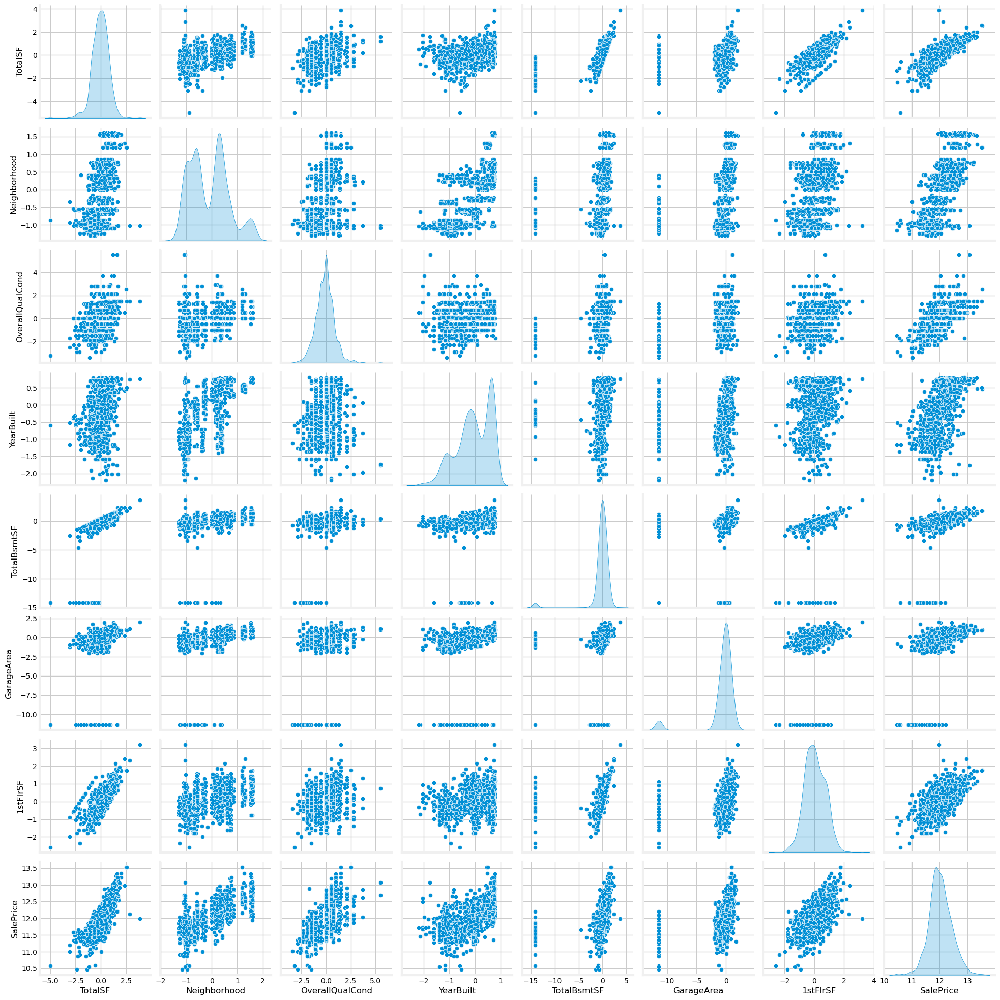

In [45]:
if fs.best_k != 'all':
    
    sel_cont_fts = test_pipe.named_steps['selector'].selected_cont_features_
    sns.pairplot(data=pd.concat([train_slice[sel_cont_fts], y_log], axis=1), diag_kind='kde')

else:
    sel_cont_fts = 0

In [46]:
del train_slice, test_slice, oof_te, ft, sc, fs, test_pipe, sel_cont_fts

#### PCA

We now focus on performing a PCA on the continuous variables, with the hopes of further decorrelating the data features, and makeing analysis easier.

In [47]:
class PCAFeature(TransformerMixin, BaseEstimator):
    """
    A transformer that applies PCA to continuous features, optionally conditioned on boolean indicator variables.

    This transformer:
    - Identifies continuous features (i.e., not integers or known discrete columns),
    - Optionally restricts PCA fitting to rows where all indicator features (e.g., 'Has_X') are 1,
    - Demeans the continuous features before PCA,
    - Projects the data onto principal components,
    - Optionally drops original continuous features from the output.

    Compatible with scikit-learn pipelines.

    Parameters
    ----------
    n_pcs : int or None, default None
        Number of principal components to keep. If None, all components are kept.
    fit_feat_subset : bool, default False
        If True, PCA is fitted only on the subset of rows where all 'Has_X' indicator features are 1.
    keep_original_feats : bool, default True
        If False, original continuous features are dropped from the transformed output.
    random_state : int, default 0
        Random seed used for PCA reproducibility.

    Attributes
    ----------
    feature_names_ : list of str
        All column names in the input DataFrame at fit time.
    discrete_features_ : list of str
        Columns identified as discrete features (including integer-typed and 'bath'-like names).
    continuous_features_ : list of str
        Columns identified as continuous features (i.e., not discrete).
    indicator_features_ : list of str
        Subset of discrete features with names containing 'Has_'.
    continuous_boolean_indicators_ : dict
        Mapping from continuous columns to their corresponding boolean indicator feature (if any).
    continuous_wo_booleans_ : list of str
        Continuous features not associated with any 'Has_X' indicator.
    trained_means_ : pd.Series
        Means of continuous features used for centering prior to PCA.
    demeaned_cols_ : list of str
        Names of columns created by demeaning continuous features.
    pca_ : sklearn.decomposition.PCA
        Fitted PCA object.
    pca_columns_ : list of str
        Names of generated principal component features.
    loadings_ : pd.DataFrame
        PCA loadings (component weights), with original (demeaned) feature names as index.
    """


    def __init__(self, n_pcs=None, fit_feat_subset=False, keep_original_feats=True, random_state=0):
        
        self.n_pcs = n_pcs
        self.fit_feat_subset = fit_feat_subset
        self.keep_original_feats = keep_original_feats
        self.random_state = random_state

    def fit(self, X, y=None):

        X = X.copy() # shallow copy

        #......................................
        # Separating different kinds of columns:

        # First, saving all columns
        self.feature_names_ = X.columns.to_list() # names of all features
        
        # Discrete columns:
        # First, they're integers
        disc_cols = X.select_dtypes(include=int).columns.to_list()
        # Adding "baths" (half-baths are counted as 0.5, and thus are floats, although they should be included in the list of discrete columns)
        disc_cols += [col for col in X.columns if ('ath' in col) and (col not in disc_cols)]
        # Storing them
        self.discrete_features_ = disc_cols

        # Of those, selecting the 'has_X' indicator features:
        has_X_list = [hasx for hasx in self.discrete_features_ if 'Has_' in hasx]
        self.indicator_features_ = has_X_list

        # Continuous columns:
        # = to the remaining columns
        cont_cols = [col for col in X.columns if (col not in disc_cols)]
        # Storing them
        self.continuous_features_ = cont_cols

        # Of those, selecting those columns X that have an indicator feature has_X:
        cont_hasX = {}
        for col in self.continuous_features_:
            
            if not any([hasx.removeprefix('Has_') in col for hasx in has_X_list]):
                continue

            else:
                cont_hasX[col] = [hasx for hasx in has_X_list if hasx.removeprefix('Has_') in col][0]
        
        # Storing them
        self.continuous_boolean_indicators_ = cont_hasX

        # The rest:
        self.continuous_wo_booleans_ = [col for col in self.continuous_features_ if col not in self.continuous_boolean_indicators_.keys()]

        #......................................
        # Creating the de-meaned feature names
        self.demeaned_cols_ = ['demean_'+col for col in self.continuous_features_]

        #......................................
        # Creating the mask of features and the new DataFrame (whose indices and columns are a subset of the original X

        if self.fit_feat_subset:
            # The mask
            mask = (X[self.indicator_features_] == 1).all(axis=1)

            # The new DataFrame
            X_new = pd.DataFrame(index=mask[mask].index, columns=self.demeaned_cols_)

        else:
            # The mask
            mask = slice(None)

            # The new DataFrame
            X_new = pd.DataFrame(index=X.index, columns=self.demeaned_cols_)

        #......................................
        # Finding the means and filling in the values
        self.trained_means_ = X.loc[mask, self.continuous_features_].mean()

        # Filling in the values
        X_new[self.demeaned_cols_] = X.loc[mask, self.continuous_features_] - self.trained_means_

        #......................................
        # Performing PCA on the demeaned features

        # PCA object
        pca = PCA(random_state=self.random_state)

        # Fitting the PCA object
        pca.fit(X_new)

        # Saving PCA object
        self.pca_ = pca

        # Defining PC names
        self.pca_columns_ = ['pca'+str(i) for i in range(pca.n_components_)]

        # Finding and storing the PCA loadings
        loadings = pd.DataFrame(pca.components_.T, columns=self.pca_columns_, index=self.demeaned_cols_)
        self.loadings_ = loadings

        return self

    def transform(self, X):

        X_pca = X.copy() # shallow copy, where we shall store the PCs

        #......................................
        # De-meaning the features
        X_pca[self.demeaned_cols_] = X_pca[self.continuous_features_] - self.trained_means_

        # Performing transformation on the demeaned features
        X_pca[self.pca_columns_] = self.pca_.transform(X_pca[self.demeaned_cols_])

        # Defining outgoing columns
        out_cols = (X.columns.to_list() + self.pca_columns_)

        # Dropping originals if necessary
        if not self.keep_original_feats:
            out_cols = [col for col in out_cols if col not in self.continuous_features_]

        # Dropping last PCs
        if (type(self.n_pcs) == int) and (self.n_pcs < len(self.pca_columns_)):
            out_cols = [col for col in out_cols if col not in self.pca_columns_[self.n_pcs:]]

        # Returning the transformed DataFrame
        return X_pca[out_cols]

Checking that it works. First, with the default arguments for PCA:

In [48]:
# copying training dataframe
train_slice1 = raw_train.copy()
train_slice1 = train_slice1.drop(columns=['SalePrice'])
train_slice2 = train_slice1.copy()

# cleaning + feature engineering + unsupervised encoding + target encoding + function transformer + scaler transformerk + feature selector + PCA

oof_te = OOFTargetEncoderTransformer(cols=columns_encodings['target'],
                                     new_col_suffix="",
                                     n_splits=5,
                                     smoothing=20.0,
                                     random_state=42)

ft = SelectorFunctionTransformer(dex_threshold=2.0,
                                 skew_threshold=1.0,
                                 trans_method='log',
                                 cont_cols=pruned_cont_cols,
                                 verbose_feature_names_out=False)

sc = SelectorScalerTransformer(unique_counts_threshold=10,
                               scaling_method='robust',
                               cont_cols=pruned_cont_cols,
                               encodings=columns_encodings,
                               verbose_feature_names_out=False)

# selector w/ strict thresholds
fs = FeatureSelector(var_thr=0.01,
                     best_k=20,
                     t_thr=0.3,
                     encodings=columns_encodings)

# default PCA
pc1 = PCAFeature(n_pcs=None,
                 fit_feat_subset=False,
                 keep_original_feats=True,
                 random_state=0)

test_pipe1 = Pipeline(steps=[('cleaning', cleaning_pipeline),
                             ('feature_engineer', FeatureEngineer(func=new_features,
                                                                 kwargs={'has_cols':has_cols})),
                             ('encoder', column_encoder(verbose_feature_names_out=False, encodings=columns_encodings)),
                             ('tenc', oof_te),
                             ('transf1', ft),
                             ('transf2', sc),
                             ('selector', fs),
                             ('pca', pc1)])

train_slice1 = test_pipe1.fit_transform(train_slice1, y_log)

print("Train")
display(train_slice1.head())

# now for test dataframe:
test_slice1 = raw_test.copy()

test_slice1 = test_pipe1.transform(test_slice1)

print("Test")
display(test_slice1.head())

print("Loadings")
display(test_pipe1.named_steps['pca'].loadings_)

Train


,TotalSF,OverallQual,Neighborhood,OverallQualCond,GarageCars,YearBuilt,BathsAbvGr,TotalBsmtSF,AllBaths,GarageArea,ExterQual,KitchenQual,BsmtQual,1stFlrSF,Has_Garage,Has_Bsmt,pca0,pca1,pca2,pca3,pca4,pca5,pca6
0,0.085950,7,0.335546,0.0,2,0.652174,2.5,-0.300181,3.5,0.243856,4,4,4,-0.524119,1,1,0.870129,-0.461398,0.137749,-0.249461,-0.795985,0.024555,0.409286
1,0.044827,6,0.203601,1.3,2,0.065217,2.0,0.492878,2.5,-0.078320,3,3,4,0.327547,1,1,1.134896,0.469345,0.840928,0.877492,-0.276706,0.168379,-0.312167
2,0.218326,7,0.335546,0.0,2,0.608696,2.5,-0.152897,3.5,0.435133,4,4,4,-0.365950,1,1,1.133039,-0.410400,0.169768,-0.272747,-0.625976,0.007421,0.394319
3,-0.006038,7,0.409701,0.0,3,-1.260870,1.0,-0.553912,2.0,0.535320,3,4,3,-0.270300,1,1,0.835755,-0.821754,-0.307317,0.558037,0.135526,-1.236521,-0.260228
4,0.745122,8,1.310980,0.5,3,0.586957,2.5,0.294081,3.5,1.021588,4,4,4,0.114059,1,1,2.140444,-0.204076,1.083042,-0.398463,-0.601806,-0.517934,0.130319


Test


,TotalSF,OverallQual,Neighborhood,OverallQualCond,GarageCars,YearBuilt,BathsAbvGr,TotalBsmtSF,AllBaths,GarageArea,ExterQual,KitchenQual,BsmtQual,1stFlrSF,Has_Garage,Has_Bsmt,pca0,pca1,pca2,pca3,pca4,pca5,pca6
0,-0.828127,5,-0.562422,-0.5,1,-0.260870,1.0,-0.239062,1.0,0.771869,3,3,3,-0.423937,1,1,0.955669,-0.822535,-1.259114,0.247212,-0.271740,0.129200,-0.220532
1,0.173728,6,-0.562422,0.1,1,-0.326087,1.5,0.598582,1.5,-0.792372,3,4,3,0.441062,1,1,0.343193,0.872401,-0.122119,0.363420,0.555813,0.199779,-0.076789
2,0.077195,5,0.309486,-1.0,2,0.521739,2.5,-0.135210,2.5,0.007652,3,3,4,-0.346957,1,1,0.628006,-0.244187,-0.428061,-0.986706,-0.436602,-0.134771,0.319034
3,0.050744,6,0.309486,0.1,2,0.543478,2.5,-0.139618,2.5,-0.038744,3,4,3,-0.351690,1,1,0.717571,-0.173905,0.215538,-0.155165,-0.677508,0.045812,0.255172
4,0.080117,8,0.899934,0.5,2,0.413043,2.0,0.521817,2.0,0.097084,4,4,4,0.358625,1,1,1.321884,0.381342,0.778276,-0.159165,-0.518597,-0.132805,-0.407894


Loadings


,pca0,pca1,pca2,pca3,pca4,pca5,pca6
demean_TotalSF,0.160114,0.122942,0.404070,-0.134531,0.437437,-0.255486,0.721979
demean_Neighborhood,0.116269,0.015235,0.455537,-0.378752,-0.410978,-0.604024,-0.318644
demean_OverallQualCond,0.121235,0.049048,0.582496,0.762420,-0.197073,0.145384,-0.048327
demean_YearBuilt,0.094768,-0.001559,0.281495,-0.455574,-0.427626,0.681971,0.237235
demean_TotalBsmtSF,0.466101,0.850129,-0.222264,0.014619,-0.069936,0.019753,-0.071650
demean_GarageArea,0.842383,-0.507743,-0.175715,0.037683,0.011295,-0.011394,-0.005867
demean_1stFlrSF,0.101521,0.041501,0.361103,-0.219048,0.642670,0.288341,-0.559846


In [49]:
# copying training dataframe
train_slice2 = raw_train.copy()
train_slice2 = train_slice2.drop(columns=['SalePrice'])

# cleaning + feature engineering + unsupervised encoding + target encoding + function transformer + scaler transformer + feature selector + PCA

oof_te = OOFTargetEncoderTransformer(cols=columns_encodings['target'],
                                     new_col_suffix="",
                                     n_splits=5,
                                     smoothing=20.0,
                                     random_state=42)

ft = SelectorFunctionTransformer(dex_threshold=2.0,
                                 skew_threshold=1.0,
                                 trans_method='log',
                                 cont_cols=pruned_cont_cols,
                                 verbose_feature_names_out=False)

sc = SelectorScalerTransformer(unique_counts_threshold=10,
                               scaling_method='robust',
                               cont_cols=pruned_cont_cols,
                               encodings=columns_encodings,
                               verbose_feature_names_out=False)

# selector w/ strict thresholds
fs = FeatureSelector(var_thr=0.01,
                     best_k=20,
                     t_thr=0.3,
                     encodings=columns_encodings)

# advanced PCA
pc2 = PCAFeature(n_pcs=None, # selecting all PCs
                 fit_feat_subset=True, # fitting PCA object to subset with has_X = True
                 keep_original_feats=False, # dropping the original features
                 random_state=0)

test_pipe2 = Pipeline(steps=[('cleaning', cleaning_pipeline),
                             ('feature_engineer', FeatureEngineer(func=new_features,
                                                                 kwargs={'has_cols':has_cols})),
                             ('encoder', column_encoder(verbose_feature_names_out=False, encodings=columns_encodings)),
                             ('tenc', oof_te),
                             ('transf1', ft),
                             ('transf2', sc),
                             ('selector', fs),
                             ('pca', pc2)])

train_slice2 = test_pipe2.fit_transform(train_slice2, y_log)

print("Train")
display(train_slice2.head())

# now for test dataframe:
test_slice2 = raw_test.copy()

test_slice2 = test_pipe2.transform(test_slice2)

print("Test")
display(test_slice2.head())

print("Loadings")
display(test_pipe2.named_steps['pca'].loadings_)

Train


,OverallQual,GarageCars,AllBaths,BathsAbvGr,BsmtQual,ExterQual,KitchenQual,Has_Garage,Has_Bsmt,pca0,pca1,pca2,pca3,pca4,pca5,pca6
0,7,2,3.5,2.5,4,4,4,1,1,0.057832,0.173426,0.973890,0.150604,0.033976,0.357826,-0.098799
1,6,2,2.5,2.0,4,3,3,1,1,0.815993,1.053090,-0.229411,-0.268268,0.308171,-0.323522,-0.082260
2,7,2,3.5,2.5,4,4,4,1,1,0.300230,0.076275,0.846212,0.278599,0.004821,0.328749,-0.110420
3,7,3,2.0,1.0,3,3,4,1,1,-0.387486,0.430032,-0.006335,0.736919,-1.239491,-0.473407,-0.176420
4,8,3,3.5,2.5,4,4,4,1,1,1.658119,0.242241,0.974969,0.303460,-0.504559,0.009849,-0.172202


Test


,OverallQual,GarageCars,AllBaths,BathsAbvGr,BsmtQual,ExterQual,KitchenQual,Has_Garage,Has_Bsmt,pca0,pca1,pca2,pca3,pca4,pca5,pca6
0,5,1,1.0,1.0,3,3,3,1,1,-0.845540,-0.211216,0.291427,1.095286,0.247288,-0.444042,-0.184809
1,6,1,1.5,1.5,3,3,4,1,1,-0.089165,-0.016273,-0.977713,-0.587907,0.255859,-0.004286,-0.053408
2,5,2,2.5,2.5,4,3,3,1,1,-0.264199,-0.789908,0.846752,-0.058865,-0.153889,0.299358,-0.057649
3,6,2,2.5,2.5,3,3,4,1,1,0.069928,0.221828,0.720813,-0.125431,0.079244,0.241688,-0.069835
4,8,2,2.0,2.0,4,4,4,1,1,1.019220,0.261974,0.462268,-0.400780,-0.015892,-0.414462,-0.025275


Loadings


,pca0,pca1,pca2,pca3,pca4,pca5,pca6
demean_TotalSF,0.441236,-0.069433,-0.247702,-0.030392,-0.405360,0.752606,-0.086473
demean_Neighborhood,0.379782,0.027675,0.560949,-0.344979,-0.547395,-0.347605,-0.029250
demean_OverallQualCond,0.327666,0.914888,-0.126199,-0.021710,0.190619,-0.049756,-0.020147
demean_YearBuilt,0.277831,-0.130933,0.562269,-0.160956,0.621937,0.362964,0.212284
demean_TotalBsmtSF,0.429296,-0.299168,-0.300204,-0.233353,0.333359,-0.279917,-0.626215
demean_GarageArea,0.364035,-0.087665,0.196796,0.891247,-0.018486,-0.140154,-0.082208
demean_1stFlrSF,0.399631,-0.207515,-0.403802,-0.070086,0.037827,-0.283797,0.739792


Defining a indicator feature, how many of the "Has_X" features is True.

In [50]:
train_slice1['Has_Many'] = sum([train_slice1[col] for col in train_slice1.columns if 'Has_' in col])

train_slice2['Has_Many'] = sum([train_slice2[col] for col in train_slice2.columns if 'Has_' in col])

The pairplot for the default PCA:

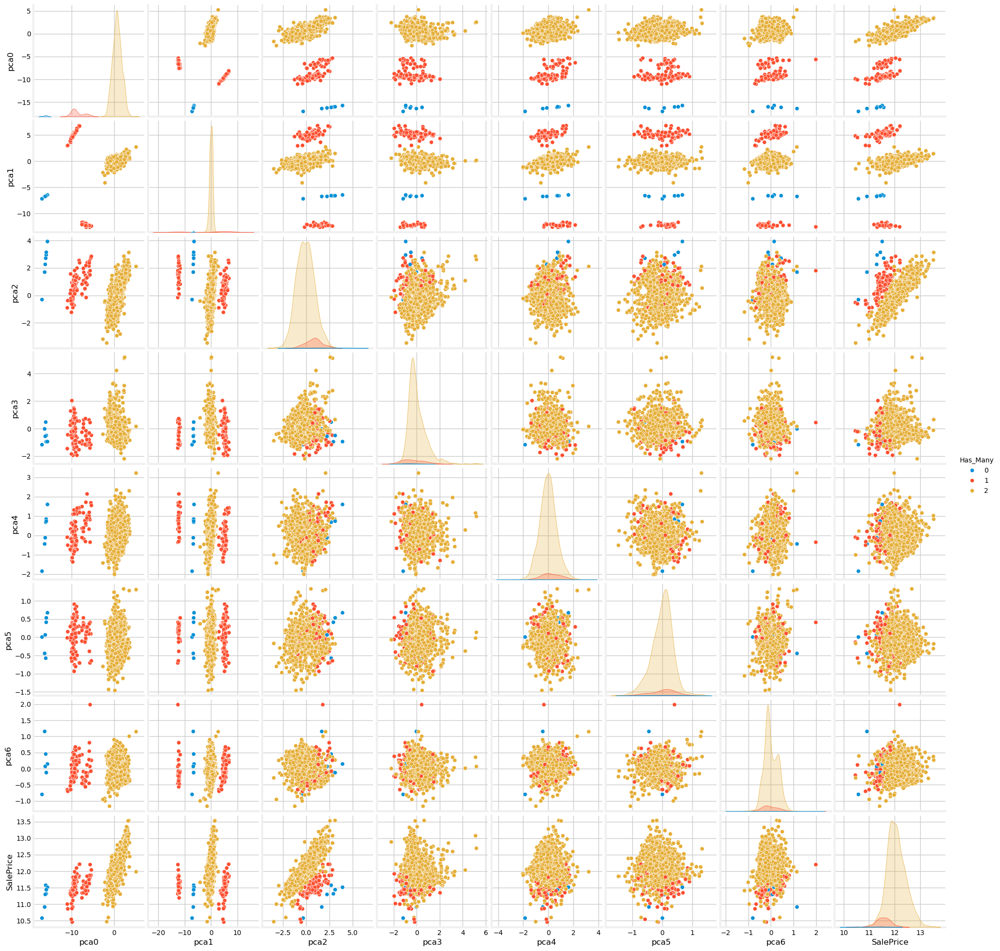

In [51]:
sns.pairplot(data=pd.concat([train_slice1[test_pipe1.named_steps['pca'].pca_columns_+['Has_Many']], y_log], axis=1), diag_kind='kde', hue='Has_Many', palette=palette_538)

The pairplot for the advanced PCA:

In [52]:
train_slice2[train_slice2['Has_Many'] == 0]

,OverallQual,GarageCars,AllBaths,BathsAbvGr,BsmtQual,ExterQual,KitchenQual,Has_Garage,Has_Bsmt,pca0,pca1,pca2,pca3,pca4,pca5,pca6,Has_Many
39,4,0,2.0,2.0,0,3,2,0,0,-11.984984,4.057761,1.958656,-6.345268,-3.767866,4.300734,10.006028,0
520,4,0,2.0,2.0,0,3,3,0,0,-12.438883,5.151906,1.463169,-6.039919,-4.421369,4.421961,8.893820,0
533,1,0,1.0,1.0,0,2,2,0,0,-15.021993,3.306627,3.949939,-6.009899,-3.094159,2.748755,8.255671,0
705,4,0,2.0,2.0,0,2,2,0,0,-13.308461,4.643494,2.504807,-5.968082,-3.967973,4.819385,8.078164,0
1011,5,0,2.0,2.0,0,3,3,0,0,-11.059461,4.253832,1.427556,-6.452461,-3.841563,4.838355,10.561843,0
1179,5,0,1.0,1.0,0,3,3,0,0,-11.915740,4.530601,1.861333,-6.310704,-3.605720,4.273714,9.959773,0
1218,4,0,1.0,1.0,0,3,3,0,0,-12.740494,4.367883,2.514921,-6.236723,-3.716646,4.115149,9.143041,0


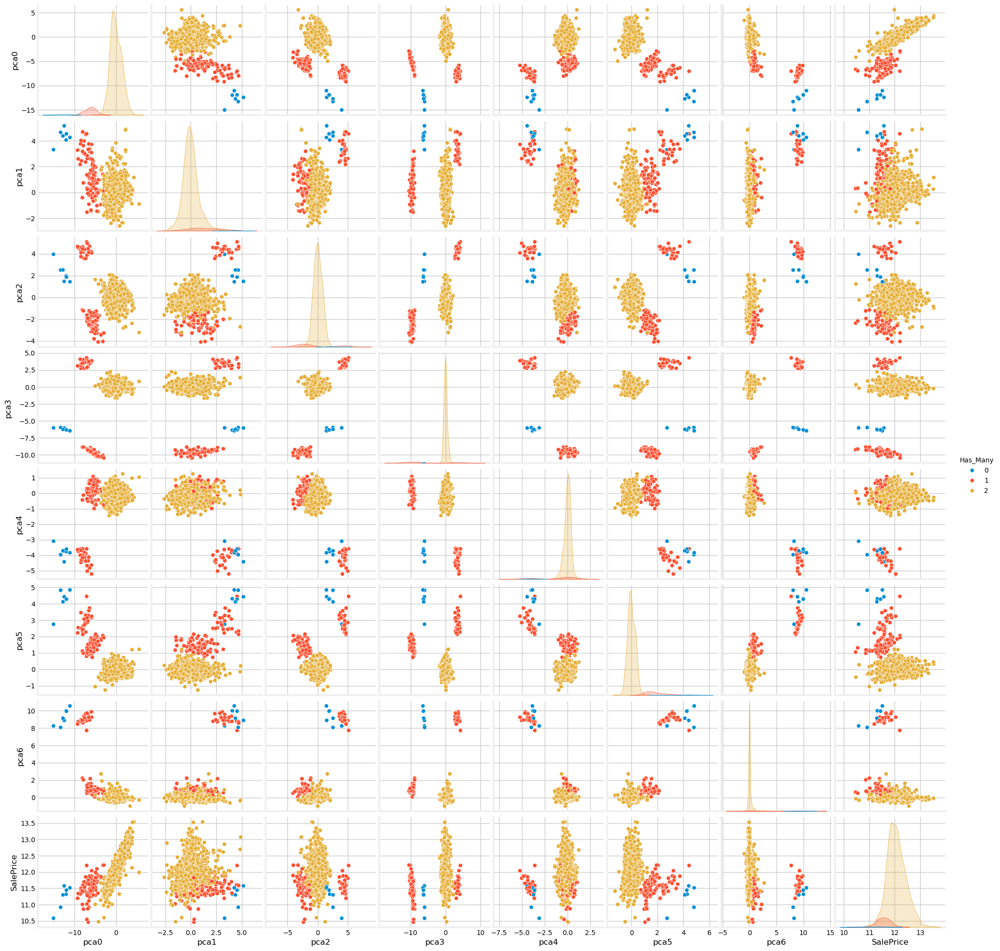

In [53]:
if test_pipe2.named_steps['pca'].n_pcs == None:
    sns.pairplot(data=pd.concat([train_slice2[test_pipe2.named_steps['pca'].pca_columns_ +['Has_Many']], y_log], axis=1), diag_kind='kde', hue='Has_Many', palette=palette_538)

else:
    sns.pairplot(data=pd.concat([train_slice2[test_pipe2.named_steps['pca'].pca_columns_[:test_pipe2.named_steps['pca'].n_pcs]+['Has_Many']], y_log], axis=1), diag_kind='kde', hue='Has_Many', palette=palette_538)

In [54]:
del train_slice1, train_slice2, test_slice1, test_slice2, oof_te, ft, sc, fs, pc1, pc2, test_pipe1, test_pipe2

#### K-means Cluster Feature Creator

First, we create a subclass in charge of creating a `cluster` feature with KMeans. Note that if `n_clusters=0`, then we will not do anything!

In [55]:
class KMeansFeature(TransformerMixin, BaseEstimator):
    """
    Adds a KMeans cluster label as a new feature, with optional scaling of PCA features.

    This transformer fits a KMeans clustering model on the input features and appends a `'cluster'` column to the dataset containing the predicted cluster labels. Optionally, PCA features can be scaled before clustering using a specified method.

    If `n_clusters` is None, the transformer behaves as a passthrough and returns the original DataFrame unchanged.

    Compatible with scikit-learn pipelines.

    Parameters
    ----------
    n_clusters : int or None, default None
        Number of clusters for KMeans. If None, clustering is skipped.
    max_iter : int, default 300
        Maximum number of iterations for a single KMeans run.
    n_init : int, default 10
        Number of times the KMeans algorithm is run with different centroid seeds.
    scaling_method : {'standard', 'robust', 'minmax'} or None, default None
        Optional method for scaling PCA features prior to clustering. If None, no scaling is applied.
    verbose_feature_names_out : bool, default False
        If True, output feature names from transformers include the step name as a prefix.
    random_state : int, default 0
        Seed for reproducibility.

    Attributes
    ----------
    cluster_pipe_ : sklearn.pipeline.Pipeline
        Pipeline combining optional scaling and the fitted KMeans model.
    pca_columns_ : list of str
        List of PCA column names used for scaling (only set if `scaling_method` is used).
    distances_ : np.ndarray
        Distances from each sample to each cluster center (available after `transform`).
    """
    
    def __init__(self, n_clusters=None, max_iter=300, n_init=10, scaling_method=None, verbose_feature_names_out=False, random_state=0):
        
        self.n_clusters   = n_clusters
        self.max_iter     = max_iter
        self.n_init       = n_init
        self.verbose_feature_names_out = verbose_feature_names_out
        self.random_state = random_state

        # the scaler to use:
        self.scaling_method = scaling_method

        if scaling_method == None:
            self.scaler = None
        elif scaling_method == 'standard':
            self.scaler = StandardScaler()
        elif scaling_method == 'robust':
            self.scaler = RobustScaler()
        elif scaling_method == 'minmax':
            self.scaler = MinMaxScaler()
        else:
            raise ValueError(f"{scaler} must be either 'standard', 'robust', or 'minmax'.")

    def fit(self, X, y=None):

        if self.n_clusters == None:
            pass # override: no need to fit KMeans!
        
        else: # will cluster, but first decide whether PCs need to be scaled
            
            if self.scaling_method == None: # no scaling of PCs, apply KMeans directly

                # defining the clustering pipeline
                self.cluster_pipe_ = Pipeline(steps=[("kmeans", KMeans(n_clusters=self.n_clusters,
                                                                       random_state=self.random_state))])
            else: # scaling of PCs needed

                # finding the PCA columns
                self.pca_columns_ = [col for col in X.columns if 'pca' in col]

                # defining the scaler
                pca_scaler = ColumnTransformer(transformers=[('scaler',
                                                              self.scaler,
                                                              self.pca_columns_)],
                                               remainder='passthrough',
                                               verbose_feature_names_out=self.verbose_feature_names_out)

                # defining the KMeans object
                kmeans = KMeans(n_clusters=self.n_clusters,
                                max_iter=self.max_iter,
                                n_init=self.n_init,
                                random_state=self.random_state)

                # defining the clustering pipeline
                self.cluster_pipe_ = Pipeline(steps=[('pca_scaler', pca_scaler),
                                                     ("kmeans", kmeans)])
            
            # fitting the clustering pipeline
            self.cluster_pipe_.fit(X)
            
        return self

    def transform(self, X):

        # Check we got a DataFrame
        if not isinstance(X, pd.DataFrame):
            raise ValueError("FeatureAdder.transform input must be a pandas DataFrame")

        X_out = X.copy() # shallow copy

        if self.n_clusters == None:
            pass

        else:
            
            # distances to centroids
            self.distances_ = self.cluster_pipe_.transform(X_out)

            # column of cluster‐labels (as integers)
            X_clusters = self.cluster_pipe_.predict(X_out)
            
            X_out['cluster'] = X_clusters # adding clusters column!
        
        return X_out

Putting this into pipelines and checking that it all works:

In [56]:
# copying training dataframe
train_slice = raw_train.copy()
train_slice = train_slice.drop(columns=['SalePrice'])

# cleaning + feature engineering + unsupervised encoding + target encoding + function transformer + scaler transformer + feature selector + PCA + clustering

oof_te = OOFTargetEncoderTransformer(cols=columns_encodings['target'],
                                     new_col_suffix="",
                                     n_splits=5,
                                     smoothing=20.0,
                                     random_state=42)

ft = SelectorFunctionTransformer(dex_threshold=2.0,
                                 skew_threshold=1.0,
                                 trans_method='log',
                                 cont_cols=pruned_cont_cols,
                                 verbose_feature_names_out=False)

sc = SelectorScalerTransformer(unique_counts_threshold=10,
                               scaling_method='robust',
                               cont_cols=pruned_cont_cols,
                               encodings=columns_encodings,
                               verbose_feature_names_out=False)

# selector w/ strict thresholds
fs = FeatureSelector(var_thr=0.01,
                     best_k=20,
                     t_thr=0.3,
                     encodings=columns_encodings)

# advanced PCA
pc = PCAFeature(n_pcs=None, # selecting all PCs
                fit_feat_subset=True, # fitting PCA object to subset with has_X = True
                keep_original_feats=False, # dropping the original features
                random_state=0)

km = KMeansFeature(n_clusters=4,
                   max_iter=300,
                   n_init=10,
                   scaling_method='robust',
                   verbose_feature_names_out=False,
                   random_state=0)

test_pipe = Pipeline(steps=[('cleaning', cleaning_pipeline),
                            ('feature_engineer', FeatureEngineer(func=new_features,
                                                                 kwargs={'has_cols':has_cols})),
                            ('encoder', column_encoder(verbose_feature_names_out=False, encodings=columns_encodings)),
                            ('tenc', oof_te),
                            ('transf1', ft),
                            ('transf2', sc),
                            ('selector', fs),
                            ('pca', pc),
                            ('km', km)])

train_slice = test_pipe.fit_transform(train_slice, y_log)

print("Train")
display(train_slice.head())

# now for test dataframe:
test_slice = raw_test.copy()

test_slice = test_pipe.transform(test_slice)

print("Test")
display(test_slice.head())

print("Training distances")
display(test_pipe.named_steps["km"].distances_)

Train


,OverallQual,GarageCars,AllBaths,ExterQual,BathsAbvGr,BsmtQual,KitchenQual,Has_Garage,Has_Bsmt,pca0,pca1,pca2,pca3,pca4,pca5,pca6,cluster
0,7,2,3.5,4,2.5,4,4,1,1,0.057832,0.173426,0.973890,0.150604,0.033976,0.357826,-0.098799,3
1,6,2,2.5,3,2.0,4,3,1,1,0.815993,1.053090,-0.229411,-0.268268,0.308171,-0.323522,-0.082260,0
2,7,2,3.5,4,2.5,4,4,1,1,0.300230,0.076275,0.846212,0.278599,0.004821,0.328749,-0.110420,3
3,7,3,2.0,3,1.0,3,4,1,1,-0.387486,0.430032,-0.006335,0.736919,-1.239491,-0.473407,-0.176420,3
4,8,3,3.5,4,2.5,4,4,1,1,1.658119,0.242241,0.974969,0.303460,-0.504559,0.009849,-0.172202,3


Test


,OverallQual,GarageCars,AllBaths,ExterQual,BathsAbvGr,BsmtQual,KitchenQual,Has_Garage,Has_Bsmt,pca0,pca1,pca2,pca3,pca4,pca5,pca6,cluster
0,5,1,1.0,3,1.0,3,3,1,1,-0.845540,-0.211216,0.291427,1.095286,0.247288,-0.444042,-0.184809,0
1,6,1,1.5,3,1.5,3,4,1,1,-0.089165,-0.016273,-0.977713,-0.587907,0.255859,-0.004286,-0.053408,0
2,5,2,2.5,3,2.5,4,3,1,1,-0.264199,-0.789908,0.846752,-0.058865,-0.153889,0.299358,-0.057649,0
3,6,2,2.5,3,2.5,3,4,1,1,0.069928,0.221828,0.720813,-0.125431,0.079244,0.241688,-0.069835,3
4,8,2,2.0,4,2.0,4,4,1,1,1.019220,0.261974,0.462268,-0.400780,-0.015892,-0.414462,-0.025275,3


Training distances


,kmeans0,kmeans1,kmeans2,kmeans3
0,2.316073,48.222461,16.867464,4.529324
1,1.812416,47.694221,14.315226,3.187227
2,2.294255,47.432381,15.250277,3.049514
3,2.229560,47.485283,15.192030,2.130798
4,3.558324,47.681949,15.430575,1.634762
...,...,...,...,...
1454,14.875150,46.170605,1.969617,15.475493
1455,2.380884,47.697852,15.001259,4.779646
1456,1.348671,48.071813,15.905850,3.582682
1457,15.798886,45.303489,2.002411,16.204360


The pairplot:

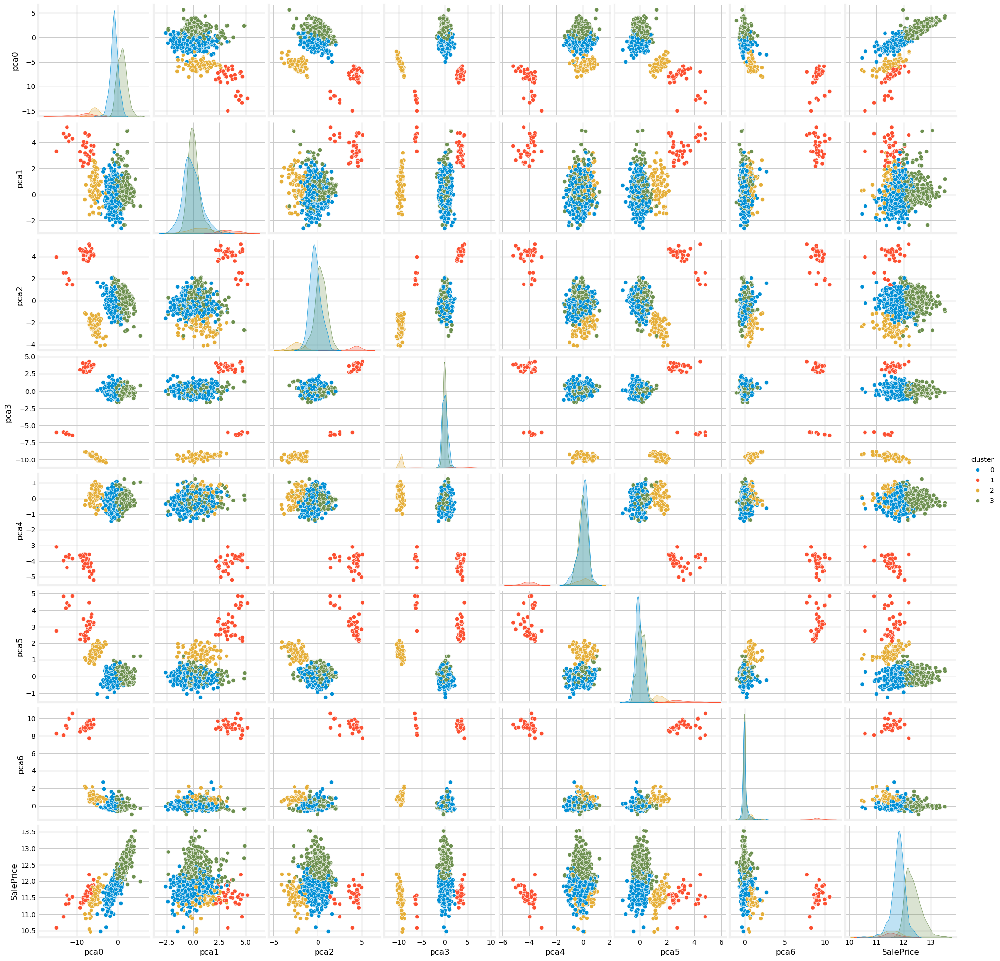

In [57]:
sns.pairplot(data=pd.concat([train_slice[test_pipe.named_steps['pca'].pca_columns_+['cluster']], y_log], axis=1), diag_kind='kde', hue='cluster', palette=palette_538)

In [58]:
del train_slice, test_slice, oof_te, ft, sc, fs, pc, km, test_pipe

#### One-Hot Encoding

Finally, we go over all OHE features, and perform OHE.

In [59]:
def ohe_from_subset(subset=(columns_encodings['ohe']+['cluster']), except_list=[]):
    """
    Creates a selector function that filters object-dtype columns from a given subset.

    This function returns another function that, when called with a DataFrame `X`, returns the list of column names from the provided `subset` that exist in `X` and have an object dtype.

    Parameters
    ----------
    subset : list of str
        A list of column names to consider for object-dtype filtering.

    Returns
    -------
    function
        A selector function that takes a DataFrame and returns a list of object-dtype column names from the subset.
    """
    
    def selector(X):
        
        cols_list = []

        for col in subset:
            if col not in X.columns:
                continue
            if col in except_list:
                continue
            # if pd.api.types.is_integer_dtype(X[col]):
            #     cols_list.append(col)
            else:
                cols_list.append(col)
        
        return cols_list
    
    return selector

Having created that, we define the OHE preprocessor:

In [60]:
def ohe_preprocessor(verbose_feature_names_out=False, subset=(columns_encodings['ohe']+['cluster'])):

    # defining the column selector
    selector = ohe_from_subset(subset=subset, except_list=[])

    # OHE transformer
    ohe_ct = ColumnTransformer(transformers=[('ohe',
                                              OneHotEncoder(handle_unknown='ignore', drop='first', sparse_output=False, dtype=int),
                                              selector)],
                               remainder='passthrough',
                               verbose_feature_names_out=verbose_feature_names_out)

    # Pipeline
    post_pipe = Pipeline([('ohe', ohe_ct)])

    return post_pipe

Checking it all works:

In [61]:
# copying training dataframe
train_slice = raw_train.copy()
train_slice = train_slice.drop(columns=['SalePrice'])

# cleaning + feature engineering + unsupervised encoding + target encoding + function transformer + scaler transformer + feature selector + PCA + clustering + OHE

oof_te = OOFTargetEncoderTransformer(cols=columns_encodings['target'],
                                     new_col_suffix="",
                                     n_splits=5,
                                     smoothing=20.0,
                                     random_state=42)

ft = SelectorFunctionTransformer(dex_threshold=2.0,
                                 skew_threshold=1.0,
                                 trans_method='log',
                                 cont_cols=pruned_cont_cols,
                                 verbose_feature_names_out=False)

sc = SelectorScalerTransformer(unique_counts_threshold=10,
                               scaling_method='robust',
                               cont_cols=pruned_cont_cols,
                               encodings=columns_encodings,
                               verbose_feature_names_out=False)

# selector w/ strict thresholds
fs = FeatureSelector(var_thr=0.01,
                     best_k=20,
                     t_thr=0.3,
                     encodings=columns_encodings)

# advanced PCA
pc = PCAFeature(n_pcs=None, # selecting all PCs
                fit_feat_subset=True, # fitting PCA object to subset with has_X = True
                keep_original_feats=False, # dropping the original features
                random_state=0)

km = KMeansFeature(n_clusters=4,
                   max_iter=300,
                   n_init=10,
                   scaling_method='robust',
                   verbose_feature_names_out=False,
                   random_state=0)

test_pipe = Pipeline(steps=[('cleaning', cleaning_pipeline),
                            ('feature_engineer', FeatureEngineer(func=new_features,
                                                                 kwargs={'has_cols':has_cols})),
                            ('encoder', column_encoder(verbose_feature_names_out=False, encodings=columns_encodings)),
                            ('tenc', oof_te),
                            ('transf1', ft),
                            ('transf2', sc),
                            ('selector', fs),
                            ('pca', pc),
                            ('km', km),
                            ('ohe', ohe_preprocessor(verbose_feature_names_out=False))])

train_slice = test_pipe.fit_transform(train_slice, y_log)

print("Train")
display(train_slice.head())

# now for test dataframe:
test_slice = raw_test.copy()

test_slice = test_pipe.transform(test_slice)

print("Test")
display(test_slice.head())

Train


,cluster_1,cluster_2,cluster_3,OverallQual,GarageCars,AllBaths,BathsAbvGr,BsmtQual,ExterQual,KitchenQual,Has_Garage,Has_Bsmt,pca0,pca1,pca2,pca3,pca4,pca5,pca6
0,0,0,1,7,2,3.5,2.5,4,4,4,1,1,0.057832,0.173426,0.973890,0.150604,0.033976,0.357826,-0.098799
1,0,0,0,6,2,2.5,2.0,4,3,3,1,1,0.815993,1.053090,-0.229411,-0.268268,0.308171,-0.323522,-0.082260
2,0,0,1,7,2,3.5,2.5,4,4,4,1,1,0.300230,0.076275,0.846212,0.278599,0.004821,0.328749,-0.110420
3,0,0,1,7,3,2.0,1.0,3,3,4,1,1,-0.387486,0.430032,-0.006335,0.736919,-1.239491,-0.473407,-0.176420
4,0,0,1,8,3,3.5,2.5,4,4,4,1,1,1.658119,0.242241,0.974969,0.303460,-0.504559,0.009849,-0.172202


Test


,cluster_1,cluster_2,cluster_3,OverallQual,GarageCars,AllBaths,BathsAbvGr,BsmtQual,ExterQual,KitchenQual,Has_Garage,Has_Bsmt,pca0,pca1,pca2,pca3,pca4,pca5,pca6
0,0,0,0,5,1,1.0,1.0,3,3,3,1,1,-0.845540,-0.211216,0.291427,1.095286,0.247288,-0.444042,-0.184809
1,0,0,0,6,1,1.5,1.5,3,3,4,1,1,-0.089165,-0.016273,-0.977713,-0.587907,0.255859,-0.004286,-0.053408
2,0,0,0,5,2,2.5,2.5,4,3,3,1,1,-0.264199,-0.789908,0.846752,-0.058865,-0.153889,0.299358,-0.057649
3,0,0,1,6,2,2.5,2.5,3,3,4,1,1,0.069928,0.221828,0.720813,-0.125431,0.079244,0.241688,-0.069835
4,0,0,1,8,2,2.0,2.0,4,4,4,1,1,1.019220,0.261974,0.462268,-0.400780,-0.015892,-0.414462,-0.025275


In [62]:
del train_slice, test_slice, oof_te, ft, sc, fs, pc, km, test_pipe

#### Final Preprocessing Pipelines

In [63]:
from sklearn.base import clone

First, we define the steps:

In [64]:
# cleaning
cln = cleaning_pipeline

# feature engineering
fe = FeatureEngineer(func=new_features,
                     kwargs={'has_cols':has_cols})

# unsupervised encoding
uenc = column_encoder(verbose_feature_names_out=False,
                      encodings=columns_encodings)

# supervised (target) encoding
senc = OOFTargetEncoderTransformer(cols=columns_encodings['target'],
                                   new_col_suffix="",
                                   n_splits=5, # ???
                                   smoothing=20.0, # hyperparam
                                   random_state=42)

# function transformer (log/yeo-johnson)
ft = SelectorFunctionTransformer(dex_threshold=2.0, # ???
                                 skew_threshold=1.0, # ???
                                 trans_method='log', # ???
                                 cont_cols=pruned_cont_cols,
                                 verbose_feature_names_out=False)

# scaler transformer
sc = SelectorScalerTransformer(unique_counts_threshold=2, # ???
                               scaling_method='robust', # ???
                               cont_cols=pruned_cont_cols,
                               encodings=columns_encodings,
                               verbose_feature_names_out=False)

# feature selector (w/ strict thresholds)
fs = FeatureSelector(var_thr=0.01,# ???
                     best_k=20, # hyperparam
                     t_thr=0.3, # hyperparam
                     encodings=columns_encodings)

fs0 = FeatureSelector(var_thr=0.,
                      best_k='all',
                      t_thr=None,
                      encodings=columns_encodings)

# advanced PCA
pc = PCAFeature(n_pcs=None, # ???
                fit_feat_subset=True, # hyperparam
                keep_original_feats=False, # ???
                random_state=0)

# K-Means clustering
km = KMeansFeature(n_clusters=4, # hyperparam
                   max_iter=300, # ???
                   n_init=10, # ???
                   scaling_method='robust', # ???
                   verbose_feature_names_out=False,
                   random_state=0)

# ohe
ohe = ohe_preprocessor(verbose_feature_names_out=False,
                       subset=(columns_encodings['ohe']+['cluster']))

pipeline_hyperparameter_names = ['target_encoder__smoothing', 'selector__best_k', 'selector__t_thr', 'pca__fit_feat_subset', 'pca__keep_original_feats', 'cluster__n_clusters']

Putting together the preprocessing steps into a single pipeline:

In [65]:
raw_pipe = Pipeline(steps=[('cleaning', cln),
                           ('encoder', uenc),
                           ('target_encoder', senc),
                           ('selector', fs0)])

eng_pipe = Pipeline(steps=[('cleaning', cln),
                           ('feature_engineer', fe),
                           ('encoder', uenc),
                           ('target_encoder', senc),
                           ('transformer', ft),
                           ('scaler', sc),
                           ('selector', fs),
                           ('ohe', ohe)])

clus_pipe = Pipeline(steps=(eng_pipe.steps[:-1] + 
                            [('pca', pc),
                             ('cluster', km),
                             ('ohe', ohe)]))

final_preproc = {'raw':raw_pipe, 'eng':eng_pipe, 'clus':clus_pipe}

In [66]:
preproc = clone(final_preproc['raw'])

proc_data = preproc.fit_transform(X_train, y_train)

display(proc_data.head())

display(preproc.transform(X_val).head())

del preproc, proc_data

,MSSubClass,LotFrontage,LotArea,Neighborhood,Exterior1st,Exterior2nd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,BsmtFinType1,BsmtFinType2,Functional,BsmtExposure,GarageFinish,GarageCond,FireplaceQu,GarageQual,ExterCond,BsmtQual,HeatingQC,BsmtCond,ExterQual,KitchenQual,PoolQC,Condition1,SaleType,HouseStyle,RoofMatl,Condition2,GarageType,Heating,SaleCondition,RoofStyle,Foundation,MiscFeature,Fence,BldgType,LotConfig,MSZoning,Electrical,LandContour,LotShape,MasVnrType,Alley,LandSlope,PavedDrive,Street,Utilities,CentralAir,Id,OverallQual,OverallCond,YearBuilt,YearRemodAdd,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,MoSold,YrSold
921,11.865000,67.0,8777.0,11.770751,11.835184,11.836519,0.0,1084.0,0.0,188.0,1272.0,1272.0,928.0,0.0,2200.0,0.0,0.0,70.0,0.0,0.0,0.0,0.0,0.0,5,1,7,1,0,0,0,0,3,3,4,3,3,3,0,1,8,0,1,2,6,1,4,1,1,1,0,2,4,3,4,3,3,2,1,0,0,1,0,1,922,5,7,1900,2003,2,0,2,2,4,2,9,0,0,0,9,2008
520,11.912765,60.0,10800.0,11.735730,11.871881,11.878341,0.0,0.0,0.0,0.0,0.0,694.0,600.0,0.0,1294.0,0.0,220.0,114.0,210.0,0.0,0.0,0.0,0.0,0,0,7,0,0,0,0,0,3,0,3,0,3,3,0,2,8,5,1,2,6,1,4,1,0,1,4,1,4,3,0,3,3,2,0,0,0,1,0,0,521,4,7,1900,2000,0,0,2,0,3,2,7,0,0,0,8,2008
401,12.065227,65.0,8767.0,12.157636,12.199254,12.206093,0.0,24.0,0.0,1286.0,1310.0,1310.0,0.0,0.0,1310.0,400.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6,1,7,3,3,3,4,3,3,4,5,3,4,4,0,2,6,2,1,2,1,1,5,1,2,1,4,0,4,3,4,3,0,2,1,0,2,1,0,1,402,7,5,2005,2005,0,0,2,0,3,1,6,1,2005,2,7,2006
280,12.336436,82.0,11287.0,12.120374,12.034378,11.988768,340.0,421.0,0.0,386.0,807.0,1175.0,807.0,0.0,1982.0,575.0,0.0,84.0,0.0,196.0,0.0,0.0,0.0,6,1,7,3,3,3,3,3,3,4,4,3,4,4,0,2,8,5,1,2,1,1,4,1,1,1,4,0,4,3,4,3,3,1,1,0,2,1,0,1,281,7,6,1989,1989,0,0,2,1,3,1,7,1,1989,2,1,2007
1401,12.327892,62.0,7415.0,12.131369,12.200054,12.203975,0.0,759.0,0.0,80.0,839.0,864.0,729.0,0.0,1593.0,398.0,100.0,75.0,0.0,0.0,0.0,0.0,0.0,6,1,7,1,3,3,3,3,3,3,5,3,3,3,0,2,8,5,1,2,1,1,4,1,2,1,4,0,4,3,4,3,0,2,1,0,2,1,0,1,1402,6,5,2004,2004,1,0,2,1,3,1,8,1,2004,2,4,2008


,MSSubClass,LotFrontage,LotArea,Neighborhood,Exterior1st,Exterior2nd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,BsmtFinType1,BsmtFinType2,Functional,BsmtExposure,GarageFinish,GarageCond,FireplaceQu,GarageQual,ExterCond,BsmtQual,HeatingQC,BsmtCond,ExterQual,KitchenQual,PoolQC,Condition1,SaleType,HouseStyle,RoofMatl,Condition2,GarageType,Heating,SaleCondition,RoofStyle,Foundation,MiscFeature,Fence,BldgType,LotConfig,MSZoning,Electrical,LandContour,LotShape,MasVnrType,Alley,LandSlope,PavedDrive,Street,Utilities,CentralAir,Id,OverallQual,OverallCond,YearBuilt,YearRemodAdd,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,MoSold,YrSold
258,12.327022,80.0,12435.0,12.159839,12.196821,12.201456,172.0,361.0,0.0,602.0,963.0,963.0,829.0,0.0,1792.0,564.0,0.0,96.0,0.0,245.0,0.0,0.0,0.0,6,1,7,1,2,3,3,3,3,4,5,3,4,4,0,2,8,5,1,2,1,1,4,1,2,1,4,0,4,3,4,3,3,1,1,0,2,1,0,1,259,7,5,2001,2001,0,0,2,1,3,1,7,1,2001,2,5,2008
267,12.066682,60.0,8400.0,11.922418,11.864888,11.866934,0.0,378.0,0.0,342.0,720.0,1052.0,720.0,420.0,2192.0,240.0,262.0,24.0,0.0,0.0,0.0,0.0,0.0,2,1,7,1,1,3,4,3,3,3,5,3,3,4,0,2,8,3,1,2,5,1,4,1,2,1,4,0,4,3,4,0,3,2,1,1,2,1,0,1,268,5,8,1939,1997,0,0,2,1,4,1,8,1,1939,1,7,2008
288,12.071925,71.5,9819.0,11.848849,11.850601,11.854884,31.0,450.0,0.0,432.0,882.0,900.0,0.0,0.0,900.0,280.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4,1,7,1,1,3,0,3,4,3,3,3,3,3,0,2,8,2,1,2,5,1,4,1,1,1,2,0,4,3,4,3,0,1,1,0,2,1,0,1,289,5,5,1967,1967,0,0,1,0,3,1,5,0,1970,1,2,2010
649,11.855824,21.0,1936.0,11.785094,12.189706,12.185517,0.0,131.0,499.0,0.0,630.0,630.0,0.0,0.0,630.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4,6,7,3,0,0,0,0,3,4,4,3,3,3,0,2,8,6,1,2,6,1,4,1,1,1,2,3,4,4,4,3,3,2,1,0,2,1,0,1,650,4,6,1970,1970,1,0,1,0,1,1,3,0,0,0,12,2007
1233,12.071925,74.5,12160.0,11.882797,12.061740,12.006492,180.0,1000.0,0.0,188.0,1188.0,1188.0,0.0,0.0,1188.0,531.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3,1,7,1,2,3,0,3,3,3,2,3,3,3,0,2,0,2,1,2,1,1,0,3,1,1,2,0,4,3,4,3,0,1,1,0,2,1,0,1,1234,5,5,1959,1959,1,0,1,0,3,1,6,0,1959,2,5,2010


In [67]:
preproc = clone(final_preproc['clus'])
preproc.set_params(selector__best_k = 15)
preproc.set_params(cluster__n_clusters = 4)

proc_data = preproc.fit_transform(X_train, y_train)

display(proc_data.head())

del preproc, proc_data

,cluster_1,cluster_2,cluster_3,BathsAbvGr,AllBaths,Has_Garage,Has_Bsmt,pca0,pca1,pca2,pca3,pca4,pca5
921,0,0,1,1.0,3.0,0,1,-0.556317,-1.754220,-0.917197,0.905725,0.531165,-0.503270
520,1,0,0,0.0,0.0,0,0,-9.151088,5.161772,2.696211,3.308825,7.404882,5.160682
401,0,0,0,0.0,0.0,1,1,0.705769,0.067662,-0.224071,-0.023482,-0.248774,0.106444
280,0,0,1,0.5,0.5,1,1,0.184104,0.477161,0.154193,0.305318,0.350727,0.226572
1401,0,0,1,0.5,1.5,1,1,-0.386793,0.636615,0.030218,-0.142182,0.184570,-0.227184


In [68]:
del cln, fe, uenc, senc, ft, sc, fs, fs0, pc, km, ohe

### Cleanup

In [69]:
Out.clear()

for name in dir():
    if name.startswith('_') and name[1:].isdigit():
        del globals()[name]

## 6. Pipelines

### Importing Modules

In [70]:
# cross-validation
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV, RepeatedKFold

# scoring and evaluation
from sklearn.metrics import root_mean_squared_error as RMSE

from sklearn.metrics import (explained_variance_score,
                             r2_score,
                             mean_absolute_error,
                             mean_squared_error,
                             median_absolute_error,
                             mean_absolute_percentage_error)
# confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, classification_report

# checking if model is fitted
from sklearn.utils.validation import check_is_fitted
from sklearn.exceptions import NotFittedError

# ML explainability
import shap
from sklearn.inspection import permutation_importance, partial_dependence
from scipy.stats import gaussian_kde
from sklearn.tree import plot_tree
from xgboost import plot_tree as xgb_plot_tree

# MODELS
# tree-based
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from catboost import CatBoostRegressor, Pool
# need scaling, or at least it doesn't hurt
from sklearn.linear_model import LinearRegression, Lasso, Ridge
from sklearn.neighbors import KNeighborsRegressor, NearestNeighbors
from sklearn.svm import SVR, LinearSVR
from sklearn.neural_network import MLPRegressor

# For Hybrid Models
from sklearn.ensemble import StackingRegressor

# quieting SHAP
import io
import contextlib
import logging

Shut off SHAP!

In [71]:
logging.getLogger('shap').setLevel(logging.ERROR)

### Useful Definitions

We begin by defining a verbosity function:

In [72]:
# verbosity function
def verbosity(verbose, message):
    """
    A function that helps us print a message only when asked.
    """
    if verbose:
        print(message)
    else:
        pass

Now, some important dictionaries that we will fill during model evaluation:

In [73]:
# defining some important dictionaries, whose keys are the models we will study

pipe = {} # dictionary of model pipelines

# for cross-validation (CV):
param_grid = {} # dictionary of model hyperparameter grids

vol_grid = {} # volume of the CV grid

search = {} # dictionary of model CV searches

best_cv = {} # dictionary of model with best CV performance

Next, creating my own "Regression Report" function:

In [74]:
def regression_report(y_true, y_pred):
    """
    Compute a suite of common regression metrics and return them in a summary DataFrame.

    This function calculates several standard regression evaluation metrics including explained variance, R², MAE, MSE, RMSE, MedAE, and MAPE, and returns them as a pandas DataFrame for easy inspection.

    Parameters
    ----------
    y_true : array-like of shape (n_samples,)
        Ground truth (actual) target values.
    y_pred : array-like of shape (n_samples,)
        Estimated target values predicted by a regression model.

    Returns
    -------
    pd.DataFrame
        A DataFrame with metric names as the index and their corresponding values in a "Value" column.
    """

    metrics = {
        "Explained Variance": explained_variance_score,
        "R2": r2_score,
        "MAE": mean_absolute_error,
        "MSE": mean_squared_error,
        "RMSE": RMSE, # lambda a, b: np.sqrt(mean_squared_error(a, b)),
        "MedAE": median_absolute_error,
        "MAPE": mean_absolute_percentage_error,
    }
    
    results = {name: fn(y_true, y_pred) for name, fn in metrics.items()}
    
    df = pd.DataFrame.from_dict(results, orient="index", columns=["Value"])
    
    return df

Finally, the score dataframe which we will fill up:

In [75]:
# Create a score dataframe
scorecard = pd.DataFrame(index = ['R2 Score Train', 'R2 Score Validation',
                                  'RMSE Train', 'RMSE Validation'])

### Evaluation

We will do cross-validation, and also perform some basic hyperparameter optimization. For that, we need to define a function that defines the pipeline, evaluates the model with cross-validation, computes the metrics, spits out some plots (_e.g._, the confussion matrix), and allocates results to a dictionary. Must take a model/pipeline for argument, the hyperparameter grid, and the CV arguments and such. Also flags for if we want plots, SHAP, permutation importance, etc.

In [76]:
def model_evaluation(model_name, Xytv, perform_cv_randomized=(False,False), scoring='neg_root_mean_squared_error', verbose=False, plots=False, random_state=0, n_jobs=safe_cpus, scorecard=scorecard, **kwargs):
    """
Evaluate a regression model using standard validation or cross-validation.

This function evaluates a model specified by name using a predefined pipeline,
optionally with hyperparameter tuning via grid or randomized search. It computes regression metrics (R², RMSE, etc.), optionally generates plots, and updates a global scorecard.

    Parameters
    ----------
    model_name : str
        Key identifying the model pipeline in the global `pipe` dictionary.
    Xytv : tuple
        Tuple of training and validation data in the form (X_train, X_val, y_train, y_val).
    perform_cv_randomized : tuple of bool, default (False, False)
        Tuple indicating whether to perform cross-validation and whether to use randomized search (instead of grid search).
    scoring : str, default 'neg_root_mean_squared_error'
        Scoring metric to use during cross-validation search.
    verbose : bool, default False
        If True, prints detailed progress updates.
    plots : bool, default False
        If True, shows diagnostic plots (Prediction vs. Target, Residuals).
    random_state : int, default 0
        Random seed for reproducibility in search and cross-validation.
    n_jobs : int, default safe_cpus
        Number of parallel jobs to run during search.
    scorecard : dict
        Dictionary to update with evaluation scores for the model.
    **kwargs : dict
        Additional keyword arguments to pass to `RepeatedKFold`, `GridSearchCV`, or `RandomizedSearchCV`.

    Returns
    -------
    list of float
        List containing:
            [R² on train, R² on validation, RMSE on train, RMSE on validation]

    Side Effects
    ------------
    - Fits and evaluates the model pipeline from `pipe`.
    - Updates the global `scorecard` with the model’s scores.
    - Optionally updates the global `search` and `best_cv` dictionaries.
    - Displays metrics and plots if `verbose` or `plots` is True.
    """

    # splitting the datasets
    Xt, Xv, yt, yv = Xytv

    # splitting the CV and randomized flags
    perform_cv, randomized = perform_cv_randomized

    # the validation key
    val_key = '_cv' if perform_cv else '_no_cv'

    #-------------------------------------------
    # no cross-validation
    if not perform_cv:
        verbosity(verbose, (":"*70) + f"\nWe will evaluate model={model_name} with standard validation.\n" + ":"*70)

        # checking if model is fitted:
        try:
            check_is_fitted(pipe[model_name+'_no_cv'].steps[-1][-1])
            verbosity(verbose, "\n -> Model is already fitted!")

        # if not, fit:
        except NotFittedError:
            verbosity(verbose, "\n -> Fitting the model")
            pipe[model_name+'_no_cv'].fit(Xt, yt)
            verbosity(verbose, "......Done!")

        # predictions
        verbosity(verbose, " -> Making predictions")
        
        yt_pred = pipe[model_name+'_no_cv'].predict(Xt)
        yv_pred = pipe[model_name+'_no_cv'].predict(Xv)
        
        verbosity(verbose, "......Done!")

    #-------------------------------------------
    # cross-validation
    else:
        verbosity(verbose, f"We will evaluate {model_name} with cross-validation.")

        # RSKF
        verbosity(verbose, "\n -> Creating instance of `RepeatedKFold`")

        sig = inspect.signature(RepeatedKFold)
        default_rkf_kwargs = [k for k, v in sig.parameters.items() if v.default is not inspect._empty] # keyword arguments of RepeatedKFold
        rkf_kwargs = {k:v for k, v in kwargs.items() if k in default_rkf_kwargs} # picking arguments in kwargs that are meant for RepeatedKFold
        rkf = RepeatedKFold(random_state=random_state, **rkf_kwargs)
        
        verbosity(verbose, "......Done!")

        # creating the CV search
        verbosity(verbose, " -> Creating the CV search")
        
        # randomized search
        if randomized:
            sig = inspect.signature(RandomizedSearchCV)
            default_cv_search_kwargs = [k for k, v in sig.parameters.items() if v.default is not inspect._empty] # keyword arguments of RandomizedSearchCV
            cvsearch_kwargs = {k:v for k, v in kwargs.items() if k in default_cv_search_kwargs} # picking arguments in kwargs that are meant for RandomizedSearchCV

            searcher = RandomizedSearchCV(pipe[model_name],
                                          param_distributions=param_grid[model_name],
                                          cv=rkf,
                                          scoring=scoring,
                                          n_jobs=n_jobs,
                                          pre_dispatch=n_jobs,
                                          random_state=random_state,
                                          # error_score="raise",
                                          **cvsearch_kwargs)

        # grid search
        else:
            searcher = GridSearchCV(pipe[model_name],
                                    param_grid=param_grid[model_name],
                                    cv=rkf,
                                    scoring=scoring,
                                    # error_score="raise",
                                    n_jobs=n_jobs,
                                    pre_dispatch=n_jobs)

        verbosity(verbose, "......Done!")

        # checking if model is fitted:
        # first, check that the model_name is in the 'search' dictionary, and that it has attribute "best_estimator_" (which indicates it is fitted)
        if (model_name in search.keys()) and hasattr(search[model_name], "best_estimator_"):
            verbosity(verbose, "\n -> Model is already fitted!")
        else:
            # then it is either not in the 'search' dictionary, or it is but it is not fit:
            search[model_name] = searcher
            verbosity(verbose, "\n -> Fitting the model")
            search[model_name].fit(Xt, yt)
            verbosity(verbose, "......Done!")

        # picking the best from CV
        best_cv[model_name] = {}
        best_cv[model_name]['pipe'] = search[model_name].best_estimator_
        best_cv[model_name]['model'] = best_cv[model_name]['pipe'].named_steps['model']
        best_cv[model_name]['score'] = search[model_name].best_score_
        best_cv[model_name]['params'] = search[model_name].best_params_

        if verbose:
            print(" -> CV Results:")
            print(f"\t\tbest {scoring}: {best_cv[model_name]['score']}")
            print(f"\t\tbest params: {best_cv[model_name]['params']}")
            # print("\n")
            # print("."*100)
            # for score, std, params in zip(search[model_name].cv_results_['mean_test_score'], search[model_name].cv_results_['std_test_score'], search[model_name].cv_results_['params']):
            #     print(f"mean CV {scoring} score: {score:.4f} +- {std:.4e} --> {params}")
            verbosity(verbose, "......Done!")

        # predictions
        verbosity(verbose, " -> Making predictions")
        
        yt_pred = best_cv[model_name]['pipe'].predict(Xt)
        yv_pred = best_cv[model_name]['pipe'].predict(Xv)
        
        verbosity(verbose, "......Done!")


    #-------------------------------------------
    # classification report
    verbosity(verbose, " -> Creating Regression Reports")
    
    rr_train = regression_report(y_true=yt, y_pred=yt_pred)
    rr_val = regression_report(y_true=yv, y_pred=yv_pred)
    
    verbosity(verbose, "......Done!")

    # printing classification reports
    if verbose:
        print("\n")
        print("Regression Report: Training\n"+"."*50)
        display(rr_train)
        print("\n")
        print("Regression Report: Validation\n"+"."*50)
        display(rr_val)

    #-------------------------------------------
    # computing scores:
    verbosity(verbose, "\n -> Computing Scores")

    # ['R2 Score Train', 'R2 Score Validation', 'RMSE Train', 'RMSE Validation']

    r2t = rr_train.loc["R2", "Value"]
    r2v = rr_val.loc["R2", "Value"]
    rmset = rr_train.loc["RMSE", "Value"]
    rmsev = rr_val.loc["RMSE", "Value"]

    model_score = [r2t, r2v, rmset, rmsev]
        
    verbosity(verbose, "......Done!")

    #-------------------------------------------
    if plots:

        fig, ax = plt.subplots(1, 2, figsize=(11,4))

        print("*"*50 + "\nPrediction and Residual Plots:")

        # Prediction vs. Target Plot
        # Training
        ax[0].scatter(yt_pred, yt,
                      color=palette_538[0],
                      label=f"Training (RMSE={rmset:0.3f})",
                      alpha=0.7)

        # Validation
        ax[0].scatter(yv_pred, yv,
                      color=palette_538[1],
                      label=f"Validation (RMSE={rmsev:0.3f})",
                      alpha=0.7)

        # diagonal line
        smallest = min([min(lst) for lst in [yt_pred, yt, yv_pred, yv]])
        largest = max([max(lst) for lst in [yt_pred, yt, yv_pred, yv]])      
        diag = np.linspace(smallest*0.99, largest*1.01)
        
        ax[0].plot(diag, diag, color='k', alpha=0.5)
        
        ax[0].set_xlabel("Prediction")
        ax[0].set_ylabel("Target")
        ax[0].set_title("Prediction vs. Target")
        ax[0].legend()

        # Residuals Plot
        # Training
        ax[1].scatter(yt_pred, yt-yt_pred,
                      color=palette_538[0],
                      label=f"Training (RMSE={rmset:0.3f})",
                      alpha=0.7)

        # Vertical dashed lines to x-axis
        for ypred, ytrue in zip(yt_pred, yt):
            error = ytrue-ypred
            ax[1].plot([ypred, ypred], [0, error],
                       lw=1,
                       color=palette_538[0],
                       alpha=0.3)

        # Validation
        ax[1].scatter(yv_pred, yv-yv_pred,
                      color=palette_538[1],
                      label=f"Validation (RMSE={rmsev:0.3f})",
                      alpha=0.7)

        # Vertical dashed lines to x-axis
        for ypred, ytrue in zip(yv_pred, yv):
            error = ytrue-ypred
            ax[1].plot([ypred, ypred], [0, error],
                       lw=1,
                       color=palette_538[1],
                       alpha=0.3)

        # horizontal line
        ax[1].plot(diag, np.zeros_like(diag), color='k', alpha=0.5)

        ax[1].set_xlabel("Prediction")
        ax[1].set_ylabel("Residual")
        ax[1].set_title("Prediction vs. Residuals")
        ax[1].legend()

        plt.tight_layout()
        plt.show()

    #-------------------------------------------
    # updating scorecard
    scorecard[model_name+val_key] = model_score

    #-------------------------------------------
    # returning the model's score

    return scorecard[model_name+val_key]

### Explanation

We begin by defining a function that helps us visualize a model, by plotting some useful figures:

In [77]:
def model_visualization(fitted_pipeline, Xytv,
                        feature_names,
                        selected_features=None, tree_idx=0):
    """
    Visualizes diagnostic plots for a trained regression model and its preprocessing pipeline.

    Depending on the model type, this function generates relevant visualizations such as:
    - Decision trees (for tree-based models),
    - Coefficient heatmaps (for linear models),
    - Support vectors (for SVMs),
    - Distance histograms (for KNN),
    - Architecture summaries (for MLPs),
    - Partial dependence plots (PDPs) for selected features.

    Parameters
    ----------
    fitted_pipeline : sklearn.pipeline.Pipeline
        A trained pipeline object containing preprocessing steps followed by the final model.
    Xytv : tuple
        A tuple containing (X_train, X_val, y_train, y_val), where Xs are DataFrames and ys are Series.
    feature_names : list or pd.Index
        Names of the features after preprocessing (used in plotting and interpretation).
    selected_features : tuple of str, optional
        Tuple of two feature names to use for 2D visualizations (e.g., SVM, PDP).
    tree_idx : int, default 0
        Index of the tree to plot from tree-based models like RandomForest or XGBoost.

    Raises
    ------
ValueError
        If input `X` is not a pandas DataFrame or if required plot types cannot be generated.

    Notes
    -----
    - This function currently supports models like `DecisionTreeRegressor`, `RandomForestRegressor`, `XGBRegressor`, `LinearRegression`, `SVR`, `LinearSVR`, `KNeighborsRegressor`, `MLPRegressor`, `Lasso`, and `Ridge`.
    - Feature names must match those after preprocessing, especially if transformers modify names.
    - Partial dependence plots (`pdp`) are only shown for the first feature in `selected_features`.

    Displays
    --------
    A matplotlib figure with relevant subplots for the model type.
    """


    # splitting the pipeline into preprocessing steps and the actual model
    preproc = fitted_pipeline[:-1] # all preprocessing steps
    model = fitted_pipeline[-1] # model

    # splitting the datasets
    Xt, Xv, yt, yv = Xytv

    # processing the features with the fitted pipeline
    Xt = preproc.transform(Xt)
    Xv = preproc.transform(Xv)
    
    # Ensure feature_names is a list
    if isinstance(feature_names, (pd.Index, np.ndarray)):
        feature_names = list(feature_names)

    # finding the numerical names of the first two selected columns/features
    first_feat_idx = Xt.columns.get_loc(selected_features[0])
    second_feat_idx = Xt.columns.get_loc(selected_features[1])

    # Determine which plots apply
    plots = []
    if isinstance(model, DecisionTreeRegressor):
        plots += ['tree', 'pdp']
    elif isinstance(model, RandomForestRegressor):
        plots += ['rf_tree', 'pdp']
    elif isinstance(model, XGBRegressor):
        plots += ['xgb_tree', 'pdp']
    elif isinstance(model, CatBoostRegressor):
        plots += ['cb_tree', 'pdp']
    elif isinstance(model, LinearRegression):
        plots += ['linreg', 'pdp']
    elif isinstance(model, SVR) or isinstance(model, LinearSVR):
        plots += ['svm_sv', 'pdp']
    elif isinstance(model, KNeighborsRegressor):
        plots += ['knn_dist', 'pdp']
    elif isinstance(model, MLPRegressor):
        plots += ['mlp_arch', 'pdp']
    elif isinstance(model, Lasso):
        plots += ['lasso', 'pdp']
    elif isinstance(model, Ridge):
        plots += ['ridge', 'pdp']

    # Setup plot grid
    nplots = len(plots)
    ncols = 2
    nrows = int(np.ceil(nplots / ncols))
    fig, axes = plt.subplots(nrows, ncols, figsize=(6*ncols, 5*nrows))
    axes = axes.flatten()

    # setup palette
    palette = palette_538

    # Plot loop
    for ax, ptype in zip(axes, plots):
        if ptype == 'tree':
            # decision tree plot for DT
            plot_tree(model, filled=True, feature_names=feature_names, ax=ax)
            ax.set_title('Decision Tree')

        elif ptype == 'rf_tree':
            # decision tree plot for one of the RF trees
            plot_tree(model.estimators_[tree_idx], filled=True,
                      feature_names=feature_names,
                      ax=ax)
            ax.set_title(f'RandomForest Tree #{tree_idx}')

        elif ptype == 'xgb_tree':
            # decision tree plot for one of the XGB trees
            xgb_plot_tree(model, tree_idx=tree_idx, ax=ax)
            ax.set_title(f'XGBoost Tree #{tree_idx}')

        elif ptype == 'cb_tree':
            # CatBoost tree via model.plot_tree (Graphviz)
            graph = model.plot_tree(tree_idx=tree_idx, pool=Pool(Xt, yt))
            # Adjust Graphviz output size (width, height in inches)
            graph.graph_attr.update(size="4,4")
            display(graph)
            ax.axis('off')
            ax.set_title(f'CatBoost Tree #{tree_idx}')

        elif (ptype == 'linreg') or (ptype == 'lasso') or (ptype == 'ridge'):
            # Heatmap of the lin-regression/lasso/ridge coefficients
            
            if ptype == 'linreg':
                title_name = "LinReg"
                post = ''
            elif ptype == 'lasso':
                title_name = "Lasso"
                post = ' (sparse)'
            elif ptype == 'ridge':
                title_name = "Ridge"
                post = ' (shrunk)'

            coef_mat = pd.DataFrame([model.coef_], columns=feature_names)
            
            sns.heatmap(coef_mat,
                        cmap="vlag",
                        xticklabels=feature_names,
                        yticklabels=[title_name],
                        annot=True,
                        fmt=".2f",
                        ax=ax)
            ax.set_title(title_name+' Coefficients Heatmap'+post)

        elif ptype == 'knn_dist':
            # neighbors of KNN model
            nbrs = NearestNeighbors(n_neighbors=model.n_neighbors).fit(Xt)
            # distances
            dists, _ = nbrs.kneighbors(Xt)
            kth = dists[:, -1]
            # histogram of distances
            sns.histplot(kth, bins=20, ax=ax)
            ax.set_title(f'KNN Distances (k={model.n_neighbors})')
            ax.set_xlabel('Distance to k-th neighbor')

        elif ptype == 'mlp_arch':
            # MLP architecture (very simple)
            ax.axis('off')
            
            output_dim = 1  # For single-target regression (or modify if multi-target)
            arch = [Xt.shape[1]] + list([model.hidden_layer_sizes]) + [output_dim]
            txt = '\n'.join(f'Layer {i}: {n} neurons' for i, n in enumerate(arch))
            ax.text(0.1, 0.5, txt, fontsize=12)
            ax.set_title('MLP Architecture')

        elif ptype == 'svm_sv':

            # concatenating the training data, for easier color identification based on target
            Xyt = pd.concat([Xt, yt], axis=1)

            # scatterplot of training data
            sns.scatterplot(data=Xyt, x=selected_features[0], y=selected_features[1], ax=ax)

            # support vectors (SVs) from SVM model
            sv = model.support_vectors_        

            # selecting the indices of those rows in the training data corresponding to the SVs
            idxs = model.support_

            # locating SVs (and their target values) in the training data
            sv_ys = Xyt.iloc[idxs]
            # selecting the target names
            sv_ys = sv_ys[[yt.name]]
            # turning SVs arrays into pd.DataFrame
            sv = pd.DataFrame(sv, index=idxs)
            # plugging their target values
            svy = pd.concat([sv, sv_ys], axis=1)
            # defining the SVs' column names
            svy.columns=Xyt.columns
            
            # scatterplot of the SVs, superimposed on previous scatterplot
            sns.scatterplot(data=svy, x=selected_features[0], y=selected_features[1], marker='s', s=50, ax=ax)
            ax.set_xlabel(selected_features[0])
            ax.set_ylabel(selected_features[1])
            ax.set_title('SVM Support Vectors')

        elif ptype == 'pdp': # partial dependence plots

            # selecting the feature whose PDP we want to study
            feature_name = selected_features[0] # pick only the most important feature

            # computing partial dependences
            pdp_results = partial_dependence(model, Xv, [feature_name],
                                             feature_names=[feature_name],
                                             kind='average', grid_resolution=100)
            
            # extracting the data from the above results
            grid_values   = pdp_results['grid_values'][0] # pick 1D array of feature values
            averages = pdp_results['average'] # shape = (n_classes, len(grid))

            # PDP curve
            ax.plot(grid_values, averages[0], color=palette[0])

            ax.set_title(f'PDP of "{feature_name}"')
            ax.set_xlabel(feature_name)
            ax.set_ylabel('Partial dependence')

    # Remove unused axes
    for j in range(len(plots), len(axes)):
        axes[j].axis('off')

    fig.tight_layout()
    plt.show()

Now, defining a function to explain the model

In [78]:
def explain_model(model_name, fitted_pipeline, Xytv, selected_features=None, tree_idx=0, random_state=0):
    """
    A function that performs ML explainability on a given model.
    - model_name: name of the model in question
    - fitted_pipeline: complete pipeline, trained
    - Xytv: training and validation feature and target data arrays (X_train, X_val, y_train, y_val)
    - selected_features: optional tuple of two feature names for 2D plots
    - tree_idx: index denoting the tree to plot, in tree-based, forest models
    """

    # splitting the pipeline into preprocessing steps and the actual model
    preproc = fitted_pipeline[:-1] # preprocessing
    model = fitted_pipeline[-1] # model

    # splitting the datasets
    Xt, Xv, yt, yv = Xytv

    # processing the features with the fitted pipeline
    Xt_processed = preproc.transform(Xt)
    # Xt = Xt_processed
    Xv_processed = preproc.transform(Xv)

    # Permutation Importance
    print("*"*100 + "\nPerforming Permutation Importance:\n" + "."*50)

    # computing importances
    perm_import = permutation_importance(model, Xv_processed, yv, random_state=random_state)

    # zipping feature names and the means and stds of the importances
    feat_import = zip(Xv_processed.columns, perm_import['importances_mean'], perm_import['importances_std'])

    # sorting from highest to lowest means
    feat_import = sorted(feat_import, key=itemgetter(1), reverse=True)

    # printing
    print("The model's features are:\n")
    print([feat for feat, _, _ in feat_import])
    print("The most important features are:\n")
    for feat, mean, std in feat_import:
        print("\t"+feat+":", mean, "+-", std)
    print("\n" + ("*"*100) + "\n")

    # preparing for the explanatory plots
    # selecting the two most important features
    important_features = [column for column, importance, _ in feat_import][:2]

    # the featuresto plot: if selected_features == None pick the two most important ones
    feats_to_plot = important_features if selected_features == None else selected_features

    # plots from model_visualization function
    model_visualization(fitted_pipeline, Xytv,
                        Xv_processed.columns,
                        selected_features=feats_to_plot, tree_idx=tree_idx)
    

    # SHAP
    tree_model = any([isinstance(model, DecisionTreeRegressor), isinstance(model, RandomForestRegressor), isinstance(model, XGBRegressor), isinstance(model, CatBoostRegressor)])

    with contextlib.redirect_stdout(io.StringIO()):

        smaller_Xv = shap.sample(Xv_processed, 50)
        smaller_Xt = shap.sample(Xt_processed, 50)

        # shap.sample(X_train, 100)
        
        if tree_model:
            explainer = shap.TreeExplainer(model)
            shap_values = explainer.shap_values(smaller_Xv)
        elif ('linreg' in model_name) or ('lasso' in model_name) or ('ridge' in model_name):
            explainer = shap.LinearExplainer(model, smaller_Xt)
            shap_values = explainer.shap_values(smaller_Xv)
        elif any([('svr' in model_name), ('knn' in model_name), ('mlp' in model_name)]):
            explainer = shap.KernelExplainer(model.predict, smaller_Xt)
            shap_values = explainer.shap_values(smaller_Xv, nsamples="auto")
        else:
            pass

        plt.figure()
        shap.summary_plot(shap_values, smaller_Xv, show=False)
        plt.title('Target SHAPs')
        plt.tight_layout()
        plt.show()

    pass

### Cleanup

In [79]:
Out.clear()

for name in dir():
    if name.startswith('_') and name[1:].isdigit():
        del globals()[name]

## 7. Models

We will fit, evaluate, and score several models. We will save them all, as well as the final scorecard.

### Importing Modules

In [80]:
from scipy.stats import uniform, loguniform

# import pickle
import dill

### Model 0: Baseline (`DecisionTreeRegressor`)

In [408]:
model = 'dtr'

model_name = model+'_base' # full model name

preproc_pipe = clone(final_preproc['raw'])

pipe[model_name+'_no_cv'] = Pipeline(steps=[('preprocessor', preproc_pipe),
                                            ('model', DecisionTreeRegressor(random_state=0))])

***************************************************************************
dtr_base 

***************************************************************************
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
We will evaluate model=dtr_base with standard validation.
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::

 -> Fitting the model
......Done!
 -> Making predictions
......Done!
 -> Creating Regression Reports
......Done!


Regression Report: Training
..................................................


,Value
Explained Variance,1.0
R2,1.0
MAE,0.0
MSE,0.0
RMSE,0.0
MedAE,0.0
MAPE,0.0




Regression Report: Validation
..................................................


,Value
Explained Variance,0.674107
R2,0.673874
MAE,0.161911
MSE,0.056601
RMSE,0.237910
MedAE,0.104754
MAPE,0.013552



 -> Computing Scores
......Done!
**************************************************
Prediction and Residual Plots:


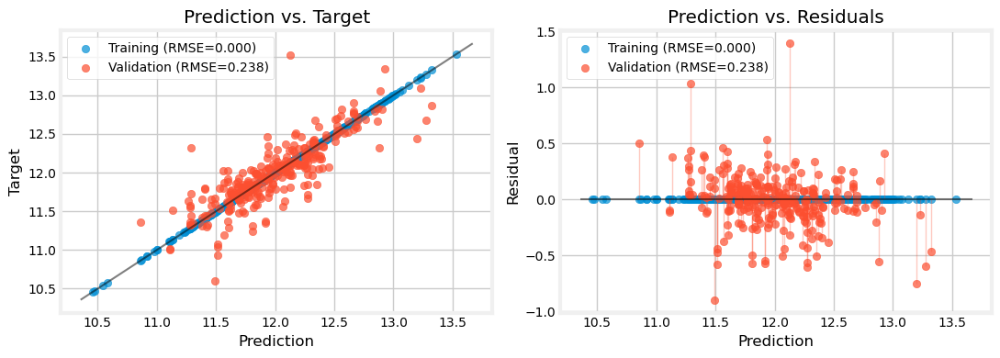

R2 Score Train         1.000000
R2 Score Validation    0.673874
RMSE Train             0.000000
RMSE Validation        0.237910
Name: dtr_base_no_cv, dtype: float64

In [409]:
print("*"*75)
print(model_name, "\n")
print("*"*75)

model_evaluation(model_name, (X_train, X_val, y_train, y_val),
                 perform_cv_randomized=(False, False),
                 verbose=True, plots=True)

In [410]:
model_path = "../models/"+model_name+".pkl"

with open(model_path, "wb") as f:
    dill.dump(pipe[model_name+'_no_cv'], f)
    pickle_or_dill = 'dill'

In [411]:
scorecard

,dtr_base_no_cv
R2 Score Train,1.000000
R2 Score Validation,0.673874
RMSE Train,0.000000
RMSE Validation,0.237910


### Model 1: `DecisionTreeRegressor`

Defining the pipelines and hyperparameter grids:

In [412]:
model = 'dtr'

for pp in ['raw', 'eng', 'clus']:

    if pp == 'raw':
        continue

    model_name = model+'_'+pp # full model name

    preproc_pipe = clone(final_preproc[pp]) # preprocessing  pipeline

    pipe[model_name] = Pipeline(steps=[('preprocessor',
                                        preproc_pipe),
                                       ('model',
                                        DecisionTreeRegressor(random_state=0))])

    pipe[model_name+'_no_cv'] = Pipeline(steps=[('preprocessor',
                                                 preproc_pipe),
                                                ('model',
                                                 DecisionTreeRegressor(random_state=0))])

    # defining the hyperparameter grid
    # basic:
    param_grid[model_name] = {'preprocessor__target_encoder__smoothing':
                                  uniform(loc=1, scale=99),
                              'preprocessor__selector__best_k':
                                  list(range(10, 40, 10)),
                              'preprocessor__selector__t_thr':
                                  uniform(loc=0.1, scale=0.8)
                             }
    # if clustering:
    if pp == 'clus':
        param_grid[model_name]['preprocessor__pca__fit_feat_subset'] =\
            [True]
        param_grid[model_name]['preprocessor__pca__keep_original_feats'] =\
            [False]
        param_grid[model_name]['preprocessor__cluster__n_clusters'] =\
            list(range(3,7))

    # proper to the model:
    param_grid[model_name]['model__min_samples_split'] =\
        list(range(2,21))
    param_grid[model_name]['model__max_depth'] =\
        [None, 5, 10, 20, 40]

Performing the evaluation and explanation of the model:

Time: 00:30:13
***************************************************************************
dtr_eng , 	CV: False 

***************************************************************************
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
We will evaluate model=dtr_eng with standard validation.
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::

 -> Fitting the model
......Done!
 -> Making predictions
......Done!
 -> Creating Regression Reports
......Done!


Regression Report: Training
..................................................


,Value
Explained Variance,0.999955
R2,0.999955
MAE,0.000112
MSE,0.000007
RMSE,0.002631
MedAE,0.000000
MAPE,0.000009




Regression Report: Validation
..................................................


,Value
Explained Variance,0.745129
R2,0.744735
MAE,0.144357
MSE,0.044303
RMSE,0.210482
MedAE,0.107184
MAPE,0.012152



 -> Computing Scores
......Done!
**************************************************
Prediction and Residual Plots:


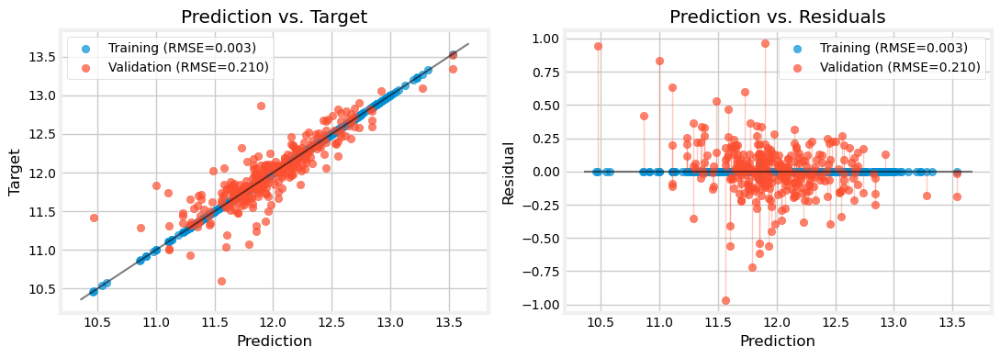



..................................................

Elapsed time: 0.05 minutes
..................................................



Time: 00:30:15
***************************************************************************
dtr_eng , 	CV: True 

***************************************************************************
We will evaluate dtr_eng with cross-validation.

 -> Creating instance of `RepeatedKFold`
......Done!
 -> Creating the CV search
......Done!

 -> Fitting the model
......Done!
 -> CV Results:
		best neg_root_mean_squared_error: -0.18089282304801219
		best params: {'model__max_depth': 20, 'model__min_samples_split': 20, 'preprocessor__selector__best_k': 10, 'preprocessor__selector__t_thr': np.float64(0.1779947073720682), 'preprocessor__target_encoder__smoothing': np.float64(85.33351623729355)}
......Done!
 -> Making predictions
......Done!
 -> Creating Regression Reports
......Done!


Regression Report: Training
..................................................


,Value
Explained Variance,0.930213
R2,0.930213
MAE,0.075960
MSE,0.010850
RMSE,0.104161
MedAE,0.056908
MAPE,0.006336




Regression Report: Validation
..................................................


,Value
Explained Variance,0.837044
R2,0.836800
MAE,0.119444
MSE,0.028324
RMSE,0.168298
MedAE,0.091343
MAPE,0.010035



 -> Computing Scores
......Done!
**************************************************
Prediction and Residual Plots:


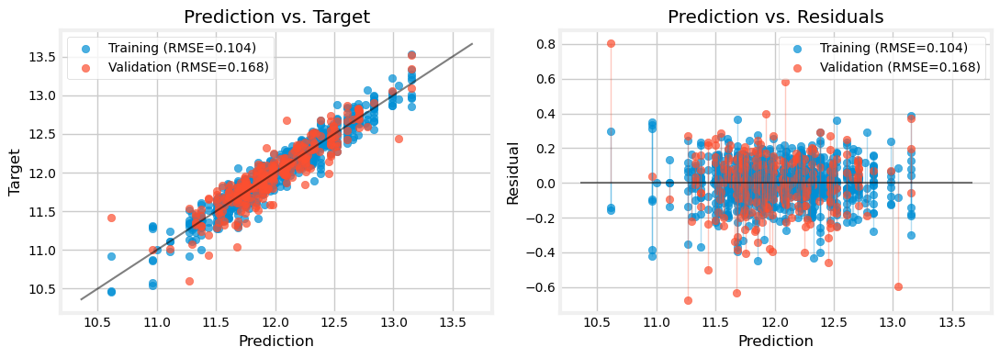



****************************************************************************************************
Performing Permutation Importance:
..................................................
The model's features are:

['TotalSF', 'OverallQual', 'Neighborhood', 'OverallQualCond', 'AllRooms', 'GarageArea', 'GarageCars', 'Has_Garage']
The most important features are:

	TotalSF: 0.4321032656069935 +- 0.029355524844161908
	OverallQual: 0.24814031653096177 +- 0.03729190851907154
	Neighborhood: 0.20357740348616593 +- 0.020483423635290047
	OverallQualCond: 0.09507657130019984 +- 0.015823497069020427
	AllRooms: 0.03969697680455939 +- 0.006718765319809212
	GarageArea: 0.02684560626862722 +- 0.007702365841953779
	GarageCars: 0.011415253972668427 +- 0.005065520888056119
	Has_Garage: 0.0028993202477808786 +- 0.00046084538198485345

****************************************************************************************************



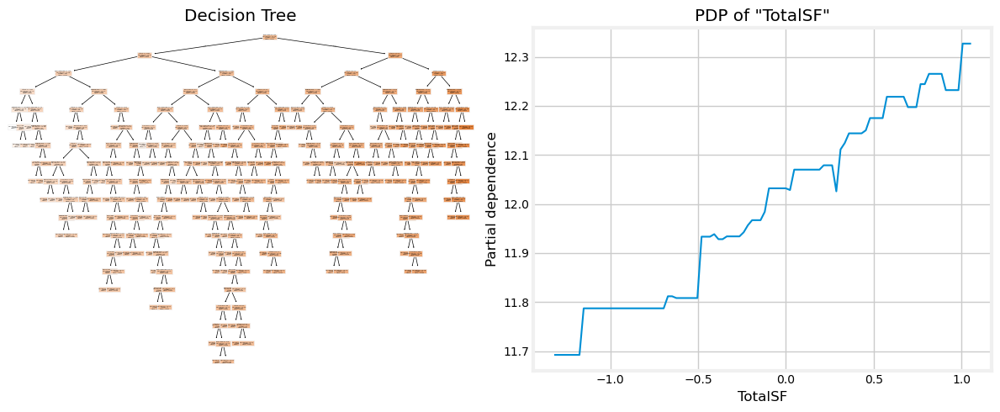

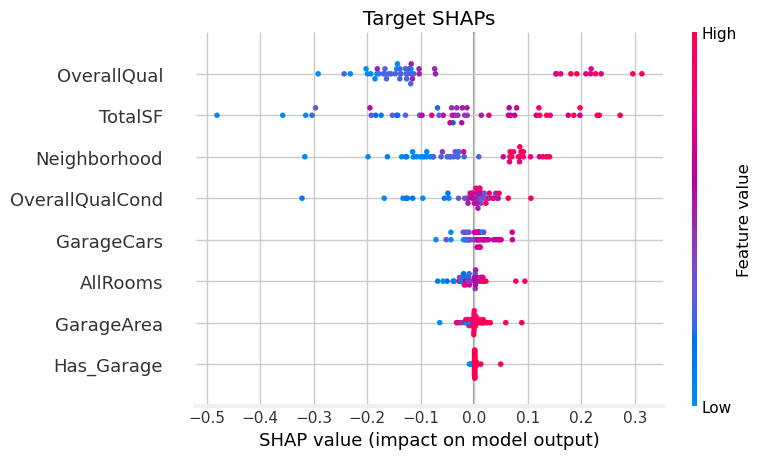

..................................................

Elapsed time: 22.24 minutes
..................................................



Time: 00:52:30
***************************************************************************
dtr_clus , 	CV: False 

***************************************************************************
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
We will evaluate model=dtr_clus with standard validation.
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::

 -> Fitting the model
......Done!
 -> Making predictions
......Done!
 -> Creating Regression Reports
......Done!


Regression Report: Training
..................................................


,Value
Explained Variance,0.999961
R2,0.999961
MAE,0.000153
MSE,0.000006
RMSE,0.002464
MedAE,0.000000
MAPE,0.000013




Regression Report: Validation
..................................................


,Value
Explained Variance,0.769365
R2,0.769110
MAE,0.140392
MSE,0.040072
RMSE,0.200181
MedAE,0.107973
MAPE,0.011844



 -> Computing Scores
......Done!
**************************************************
Prediction and Residual Plots:


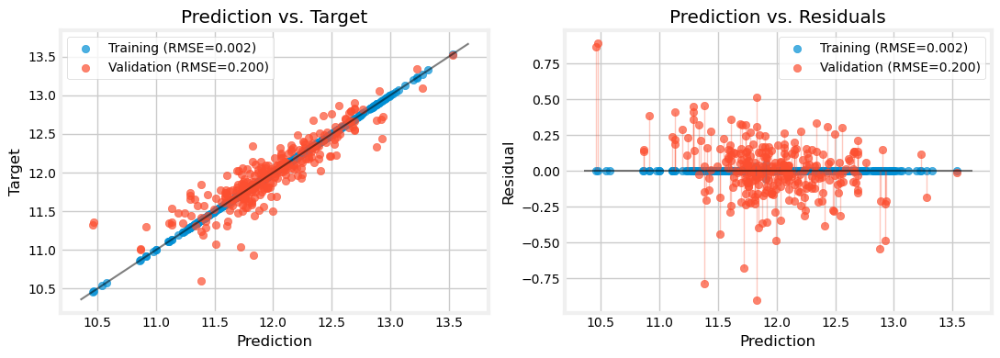



..................................................

Elapsed time: 0.02 minutes
..................................................



Time: 00:52:31
***************************************************************************
dtr_clus , 	CV: True 

***************************************************************************
We will evaluate dtr_clus with cross-validation.

 -> Creating instance of `RepeatedKFold`
......Done!
 -> Creating the CV search
......Done!

 -> Fitting the model
......Done!
 -> CV Results:
		best neg_root_mean_squared_error: -0.17418679413869423
		best params: {'model__max_depth': 5, 'model__min_samples_split': 5, 'preprocessor__cluster__n_clusters': 3, 'preprocessor__pca__fit_feat_subset': True, 'preprocessor__pca__keep_original_feats': False, 'preprocessor__selector__best_k': 20, 'preprocessor__selector__t_thr': np.float64(0.2788944812402752), 'preprocessor__target_encoder__smoothing': np.float64(98.78852190833949)}
......Done!
 -> Making predictions
......Done

,Value
Explained Variance,0.876380
R2,0.876380
MAE,0.102303
MSE,0.019219
RMSE,0.138631
MedAE,0.079002
MAPE,0.008543




Regression Report: Validation
..................................................


,Value
Explained Variance,0.841236
R2,0.841059
MAE,0.121340
MSE,0.027585
RMSE,0.166087
MedAE,0.093225
MAPE,0.010177



 -> Computing Scores
......Done!
**************************************************
Prediction and Residual Plots:


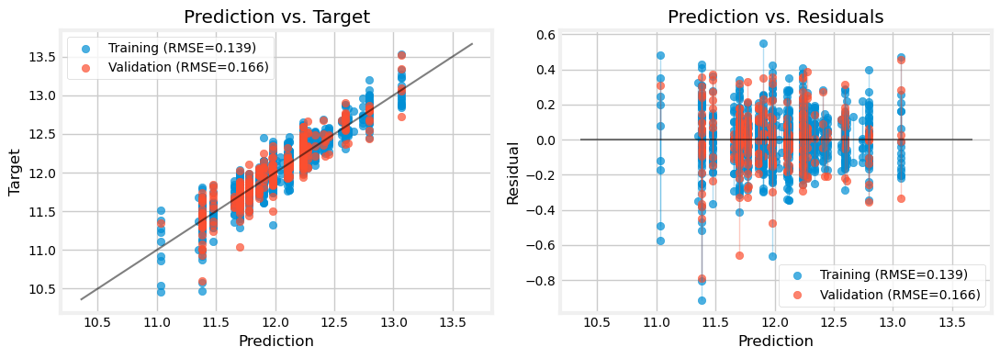



****************************************************************************************************
Performing Permutation Importance:
..................................................
The model's features are:

['pca0', 'AllBaths', 'BathsAbvGr', 'pca8', 'pca6', 'pca3', 'pca7', 'pca10', 'pca1', 'pca9', 'cluster_1', 'cluster_2', 'Has_Garage', 'Has_Bsmt', 'pca2', 'pca4', 'pca5']
The most important features are:

	pca0: 1.6169773975131925 +- 0.08709299296270248
	AllBaths: 0.05438853461657023 +- 0.01001863612382913
	BathsAbvGr: 0.013404035702728079 +- 0.00337196689298883
	pca8: 0.008016976424040468 +- 0.004517248928199981
	pca6: 0.006768548397650664 +- 0.004285890371454469
	pca3: 0.005062909501713175 +- 0.014046016827260756
	pca7: 0.0036672248322408675 +- 0.003979287865344537
	pca10: 0.0034383834890226563 +- 0.004702049533231079
	pca1: 0.002591196803223017 +- 0.0009041867302065888
	pca9: 0.002041304763985541 +- 0.0017625527736891441
	cluster_1: 0.0 +- 0.0
	cluster_2: 0.0 +- 0.0
	Has_Ga

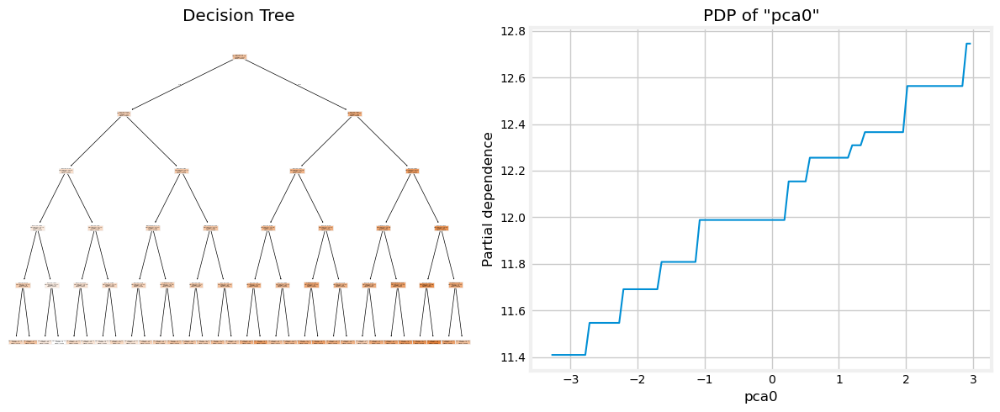

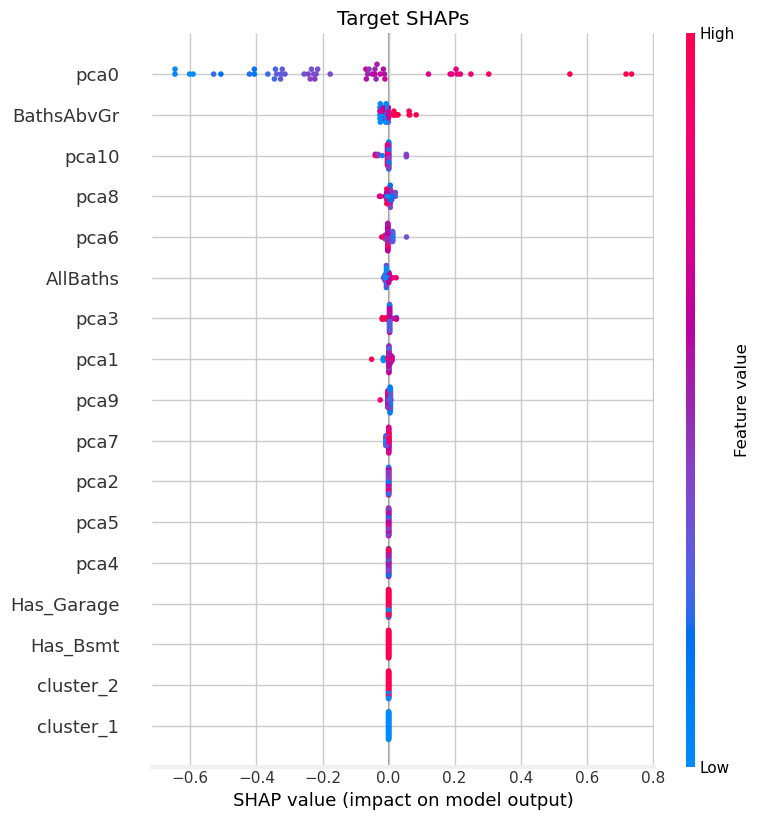

..................................................

Elapsed time: 23.65 minutes
..................................................





In [413]:
model = 'dtr'
redoQ = True

for pp in ['raw', 'eng', 'clus']:

    if pp == 'raw':
        continue
        
    for cvQ in [False, True]:

        print(time.strftime("Time: %H:%M:%S"))
        start = time.time()

        model_name = model+'_'+pp # full model name

        if redoQ and (model_name in search.keys()):
            del search[model_name]

        print("*"*75)
        print(model_name, ", \tCV:", cvQ, "\n")
        print("*"*75)

        # # GridSearchCV
        # model_evaluation(model_name, (X_train, X_val, y_train, y_val),
        #                  perform_cv_randomized=(cvQ, False),
        #                  n_splits=5, n_repeats=2,
        #                  verbose=True, plots=True)

        # RandomizedSearchCV
        model_evaluation(model_name, (X_train, X_val, y_train, y_val),
                         perform_cv_randomized=(cvQ, True),
                         n_splits=5, n_repeats=2,
                         n_iter=2000,
                         verbose=True, plots=True)

        print("\n")

        # if cross-validating:
        if cvQ:
            # explaining model
            explain_model(model_name, best_cv[model_name]['pipe'], (X_train, X_val, y_train, y_val), tree_idx=0, random_state=0)

            # saving model
            model_path = "../models/"+model_name+".pkl"
            
            with open(model_path, "wb") as f:
                dill.dump(best_cv[model_name]['pipe'], f)
        
        # done!!
        
        end = time.time()

        print("."*50)
        print(f"\nElapsed time: {(end-start)/60:.2f} minutes")
        print("."*50)

        print("\n\n")

In [414]:
scorecard

,dtr_base_no_cv,dtr_eng_no_cv,dtr_eng_cv,dtr_clus_no_cv,dtr_clus_cv
R2 Score Train,1.000000,0.999955,0.930213,0.999961,0.876380
R2 Score Validation,0.673874,0.744735,0.836800,0.769110,0.841059
RMSE Train,0.000000,0.002631,0.104161,0.002464,0.138631
RMSE Validation,0.237910,0.210482,0.168298,0.200181,0.166087


#### Engineered Cluster Model: exploration

In the cluster model, checking selected engineering features (from which PCA and clusters are built)

In [415]:
best_cv[model+'_clus']

{'pipe': Pipeline(steps=[('preprocessor',
                  Pipeline(steps=[('cleaning',
                                   Pipeline(steps=[('custom_imputer',
                                                    CustomImputer(groupby_cols={'BsmtCond': ['BsmtExposure',
                                                                                             'BsmtQual'],
                                                                                'BsmtExposure': ['BsmtQual',
                                                                                                 'BsmtCond'],
                                                                                'BsmtFinType2': ['BsmtQual',
                                                                                                 'BsmtCond'],
                                                                                'BsmtQual': ['BsmtCond',
                                                                                   

In [416]:
best_cv[model+'_clus']['params']

{'model__max_depth': 5,
 'model__min_samples_split': 5,
 'preprocessor__cluster__n_clusters': 3,
 'preprocessor__pca__fit_feat_subset': True,
 'preprocessor__pca__keep_original_feats': False,
 'preprocessor__selector__best_k': 20,
 'preprocessor__selector__t_thr': np.float64(0.2788944812402752),
 'preprocessor__target_encoder__smoothing': np.float64(98.78852190833949)}

In [417]:
best_cv[model+'_clus']['pipe'].steps

[('preprocessor',
  Pipeline(steps=[('cleaning',
                   Pipeline(steps=[('custom_imputer',
                                    CustomImputer(groupby_cols={'BsmtCond': ['BsmtExposure',
                                                                             'BsmtQual'],
                                                                'BsmtExposure': ['BsmtQual',
                                                                                 'BsmtCond'],
                                                                'BsmtFinType2': ['BsmtQual',
                                                                                 'BsmtCond'],
                                                                'BsmtQual': ['BsmtCond',
                                                                             'BsmtExposure'],
                                                                'Exterior1st': 'Foundation',
                                                                

In [418]:
best_preproc = best_cv[model+'_clus']['pipe'].steps[0][1] # the best preprocessor
best_feats = best_preproc[:-3] # all the preprocessor steps, except for PCA, KMeans clustering, and OHE
best_feats.transform(X_train)

,TotalSF,OverallQual,Neighborhood,OverallQualCond,GarageCars,YearBuilt,TotalBsmtSF,BathsAbvGr,AllBaths,1stFlrSF,KitchenQual,ExterQual,BsmtQual,Has_Garage,Has_Bsmt
921,0.822593,-0.5,-1.022873,0.0,-2.0,-1.574468,0.474238,1.0,3.0,0.311465,0.0,0.0,-1.0,0,1
520,-1.637012,-1.0,-1.123252,-0.7,-2.0,-1.574468,-14.082269,0.0,0.0,-0.975073,0.0,0.0,-4.0,0,0
401,0.120837,0.5,0.175611,0.0,0.0,0.659574,0.534128,0.0,0.0,0.373991,1.0,1.0,0.0,1,1
280,0.276629,0.5,0.094190,0.7,0.0,0.319149,-0.451321,0.5,0.5,0.142984,1.0,1.0,0.0,1,1
1401,-0.064737,0.0,0.091597,-0.5,0.0,0.638298,-0.372238,0.5,1.5,-0.509924,0.0,0.0,-1.0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
715,-0.083251,0.0,0.050189,-0.5,0.0,0.000000,0.110991,0.0,0.0,0.437880,0.0,0.0,0.0,1,1
905,-0.408079,-0.5,-0.771304,-1.0,-1.0,-0.425532,0.095638,-1.0,0.0,-0.069767,0.0,0.0,-1.0,1,1
1096,-0.503985,0.0,-1.554036,0.7,-2.0,-1.276596,-0.787573,-0.5,-0.5,-0.746216,1.0,0.0,-1.0,0,1
235,-1.319293,0.0,-1.205178,-1.7,-1.0,-0.063830,-1.494787,-0.5,-0.5,-1.744221,0.0,0.0,-1.0,1,1


In [419]:
best_preproc

,steps,"[('cleaning', ...), ('feature_engineer', ...), ...]"
,transform_input,None
,memory,None
,verbose,False
,steps,"[('custom_imputer', ...), ('rules_based_imputer', ...), ...]"
,transform_input,None
,memory,None
,verbose,False
,strategies,"{'Alley': 'NA', 'Electrical': 'mode', 'Exterior1st': 'group_mode', 'Exterior2nd': 'group_mode', ...}"
,groupby_cols,"{'BsmtCond': ['BsmtExposure', 'BsmtQual'], 'BsmtExposure': ['BsmtQual', 'BsmtCond'], 'BsmtFinType2': ['BsmtQual', 'BsmtCond'], 'BsmtQual': ['BsmtCond', 'BsmtExposure'], ...}"
,rules,"[{'column': 'MasVnrArea', 'condition': <function <la...x73b6680662a0>, 'value': 0.0}, {'column': 'MasVnrType', 'condition': <function <la...x73b668066660>, 'value': 'NA'}, ...]"


In [420]:
del best_preproc, best_feats

#### Cleanup

In [421]:
Out.clear()

for name in dir():
    if name.startswith('_') and name[1:].isdigit():
        del globals()[name]

### Model 2: `RandomForestRegressor`

In [422]:
model = 'rfr'

for pp in ['raw', 'eng', 'clus']:

    model_name = model+'_'+pp # full model name

    preproc_pipe = clone(final_preproc[pp]) # preprocessing  pipeline

    pipe[model_name] = Pipeline(steps=[('preprocessor', preproc_pipe),
                                       ('model', RandomForestRegressor(random_state=0))])

    pipe[model_name+'_no_cv'] = Pipeline(steps=[('preprocessor', preproc_pipe),
                                                ('model', RandomForestRegressor(random_state=0))])

    # defining the hyperparameter grid
    # basic:
    param_grid[model_name] = {'preprocessor__target_encoder__smoothing':
                                  uniform(loc=1, scale=99),
                              'preprocessor__selector__best_k':
                                  list(range(10, 40, 10)),
                              'preprocessor__selector__t_thr':
                                  uniform(loc=0.1, scale=0.8)
                             }
    # if clustering:
    if pp == 'clus':
        param_grid[model_name]['preprocessor__pca__fit_feat_subset'] =\
                        [True]
        param_grid[model_name]['preprocessor__pca__keep_original_feats'] =\
            [False]
        param_grid[model_name]['preprocessor__cluster__n_clusters'] =\
            list(range(3,7))

    # proper to the model:
    param_grid[model_name]['model__n_estimators'] =\
        [100*i for i in range(1,11)]
    param_grid[model_name]['model__max_depth'] =\
        [None, 10, 20, 30]

Time: 01:16:10
***************************************************************************
rfr_eng , 	CV: False 

***************************************************************************
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
We will evaluate model=rfr_eng with standard validation.
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::

 -> Fitting the model
......Done!
 -> Making predictions
......Done!
 -> Creating Regression Reports
......Done!


Regression Report: Training
..................................................


,Value
Explained Variance,0.982753
R2,0.982749
MAE,0.036472
MSE,0.002682
RMSE,0.051788
MedAE,0.026280
MAPE,0.003048




Regression Report: Validation
..................................................


,Value
Explained Variance,0.887677
R2,0.887390
MAE,0.100023
MSE,0.019544
RMSE,0.139800
MedAE,0.073713
MAPE,0.008403



 -> Computing Scores
......Done!
**************************************************
Prediction and Residual Plots:


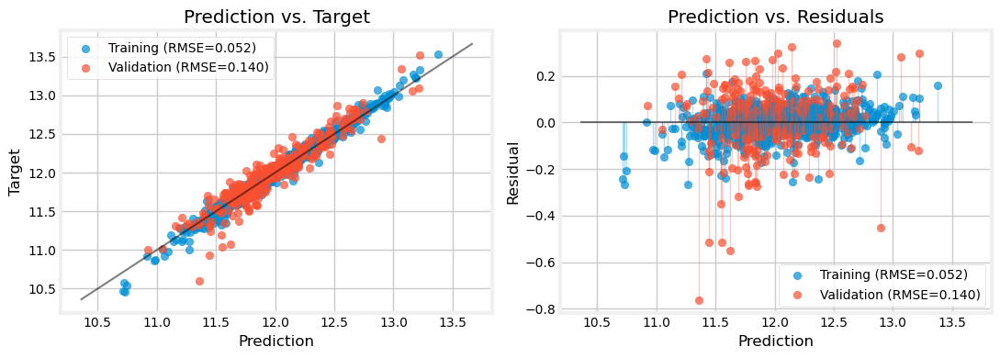



..................................................

Elapsed time: 0.03 minutes
..................................................



Time: 01:16:12
***************************************************************************
rfr_eng , 	CV: True 

***************************************************************************
We will evaluate rfr_eng with cross-validation.

 -> Creating instance of `RepeatedKFold`
......Done!
 -> Creating the CV search
......Done!

 -> Fitting the model
871:	learn: 0.0969777	total: 6.17s	remaining: 198ms
872:	learn: 0.0969769	total: 6.17s	remaining: 191ms
873:	learn: 0.0969757	total: 6.17s	remaining: 184ms
874:	learn: 0.0969755	total: 6.18s	remaining: 176ms
875:	learn: 0.0969747	total: 6.18s	remaining: 169ms
876:	learn: 0.0969736	total: 6.18s	remaining: 162ms
877:	learn: 0.0969717	total: 6.19s	remaining: 155ms
878:	learn: 0.0969709	total: 6.19s	remaining: 148ms
879:	learn: 0.0969693	total: 6.19s	remaining: 141ms
880:	learn: 0.0969686	total: 6.2s	remaining:

/home/mbuenabad/miniforge3/envs/ml_env/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


888:	learn: 0.1003372	total: 10.3s	remaining: 127ms
889:	learn: 0.1003364	total: 10.3s	remaining: 116ms
890:	learn: 0.1003354	total: 10.3s	remaining: 104ms
891:	learn: 0.1003353	total: 10.3s	remaining: 92.8ms
892:	learn: 0.1003346	total: 10.4s	remaining: 81.2ms
893:	learn: 0.1003336	total: 10.4s	remaining: 69.6ms
894:	learn: 0.1003331	total: 10.4s	remaining: 58ms
895:	learn: 0.1003321	total: 10.4s	remaining: 46.3ms
896:	learn: 0.1003313	total: 10.4s	remaining: 34.7ms
897:	learn: 0.1003309	total: 10.4s	remaining: 23.2ms
898:	learn: 0.1003305	total: 10.4s	remaining: 11.6ms
899:	learn: 0.1003304	total: 10.4s	remaining: 0us
513:	learn: 0.0256083	total: 4.64s	remaining: 776ms
514:	learn: 0.0255421	total: 4.66s	remaining: 769ms
515:	learn: 0.0255076	total: 4.69s	remaining: 763ms
516:	learn: 0.0254362	total: 4.7s	remaining: 755ms
517:	learn: 0.0254307	total: 4.71s	remaining: 745ms
518:	learn: 0.0253999	total: 4.71s	remaining: 736ms
519:	learn: 0.0253486	total: 4.75s	remaining: 731ms
520:	lear

,Value
Explained Variance,0.982822
R2,0.982821
MAE,0.035647
MSE,0.002671
RMSE,0.051680
MedAE,0.024534
MAPE,0.002978




Regression Report: Validation
..................................................


,Value
Explained Variance,0.890540
R2,0.890535
MAE,0.093735
MSE,0.018998
RMSE,0.137834
MedAE,0.067340
MAPE,0.007868



 -> Computing Scores
......Done!
**************************************************
Prediction and Residual Plots:


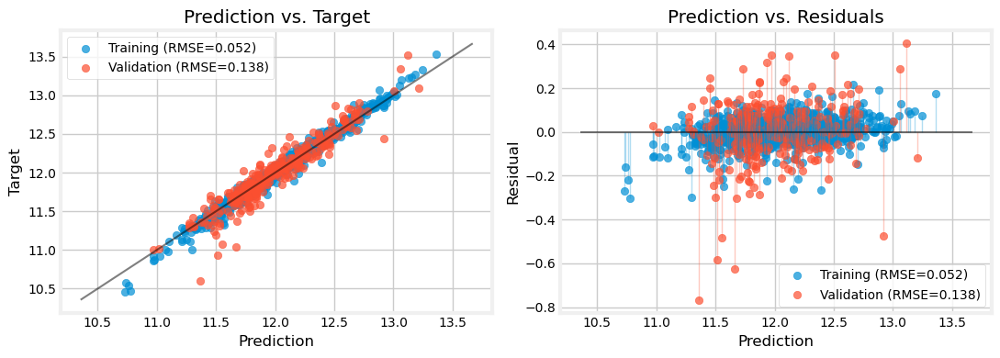



****************************************************************************************************
Performing Permutation Importance:
..................................................
The model's features are:

['TotalSF', 'OverallQual', 'Neighborhood', 'OverallQualCond', 'RemodAge', 'AllBaths', 'YearBuilt', 'AllRooms', '1and2FlrSF', 'GarageAge', '1stFlrSF', 'FireplaceQu', 'MSSubClass', 'BsmtQual', 'GarageArea', 'KitchenQual', 'BathsAbvGr', 'GarageCars', 'ExterQual', 'GarageFinish', 'GarageType_1', 'GarageType_6', 'Foundation_2', 'FullBath', 'Has_Garage', 'Has_Bsmt', 'Foundation_4', 'Foundation_5', 'GarageType_4', 'Foundation_3', 'GarageType_3', 'Foundation_1', 'GarageType_5', 'GarageType_2', 'TotalBsmtSF', 'LotFrontage']
The most important features are:

	TotalSF: 0.28808230020989267 +- 0.021074378658822952
	OverallQual: 0.15856428956946847 +- 0.030075053328514862
	Neighborhood: 0.0725352991425184 +- 0.009737183136848696
	OverallQualCond: 0.03762518562092674 +- 0.0015086371649590

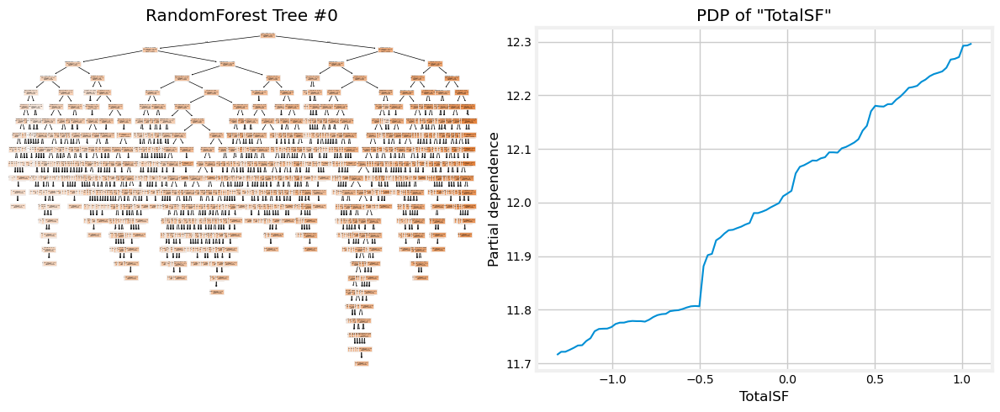

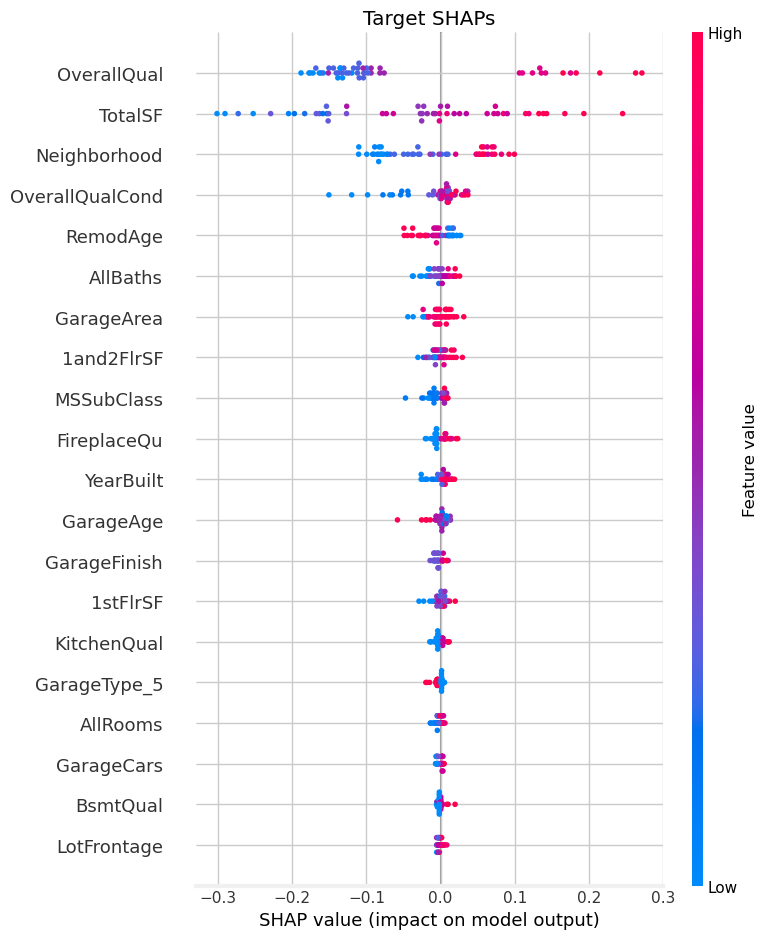

..................................................

Elapsed time: 73.08 minutes
..................................................



Time: 02:29:17
***************************************************************************
rfr_clus , 	CV: False 

***************************************************************************
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
We will evaluate model=rfr_clus with standard validation.
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::

 -> Fitting the model
......Done!
 -> Making predictions
......Done!
 -> Creating Regression Reports
......Done!


Regression Report: Training
..................................................


,Value
Explained Variance,0.982524
R2,0.982524
MAE,0.036743
MSE,0.002717
RMSE,0.052124
MedAE,0.026857
MAPE,0.003067




Regression Report: Validation
..................................................


,Value
Explained Variance,0.887784
R2,0.887616
MAE,0.099057
MSE,0.019505
RMSE,0.139660
MedAE,0.072954
MAPE,0.008343



 -> Computing Scores
......Done!
**************************************************
Prediction and Residual Plots:


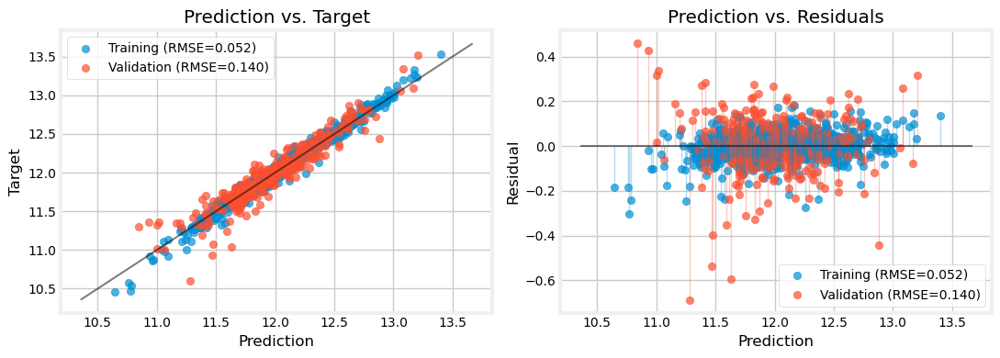



..................................................

Elapsed time: 0.04 minutes
..................................................



Time: 02:29:20
***************************************************************************
rfr_clus , 	CV: True 

***************************************************************************
We will evaluate rfr_clus with cross-validation.

 -> Creating instance of `RepeatedKFold`
......Done!
 -> Creating the CV search
......Done!

 -> Fitting the model
......Done!
 -> CV Results:
		best neg_root_mean_squared_error: -0.14697051025472638
		best params: {'model__max_depth': 20, 'model__n_estimators': 900, 'preprocessor__cluster__n_clusters': 3, 'preprocessor__pca__fit_feat_subset': True, 'preprocessor__pca__keep_original_feats': False, 'preprocessor__selector__best_k': 20, 'preprocessor__selector__t_thr': np.float64(0.2726506925306371), 'preprocessor__target_encoder__smoothing': np.float64(86.2861440847636)}
......Done!
 -> Making predictions
......Done!
 

,Value
Explained Variance,0.982268
R2,0.982262
MAE,0.036583
MSE,0.002758
RMSE,0.052513
MedAE,0.026279
MAPE,0.003054




Regression Report: Validation
..................................................


,Value
Explained Variance,0.884472
R2,0.884343
MAE,0.102039
MSE,0.020073
RMSE,0.141679
MedAE,0.076050
MAPE,0.008577



 -> Computing Scores
......Done!
**************************************************
Prediction and Residual Plots:


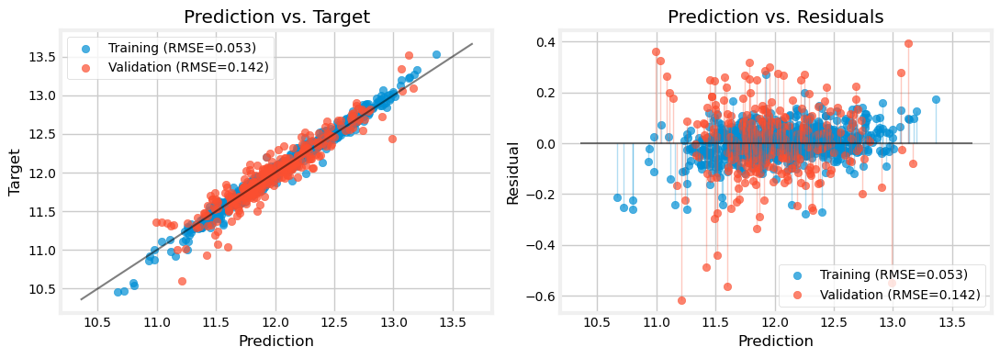



****************************************************************************************************
Performing Permutation Importance:
..................................................
The model's features are:

['pca0', 'AllBaths', 'BathsAbvGr', 'pca11', 'pca2', 'pca10', 'pca6', 'pca8', 'pca1', 'pca5', 'pca3', 'pca9', 'pca7', 'pca4', 'cluster_2', 'Has_Bsmt', 'cluster_1', 'Has_Garage']
The most important features are:

	pca0: 1.6163067825928006 +- 0.07853723491202294
	AllBaths: 0.01192416732150181 +- 0.0028291370160762456
	BathsAbvGr: 0.007049669400557845 +- 0.002469577304592865
	pca11: 0.006461687095925562 +- 0.001767455805493296
	pca2: 0.0050600974050852175 +- 0.002183672376383767
	pca10: 0.004955932379991946 +- 0.001915282655379979
	pca6: 0.003313543028840615 +- 0.001585234052468491
	pca8: 0.003171272828679861 +- 0.0028049580754161215
	pca1: 0.0024898354470308305 +- 0.0009455668302202258
	pca5: 0.0019151686444644378 +- 0.0010330318278295658
	pca3: 0.0017291029834963778 +- 0.0011

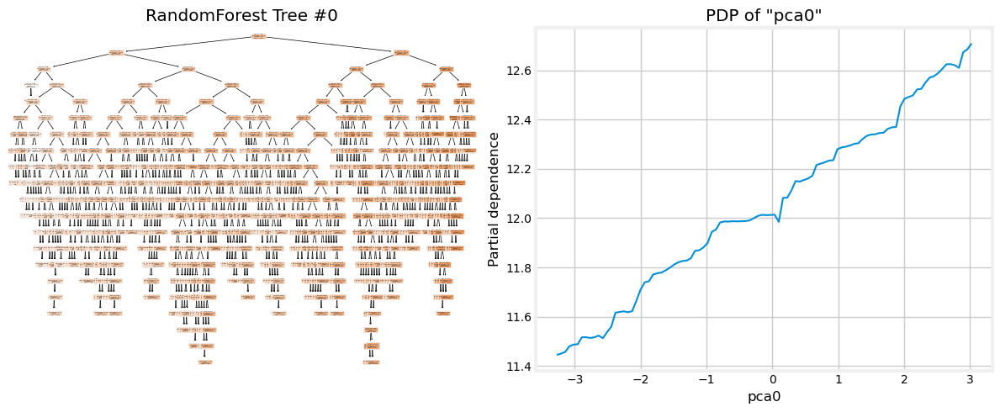

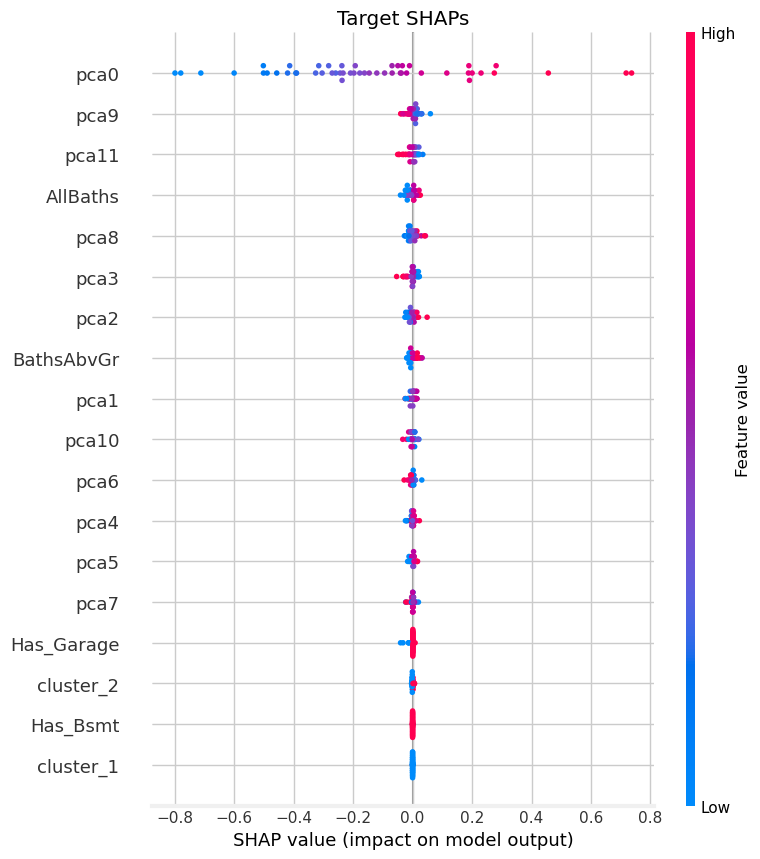

..................................................

Elapsed time: 99.06 minutes
..................................................





In [423]:
model = 'rfr'
redoQ = True

for pp in ['raw', 'eng', 'clus']:

    if pp == 'raw':
        continue
    
    for cvQ in [False, True]:

        print(time.strftime("Time: %H:%M:%S"))
        start = time.time()

        model_name = model+'_'+pp # full model name

        if redoQ and (model_name in search.keys()):
            del search[model_name]

        print("*"*75)
        print(model_name, ", \tCV:", cvQ, "\n")
        print("*"*75)
        
        # # GridSearchCV
        # model_evaluation(model_name, (X_train, X_val, y_train, y_val),
        #                  perform_cv_randomized=(cvQ, False),
        #                  n_splits=5, n_repeats=2,
        #                  verbose=True, plots=True)

        # RandomizedSearchCV
        model_evaluation(model_name, (X_train, X_val, y_train, y_val),
                         perform_cv_randomized=(cvQ, True),
                         n_splits=5, n_repeats=2,
                         n_iter=2000,
                         verbose=True, plots=True)

        print("\n")

        # if cross-validating:
        if cvQ:
            # explaining model
            explain_model(model_name, best_cv[model_name]['pipe'], (X_train, X_val, y_train, y_val), tree_idx=0, random_state=0)

            # saving model
            model_path = "../models/"+model_name+".pkl"
            
            with open(model_path, "wb") as f:
                dill.dump(best_cv[model_name]['pipe'], f)
        
        # done!!
        
        end = time.time()

        print("."*50)
        print(f"\nElapsed time: {(end-start)/60:.2f} minutes")
        print("."*50)

        print("\n\n")

In [424]:
scorecard

,dtr_base_no_cv,dtr_eng_no_cv,dtr_eng_cv,dtr_clus_no_cv,dtr_clus_cv,rfr_eng_no_cv,rfr_eng_cv,rfr_clus_no_cv,rfr_clus_cv
R2 Score Train,1.000000,0.999955,0.930213,0.999961,0.876380,0.982749,0.982821,0.982524,0.982262
R2 Score Validation,0.673874,0.744735,0.836800,0.769110,0.841059,0.887390,0.890535,0.887616,0.884343
RMSE Train,0.000000,0.002631,0.104161,0.002464,0.138631,0.051788,0.051680,0.052124,0.052513
RMSE Validation,0.237910,0.210482,0.168298,0.200181,0.166087,0.139800,0.137834,0.139660,0.141679


#### Engineered Cluster Model: exploration

In the cluster model, checking selected engineering features (from which PCA and clusters are built)

In [425]:
best_cv[model+'_clus']

{'pipe': Pipeline(steps=[('preprocessor',
                  Pipeline(steps=[('cleaning',
                                   Pipeline(steps=[('custom_imputer',
                                                    CustomImputer(groupby_cols={'BsmtCond': ['BsmtExposure',
                                                                                             'BsmtQual'],
                                                                                'BsmtExposure': ['BsmtQual',
                                                                                                 'BsmtCond'],
                                                                                'BsmtFinType2': ['BsmtQual',
                                                                                                 'BsmtCond'],
                                                                                'BsmtQual': ['BsmtCond',
                                                                                   

In [426]:
best_cv[model+'_clus']['params']

{'model__max_depth': 20,
 'model__n_estimators': 900,
 'preprocessor__cluster__n_clusters': 3,
 'preprocessor__pca__fit_feat_subset': True,
 'preprocessor__pca__keep_original_feats': False,
 'preprocessor__selector__best_k': 20,
 'preprocessor__selector__t_thr': np.float64(0.2726506925306371),
 'preprocessor__target_encoder__smoothing': np.float64(86.2861440847636)}

In [427]:
best_cv[model+'_clus']['pipe'].steps

[('preprocessor',
  Pipeline(steps=[('cleaning',
                   Pipeline(steps=[('custom_imputer',
                                    CustomImputer(groupby_cols={'BsmtCond': ['BsmtExposure',
                                                                             'BsmtQual'],
                                                                'BsmtExposure': ['BsmtQual',
                                                                                 'BsmtCond'],
                                                                'BsmtFinType2': ['BsmtQual',
                                                                                 'BsmtCond'],
                                                                'BsmtQual': ['BsmtCond',
                                                                             'BsmtExposure'],
                                                                'Exterior1st': 'Foundation',
                                                                

In [428]:
best_preproc = best_cv[model+'_clus']['pipe'].steps[0][1] # the best preprocessor
best_feats = best_preproc[:-3] # all the preprocessor steps, except for PCA, KMeans clustering, and OHE
best_feats.transform(X_train)

,TotalSF,OverallQual,Neighborhood,OverallQualCond,GarageCars,YearBuilt,BathsAbvGr,TotalBsmtSF,1stFlrSF,AllBaths,ExterQual,KitchenQual,BsmtQual,RemodAge,Has_Garage,Has_Bsmt
921,0.822593,-0.5,-1.026590,0.0,-2.0,-1.574468,1.0,0.474238,0.311465,3.0,0.0,0.0,-1.0,-0.250000,0,1
520,-1.637012,-1.0,-1.129396,-0.7,-2.0,-1.574468,0.0,-14.082269,-0.975073,0.0,0.0,0.0,-4.0,-0.166667,0,0
401,0.120837,0.5,0.182981,0.0,0.0,0.659574,0.0,0.534128,0.373991,0.0,1.0,1.0,0.0,-0.361111,1,1
280,0.276629,0.5,0.091925,0.7,0.0,0.319149,0.5,-0.451321,0.142984,0.5,1.0,1.0,0.0,0.111111,1,1
1401,-0.064737,0.0,0.092229,-0.5,0.0,0.638298,0.5,-0.372238,-0.509924,1.5,0.0,0.0,-1.0,-0.277778,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
715,-0.083251,0.0,0.050774,-0.5,0.0,0.000000,0.0,0.110991,0.437880,0.0,0.0,0.0,0.0,0.583333,1,1
905,-0.408079,-0.5,-0.782002,-1.0,-1.0,-0.425532,-1.0,0.095638,-0.069767,0.0,0.0,0.0,-1.0,1.166667,1,1
1096,-0.503985,0.0,-1.528662,0.7,-2.0,-1.276596,-0.5,-0.787573,-0.746216,-0.5,0.0,1.0,-1.0,-0.361111,0,1
235,-1.319293,0.0,-1.178762,-1.7,-1.0,-0.063830,-0.5,-1.494787,-1.744221,-0.5,0.0,0.0,-1.0,0.638889,1,1


In [429]:
best_preproc

,steps,"[('cleaning', ...), ('feature_engineer', ...), ...]"
,transform_input,None
,memory,None
,verbose,False
,steps,"[('custom_imputer', ...), ('rules_based_imputer', ...), ...]"
,transform_input,None
,memory,None
,verbose,False
,strategies,"{'Alley': 'NA', 'Electrical': 'mode', 'Exterior1st': 'group_mode', 'Exterior2nd': 'group_mode', ...}"
,groupby_cols,"{'BsmtCond': ['BsmtExposure', 'BsmtQual'], 'BsmtExposure': ['BsmtQual', 'BsmtCond'], 'BsmtFinType2': ['BsmtQual', 'BsmtCond'], 'BsmtQual': ['BsmtCond', 'BsmtExposure'], ...}"
,rules,"[{'column': 'MasVnrArea', 'condition': <function <la...x73b6680662a0>, 'value': 0.0}, {'column': 'MasVnrType', 'condition': <function <la...x73b668066660>, 'value': 'NA'}, ...]"


In [430]:
del best_preproc, best_feats

#### Cleanup

In [431]:
Out.clear()

for name in dir():
    if name.startswith('_') and name[1:].isdigit():
        del globals()[name]

### Model 3: `XGBRegressor`

In [432]:
model = 'xgbr'

for pp in ['raw', 'eng', 'clus']:

    if pp == 'raw':
        continue

    model_name = model+'_'+pp # full model name

    preproc_pipe = clone(final_preproc[pp]) # preprocessing  pipeline

    pipe[model_name] =\
        Pipeline(steps=[('preprocessor', preproc_pipe),
                        ('model', XGBRegressor(random_state=0))])

    pipe[model_name+'_no_cv'] =\
        Pipeline(steps=[('preprocessor', preproc_pipe),
                        ('model', XGBRegressor(random_state=0))])

    
    # defining the hyperparameter grid
    # basic:
    param_grid[model_name] = {'preprocessor__target_encoder__smoothing':
                                  uniform(loc=1, scale=99),
                              'preprocessor__selector__best_k':
                                  list(range(10, 40, 10)),
                              'preprocessor__selector__t_thr':
                                  uniform(loc=0.1, scale=0.8)
                             }
    # if clustering:
    if pp == 'clus':
        param_grid[model_name]['preprocessor__pca__fit_feat_subset'] =\
                        [True]
        param_grid[model_name]['preprocessor__pca__keep_original_feats'] =\
            [False]
        param_grid[model_name]['preprocessor__cluster__n_clusters'] =\
            list(range(3,7))

    # proper to the model:
    param_grid[model_name]['model__n_estimators'] =\
        [100*i for i in range(1, 11)]
    param_grid[model_name]['model__learning_rate'] =\
        loguniform(1.e-2, 0.5)
    param_grid[model_name]['model__max_depth'] =\
        list(range(3,11))

Time: 04:08:24
***************************************************************************
xgbr_eng , 	CV: False 

***************************************************************************
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
We will evaluate model=xgbr_eng with standard validation.
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::

 -> Fitting the model
......Done!
 -> Making predictions
......Done!
 -> Creating Regression Reports
......Done!


Regression Report: Training
..................................................


,Value
Explained Variance,0.998403
R2,0.998403
MAE,0.011229
MSE,0.000248
RMSE,0.015757
MedAE,0.007573
MAPE,0.000935




Regression Report: Validation
..................................................


,Value
Explained Variance,0.875958
R2,0.875854
MAE,0.099620
MSE,0.021546
RMSE,0.146786
MedAE,0.073203
MAPE,0.008382



 -> Computing Scores
......Done!
**************************************************
Prediction and Residual Plots:


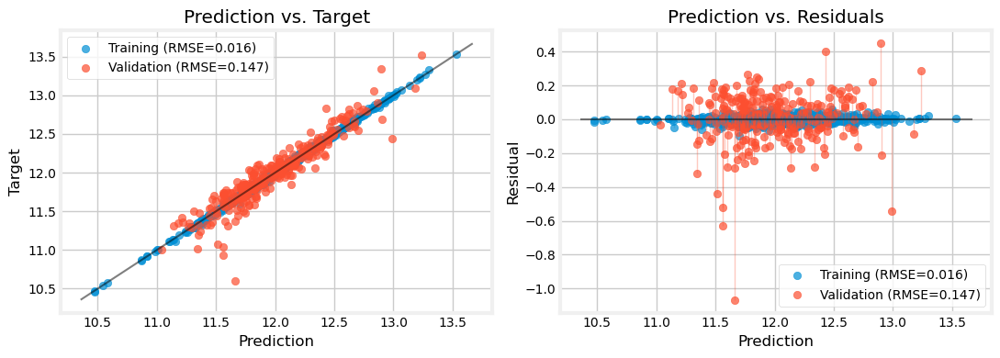



..................................................

Elapsed time: 0.03 minutes
..................................................



Time: 04:08:26
***************************************************************************
xgbr_eng , 	CV: True 

***************************************************************************
We will evaluate xgbr_eng with cross-validation.

 -> Creating instance of `RepeatedKFold`
......Done!
 -> Creating the CV search
......Done!

 -> Fitting the model
......Done!
 -> CV Results:
		best neg_root_mean_squared_error: -0.1375681062036172
		best params: {'model__learning_rate': np.float64(0.03278807083438927), 'model__max_depth': 4, 'model__n_estimators': 500, 'preprocessor__selector__best_k': 30, 'preprocessor__selector__t_thr': np.float64(0.1672373141431871), 'preprocessor__target_encoder__smoothing': np.float64(32.512849416265226)}
......Done!
 -> Making predictions
......Done!
 -> Creating Regression Reports
......Done!


Regression Report: Training
...

,Value
Explained Variance,0.977811
R2,0.977811
MAE,0.042985
MSE,0.003450
RMSE,0.058734
MedAE,0.032856
MAPE,0.003578




Regression Report: Validation
..................................................


,Value
Explained Variance,0.893909
R2,0.893753
MAE,0.094724
MSE,0.018440
RMSE,0.135793
MedAE,0.071798
MAPE,0.007965



 -> Computing Scores
......Done!
**************************************************
Prediction and Residual Plots:


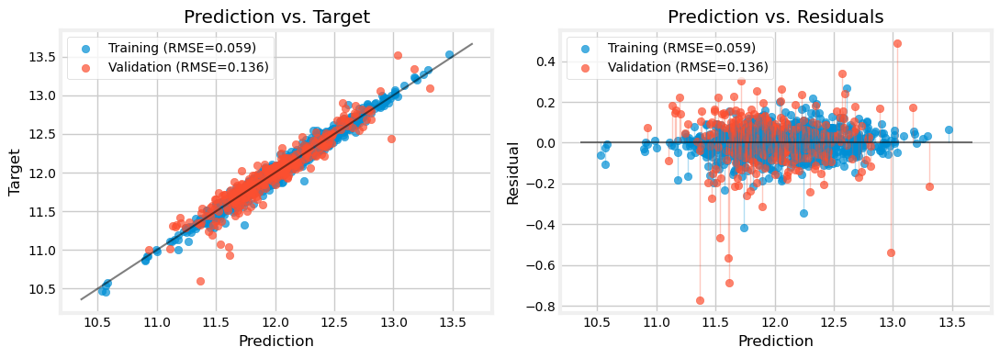



****************************************************************************************************
Performing Permutation Importance:
..................................................
The model's features are:

['TotalSF', 'Neighborhood', 'OverallQualCond', 'OverallQual', 'AllBaths', 'RemodAge', 'YearBuilt', 'FireplaceQu', '2ndFlrSF', 'GarageCars', '1stFlrSF', 'GarageArea', 'KitchenQual', 'AllRooms', 'TotalBsmtSF', 'GarageAge', 'BsmtQual', 'BathsAbvGr', 'MSSubClass', 'GarageFinish', 'GarageType_5', 'GarageType_1', 'ExterQual', 'GarageType_3', 'GarageType_6', 'FullBath', 'Has_Garage', 'Has_Bsmt', 'Has_2ndFlr', 'GarageType_4', 'GarageType_2', 'LotFrontage']
The most important features are:

	TotalSF: 0.25098264711550866 +- 0.013062414210260472
	Neighborhood: 0.060339910281378265 +- 0.007857406319942356
	OverallQualCond: 0.0486941042702322 +- 0.0034518386621194773
	OverallQual: 0.048499278993461695 +- 0.008873108510747718
	AllBaths: 0.023789964676609855 +- 0.002104377309089618
	Remod

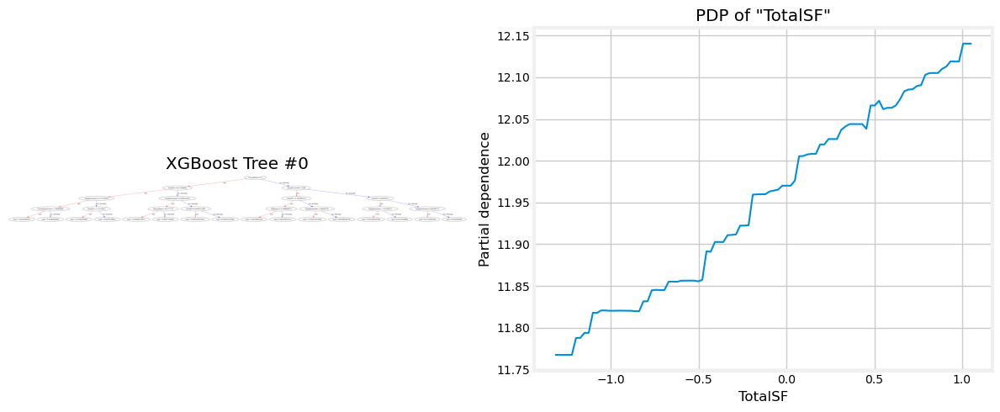

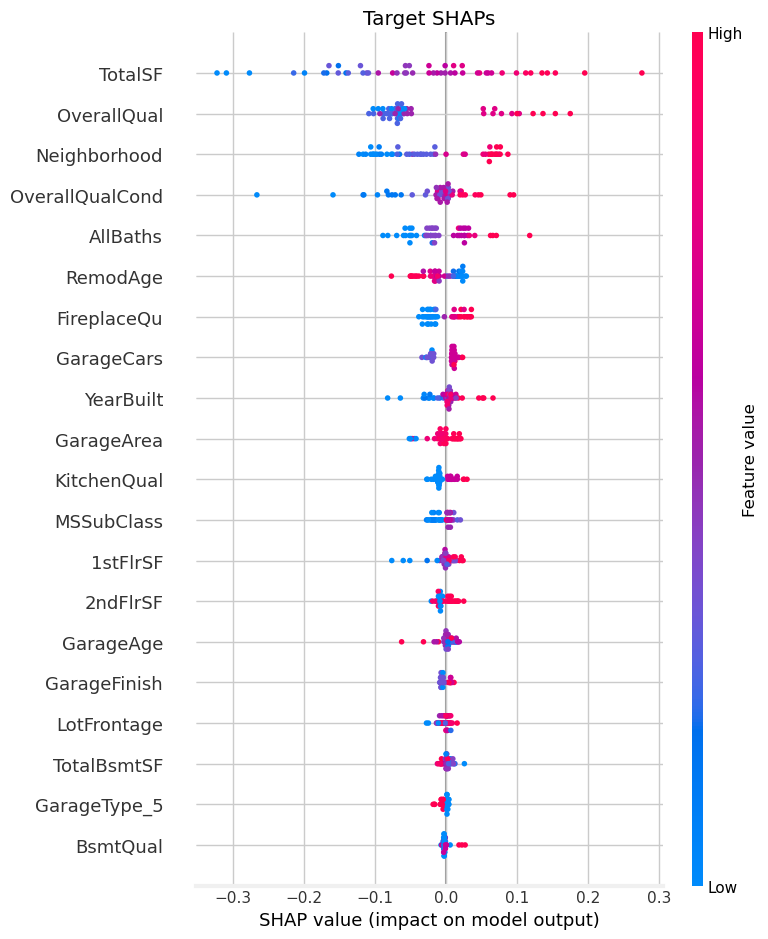

..................................................

Elapsed time: 30.52 minutes
..................................................



Time: 04:38:57
***************************************************************************
xgbr_clus , 	CV: False 

***************************************************************************
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
We will evaluate model=xgbr_clus with standard validation.
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::

 -> Fitting the model
......Done!
 -> Making predictions
......Done!
 -> Creating Regression Reports
......Done!


Regression Report: Training
..................................................


,Value
Explained Variance,0.999619
R2,0.999619
MAE,0.005210
MSE,0.000059
RMSE,0.007693
MedAE,0.003412
MAPE,0.000434




Regression Report: Validation
..................................................


,Value
Explained Variance,0.870629
R2,0.870324
MAE,0.106647
MSE,0.022506
RMSE,0.150020
MedAE,0.075823
MAPE,0.009002



 -> Computing Scores
......Done!
**************************************************
Prediction and Residual Plots:


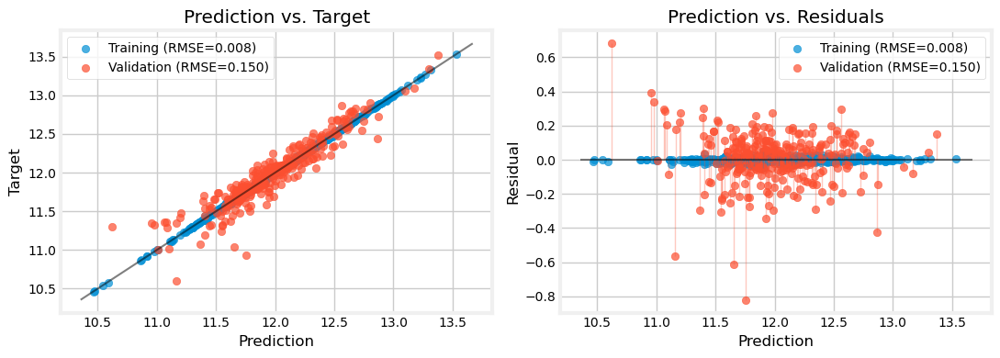



..................................................

Elapsed time: 0.03 minutes
..................................................



Time: 04:38:58
***************************************************************************
xgbr_clus , 	CV: True 

***************************************************************************
We will evaluate xgbr_clus with cross-validation.

 -> Creating instance of `RepeatedKFold`
......Done!
 -> Creating the CV search
......Done!

 -> Fitting the model
......Done!
 -> CV Results:
		best neg_root_mean_squared_error: -0.14412134621637657
		best params: {'model__learning_rate': np.float64(0.011513204671077814), 'model__max_depth': 3, 'model__n_estimators': 700, 'preprocessor__cluster__n_clusters': 3, 'preprocessor__pca__fit_feat_subset': True, 'preprocessor__pca__keep_original_feats': False, 'preprocessor__selector__best_k': 30, 'preprocessor__selector__t_thr': np.float64(0.11466851731822568), 'preprocessor__target_encoder__smoothing': np.float64(37.9730

,Value
Explained Variance,0.938369
R2,0.938369
MAE,0.072125
MSE,0.009582
RMSE,0.097886
MedAE,0.056041
MAPE,0.006018




Regression Report: Validation
..................................................


,Value
Explained Variance,0.885872
R2,0.885771
MAE,0.095714
MSE,0.019825
RMSE,0.140802
MedAE,0.065374
MAPE,0.008063



 -> Computing Scores
......Done!
**************************************************
Prediction and Residual Plots:


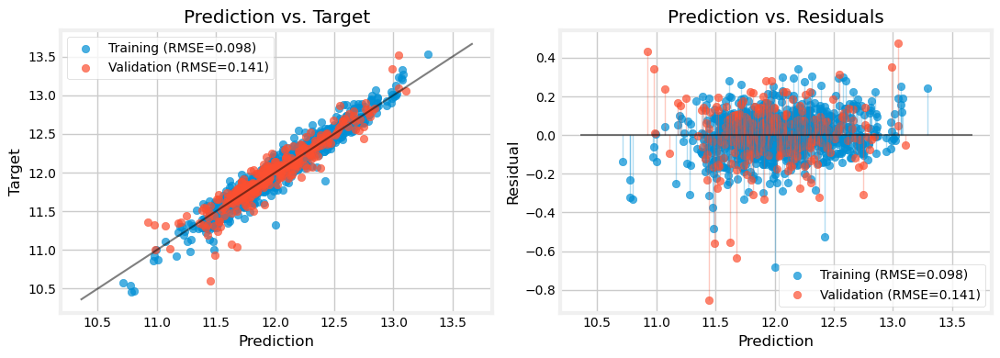



****************************************************************************************************
Performing Permutation Importance:
..................................................
The model's features are:

['pca0', 'pca2', 'AllBaths', 'pca12', 'pca1', 'pca18', 'pca10', 'pca8', 'BathsAbvGr', 'pca14', 'pca3', 'pca7', 'pca11', 'pca6', 'pca16', 'GarageType_5', 'pca9', 'pca5', 'Foundation_1', 'pca20', 'pca15', 'FullBath', 'GarageType_4', 'pca13', 'pca4', 'GarageType_1', 'GarageType_2', 'GarageType_3', 'GarageType_6', 'Foundation_2', 'Foundation_3', 'Foundation_4', 'Foundation_5', 'cluster_1', 'cluster_2', 'Has_Garage', 'Has_Bsmt', 'pca19', 'pca17']
The most important features are:

	pca0: 1.4691155735244075 +- 0.0824173600232811
	pca2: 0.04330480016675642 +- 0.006339900037396854
	AllBaths: 0.02188979618699538 +- 0.003974526293197254
	pca12: 0.006602292525132647 +- 0.0014089815713203518
	pca1: 0.00651473596773069 +- 0.0008492170396528565
	pca18: 0.005178718121248061 +- 0.0006353551

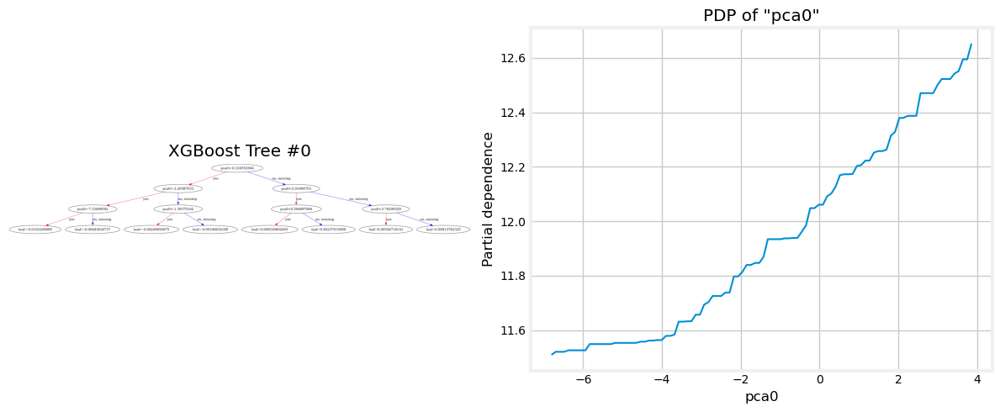

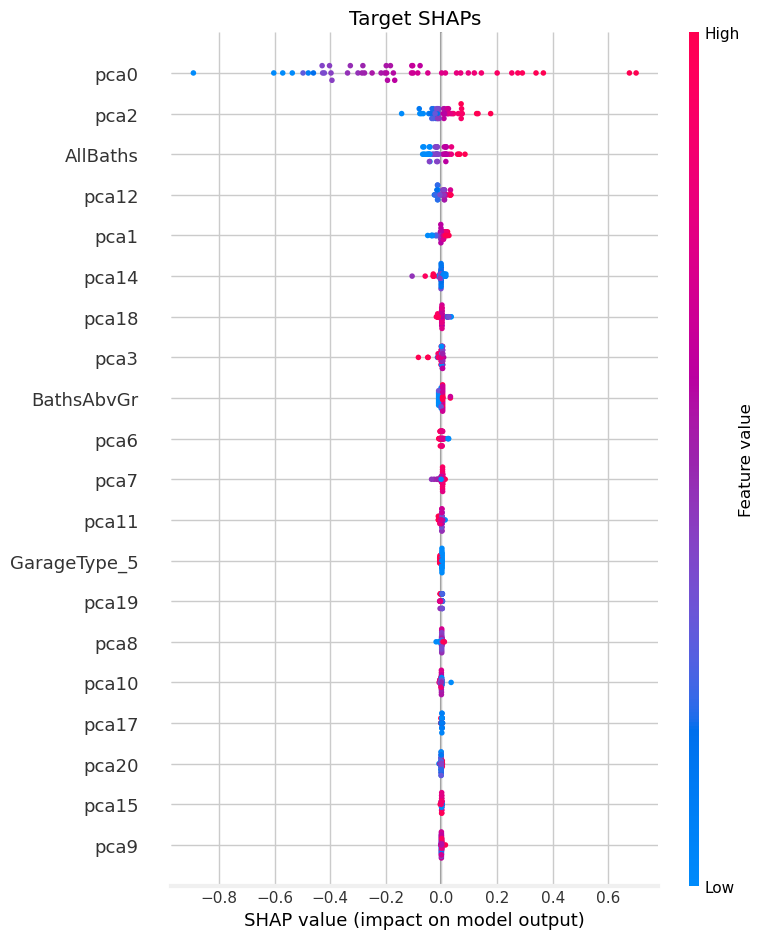

..................................................

Elapsed time: 39.55 minutes
..................................................





In [433]:
model = 'xgbr'
redoQ = True

for pp in ['raw', 'eng', 'clus']:

    if pp == 'raw':
        continue

    for cvQ in [False, True]:

        print(time.strftime("Time: %H:%M:%S"))
        start = time.time()

        model_name = model+'_'+pp # full model name

        if redoQ and (model_name in search.keys()):
            del search[model_name]

        print("*"*75)
        print(model_name, ", \tCV:", cvQ, "\n")
        print("*"*75)
        
        # # GridSearchCV
        # model_evaluation(model_name, (X_train, X_val, y_train, y_val),
        #                  perform_cv_randomized=(cvQ, False),
        #                  n_splits=5, n_repeats=2,
        #                  verbose=True, plots=True)
        # RandomizedSearchCV
        model_evaluation(model_name, (X_train, X_val, y_train, y_val),
                         perform_cv_randomized=(cvQ, True),
                         n_splits=5, n_repeats=2,
                         n_iter=2000,
                         verbose=True, plots=True)

        print("\n")

        # if cross-validating:
        if cvQ:
            # explaining model
            explain_model(model_name, best_cv[model_name]['pipe'], (X_train, X_val, y_train, y_val), tree_idx=0, random_state=0)

            # saving model
            model_path = "../models/"+model_name+".pkl"
            
            with open(model_path, "wb") as f:
                dill.dump(best_cv[model_name]['pipe'], f)
        
        # done!!
        
        end = time.time()

        print("."*50)
        print(f"\nElapsed time: {(end-start)/60:.2f} minutes")
        print("."*50)

        print("\n\n")

In [434]:
scorecard

,dtr_base_no_cv,dtr_eng_no_cv,dtr_eng_cv,dtr_clus_no_cv,dtr_clus_cv,rfr_eng_no_cv,rfr_eng_cv,rfr_clus_no_cv,rfr_clus_cv,xgbr_eng_no_cv,xgbr_eng_cv,xgbr_clus_no_cv,xgbr_clus_cv
R2 Score Train,1.000000,0.999955,0.930213,0.999961,0.876380,0.982749,0.982821,0.982524,0.982262,0.998403,0.977811,0.999619,0.938369
R2 Score Validation,0.673874,0.744735,0.836800,0.769110,0.841059,0.887390,0.890535,0.887616,0.884343,0.875854,0.893753,0.870324,0.885771
RMSE Train,0.000000,0.002631,0.104161,0.002464,0.138631,0.051788,0.051680,0.052124,0.052513,0.015757,0.058734,0.007693,0.097886
RMSE Validation,0.237910,0.210482,0.168298,0.200181,0.166087,0.139800,0.137834,0.139660,0.141679,0.146786,0.135793,0.150020,0.140802


#### Engineered Cluster Model: exploration

In the cluster model, checking selected engineering features (from which PCA and clusters are built)

In [435]:
model = 'xgbr'

In [436]:
best_cv[model+'_clus']

{'pipe': Pipeline(steps=[('preprocessor',
                  Pipeline(steps=[('cleaning',
                                   Pipeline(steps=[('custom_imputer',
                                                    CustomImputer(groupby_cols={'BsmtCond': ['BsmtExposure',
                                                                                             'BsmtQual'],
                                                                                'BsmtExposure': ['BsmtQual',
                                                                                                 'BsmtCond'],
                                                                                'BsmtFinType2': ['BsmtQual',
                                                                                                 'BsmtCond'],
                                                                                'BsmtQual': ['BsmtCond',
                                                                                   

In [437]:
best_cv[model+'_clus']['params']

{'model__learning_rate': np.float64(0.011513204671077814),
 'model__max_depth': 3,
 'model__n_estimators': 700,
 'preprocessor__cluster__n_clusters': 3,
 'preprocessor__pca__fit_feat_subset': True,
 'preprocessor__pca__keep_original_feats': False,
 'preprocessor__selector__best_k': 30,
 'preprocessor__selector__t_thr': np.float64(0.11466851731822568),
 'preprocessor__target_encoder__smoothing': np.float64(37.97301184769338)}

In [438]:
best_cv[model+'_clus']['pipe'].steps

[('preprocessor',
  Pipeline(steps=[('cleaning',
                   Pipeline(steps=[('custom_imputer',
                                    CustomImputer(groupby_cols={'BsmtCond': ['BsmtExposure',
                                                                             'BsmtQual'],
                                                                'BsmtExposure': ['BsmtQual',
                                                                                 'BsmtCond'],
                                                                'BsmtFinType2': ['BsmtQual',
                                                                                 'BsmtCond'],
                                                                'BsmtQual': ['BsmtCond',
                                                                             'BsmtExposure'],
                                                                'Exterior1st': 'Foundation',
                                                                

In [439]:
best_preproc = best_cv[model+'_clus']['pipe'].steps[0][1] # the best preprocessor
best_feats = best_preproc[:-3] # all the preprocessor steps, except for PCA, KMeans clustering, and OHE
best_feats.transform(X_train)

,TotalSF,OverallQual,Neighborhood,1and2FlrSF,OverallQualCond,GarageCars,AllRooms,GarageArea,BathsAbvGr,YearBuilt,TotalBsmtSF,1stFlrSF,AllBaths,HouseAge,KitchenQual,ExterQual,BsmtQual,GarageAge,RemodAge,FullBath,MSSubClass,GarageFinish,FireplaceQu,GarageType,LotFrontage,Foundation,Has_Garage,Has_Bsmt
921,0.822593,-0.5,-1.035308,0.883605,0.0,-2.0,1.833333,-11.484445,1.0,-1.574468,0.474238,0.311465,3.0,0.589245,0.0,0.0,-1.0,2.212047,-0.250000,0.0,-0.832093,-2.0,-0.50,6,-0.152242,1,0,1
520,-1.637012,-1.0,-1.151422,-0.269679,-0.7,-2.0,0.166667,-11.484445,0.0,-1.574468,-14.082269,-0.975073,0.0,0.589245,0.0,0.0,-4.0,2.212047,-0.166667,0.0,-0.740263,-2.0,-0.50,6,-0.535329,0,0,0
401,0.120837,0.5,0.222998,-0.242979,0.0,0.0,-0.166667,-0.338266,0.0,0.659574,0.534128,0.373991,0.0,-1.484627,1.0,1.0,0.0,-1.453435,-0.361111,0.0,-0.037243,1.0,0.50,1,-0.257516,2,1,1
280,0.276629,0.5,0.086061,0.656817,0.7,0.0,0.333333,0.335169,0.5,0.319149,-0.451321,0.142984,0.5,-0.316879,1.0,1.0,0.0,-0.259602,0.111111,0.0,1.159018,1.0,0.25,1,0.550685,1,1,1
1401,-0.064737,0.0,0.107921,0.182014,-0.5,0.0,1.000000,-0.347564,0.5,0.638298,-0.372238,-0.509924,1.5,-1.009346,0.0,0.0,-1.0,-0.967537,-0.277778,0.0,1.124504,1.0,0.25,1,-0.421564,2,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
715,-0.083251,0.0,0.066275,-0.177629,-0.5,0.0,0.166667,-0.007748,0.0,0.000000,0.110991,0.437880,0.0,0.014612,0.0,0.0,0.0,0.079295,0.583333,0.0,0.008586,0.0,0.25,1,0.376507,1,1,1
905,-0.408079,-0.5,-0.777002,-0.696887,-1.0,-1.0,-0.166667,-0.999541,-1.0,-0.425532,0.095638,-0.069767,0.0,0.252972,0.0,0.0,-1.0,0.322980,1.166667,-1.0,0.008586,0.0,-0.50,1,0.464671,1,1,1
1096,-0.503985,0.0,-1.310388,-0.169596,0.7,-2.0,0.000000,-11.484445,-0.5,-1.276596,-0.787573,-0.746216,-0.5,0.512449,1.0,0.0,-1.0,2.211783,-0.361111,-1.0,-0.282591,-2.0,-0.50,6,-0.535329,2,0,1
235,-1.319293,0.0,-0.950472,-0.858025,-1.7,-1.0,-0.666667,-1.108558,-0.5,-0.063830,-1.494787,-1.744221,-0.5,0.042657,0.0,0.0,-1.0,0.107966,0.638889,-1.0,-0.880826,-1.0,-0.50,5,-4.131663,1,1,1


In [440]:
best_preproc

,steps,"[('cleaning', ...), ('feature_engineer', ...), ...]"
,transform_input,None
,memory,None
,verbose,False
,steps,"[('custom_imputer', ...), ('rules_based_imputer', ...), ...]"
,transform_input,None
,memory,None
,verbose,False
,strategies,"{'Alley': 'NA', 'Electrical': 'mode', 'Exterior1st': 'group_mode', 'Exterior2nd': 'group_mode', ...}"
,groupby_cols,"{'BsmtCond': ['BsmtExposure', 'BsmtQual'], 'BsmtExposure': ['BsmtQual', 'BsmtCond'], 'BsmtFinType2': ['BsmtQual', 'BsmtCond'], 'BsmtQual': ['BsmtCond', 'BsmtExposure'], ...}"
,rules,"[{'column': 'MasVnrArea', 'condition': <function <la...x73b6680662a0>, 'value': 0.0}, {'column': 'MasVnrType', 'condition': <function <la...x73b668066660>, 'value': 'NA'}, ...]"


In [441]:
del best_preproc, best_feats

#### Cleanup

In [442]:
Out.clear()

for name in dir():
    if name.startswith('_') and name[1:].isdigit():
        del globals()[name]

### Model 4: `CatBoostRegressor`

In [541]:
model = 'catbr'

for pp in ['raw', 'eng', 'clus']:

    if pp == 'raw':
        continue

    model_name = model+'_'+pp # full model name

    preproc_pipe = clone(final_preproc[pp]) # preprocessing  pipeline

    pipe[model_name] =\
        Pipeline(steps=[('preprocessor', preproc_pipe),
                        ('model', CatBoostRegressor(random_state=0,
                                                thread_count=1,
                                                # logging_level='silent',
                                                verbose=False,
                                                allow_writing_files=False))])

    pipe[model_name+'_no_cv'] =\
        Pipeline(steps=[('preprocessor', preproc_pipe),
                        ('model', CatBoostRegressor(random_state=0,
                                                thread_count=1,
                                                # logging_level='silent',
                                                verbose=False,
                                                allow_writing_files=False))])

    
    # defining the hyperparameter grid
    # basic:
    param_grid[model_name] = {'preprocessor__target_encoder__smoothing':
                                  uniform(loc=1, scale=99),
                              'preprocessor__selector__best_k':
                                  list(range(10, 40, 10)),
                              'preprocessor__selector__t_thr':
                                  uniform(loc=0.1, scale=0.8)
                             }
    # if clustering:
    if pp == 'clus':
        param_grid[model_name]['preprocessor__pca__fit_feat_subset'] =\
                        [True]
        param_grid[model_name]['preprocessor__pca__keep_original_feats'] =\
            [False]
        param_grid[model_name]['preprocessor__cluster__n_clusters'] =\
            list(range(3,7))

    # proper to the model:
    param_grid[model_name]['model__iterations'] =\
        [100*i for i in range(1, 11)]
    param_grid[model_name]['model__learning_rate'] =\
        loguniform(1.e-2, 0.5)
    param_grid[model_name]['model__depth'] =\
        list(range(4,11))

Time: 14:04:34
***************************************************************************
catbr_eng , 	CV: False 

***************************************************************************
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
We will evaluate model=catbr_eng with standard validation.
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::

 -> Fitting the model
......Done!
 -> Making predictions
......Done!
 -> Creating Regression Reports
......Done!


Regression Report: Training
..................................................


,Value
Explained Variance,0.980425
R2,0.980425
MAE,0.041635
MSE,0.003043
RMSE,0.055165
MedAE,0.031725
MAPE,0.003471




Regression Report: Validation
..................................................


,Value
Explained Variance,0.892727
R2,0.892259
MAE,0.092152
MSE,0.018699
RMSE,0.136744
MedAE,0.069212
MAPE,0.007775



 -> Computing Scores
......Done!
**************************************************
Prediction and Residual Plots:


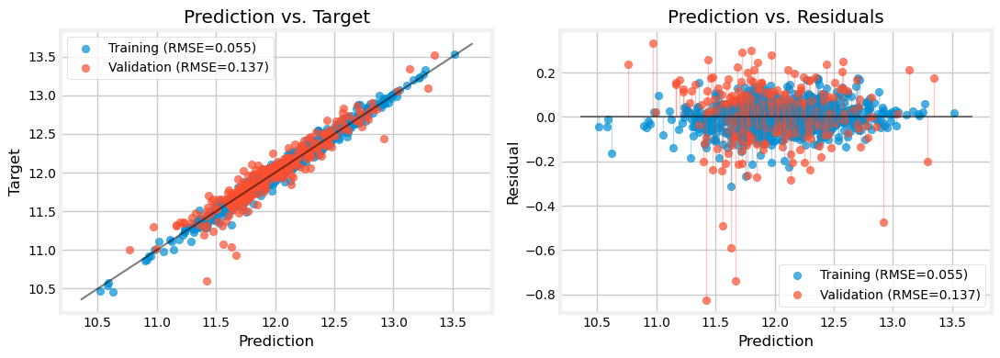



..................................................

Elapsed time: 0.04 minutes
..................................................



Time: 14:04:37
***************************************************************************
catbr_eng , 	CV: True 

***************************************************************************
We will evaluate catbr_eng with cross-validation.

 -> Creating instance of `RepeatedKFold`
......Done!
 -> Creating the CV search
......Done!

 -> Fitting the model
......Done!
 -> CV Results:
		best neg_root_mean_squared_error: -0.1293430830382303
		best params: {'model__depth': 7, 'model__iterations': 800, 'model__learning_rate': np.float64(0.025264072931726424), 'preprocessor__selector__best_k': 30, 'preprocessor__selector__t_thr': np.float64(0.12391781365126767), 'preprocessor__target_encoder__smoothing': np.float64(70.36588944209954)}
......Done!
 -> Making predictions
......Done!
 -> Creating Regression Reports
......Done!


Regression Report: Training
......

,Value
Explained Variance,0.977341
R2,0.977340
MAE,0.044505
MSE,0.003523
RMSE,0.059353
MedAE,0.034672
MAPE,0.003708




Regression Report: Validation
..................................................


,Value
Explained Variance,0.900862
R2,0.900858
MAE,0.086727
MSE,0.017207
RMSE,0.131174
MedAE,0.062402
MAPE,0.007297



 -> Computing Scores
......Done!
**************************************************
Prediction and Residual Plots:


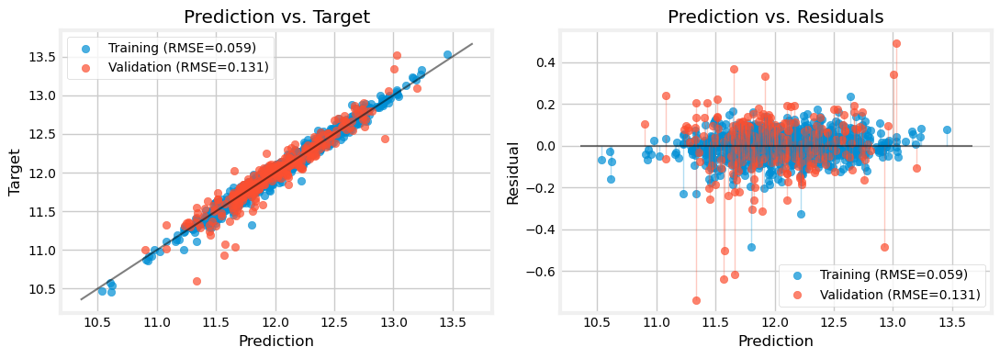



****************************************************************************************************
Performing Permutation Importance:
..................................................
The model's features are:

['TotalSF', 'OverallQualCond', 'Neighborhood', 'OverallQual', 'AllBaths', '1and2FlrSF', 'LotArea', 'RemodAge', 'FireplaceQu', 'KitchenQual', 'GarageCars', '1stFlrSF', 'YearBuilt', 'TotalBsmtSF', 'AllRooms', 'GarageFinish', 'GarageArea', 'BsmtQual', 'BathsAbvGr', 'HouseAge', 'MSSubClass', 'ExterQual', 'GarageAge', 'FullBath', 'Foundation_2', 'Has_Bsmt', 'Foundation_1', 'Foundation_3', 'Foundation_4', 'Foundation_5', 'Has_Garage', 'LotFrontage']
The most important features are:

	TotalSF: 0.10118711366600822 +- 0.009760653817273476
	OverallQualCond: 0.06086390672438278 +- 0.005804627978477946
	Neighborhood: 0.054257916788436035 +- 0.007266461827551442
	OverallQual: 0.03642443651678131 +- 0.007217280697573028
	AllBaths: 0.023494880855090394 +- 0.003080218612602388
	1and2FlrSF:

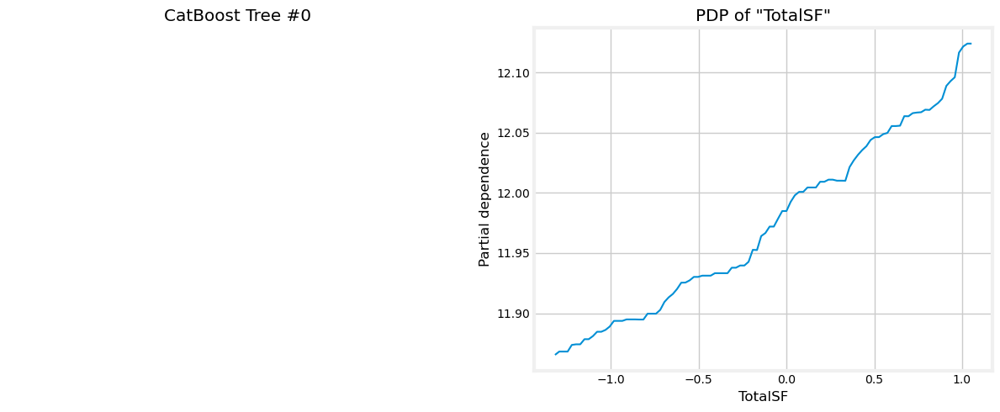

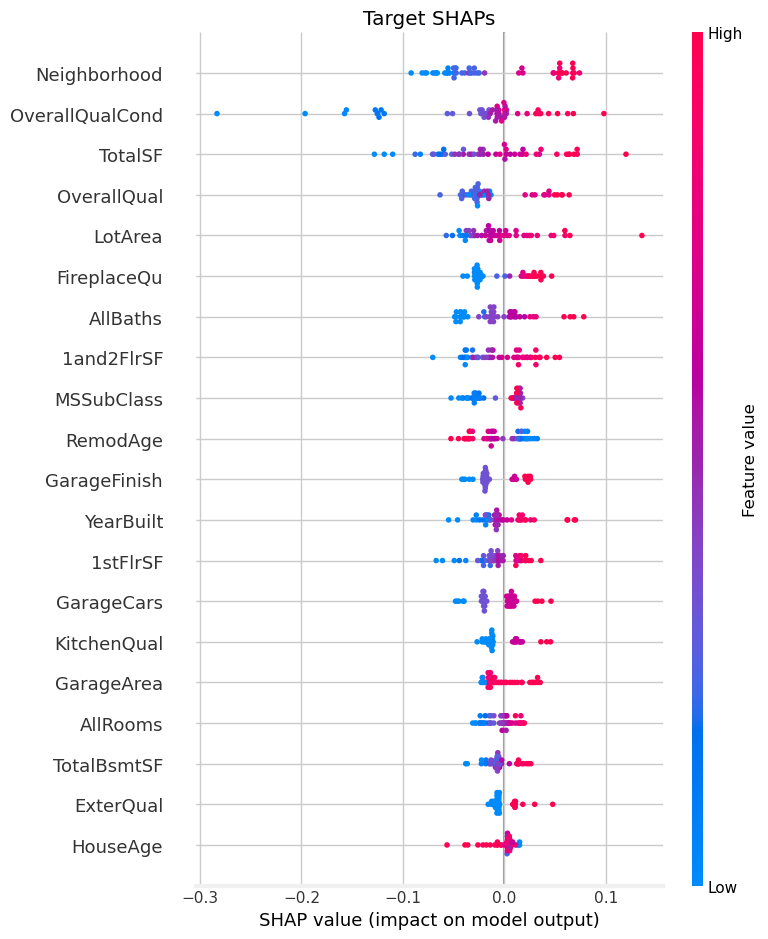

..................................................

Elapsed time: 16.84 minutes
..................................................



Time: 14:21:27
***************************************************************************
catbr_clus , 	CV: False 

***************************************************************************
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
We will evaluate model=catbr_clus with standard validation.
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::

 -> Fitting the model
......Done!
 -> Making predictions
......Done!
 -> Creating Regression Reports
......Done!


Regression Report: Training
..................................................


,Value
Explained Variance,0.985819
R2,0.985819
MAE,0.035651
MSE,0.002205
RMSE,0.046953
MedAE,0.028022
MAPE,0.002967




Regression Report: Validation
..................................................


,Value
Explained Variance,0.889305
R2,0.889230
MAE,0.095335
MSE,0.019225
RMSE,0.138653
MedAE,0.070040
MAPE,0.008046



 -> Computing Scores
......Done!
**************************************************
Prediction and Residual Plots:


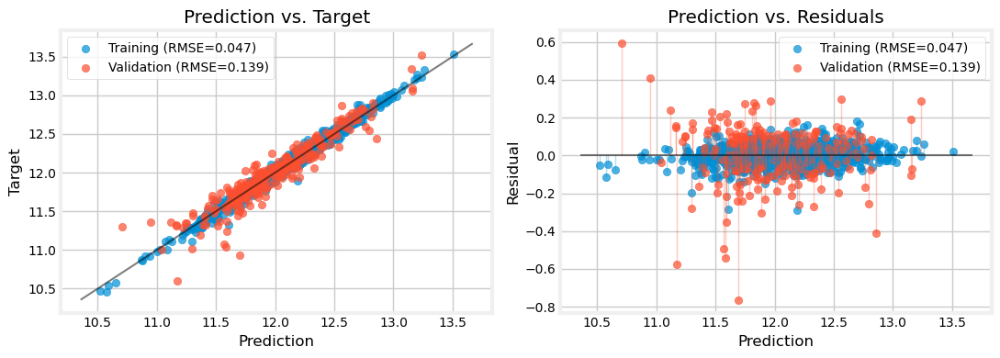



..................................................

Elapsed time: 0.04 minutes
..................................................



Time: 14:21:29
***************************************************************************
catbr_clus , 	CV: True 

***************************************************************************
We will evaluate catbr_clus with cross-validation.

 -> Creating instance of `RepeatedKFold`
......Done!
 -> Creating the CV search
......Done!

 -> Fitting the model
......Done!
 -> CV Results:
		best neg_root_mean_squared_error: -0.13787274907147337
		best params: {'model__depth': 4, 'model__iterations': 800, 'model__learning_rate': np.float64(0.05313727303518525), 'preprocessor__cluster__n_clusters': 3, 'preprocessor__pca__fit_feat_subset': True, 'preprocessor__pca__keep_original_feats': False, 'preprocessor__selector__best_k': 20, 'preprocessor__selector__t_thr': np.float64(0.2444350852014684), 'preprocessor__target_encoder__smoothing': np.float64(76.0536058020

,Value
Explained Variance,0.970693
R2,0.970693
MAE,0.050377
MSE,0.004556
RMSE,0.067500
MedAE,0.038317
MAPE,0.004194




Regression Report: Validation
..................................................


,Value
Explained Variance,0.892088
R2,0.892062
MAE,0.095580
MSE,0.018733
RMSE,0.136870
MedAE,0.064722
MAPE,0.008053



 -> Computing Scores
......Done!
**************************************************
Prediction and Residual Plots:


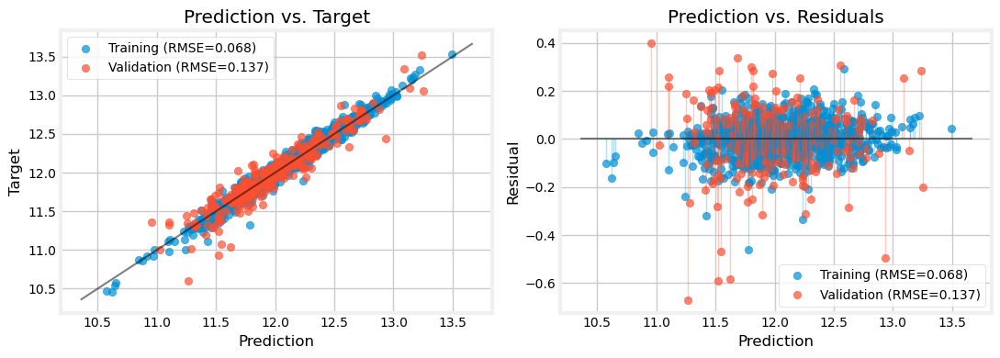



****************************************************************************************************
Performing Permutation Importance:
..................................................
The model's features are:

['pca0', 'pca2', 'AllBaths', 'pca7', 'pca12', 'pca4', 'pca9', 'BathsAbvGr', 'pca6', 'pca10', 'pca8', 'pca5', 'pca3', 'pca11', 'Has_Bsmt', 'cluster_1', 'pca1', 'cluster_2', 'Has_Garage']
The most important features are:

	pca0: 1.4306763882940143 +- 0.07606079859187445
	pca2: 0.034889102732319446 +- 0.003523486304368388
	AllBaths: 0.02521080206458981 +- 0.00312459393868072
	pca7: 0.01645417413034751 +- 0.004263505596508457
	pca12: 0.01313752584281378 +- 0.0011333750867836574
	pca4: 0.011889497956417094 +- 0.002082452344373263
	pca9: 0.010951449266292523 +- 0.002542484229352755
	BathsAbvGr: 0.010099786880583017 +- 0.004747927012807439
	pca6: 0.005852539556371816 +- 0.0011621019430511194
	pca10: 0.0028644841415876865 +- 0.0023444279440885266
	pca8: 0.0024470309497674593 +- 0.0

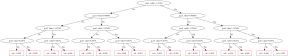

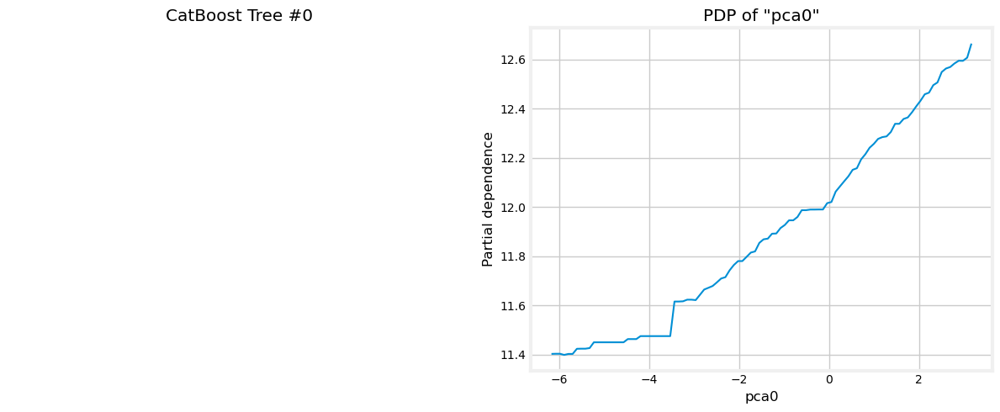

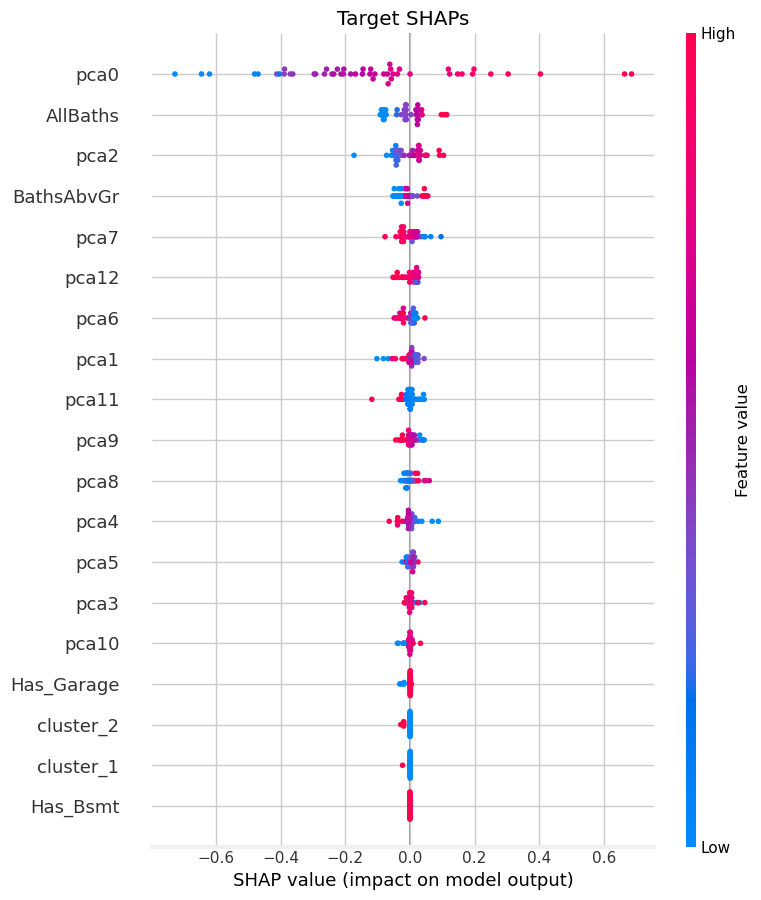

..................................................

Elapsed time: 24.78 minutes
..................................................





In [542]:
model = 'catbr'
redoQ = True

for pp in ['raw', 'eng', 'clus']:

    if pp == 'raw':
        continue

    for cvQ in [False, True]:

        print(time.strftime("Time: %H:%M:%S"))
        start = time.time()

        model_name = model+'_'+pp # full model name

        if redoQ and (model_name in search.keys()):
            del search[model_name]

        print("*"*75)
        print(model_name, ", \tCV:", cvQ, "\n")
        print("*"*75)
        
        # # GridSearchCV
        # model_evaluation(model_name, (X_train, X_val, y_train, y_val),
        #                  perform_cv_randomized=(cvQ, False),
        #                  n_splits=5, n_repeats=2,
        #                  verbose=True, plots=True)
        # RandomizedSearchCV
        model_evaluation(model_name, (X_train, X_val, y_train, y_val),
                         perform_cv_randomized=(cvQ, True),
                         n_splits=5, n_repeats=1,
                         n_iter=1000,
                         verbose=True, plots=True)

        print("\n")

        # if cross-validating:
        if cvQ:
            # explaining model
            explain_model(model_name, best_cv[model_name]['pipe'], (X_train, X_val, y_train, y_val), tree_idx=0, random_state=0)

            # saving model
            model_path = "../models/"+model_name+".pkl"
            
            with open(model_path, "wb") as f:
                dill.dump(best_cv[model_name]['pipe'], f)
        
        # done!!
        
        end = time.time()

        print("."*50)
        print(f"\nElapsed time: {(end-start)/60:.2f} minutes")
        print("."*50)

        print("\n\n")

In [543]:
scorecard

,dtr_base_no_cv,dtr_eng_no_cv,dtr_eng_cv,dtr_clus_no_cv,dtr_clus_cv,rfr_eng_no_cv,rfr_eng_cv,rfr_clus_no_cv,rfr_clus_cv,xgbr_eng_no_cv,xgbr_eng_cv,xgbr_clus_no_cv,xgbr_clus_cv,catbr_eng_no_cv,linreg_eng_no_cv,linreg_eng_cv,linreg_clus_no_cv,linreg_clus_cv,lasso_eng_no_cv,lasso_eng_cv,lasso_clus_no_cv,lasso_clus_cv,ridge_eng_no_cv,ridge_eng_cv,ridge_clus_no_cv,ridge_clus_cv,knn_eng_no_cv,knn_eng_cv,knn_clus_no_cv,knn_clus_cv,mlp_eng_no_cv,mlp_eng_cv,mlp_clus_no_cv,mlp_clus_cv,svr_eng_no_cv,svr_eng_cv,svr_clus_no_cv,svr_clus_cv,catbr_eng_cv,catbr_clus_no_cv,catbr_clus_cv
R2 Score Train,1.000000,0.999955,0.930213,0.999961,0.876380,0.982749,0.982821,0.982524,0.982262,0.998403,0.977811,0.999619,0.938369,0.980425,0.873561,0.885321,0.874522,0.885361,0.000000,0.884538,0.000000,0.880820,0.873315,0.882873,0.874513,0.883009,0.908603,0.999955,0.904808,0.999961,0.814484,0.849407,0.813874,0.858467,0.919967,0.908985,0.921573,0.915232,0.977340,0.985819,0.970693
R2 Score Validation,0.673874,0.744735,0.836800,0.769110,0.841059,0.887390,0.890535,0.887616,0.884343,0.875854,0.893753,0.870324,0.885771,0.892259,0.888219,0.898505,0.888482,0.898033,-0.013284,0.899378,-0.013284,0.895605,0.888403,0.897325,0.888441,0.896030,0.870421,0.872643,0.859241,0.857009,0.787413,0.851955,0.736705,0.825078,0.891774,0.898964,0.889083,0.899027,0.900858,0.889230,0.892062
RMSE Train,0.000000,0.002631,0.104161,0.002464,0.138631,0.051788,0.051680,0.052124,0.052513,0.015757,0.058734,0.007693,0.097886,0.055165,0.140203,0.133524,0.139669,0.133500,0.394291,0.133979,0.394291,0.136119,0.140340,0.134942,0.139674,0.134863,0.119202,0.002631,0.121651,0.002464,0.169828,0.153010,0.170107,0.148336,0.111545,0.118953,0.110420,0.114798,0.059353,0.046953,0.067500
RMSE Validation,0.237910,0.210482,0.168298,0.200181,0.166087,0.139800,0.137834,0.139660,0.141679,0.146786,0.135793,0.150020,0.140802,0.136744,0.139285,0.132722,0.139121,0.133030,0.419358,0.132149,0.419358,0.134604,0.139170,0.133491,0.139146,0.134330,0.149964,0.148673,0.156300,0.157534,0.192082,0.160294,0.213767,0.174237,0.137052,0.132421,0.138745,0.132380,0.131174,0.138653,0.136870


#### Engineered Cluster Model: exploration

In the cluster model, checking selected engineering features (from which PCA and clusters are built)

In [544]:
model = 'catbr'

In [545]:
best_cv[model+'_clus']

{'pipe': Pipeline(steps=[('preprocessor',
                  Pipeline(steps=[('cleaning',
                                   Pipeline(steps=[('custom_imputer',
                                                    CustomImputer(groupby_cols={'BsmtCond': ['BsmtExposure',
                                                                                             'BsmtQual'],
                                                                                'BsmtExposure': ['BsmtQual',
                                                                                                 'BsmtCond'],
                                                                                'BsmtFinType2': ['BsmtQual',
                                                                                                 'BsmtCond'],
                                                                                'BsmtQual': ['BsmtCond',
                                                                                   

In [546]:
best_cv[model+'_clus']['params']

{'model__depth': 4,
 'model__iterations': 800,
 'model__learning_rate': np.float64(0.05313727303518525),
 'preprocessor__cluster__n_clusters': 3,
 'preprocessor__pca__fit_feat_subset': True,
 'preprocessor__pca__keep_original_feats': False,
 'preprocessor__selector__best_k': 20,
 'preprocessor__selector__t_thr': np.float64(0.2444350852014684),
 'preprocessor__target_encoder__smoothing': np.float64(76.05360580204182)}

In [547]:
best_cv[model+'_clus']['pipe'].steps

[('preprocessor',
  Pipeline(steps=[('cleaning',
                   Pipeline(steps=[('custom_imputer',
                                    CustomImputer(groupby_cols={'BsmtCond': ['BsmtExposure',
                                                                             'BsmtQual'],
                                                                'BsmtExposure': ['BsmtQual',
                                                                                 'BsmtCond'],
                                                                'BsmtFinType2': ['BsmtQual',
                                                                                 'BsmtCond'],
                                                                'BsmtQual': ['BsmtCond',
                                                                             'BsmtExposure'],
                                                                'Exterior1st': 'Foundation',
                                                                

In [548]:
best_preproc = best_cv[model+'_clus']['pipe'].steps[0][1] # the best preprocessor
best_feats = best_preproc[:-3] # all the preprocessor steps, except for PCA, KMeans clustering, and OHE
best_feats.transform(X_train)

,TotalSF,OverallQual,Neighborhood,OverallQualCond,GarageCars,GarageArea,YearBuilt,BathsAbvGr,TotalBsmtSF,AllBaths,1stFlrSF,KitchenQual,BsmtQual,ExterQual,RemodAge,Has_Garage,Has_Bsmt
921,0.822593,-0.5,-1.024838,0.0,-2.0,-11.484445,-1.574468,1.0,0.474238,3.0,0.311465,0.0,-1.0,0.0,-0.250000,0,1
520,-1.637012,-1.0,-1.129448,-0.7,-2.0,-11.484445,-1.574468,0.0,-14.082269,0.0,-0.975073,0.0,-4.0,0.0,-0.166667,0,0
401,0.120837,0.5,0.188794,0.0,0.0,-0.338266,0.659574,0.0,0.534128,0.0,0.373991,1.0,0.0,1.0,-0.361111,1,1
280,0.276629,0.5,0.089162,0.7,0.0,0.335169,0.319149,0.5,-0.451321,0.5,0.142984,1.0,0.0,1.0,0.111111,1,1
1401,-0.064737,0.0,0.092368,-0.5,0.0,-0.347564,0.638298,0.5,-0.372238,1.5,-0.509924,0.0,-1.0,0.0,-0.277778,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
715,-0.083251,0.0,0.051085,-0.5,0.0,-0.007748,0.000000,0.0,0.110991,0.0,0.437880,0.0,0.0,0.0,0.583333,1,1
905,-0.408079,-0.5,-0.786533,-1.0,-1.0,-0.999541,-0.425532,-1.0,0.095638,0.0,-0.069767,0.0,-1.0,0.0,1.166667,1,1
1096,-0.503985,0.0,-1.494957,0.7,-2.0,-11.484445,-1.276596,-0.5,-0.787573,-0.5,-0.746216,1.0,-1.0,0.0,-0.361111,0,1
235,-1.319293,0.0,-1.145796,-1.7,-1.0,-1.108558,-0.063830,-0.5,-1.494787,-0.5,-1.744221,0.0,-1.0,0.0,0.638889,1,1


In [549]:
best_preproc

,steps,"[('cleaning', ...), ('feature_engineer', ...), ...]"
,transform_input,None
,memory,None
,verbose,False
,steps,"[('custom_imputer', ...), ('rules_based_imputer', ...), ...]"
,transform_input,None
,memory,None
,verbose,False
,strategies,"{'Alley': 'NA', 'Electrical': 'mode', 'Exterior1st': 'group_mode', 'Exterior2nd': 'group_mode', ...}"
,groupby_cols,"{'BsmtCond': ['BsmtExposure', 'BsmtQual'], 'BsmtExposure': ['BsmtQual', 'BsmtCond'], 'BsmtFinType2': ['BsmtQual', 'BsmtCond'], 'BsmtQual': ['BsmtCond', 'BsmtExposure'], ...}"
,rules,"[{'column': 'MasVnrArea', 'condition': <function <la...x73b6680662a0>, 'value': 0.0}, {'column': 'MasVnrType', 'condition': <function <la...x73b668066660>, 'value': 'NA'}, ...]"


In [550]:
del best_preproc, best_feats

#### Cleanup

In [551]:
Out.clear()

for name in dir():
    if name.startswith('_') and name[1:].isdigit():
        del globals()[name]

### Model 5: `LinearRegression`

In [454]:
model = 'linreg'

for pp in ['raw', 'eng', 'clus']:

    if pp == 'raw':
        continue

    model_name = model+'_'+pp # full model name

    preproc_pipe = clone(final_preproc[pp]) # preprocessing  pipeline

    pipe[model_name] = Pipeline(steps=[('preprocessor', preproc_pipe),
                                       ('model', LinearRegression(fit_intercept=True))])

    pipe[model_name+'_no_cv'] = Pipeline(steps=[('preprocessor', preproc_pipe),
                                       ('model', LinearRegression(fit_intercept=True))])


    # defining the hyperparameter grid
    # basic:
    param_grid[model_name] = {'preprocessor__target_encoder__smoothing':
                                  uniform(loc=1, scale=99),
                              'preprocessor__selector__best_k':
                                  list(range(10, 40, 10)),#+["all"]
                              # 'preprocessor__selector__t_thr':
                              #     list(np.arange(0.1, 0.7, 0.1))#+[None]
                              'preprocessor__selector__t_thr':
                                  uniform(loc=0.1, scale=0.8)
                             }
    # if clustering:
    if pp == 'clus':
        param_grid[model_name]['preprocessor__pca__fit_feat_subset'] =\
                        [True]
        param_grid[model_name]['preprocessor__pca__keep_original_feats'] =\
            [False]
        param_grid[model_name]['preprocessor__cluster__n_clusters'] =\
            list(range(3,7))

Time: 07:23:43
***************************************************************************
linreg_eng , 	CV: False 

***************************************************************************
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
We will evaluate model=linreg_eng with standard validation.
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::

 -> Fitting the model
......Done!
 -> Making predictions
......Done!
 -> Creating Regression Reports
......Done!


Regression Report: Training
..................................................


,Value
Explained Variance,0.873561
R2,0.873561
MAE,0.099200
MSE,0.019657
RMSE,0.140203
MedAE,0.073091
MAPE,0.008281




Regression Report: Validation
..................................................


,Value
Explained Variance,0.889052
R2,0.888219
MAE,0.102707
MSE,0.019400
RMSE,0.139285
MedAE,0.079491
MAPE,0.008633



 -> Computing Scores
......Done!
**************************************************
Prediction and Residual Plots:


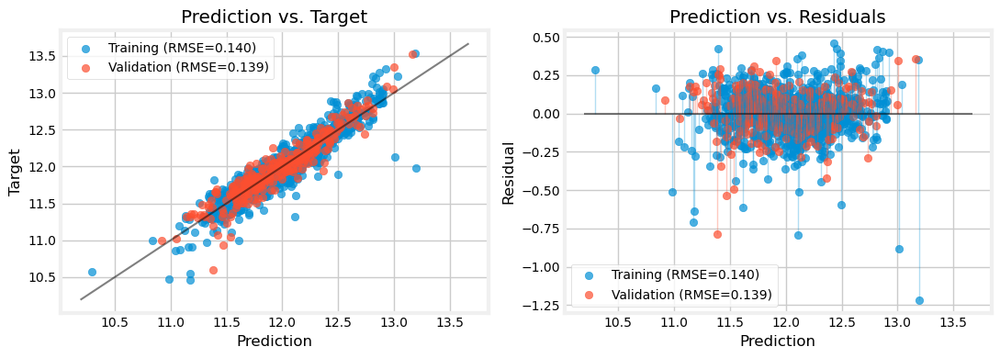



..................................................

Elapsed time: 0.03 minutes
..................................................



Time: 07:23:45
***************************************************************************
linreg_eng , 	CV: True 

***************************************************************************
We will evaluate linreg_eng with cross-validation.

 -> Creating instance of `RepeatedKFold`
......Done!
 -> Creating the CV search
......Done!

 -> Fitting the model
......Done!
 -> CV Results:
		best neg_root_mean_squared_error: -0.14657895782814517
		best params: {'preprocessor__selector__best_k': 30, 'preprocessor__selector__t_thr': np.float64(0.1738081363255466), 'preprocessor__target_encoder__smoothing': np.float64(91.1439275169529)}
......Done!
 -> Making predictions
......Done!
 -> Creating Regression Reports
......Done!


Regression Report: Training
..................................................


,Value
Explained Variance,0.885321
R2,0.885321
MAE,0.093145
MSE,0.017829
RMSE,0.133524
MedAE,0.069073
MAPE,0.007772




Regression Report: Validation
..................................................


,Value
Explained Variance,0.899294
R2,0.898505
MAE,0.096145
MSE,0.017615
RMSE,0.132722
MedAE,0.072887
MAPE,0.008080



 -> Computing Scores
......Done!
**************************************************
Prediction and Residual Plots:


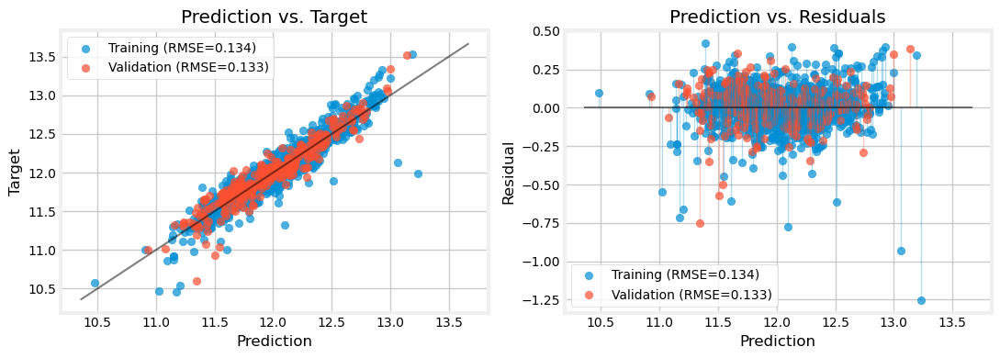



****************************************************************************************************
Performing Permutation Importance:
..................................................
The model's features are:

['TotalSF', 'OverallQualCond', 'Neighborhood', 'GarageType_1', 'GarageType_5', 'AllBaths', 'TotalBsmtSF', 'GarageCars', 'GarageType_3', 'FullBath', 'BsmtQual', 'FireplaceQu', 'Foundation_2', 'Foundation_1', '1stFlrSF', 'KitchenQual', 'MSSubClass', 'GarageType_6', 'Has_Garage', 'LotFrontage', 'YearBuilt', 'GarageFinish', 'RemodAge', 'GarageAge', 'AllRooms', 'Foundation_3', 'GarageArea', 'BathsAbvGr', 'ExterQual', 'GarageType_4', 'Foundation_4', 'Foundation_5', 'OverallQual', 'Has_Bsmt', 'GarageType_2']
The most important features are:

	TotalSF: 0.22466197123660434 +- 0.015070774178991145
	OverallQualCond: 0.09200933624074945 +- 0.00846699133359871
	Neighborhood: 0.0706485377304347 +- 0.005813258854947424
	GarageType_1: 0.04891518929328938 +- 0.003959530413152435
	GarageType

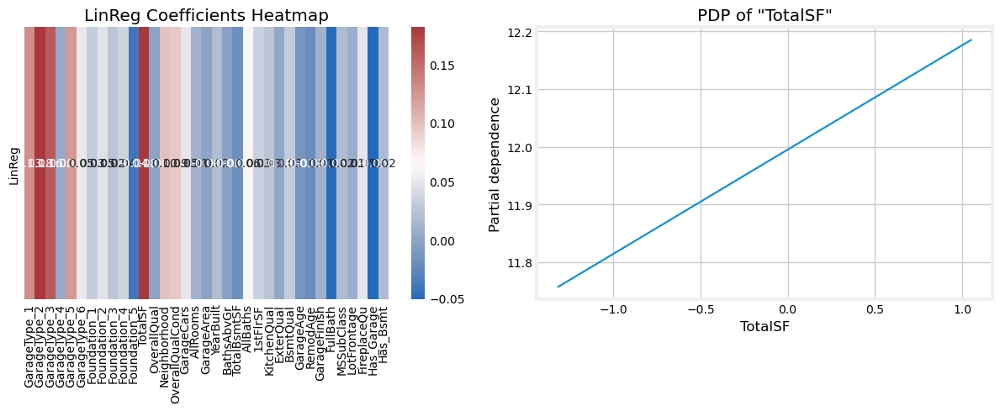

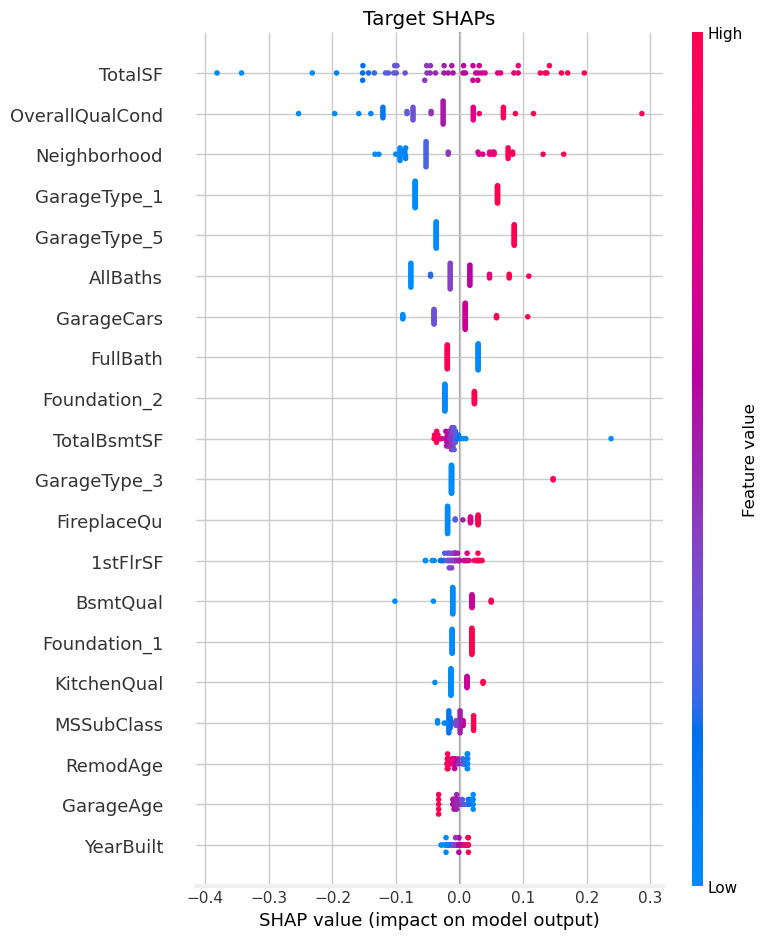

..................................................

Elapsed time: 22.29 minutes
..................................................



Time: 07:46:02
***************************************************************************
linreg_clus , 	CV: False 

***************************************************************************
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
We will evaluate model=linreg_clus with standard validation.
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::

 -> Fitting the model
......Done!
 -> Making predictions
......Done!
 -> Creating Regression Reports
......Done!


Regression Report: Training
..................................................


,Value
Explained Variance,0.874522
R2,0.874522
MAE,0.098736
MSE,0.019507
RMSE,0.139669
MedAE,0.073942
MAPE,0.008243




Regression Report: Validation
..................................................


,Value
Explained Variance,0.889356
R2,0.888482
MAE,0.102191
MSE,0.019355
RMSE,0.139121
MedAE,0.077923
MAPE,0.008593



 -> Computing Scores
......Done!
**************************************************
Prediction and Residual Plots:


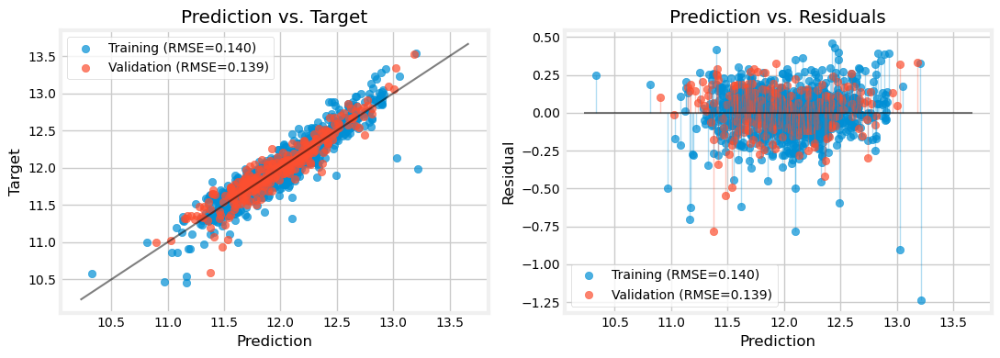



..................................................

Elapsed time: 0.03 minutes
..................................................



Time: 07:46:04
***************************************************************************
linreg_clus , 	CV: True 

***************************************************************************
We will evaluate linreg_clus with cross-validation.

 -> Creating instance of `RepeatedKFold`
......Done!
 -> Creating the CV search
......Done!

 -> Fitting the model
......Done!
 -> CV Results:
		best neg_root_mean_squared_error: -0.14636092011774587
		best params: {'preprocessor__cluster__n_clusters': 6, 'preprocessor__pca__fit_feat_subset': True, 'preprocessor__pca__keep_original_feats': False, 'preprocessor__selector__best_k': 30, 'preprocessor__selector__t_thr': np.float64(0.14613359704965154), 'preprocessor__target_encoder__smoothing': np.float64(62.023866649784566)}
......Done!
 -> Making predictions
......Done!
 -> Creating Regression Reports
......Done!


,Value
Explained Variance,0.885361
R2,0.885361
MAE,0.093077
MSE,0.017822
RMSE,0.133500
MedAE,0.069286
MAPE,0.007766




Regression Report: Validation
..................................................


,Value
Explained Variance,0.898874
R2,0.898033
MAE,0.096150
MSE,0.017697
RMSE,0.133030
MedAE,0.075625
MAPE,0.008081



 -> Computing Scores
......Done!
**************************************************
Prediction and Residual Plots:


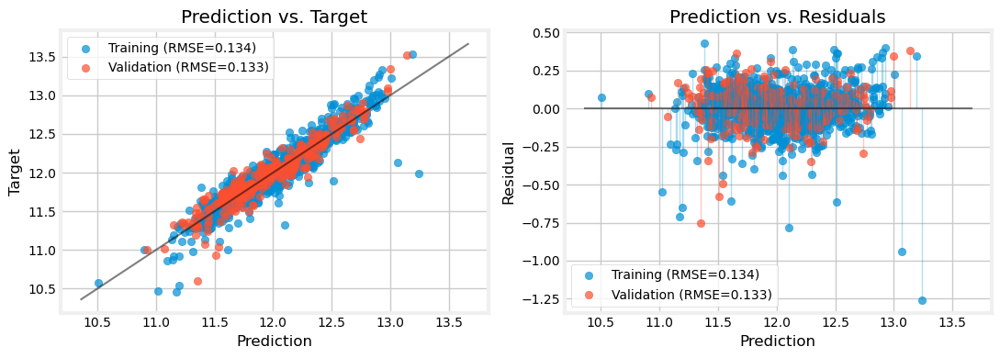



****************************************************************************************************
Performing Permutation Importance:
..................................................
The model's features are:

['pca0', 'GarageType_5', 'pca18', 'pca2', 'GarageType_1', 'pca6', 'AllBaths', 'GarageType_3', 'pca4', 'FullBath', 'pca8', 'pca11', 'cluster_5', 'pca15', 'Foundation_2', 'pca16', 'Foundation_1', 'pca17', 'pca10', 'Has_Garage', 'GarageType_6', 'cluster_1', 'pca5', 'pca1', 'pca9', 'GarageType_4', 'cluster_4', 'pca14', 'pca3', 'pca7', 'Foundation_3', 'BathsAbvGr', 'Has_Bsmt', 'pca12', 'cluster_2', 'Foundation_4', 'Foundation_5', 'pca13', 'cluster_3', 'GarageType_2']
The most important features are:

	pca0: 2.131225044144384 +- 0.14498409608949722
	GarageType_5: 0.10520341632348462 +- 0.004689076648013879
	pca18: 0.09592548832038647 +- 0.008324200064758435
	pca2: 0.0555482016272016 +- 0.004316644595128858
	GarageType_1: 0.05002912523975687 +- 0.004199686683968133
	pca6: 0.029729

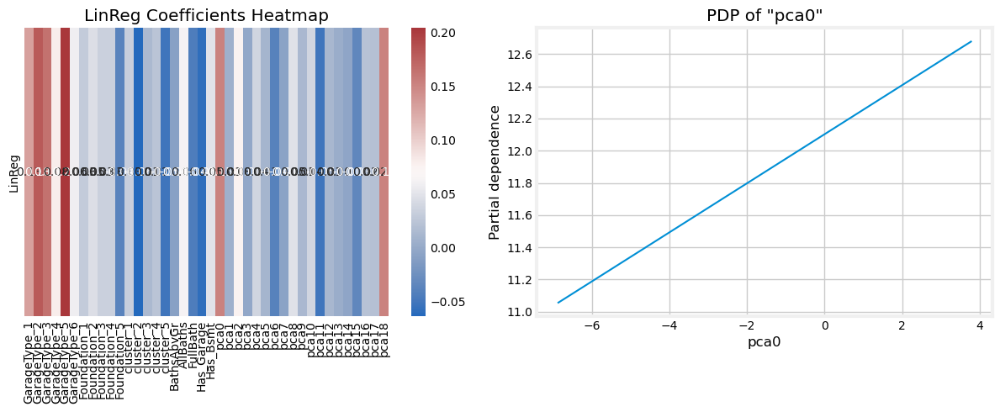

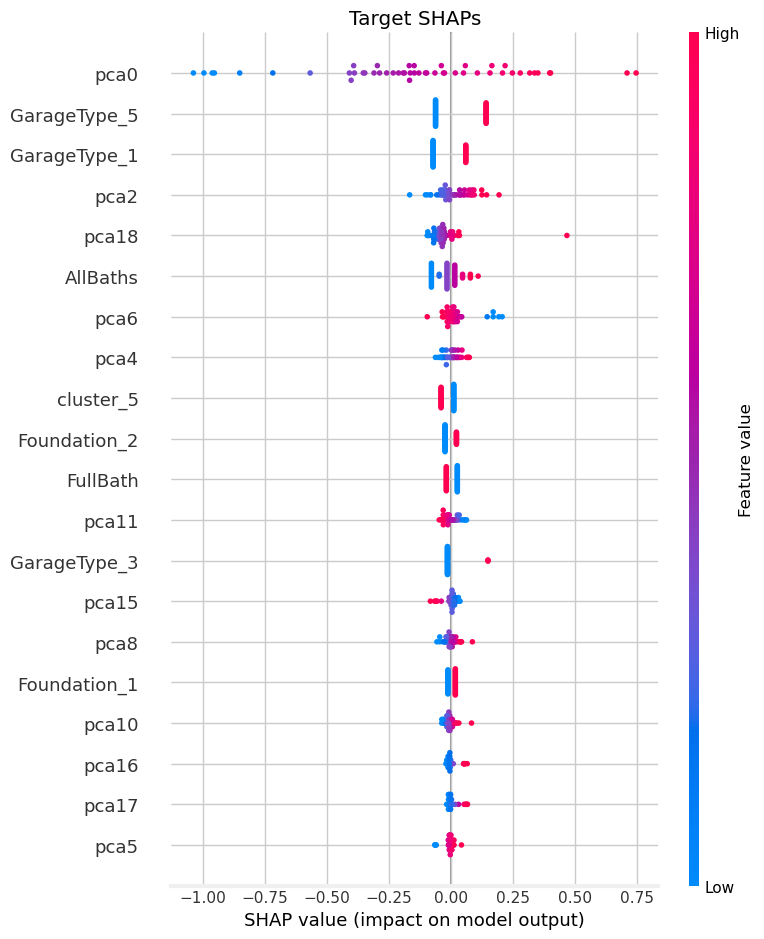

..................................................

Elapsed time: 23.78 minutes
..................................................





In [455]:
model = 'linreg'
redoQ = True

for pp in ['raw', 'eng', 'clus']:

    if pp == 'raw':
        continue
    
    for cvQ in [False, True]:

        print(time.strftime("Time: %H:%M:%S"))
        start = time.time()

        model_name = model+'_'+pp # full model name

        if redoQ and (model_name in search.keys()):
            del search[model_name]

        print("*"*75)
        print(model_name, ", \tCV:", cvQ, "\n")
        print("*"*75)
        
        # # GridSearchCV
        # model_evaluation(model_name, (X_train, X_val, y_train, y_val),
        #                  perform_cv_randomized=(cvQ, False),
        #                  n_splits=5, n_repeats=2,
        #                  verbose=True, plots=True)

        # RandomizedSearchCV
        model_evaluation(model_name, (X_train, X_val, y_train, y_val),
                         perform_cv_randomized=(cvQ, True),
                         n_splits=5, n_repeats=2,
                         n_iter=2000,
                         verbose=True, plots=True)

        print("\n")

        # if cross-validating:
        if cvQ:
            # explaining model
            explain_model(model_name, best_cv[model_name]['pipe'], (X_train, X_val, y_train, y_val), tree_idx=0, random_state=0)

            # saving model
            model_path = "../models/"+model_name+".pkl"
            
            with open(model_path, "wb") as f:
                dill.dump(best_cv[model_name]['pipe'], f)
        
        # done!!
        
        end = time.time()

        print("."*50)
        print(f"\nElapsed time: {(end-start)/60:.2f} minutes")
        print("."*50)

        print("\n\n")

In [456]:
scorecard

,dtr_base_no_cv,dtr_eng_no_cv,dtr_eng_cv,dtr_clus_no_cv,dtr_clus_cv,rfr_eng_no_cv,rfr_eng_cv,rfr_clus_no_cv,rfr_clus_cv,xgbr_eng_no_cv,xgbr_eng_cv,xgbr_clus_no_cv,xgbr_clus_cv,catbr_eng_no_cv,linreg_eng_no_cv,linreg_eng_cv,linreg_clus_no_cv,linreg_clus_cv
R2 Score Train,1.000000,0.999955,0.930213,0.999961,0.876380,0.982749,0.982821,0.982524,0.982262,0.998403,0.977811,0.999619,0.938369,0.980469,0.873561,0.885321,0.874522,0.885361
R2 Score Validation,0.673874,0.744735,0.836800,0.769110,0.841059,0.887390,0.890535,0.887616,0.884343,0.875854,0.893753,0.870324,0.885771,0.894647,0.888219,0.898505,0.888482,0.898033
RMSE Train,0.000000,0.002631,0.104161,0.002464,0.138631,0.051788,0.051680,0.052124,0.052513,0.015757,0.058734,0.007693,0.097886,0.055104,0.140203,0.133524,0.139669,0.133500
RMSE Validation,0.237910,0.210482,0.168298,0.200181,0.166087,0.139800,0.137834,0.139660,0.141679,0.146786,0.135793,0.150020,0.140802,0.135220,0.139285,0.132722,0.139121,0.133030


#### Engineered Cluster Model: exploration

In the cluster model, checking selected engineering features (from which PCA and clusters are built)

In [457]:
best_cv[model+'_clus']

{'pipe': Pipeline(steps=[('preprocessor',
                  Pipeline(steps=[('cleaning',
                                   Pipeline(steps=[('custom_imputer',
                                                    CustomImputer(groupby_cols={'BsmtCond': ['BsmtExposure',
                                                                                             'BsmtQual'],
                                                                                'BsmtExposure': ['BsmtQual',
                                                                                                 'BsmtCond'],
                                                                                'BsmtFinType2': ['BsmtQual',
                                                                                                 'BsmtCond'],
                                                                                'BsmtQual': ['BsmtCond',
                                                                                   

In [458]:
best_cv[model+'_clus']['params']

{'preprocessor__cluster__n_clusters': 6,
 'preprocessor__pca__fit_feat_subset': True,
 'preprocessor__pca__keep_original_feats': False,
 'preprocessor__selector__best_k': 30,
 'preprocessor__selector__t_thr': np.float64(0.14613359704965154),
 'preprocessor__target_encoder__smoothing': np.float64(62.023866649784566)}

In [459]:
best_cv[model+'_clus']['pipe'].steps

[('preprocessor',
  Pipeline(steps=[('cleaning',
                   Pipeline(steps=[('custom_imputer',
                                    CustomImputer(groupby_cols={'BsmtCond': ['BsmtExposure',
                                                                             'BsmtQual'],
                                                                'BsmtExposure': ['BsmtQual',
                                                                                 'BsmtCond'],
                                                                'BsmtFinType2': ['BsmtQual',
                                                                                 'BsmtCond'],
                                                                'BsmtQual': ['BsmtCond',
                                                                             'BsmtExposure'],
                                                                'Exterior1st': 'Foundation',
                                                                

In [460]:
best_preproc = best_cv[model+'_clus']['pipe'].steps[0][1] # the best preprocessor
best_feats = best_preproc[:-3] # all the preprocessor steps, except for PCA, KMeans clustering, and OHE
best_feats.transform(X_train)

,TotalSF,OverallQual,Neighborhood,OverallQualCond,GarageCars,AllRooms,GarageArea,BathsAbvGr,YearBuilt,TotalBsmtSF,1stFlrSF,AllBaths,ExterQual,BsmtQual,KitchenQual,RemodAge,GarageAge,FullBath,MSSubClass,GarageFinish,GarageType,FireplaceQu,LotFrontage,Foundation,Has_Garage,Has_Bsmt
921,0.822593,-0.5,-1.020174,0.0,-2.0,1.833333,-11.484445,1.0,-1.574468,0.474238,0.311465,3.0,0.0,-1.0,0.0,-0.250000,2.212047,0.0,-0.852234,-2.0,6,-0.50,-0.152242,1,0,1
520,-1.637012,-1.0,-1.127489,-0.7,-2.0,0.166667,-11.484445,0.0,-1.574468,-14.082269,-0.975073,0.0,0.0,-4.0,0.0,-0.166667,2.212047,0.0,-0.813607,-2.0,6,-0.50,-0.535329,0,0,0
401,0.120837,0.5,0.196832,0.0,0.0,-0.166667,-0.338266,0.0,0.659574,0.534128,0.373991,0.0,1.0,0.0,1.0,-0.361111,-1.453435,0.0,-0.040261,1.0,1,0.50,-0.257516,2,1,1
280,0.276629,0.5,0.084240,0.7,0.0,0.333333,0.335169,0.5,0.319149,-0.451321,0.142984,0.5,1.0,0.0,1.0,0.111111,-0.259602,0.0,1.182913,1.0,1,0.25,0.550685,1,1,1
1401,-0.064737,0.0,0.092458,-0.5,0.0,1.000000,-0.347564,0.5,0.638298,-0.372238,-0.509924,1.5,0.0,-1.0,0.0,-0.277778,-0.967537,0.0,1.155634,1.0,1,0.25,-0.421564,2,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
715,-0.083251,0.0,0.051529,-0.5,0.0,0.166667,-0.007748,0.0,0.000000,0.110991,0.437880,0.0,0.0,0.0,0.0,0.583333,0.079295,0.0,0.009235,0.0,1,0.25,0.376507,1,1,1
905,-0.408079,-0.5,-0.787941,-1.0,-1.0,-0.166667,-0.999541,-1.0,-0.425532,0.095638,-0.069767,0.0,0.0,-1.0,0.0,1.166667,0.322980,-1.0,0.009235,0.0,1,-0.50,0.464671,1,1,1
1096,-0.503985,0.0,-1.433941,0.7,-2.0,0.000000,-11.484445,-0.5,-1.276596,-0.787573,-0.746216,-0.5,0.0,-1.0,1.0,-0.361111,2.211783,-1.0,-0.296801,-2.0,6,-0.50,-0.535329,2,0,1
235,-1.319293,0.0,-1.086347,-1.7,-1.0,-0.666667,-1.108558,-0.5,-0.063830,-1.494787,-1.744221,-0.5,0.0,-1.0,0.0,0.638889,0.107966,-1.0,-0.899140,-1.0,5,-0.50,-4.131663,1,1,1


In [461]:
best_preproc

,steps,"[('cleaning', ...), ('feature_engineer', ...), ...]"
,transform_input,None
,memory,None
,verbose,False
,steps,"[('custom_imputer', ...), ('rules_based_imputer', ...), ...]"
,transform_input,None
,memory,None
,verbose,False
,strategies,"{'Alley': 'NA', 'Electrical': 'mode', 'Exterior1st': 'group_mode', 'Exterior2nd': 'group_mode', ...}"
,groupby_cols,"{'BsmtCond': ['BsmtExposure', 'BsmtQual'], 'BsmtExposure': ['BsmtQual', 'BsmtCond'], 'BsmtFinType2': ['BsmtQual', 'BsmtCond'], 'BsmtQual': ['BsmtCond', 'BsmtExposure'], ...}"
,rules,"[{'column': 'MasVnrArea', 'condition': <function <la...x73b6680662a0>, 'value': 0.0}, {'column': 'MasVnrType', 'condition': <function <la...x73b668066660>, 'value': 'NA'}, ...]"


In [462]:
del best_preproc, best_feats

#### Cleanup

In [463]:
Out.clear()

for name in dir():
    if name.startswith('_') and name[1:].isdigit():
        del globals()[name]

### Model 6: `Lasso`

In [464]:
model = 'lasso'

for pp in ['raw', 'eng', 'clus']:

    if pp == 'raw':
        continue

    model_name = model+'_'+pp # full model name

    preproc_pipe = clone(final_preproc[pp]) # preprocessing  pipeline

    pipe[model_name] =\
        Pipeline(steps=[('preprocessor', preproc_pipe),
                        ('model', Lasso(max_iter=10_000,
                                        fit_intercept=True,
                                        random_state=0))])

    pipe[model_name+'_no_cv'] =\
        Pipeline(steps=[('preprocessor', preproc_pipe),
                        ('model', Lasso(max_iter=10_000,
                                        fit_intercept=True,
                                        random_state=0))])

    # defining the hyperparameter grid
    # basic:
    param_grid[model_name] = {'preprocessor__target_encoder__smoothing':
                                  uniform(loc=1, scale=99),
                              'preprocessor__selector__best_k':
                                  list(range(10, 40, 10)),
                              'preprocessor__selector__t_thr':
                                  uniform(loc=0.1, scale=0.8)
                             }
    # if clustering:
    if pp == 'clus':
        param_grid[model_name]['preprocessor__pca__fit_feat_subset'] =\
                        [True]
        param_grid[model_name]['preprocessor__pca__keep_original_feats'] =\
            [False]
        param_grid[model_name]['preprocessor__cluster__n_clusters'] =\
            list(range(3,7))

    # proper to the model:
    param_grid[model_name]['model__alpha'] =\
        loguniform(1e-4, 10.)

Time: 08:09:51
***************************************************************************
lasso_eng , 	CV: False 

***************************************************************************
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
We will evaluate model=lasso_eng with standard validation.
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::

 -> Fitting the model
......Done!
 -> Making predictions
......Done!
 -> Creating Regression Reports
......Done!


Regression Report: Training
..................................................


,Value
Explained Variance,0.000000
R2,0.000000
MAE,0.306865
MSE,0.155466
RMSE,0.394291
MedAE,0.245204
MAPE,0.025514




Regression Report: Validation
..................................................


,Value
Explained Variance,0.000000
R2,-0.013284
MAE,0.324022
MSE,0.175861
RMSE,0.419358
MedAE,0.267729
MAPE,0.027110



 -> Computing Scores
......Done!
**************************************************
Prediction and Residual Plots:


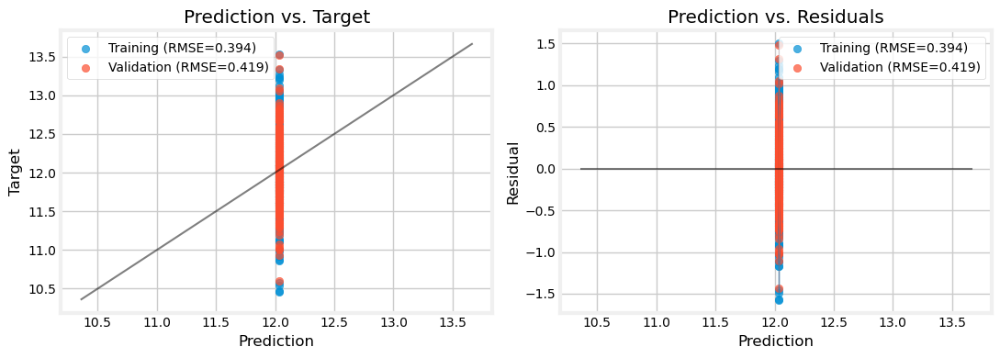



..................................................

Elapsed time: 0.04 minutes
..................................................



Time: 08:09:53
***************************************************************************
lasso_eng , 	CV: True 

***************************************************************************
We will evaluate lasso_eng with cross-validation.

 -> Creating instance of `RepeatedKFold`
......Done!
 -> Creating the CV search
......Done!

 -> Fitting the model
......Done!
 -> CV Results:
		best neg_root_mean_squared_error: -0.14851250719835887
		best params: {'model__alpha': np.float64(0.00027515526919431865), 'preprocessor__selector__best_k': 30, 'preprocessor__selector__t_thr': np.float64(0.15489670585647355), 'preprocessor__target_encoder__smoothing': np.float64(77.48761489818165)}
......Done!
 -> Making predictions
......Done!
 -> Creating Regression Reports
......Done!


Regression Report: Training
..................................................


,Value
Explained Variance,0.884538
R2,0.884538
MAE,0.093445
MSE,0.017950
RMSE,0.133979
MedAE,0.070361
MAPE,0.007797




Regression Report: Validation
..................................................


,Value
Explained Variance,0.900207
R2,0.899378
MAE,0.095349
MSE,0.017463
RMSE,0.132149
MedAE,0.072634
MAPE,0.008013



 -> Computing Scores
......Done!
**************************************************
Prediction and Residual Plots:


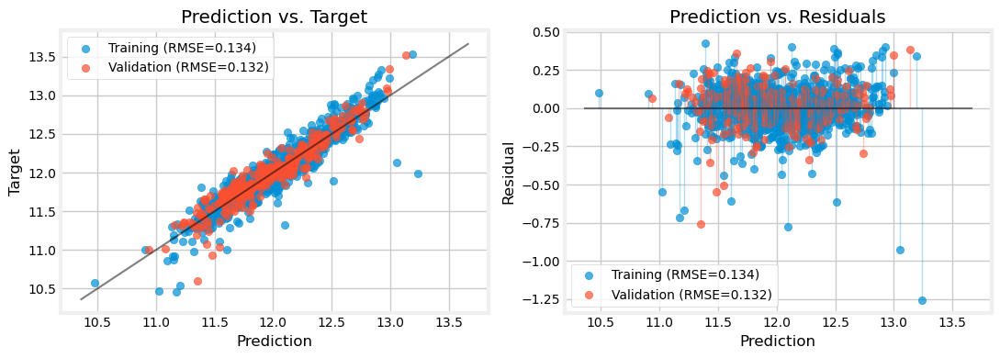



****************************************************************************************************
Performing Permutation Importance:
..................................................
The model's features are:

['TotalSF', 'OverallQualCond', 'Neighborhood', 'AllBaths', 'TotalBsmtSF', 'GarageCars', 'FullBath', 'FireplaceQu', 'BsmtQual', '1stFlrSF', 'KitchenQual', 'MSSubClass', 'Foundation_2', 'YearBuilt', 'Foundation_1', 'LotFrontage', 'GarageFinish', 'RemodAge', 'AllRooms', 'GarageAge', 'GarageType_4', 'GarageType_1', 'GarageArea', 'GarageType_3', 'ExterQual', 'GarageType_5', 'GarageType_6', 'Foundation_3', 'Foundation_4', 'Foundation_5', 'OverallQual', 'BathsAbvGr', 'Has_Garage', 'Has_Bsmt', 'GarageType_2']
The most important features are:

	TotalSF: 0.21389900301296158 +- 0.01494001345983421
	OverallQualCond: 0.09445721583593203 +- 0.008647809476650972
	Neighborhood: 0.0699437129046537 +- 0.006155557159380546
	AllBaths: 0.02630668476251914 +- 0.0026106203698668083
	TotalBsmtSF: 

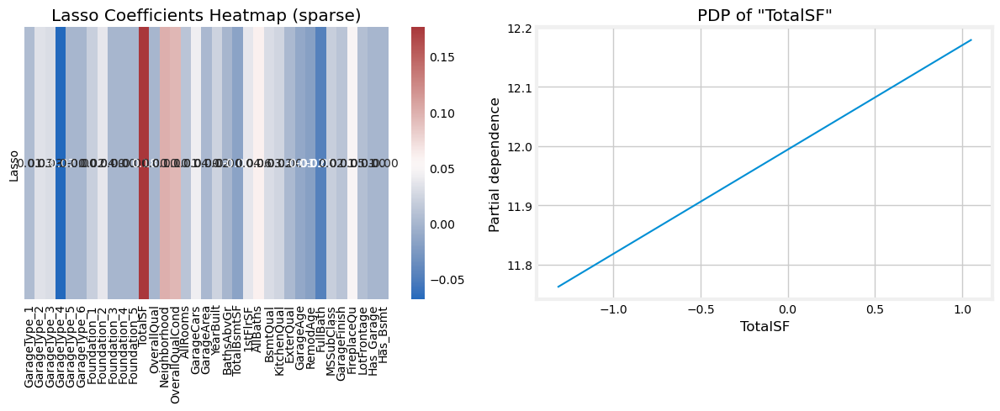

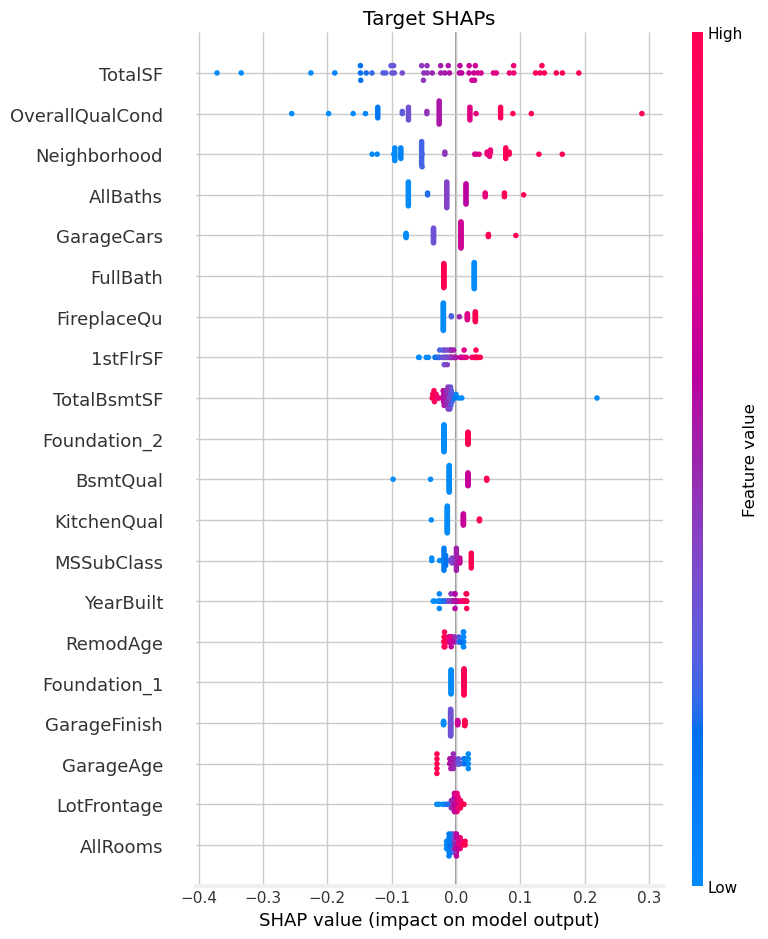

..................................................

Elapsed time: 22.34 minutes
..................................................



Time: 08:32:14
***************************************************************************
lasso_clus , 	CV: False 

***************************************************************************
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
We will evaluate model=lasso_clus with standard validation.
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::

 -> Fitting the model
......Done!
 -> Making predictions
......Done!
 -> Creating Regression Reports
......Done!


Regression Report: Training
..................................................


,Value
Explained Variance,0.000000
R2,0.000000
MAE,0.306865
MSE,0.155466
RMSE,0.394291
MedAE,0.245204
MAPE,0.025514




Regression Report: Validation
..................................................


,Value
Explained Variance,0.000000
R2,-0.013284
MAE,0.324022
MSE,0.175861
RMSE,0.419358
MedAE,0.267729
MAPE,0.027110



 -> Computing Scores
......Done!
**************************************************
Prediction and Residual Plots:


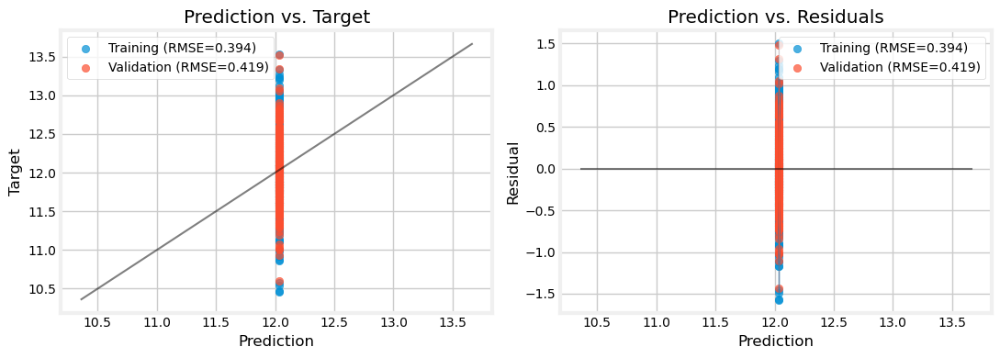



..................................................

Elapsed time: 0.03 minutes
..................................................



Time: 08:32:15
***************************************************************************
lasso_clus , 	CV: True 

***************************************************************************
We will evaluate lasso_clus with cross-validation.

 -> Creating instance of `RepeatedKFold`
......Done!
 -> Creating the CV search
......Done!

 -> Fitting the model
......Done!
 -> CV Results:
		best neg_root_mean_squared_error: -0.1467821244911129
		best params: {'model__alpha': np.float64(0.0023176321485867736), 'preprocessor__cluster__n_clusters': 3, 'preprocessor__pca__fit_feat_subset': True, 'preprocessor__pca__keep_original_feats': False, 'preprocessor__selector__best_k': 30, 'preprocessor__selector__t_thr': np.float64(0.12039787917383588), 'preprocessor__target_encoder__smoothing': np.float64(88.91632683635333)}
......Done!
 -> Making predictions
......Don

,Value
Explained Variance,0.880820
R2,0.880820
MAE,0.094862
MSE,0.018528
RMSE,0.136119
MedAE,0.072578
MAPE,0.007913




Regression Report: Validation
..................................................


,Value
Explained Variance,0.896322
R2,0.895605
MAE,0.095479
MSE,0.018118
RMSE,0.134604
MedAE,0.070152
MAPE,0.008024



 -> Computing Scores
......Done!
**************************************************
Prediction and Residual Plots:


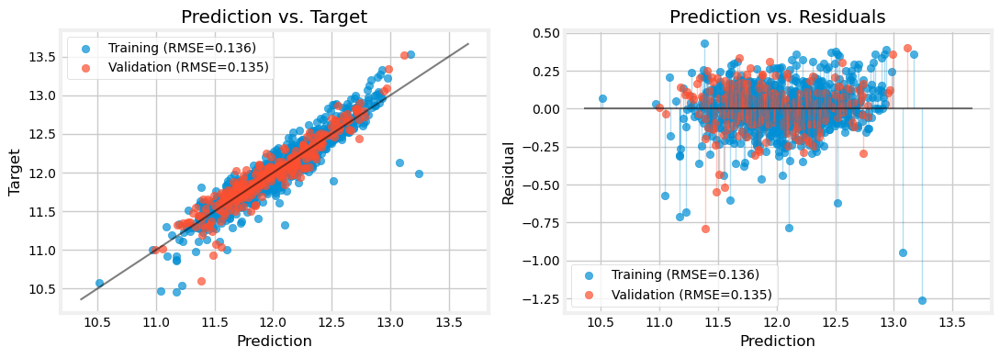



****************************************************************************************************
Performing Permutation Importance:
..................................................
The model's features are:

['pca0', 'pca2', 'AllBaths', 'pca6', 'pca17', 'pca1', 'pca20', 'pca8', 'pca7', 'pca12', 'pca18', 'pca3', 'FullBath', 'pca5', 'pca10', 'pca15', 'pca9', 'pca14', 'GarageType_1', 'GarageType_2', 'GarageType_3', 'GarageType_4', 'GarageType_5', 'GarageType_6', 'Foundation_1', 'Foundation_2', 'Foundation_3', 'Foundation_4', 'Foundation_5', 'cluster_1', 'cluster_2', 'BathsAbvGr', 'Has_Garage', 'Has_Bsmt', 'pca11', 'pca13', 'pca16', 'pca19', 'pca4']
The most important features are:

	pca0: 2.0475488927582113 +- 0.14255464770116644
	pca2: 0.04472089878190457 +- 0.004850007169126374
	AllBaths: 0.017095719619666983 +- 0.002118458638786145
	pca6: 0.01487188932789052 +- 0.003292829113302714
	pca17: 0.008836242841474329 +- 0.0029834184310020924
	pca1: 0.008090037926585403 +- 0.0009682051

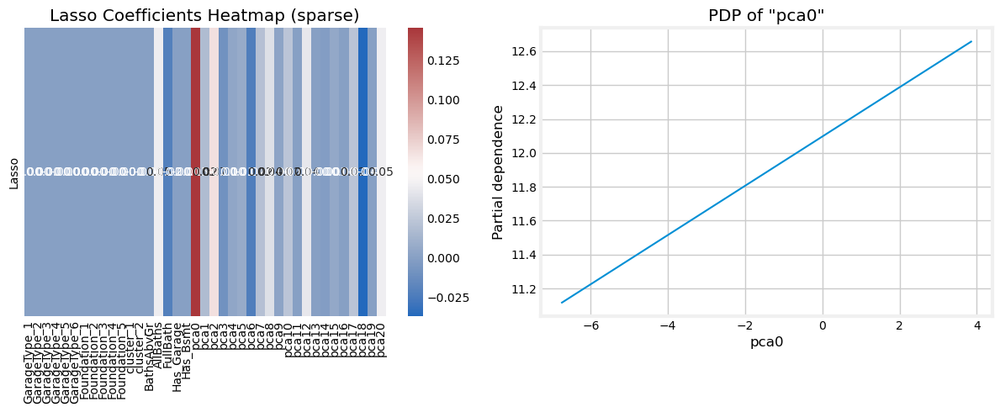

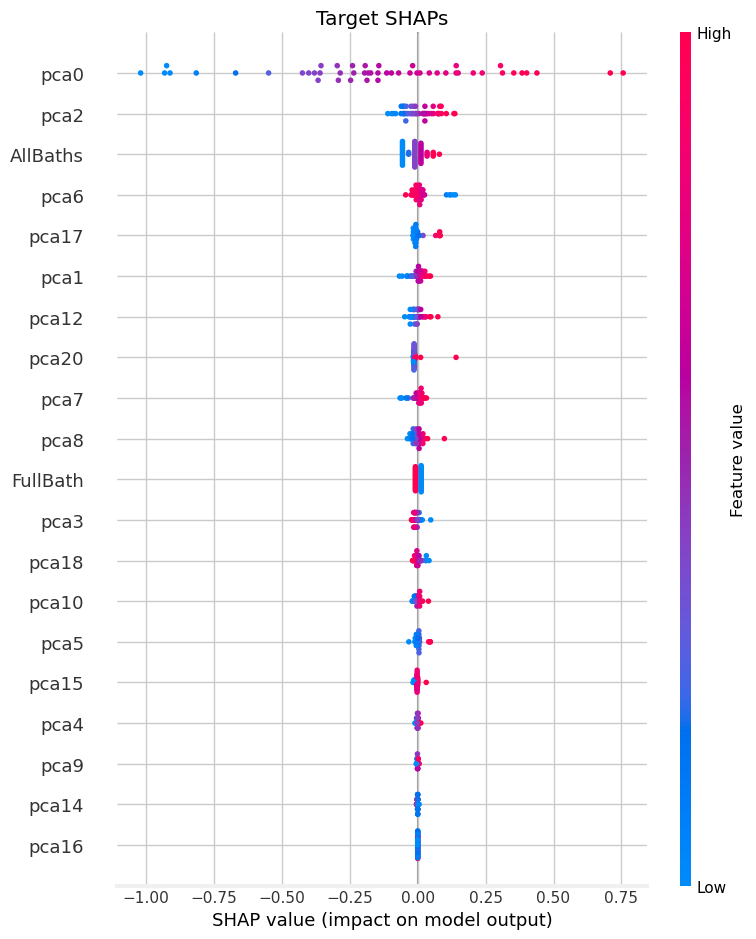

..................................................

Elapsed time: 23.42 minutes
..................................................





In [465]:
model = 'lasso'
redoQ = True

for pp in ['raw', 'eng', 'clus']:

    if pp == 'raw':
        continue
    
    for cvQ in [False, True]:

        print(time.strftime("Time: %H:%M:%S"))
        start = time.time()

        model_name = model+'_'+pp # full model name

        if redoQ and (model_name in search.keys()):
            del search[model_name]

        print("*"*75)
        print(model_name, ", \tCV:", cvQ, "\n")
        print("*"*75)
        
        # # GridSearchCV
        # model_evaluation(model_name, (X_train, X_val, y_train, y_val),
        #                  perform_cv_randomized=(cvQ, False),
        #                  n_splits=5, n_repeats=2,
        #                  verbose=True, plots=True)

        # RandomizedSearchCV
        model_evaluation(model_name, (X_train, X_val, y_train, y_val),
                         perform_cv_randomized=(cvQ, True),
                         n_splits=5, n_repeats=2,
                         n_iter=2000,
                         verbose=True, plots=True)

        print("\n")

        # if cross-validating:
        if cvQ:
            # explaining model
            explain_model(model_name, best_cv[model_name]['pipe'], (X_train, X_val, y_train, y_val), tree_idx=0, random_state=0)

            # saving model
            model_path = "../models/"+model_name+".pkl"
            
            with open(model_path, "wb") as f:
                dill.dump(best_cv[model_name]['pipe'], f)
        
        # done!!
        
        end = time.time()

        print("."*50)
        print(f"\nElapsed time: {(end-start)/60:.2f} minutes")
        print("."*50)

        print("\n\n")

In [466]:
scorecard

,dtr_base_no_cv,dtr_eng_no_cv,dtr_eng_cv,dtr_clus_no_cv,dtr_clus_cv,rfr_eng_no_cv,rfr_eng_cv,rfr_clus_no_cv,rfr_clus_cv,xgbr_eng_no_cv,xgbr_eng_cv,xgbr_clus_no_cv,xgbr_clus_cv,catbr_eng_no_cv,linreg_eng_no_cv,linreg_eng_cv,linreg_clus_no_cv,linreg_clus_cv,lasso_eng_no_cv,lasso_eng_cv,lasso_clus_no_cv,lasso_clus_cv
R2 Score Train,1.000000,0.999955,0.930213,0.999961,0.876380,0.982749,0.982821,0.982524,0.982262,0.998403,0.977811,0.999619,0.938369,0.980469,0.873561,0.885321,0.874522,0.885361,0.000000,0.884538,0.000000,0.880820
R2 Score Validation,0.673874,0.744735,0.836800,0.769110,0.841059,0.887390,0.890535,0.887616,0.884343,0.875854,0.893753,0.870324,0.885771,0.894647,0.888219,0.898505,0.888482,0.898033,-0.013284,0.899378,-0.013284,0.895605
RMSE Train,0.000000,0.002631,0.104161,0.002464,0.138631,0.051788,0.051680,0.052124,0.052513,0.015757,0.058734,0.007693,0.097886,0.055104,0.140203,0.133524,0.139669,0.133500,0.394291,0.133979,0.394291,0.136119
RMSE Validation,0.237910,0.210482,0.168298,0.200181,0.166087,0.139800,0.137834,0.139660,0.141679,0.146786,0.135793,0.150020,0.140802,0.135220,0.139285,0.132722,0.139121,0.133030,0.419358,0.132149,0.419358,0.134604


#### Engineered Cluster Model: exploration

In the cluster model, checking selected engineering features (from which PCA and clusters are built)

In [467]:
best_cv[model+'_clus']

{'pipe': Pipeline(steps=[('preprocessor',
                  Pipeline(steps=[('cleaning',
                                   Pipeline(steps=[('custom_imputer',
                                                    CustomImputer(groupby_cols={'BsmtCond': ['BsmtExposure',
                                                                                             'BsmtQual'],
                                                                                'BsmtExposure': ['BsmtQual',
                                                                                                 'BsmtCond'],
                                                                                'BsmtFinType2': ['BsmtQual',
                                                                                                 'BsmtCond'],
                                                                                'BsmtQual': ['BsmtCond',
                                                                                   

In [468]:
best_cv[model+'_clus']['params']

{'model__alpha': np.float64(0.0023176321485867736),
 'preprocessor__cluster__n_clusters': 3,
 'preprocessor__pca__fit_feat_subset': True,
 'preprocessor__pca__keep_original_feats': False,
 'preprocessor__selector__best_k': 30,
 'preprocessor__selector__t_thr': np.float64(0.12039787917383588),
 'preprocessor__target_encoder__smoothing': np.float64(88.91632683635333)}

In [469]:
best_cv[model+'_clus']['pipe'].steps

[('preprocessor',
  Pipeline(steps=[('cleaning',
                   Pipeline(steps=[('custom_imputer',
                                    CustomImputer(groupby_cols={'BsmtCond': ['BsmtExposure',
                                                                             'BsmtQual'],
                                                                'BsmtExposure': ['BsmtQual',
                                                                                 'BsmtCond'],
                                                                'BsmtFinType2': ['BsmtQual',
                                                                                 'BsmtCond'],
                                                                'BsmtQual': ['BsmtCond',
                                                                             'BsmtExposure'],
                                                                'Exterior1st': 'Foundation',
                                                                

In [470]:
best_preproc = best_cv[model+'_clus']['pipe'].steps[0][1] # the best preprocessor
best_feats = best_preproc[:-3] # all the preprocessor steps, except for PCA, KMeans clustering, and OHE
best_feats.transform(X_train)

,TotalSF,OverallQual,1and2FlrSF,Neighborhood,OverallQualCond,GarageCars,AllRooms,GarageArea,YearBuilt,BathsAbvGr,TotalBsmtSF,1stFlrSF,AllBaths,HouseAge,BsmtQual,KitchenQual,ExterQual,RemodAge,GarageAge,MSSubClass,GarageFinish,FullBath,GarageType,FireplaceQu,LotFrontage,Foundation,Has_Garage,Has_Bsmt
921,0.822593,-0.5,0.883605,-1.027288,0.0,-2.0,1.833333,-11.484445,-1.574468,1.0,0.474238,0.311465,3.0,0.589245,-1.0,0.0,0.0,-0.250000,2.212047,-0.862178,-2.0,0.0,6,-0.50,-0.152242,1,0,1
520,-1.637012,-1.0,-0.269679,-1.129699,-0.7,-2.0,0.166667,-11.484445,-1.574468,0.0,-14.082269,-0.975073,0.0,0.589245,-4.0,0.0,0.0,-0.166667,2.212047,-0.852897,-2.0,0.0,6,-0.50,-0.535329,0,0,0
401,0.120837,0.5,-0.242979,0.181615,0.0,0.0,-0.166667,-0.338266,0.659574,0.0,0.534128,0.373991,0.0,-1.484627,0.0,1.0,1.0,-0.361111,-1.453435,-0.041389,1.0,0.0,1,0.50,-0.257516,2,1,1
280,0.276629,0.5,0.656817,0.092584,0.7,0.0,0.333333,0.335169,0.319149,0.5,-0.451321,0.142984,0.5,-0.316879,0.0,1.0,1.0,0.111111,-0.259602,1.134083,1.0,0.0,1,0.25,0.550685,1,1,1
1401,-0.064737,0.0,0.182014,0.092223,-0.5,0.0,1.000000,-0.347564,0.638298,0.5,-0.372238,-0.509924,1.5,-1.009346,-1.0,0.0,0.0,-0.277778,-0.967537,1.113829,1.0,0.0,1,0.25,-0.421564,2,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
715,-0.083251,0.0,-0.177629,0.050717,-0.5,0.0,0.166667,-0.007748,0.000000,0.0,0.110991,0.437880,0.0,0.014612,0.0,0.0,0.0,0.583333,0.079295,0.009345,0.0,0.0,1,0.25,0.376507,1,1,1
905,-0.408079,-0.5,-0.696887,-0.780901,-1.0,-1.0,-0.166667,-0.999541,-0.425532,-1.0,0.095638,-0.069767,0.0,0.252972,-1.0,0.0,0.0,1.166667,0.322980,0.009345,0.0,-1.0,1,-0.50,0.464671,1,1,1
1096,-0.503985,0.0,-0.169596,-1.536803,0.7,-2.0,0.000000,-11.484445,-1.276596,-0.5,-0.787573,-0.746216,-0.5,0.512449,-1.0,1.0,0.0,-0.361111,2.211783,-0.301945,-2.0,-1.0,6,-0.50,-0.535329,2,0,1
235,-1.319293,0.0,-0.858025,-1.186621,-1.7,-1.0,-0.666667,-1.108558,-0.063830,-0.5,-1.494787,-1.744221,-0.5,0.042657,-1.0,0.0,0.0,0.638889,0.107966,-0.908121,-1.0,-1.0,5,-0.50,-4.131663,1,1,1


In [471]:
best_preproc

,steps,"[('cleaning', ...), ('feature_engineer', ...), ...]"
,transform_input,None
,memory,None
,verbose,False
,steps,"[('custom_imputer', ...), ('rules_based_imputer', ...), ...]"
,transform_input,None
,memory,None
,verbose,False
,strategies,"{'Alley': 'NA', 'Electrical': 'mode', 'Exterior1st': 'group_mode', 'Exterior2nd': 'group_mode', ...}"
,groupby_cols,"{'BsmtCond': ['BsmtExposure', 'BsmtQual'], 'BsmtExposure': ['BsmtQual', 'BsmtCond'], 'BsmtFinType2': ['BsmtQual', 'BsmtCond'], 'BsmtQual': ['BsmtCond', 'BsmtExposure'], ...}"
,rules,"[{'column': 'MasVnrArea', 'condition': <function <la...x73b6680662a0>, 'value': 0.0}, {'column': 'MasVnrType', 'condition': <function <la...x73b668066660>, 'value': 'NA'}, ...]"


In [472]:
del best_preproc, best_feats

#### Cleanup

In [473]:
Out.clear()

for name in dir():
    if name.startswith('_') and name[1:].isdigit():
        del globals()[name]

### Model 7: `Ridge`

In [474]:
model = 'ridge'

for pp in ['raw', 'eng', 'clus']:

    if pp == 'raw':
        continue

    model_name = model+'_'+pp # full model name

    preproc_pipe = clone(final_preproc[pp]) # preprocessing  pipeline

    pipe[model_name] =\
        Pipeline(steps=[('preprocessor', preproc_pipe),
                        ('model', Ridge(max_iter=10_000,
                                        fit_intercept=True,
                                        random_state=0))])

    pipe[model_name+'_no_cv'] =\
        Pipeline(steps=[('preprocessor', preproc_pipe),
                        ('model', Ridge(max_iter=10_000,
                                        fit_intercept=True,
                                        random_state=0))])

    # defining the hyperparameter grid
    # basic:
    param_grid[model_name] = {'preprocessor__target_encoder__smoothing':
                                  uniform(loc=1, scale=99),
                              'preprocessor__selector__best_k':
                                  list(range(10, 40, 10)),
                              'preprocessor__selector__t_thr':
                                  uniform(loc=0.1, scale=0.8)
                             }
    # if clustering:
    if pp == 'clus':
        param_grid[model_name]['preprocessor__pca__fit_feat_subset'] =\
                        [True]
        param_grid[model_name]['preprocessor__pca__keep_original_feats'] =\
            [False]
        param_grid[model_name]['preprocessor__cluster__n_clusters'] =\
            list(range(3,7))

    # proper to the model:
    param_grid[model_name]['model__alpha'] =\
        loguniform(1.e-4, 100.)

Time: 08:55:41
***************************************************************************
ridge_eng , 	CV: False 

***************************************************************************
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
We will evaluate model=ridge_eng with standard validation.
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::

 -> Fitting the model
......Done!
 -> Making predictions
......Done!
 -> Creating Regression Reports
......Done!


Regression Report: Training
..................................................


,Value
Explained Variance,0.873315
R2,0.873315
MAE,0.099260
MSE,0.019695
RMSE,0.140340
MedAE,0.072927
MAPE,0.008285




Regression Report: Validation
..................................................


,Value
Explained Variance,0.889276
R2,0.888403
MAE,0.103024
MSE,0.019368
RMSE,0.139170
MedAE,0.080437
MAPE,0.008659



 -> Computing Scores
......Done!
**************************************************
Prediction and Residual Plots:


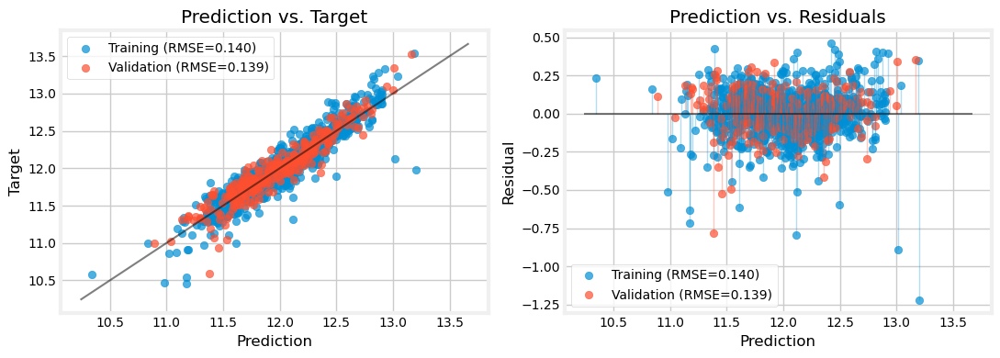



..................................................

Elapsed time: 0.03 minutes
..................................................



Time: 08:55:42
***************************************************************************
ridge_eng , 	CV: True 

***************************************************************************
We will evaluate ridge_eng with cross-validation.

 -> Creating instance of `RepeatedKFold`
......Done!
 -> Creating the CV search
......Done!

 -> Fitting the model
......Done!
 -> CV Results:
		best neg_root_mean_squared_error: -0.14627594114443146
		best params: {'model__alpha': np.float64(36.04760350495618), 'preprocessor__selector__best_k': 30, 'preprocessor__selector__t_thr': np.float64(0.12059537099989558), 'preprocessor__target_encoder__smoothing': np.float64(39.38904606015885)}
......Done!
 -> Making predictions
......Done!
 -> Creating Regression Reports
......Done!


Regression Report: Training
..................................................


,Value
Explained Variance,0.882873
R2,0.882873
MAE,0.093633
MSE,0.018209
RMSE,0.134942
MedAE,0.069774
MAPE,0.007810




Regression Report: Validation
..................................................


,Value
Explained Variance,0.898074
R2,0.897325
MAE,0.094949
MSE,0.017820
RMSE,0.133491
MedAE,0.071668
MAPE,0.007979



 -> Computing Scores
......Done!
**************************************************
Prediction and Residual Plots:


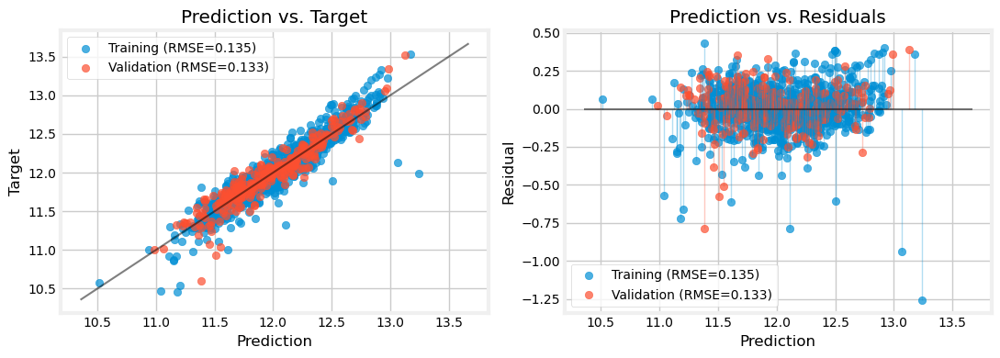



****************************************************************************************************
Performing Permutation Importance:
..................................................
The model's features are:

['OverallQualCond', 'Neighborhood', 'TotalSF', '1and2FlrSF', 'AllBaths', '1stFlrSF', 'GarageCars', 'FireplaceQu', 'BsmtQual', 'KitchenQual', 'MSSubClass', 'FullBath', 'LotFrontage', 'YearBuilt', 'OverallQual', 'GarageArea', 'GarageFinish', 'AllRooms', 'Foundation_2', 'RemodAge', 'Foundation_1', 'BathsAbvGr', 'HouseAge', 'ExterQual', 'TotalBsmtSF', 'GarageType_1', 'Has_Bsmt', 'GarageType_4', 'Foundation_3', 'GarageType_6', 'Has_Garage', 'Foundation_4', 'Foundation_5', 'GarageType_5', 'GarageAge', 'GarageType_3', 'GarageType_2']
The most important features are:

	OverallQualCond: 0.07934508940732743 +- 0.007780954473313318
	Neighborhood: 0.059020908682409966 +- 0.005829913234329506
	TotalSF: 0.05357596930036037 +- 0.005496799600197961
	1and2FlrSF: 0.023718157017568277 +- 0.00

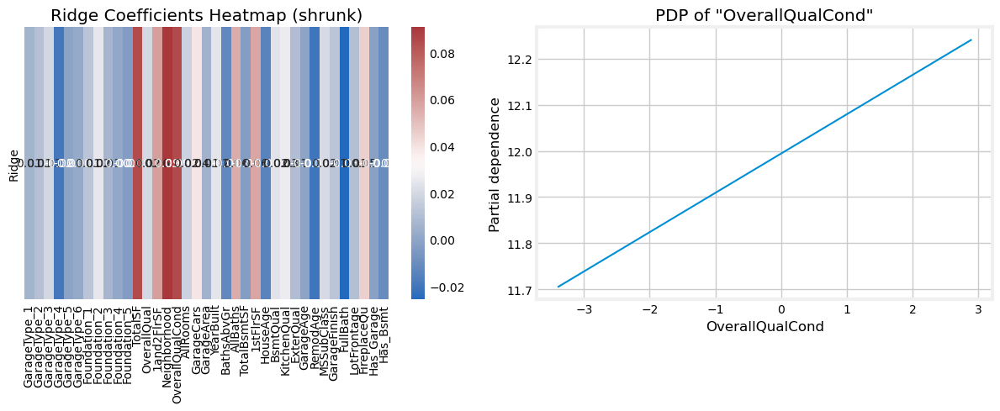

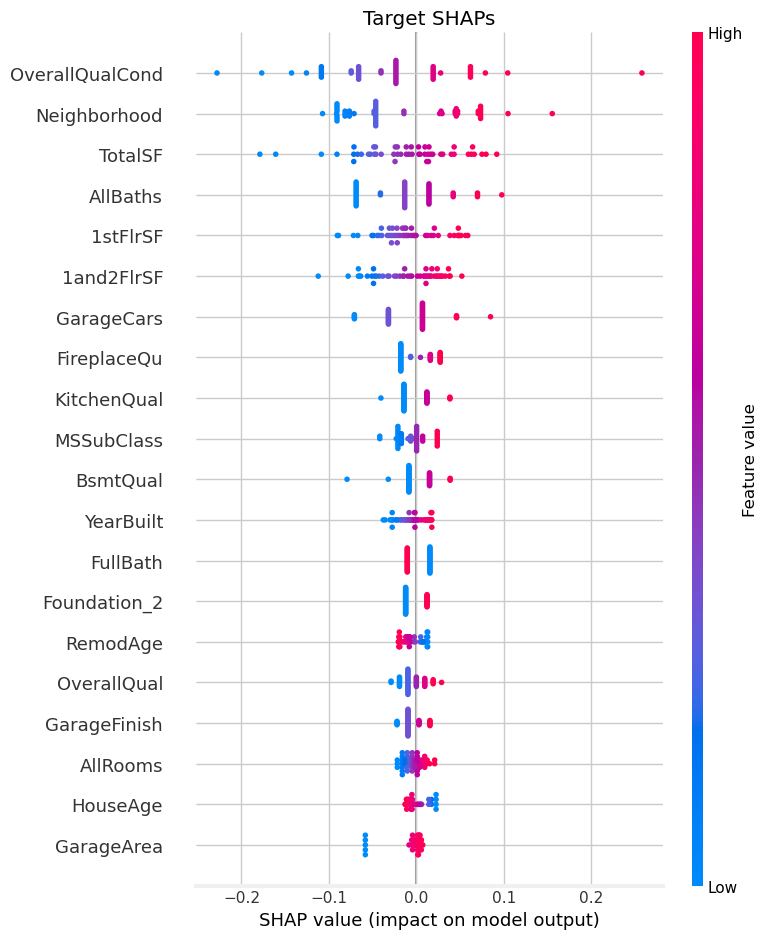

..................................................

Elapsed time: 22.03 minutes
..................................................



Time: 09:17:44
***************************************************************************
ridge_clus , 	CV: False 

***************************************************************************
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
We will evaluate model=ridge_clus with standard validation.
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::

 -> Fitting the model
......Done!
 -> Making predictions
......Done!
 -> Creating Regression Reports
......Done!


Regression Report: Training
..................................................


,Value
Explained Variance,0.874513
R2,0.874513
MAE,0.098776
MSE,0.019509
RMSE,0.139674
MedAE,0.073858
MAPE,0.008246




Regression Report: Validation
..................................................


,Value
Explained Variance,0.889315
R2,0.888441
MAE,0.102240
MSE,0.019362
RMSE,0.139146
MedAE,0.077611
MAPE,0.008597



 -> Computing Scores
......Done!
**************************************************
Prediction and Residual Plots:


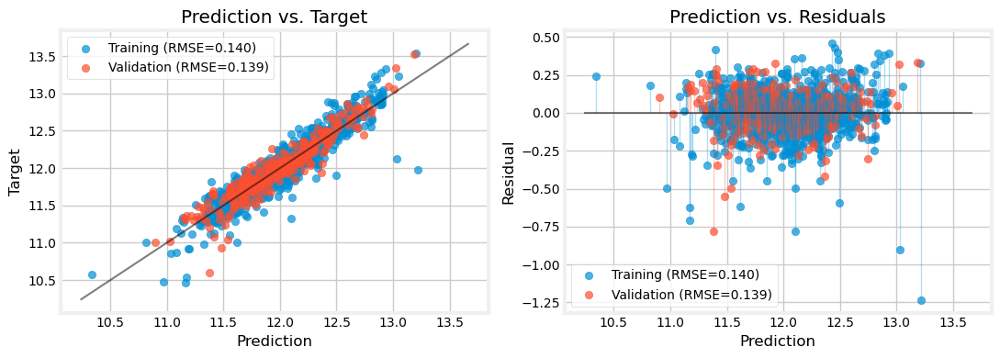



..................................................

Elapsed time: 0.04 minutes
..................................................



Time: 09:17:47
***************************************************************************
ridge_clus , 	CV: True 

***************************************************************************
We will evaluate ridge_clus with cross-validation.

 -> Creating instance of `RepeatedKFold`
......Done!
 -> Creating the CV search
......Done!

 -> Fitting the model
......Done!
 -> CV Results:
		best neg_root_mean_squared_error: -0.14563882559398497
		best params: {'model__alpha': np.float64(43.00288638408892), 'preprocessor__cluster__n_clusters': 4, 'preprocessor__pca__fit_feat_subset': True, 'preprocessor__pca__keep_original_feats': False, 'preprocessor__selector__best_k': 30, 'preprocessor__selector__t_thr': np.float64(0.12214146137152415), 'preprocessor__target_encoder__smoothing': np.float64(79.82314709196919)}
......Done!
 -> Making predictions
......Done!


,Value
Explained Variance,0.883009
R2,0.883009
MAE,0.093573
MSE,0.018188
RMSE,0.134863
MedAE,0.068976
MAPE,0.007805




Regression Report: Validation
..................................................


,Value
Explained Variance,0.896898
R2,0.896030
MAE,0.095571
MSE,0.018045
RMSE,0.134330
MedAE,0.071338
MAPE,0.008031



 -> Computing Scores
......Done!
**************************************************
Prediction and Residual Plots:


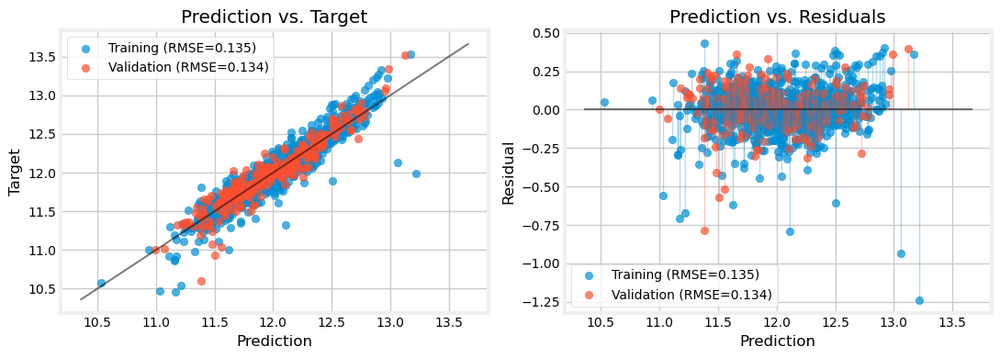



****************************************************************************************************
Performing Permutation Importance:
..................................................
The model's features are:

['pca0', 'pca2', 'pca4', 'AllBaths', 'pca17', 'pca1', 'pca8', 'pca6', 'pca7', 'pca18', 'FullBath', 'pca20', 'pca12', 'pca15', 'pca11', 'pca5', 'pca9', 'BathsAbvGr', 'pca10', 'cluster_2', 'GarageType_5', 'GarageType_4', 'cluster_1', 'Has_Bsmt', 'GarageType_6', 'Has_Garage', 'GarageType_1', 'pca19', 'pca16', 'pca13', 'GarageType_3', 'cluster_3', 'pca14', 'Has_2ndFlr', 'GarageType_2', 'pca3', 'pca21']
The most important features are:

	pca0: 1.6958826162996523 +- 0.12484121541032576
	pca2: 0.07135506632490703 +- 0.006751524737952988
	pca4: 0.02576527378014206 +- 0.0032459510856144244
	AllBaths: 0.022675831138081692 +- 0.002329219067682038
	pca17: 0.021136423168799913 +- 0.00373110428835015
	pca1: 0.019321887333568877 +- 0.001751867598707999
	pca8: 0.012763537315068874 +- 0.002

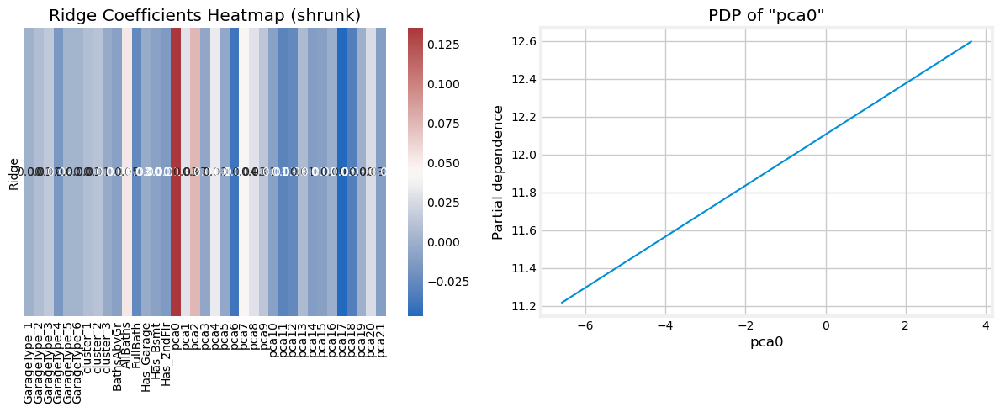

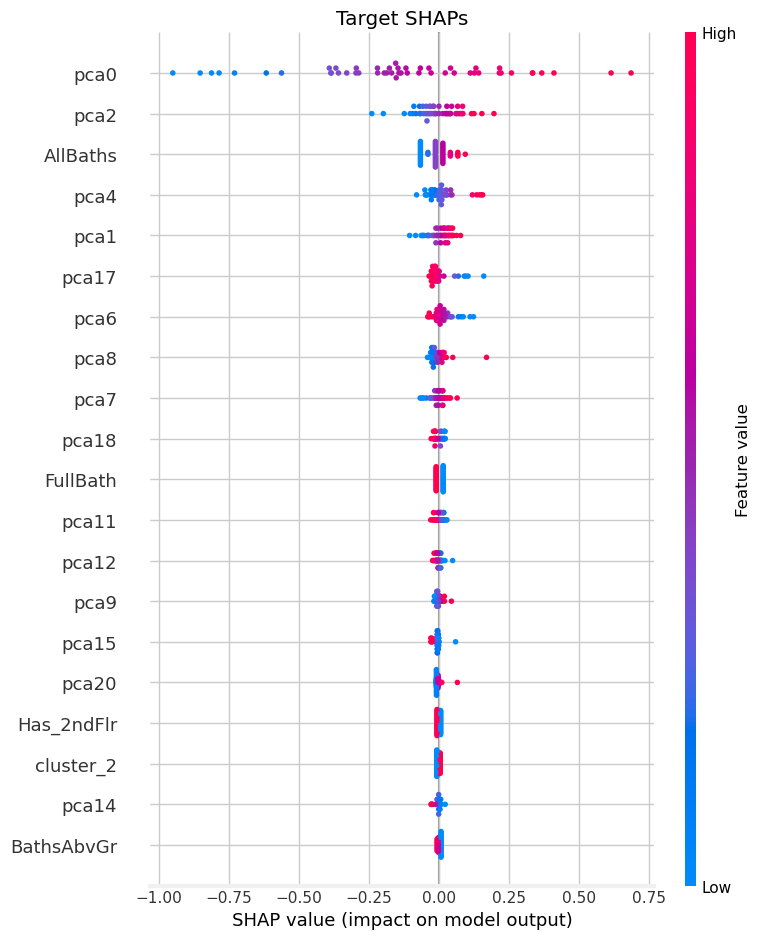

..................................................

Elapsed time: 24.90 minutes
..................................................





In [475]:
model = 'ridge'
redoQ = True

for pp in ['raw', 'eng', 'clus']:

    if pp == 'raw':
        continue
    
    for cvQ in [False, True]:

        print(time.strftime("Time: %H:%M:%S"))
        start = time.time()

        model_name = model+'_'+pp # full model name

        if redoQ and (model_name in search.keys()):
            del search[model_name]

        print("*"*75)
        print(model_name, ", \tCV:", cvQ, "\n")
        print("*"*75)
        
        # # GridSearchCV
        # model_evaluation(model_name, (X_train, X_val, y_train, y_val),
        #                  perform_cv_randomized=(cvQ, False),
        #                  n_splits=5, n_repeats=2,
        #                  verbose=True, plots=True)

        # RandomizedSearchCV
        model_evaluation(model_name, (X_train, X_val, y_train, y_val),
                         perform_cv_randomized=(cvQ, True),
                         n_splits=5, n_repeats=2,
                         n_iter=2000,
                         verbose=True, plots=True)

        print("\n")

        # if cross-validating:
        if cvQ:
            # explaining model
            explain_model(model_name, best_cv[model_name]['pipe'], (X_train, X_val, y_train, y_val), tree_idx=0, random_state=0)

            # saving model
            model_path = "../models/"+model_name+".pkl"
            
            with open(model_path, "wb") as f:
                dill.dump(best_cv[model_name]['pipe'], f)
        
        # done!!
        
        end = time.time()

        print("."*50)
        print(f"\nElapsed time: {(end-start)/60:.2f} minutes")
        print("."*50)

        print("\n\n")

In [476]:
scorecard

,dtr_base_no_cv,dtr_eng_no_cv,dtr_eng_cv,dtr_clus_no_cv,dtr_clus_cv,rfr_eng_no_cv,rfr_eng_cv,rfr_clus_no_cv,rfr_clus_cv,xgbr_eng_no_cv,xgbr_eng_cv,xgbr_clus_no_cv,xgbr_clus_cv,catbr_eng_no_cv,linreg_eng_no_cv,linreg_eng_cv,linreg_clus_no_cv,linreg_clus_cv,lasso_eng_no_cv,lasso_eng_cv,lasso_clus_no_cv,lasso_clus_cv,ridge_eng_no_cv,ridge_eng_cv,ridge_clus_no_cv,ridge_clus_cv
R2 Score Train,1.000000,0.999955,0.930213,0.999961,0.876380,0.982749,0.982821,0.982524,0.982262,0.998403,0.977811,0.999619,0.938369,0.980469,0.873561,0.885321,0.874522,0.885361,0.000000,0.884538,0.000000,0.880820,0.873315,0.882873,0.874513,0.883009
R2 Score Validation,0.673874,0.744735,0.836800,0.769110,0.841059,0.887390,0.890535,0.887616,0.884343,0.875854,0.893753,0.870324,0.885771,0.894647,0.888219,0.898505,0.888482,0.898033,-0.013284,0.899378,-0.013284,0.895605,0.888403,0.897325,0.888441,0.896030
RMSE Train,0.000000,0.002631,0.104161,0.002464,0.138631,0.051788,0.051680,0.052124,0.052513,0.015757,0.058734,0.007693,0.097886,0.055104,0.140203,0.133524,0.139669,0.133500,0.394291,0.133979,0.394291,0.136119,0.140340,0.134942,0.139674,0.134863
RMSE Validation,0.237910,0.210482,0.168298,0.200181,0.166087,0.139800,0.137834,0.139660,0.141679,0.146786,0.135793,0.150020,0.140802,0.135220,0.139285,0.132722,0.139121,0.133030,0.419358,0.132149,0.419358,0.134604,0.139170,0.133491,0.139146,0.134330


#### Engineered Cluster Model: exploration

In the cluster model, checking selected engineering features (from which PCA and clusters are built)

In [477]:
best_cv[model+'_clus']

{'pipe': Pipeline(steps=[('preprocessor',
                  Pipeline(steps=[('cleaning',
                                   Pipeline(steps=[('custom_imputer',
                                                    CustomImputer(groupby_cols={'BsmtCond': ['BsmtExposure',
                                                                                             'BsmtQual'],
                                                                                'BsmtExposure': ['BsmtQual',
                                                                                                 'BsmtCond'],
                                                                                'BsmtFinType2': ['BsmtQual',
                                                                                                 'BsmtCond'],
                                                                                'BsmtQual': ['BsmtCond',
                                                                                   

In [478]:
best_cv[model+'_clus']['params']

{'model__alpha': np.float64(43.00288638408892),
 'preprocessor__cluster__n_clusters': 4,
 'preprocessor__pca__fit_feat_subset': True,
 'preprocessor__pca__keep_original_feats': False,
 'preprocessor__selector__best_k': 30,
 'preprocessor__selector__t_thr': np.float64(0.12214146137152415),
 'preprocessor__target_encoder__smoothing': np.float64(79.82314709196919)}

In [479]:
best_cv[model+'_clus']['pipe'].steps

[('preprocessor',
  Pipeline(steps=[('cleaning',
                   Pipeline(steps=[('custom_imputer',
                                    CustomImputer(groupby_cols={'BsmtCond': ['BsmtExposure',
                                                                             'BsmtQual'],
                                                                'BsmtExposure': ['BsmtQual',
                                                                                 'BsmtCond'],
                                                                'BsmtFinType2': ['BsmtQual',
                                                                                 'BsmtCond'],
                                                                'BsmtQual': ['BsmtCond',
                                                                             'BsmtExposure'],
                                                                'Exterior1st': 'Foundation',
                                                                

In [480]:
best_preproc = best_cv[model+'_clus']['pipe'].steps[0][1] # the best preprocessor
best_feats = best_preproc[:-3] # all the preprocessor steps, except for PCA, KMeans clustering, and OHE
best_feats.transform(X_train)

,TotalSF,OverallQual,1and2FlrSF,Neighborhood,OverallQualCond,GarageCars,AllRooms,GarageArea,BathsAbvGr,YearBuilt,TotalBsmtSF,1stFlrSF,AllBaths,HouseAge,BsmtQual,ExterQual,KitchenQual,GarageAge,RemodAge,FullBath,GarageFinish,MSSubClass,FireplaceQu,LotFrontage,GarageType,2ndFlrSF,Has_Garage,Has_Bsmt,Has_2ndFlr
921,0.822593,-0.5,0.883605,-1.025266,0.0,-2.0,1.833333,-11.484445,1.0,-1.574468,0.474238,0.311465,3.0,0.589245,-1.0,0.0,0.0,2.212047,-0.250000,0.0,-2.0,-0.859978,-0.50,-0.152242,6,1.036779,0,1,1
520,-1.637012,-1.0,-0.269679,-1.129157,-0.7,-2.0,0.166667,-11.484445,0.0,-1.574468,-14.082269,-0.975073,0.0,0.589245,-4.0,0.0,0.0,2.212047,-0.166667,0.0,-2.0,-0.842700,-0.50,-0.535329,6,0.970709,0,0,1
401,0.120837,0.5,-0.242979,0.186556,0.0,0.0,-0.166667,-0.338266,0.0,0.659574,0.534128,0.373991,0.0,-1.484627,0.0,1.0,1.0,-1.453435,-0.361111,0.0,1.0,-0.041182,0.50,-0.257516,1,0.000000,1,1,0
280,0.276629,0.5,0.656817,0.090218,0.7,0.0,0.333333,0.335169,0.5,0.319149,-0.451321,0.142984,0.5,-0.316879,0.0,1.0,1.0,-0.259602,0.111111,0.0,1.0,1.153449,0.25,0.550685,1,1.015609,1,1,1
1401,-0.064737,0.0,0.182014,0.092291,-0.5,0.0,1.000000,-0.347564,0.5,0.638298,-0.372238,-0.509924,1.5,-1.009346,-1.0,0.0,0.0,-0.967537,-0.277778,0.0,1.0,1.131241,0.25,-0.421564,1,1.000208,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
715,-0.083251,0.0,-0.177629,0.050951,-0.5,0.0,0.166667,-0.007748,0.0,0.000000,0.110991,0.437880,0.0,0.014612,0.0,0.0,0.0,0.079295,0.583333,0.0,0.0,0.009358,0.25,0.376507,1,0.000000,1,1,0
905,-0.408079,-0.5,-0.696887,-0.784819,-1.0,-1.0,-0.166667,-0.999541,-1.0,-0.425532,0.095638,-0.069767,0.0,0.252972,-1.0,0.0,0.0,0.322980,1.166667,-1.0,0.0,0.009358,-0.50,0.464671,1,0.000000,1,1,0
1096,-0.503985,0.0,-0.169596,-1.507750,0.7,-2.0,0.000000,-11.484445,-0.5,-1.276596,-0.787573,-0.746216,-0.5,0.512449,-1.0,0.0,1.0,2.211783,-0.361111,-1.0,-2.0,-0.301131,-0.50,-0.535329,6,0.966096,0,1,1
235,-1.319293,0.0,-0.858025,-1.158400,-1.7,-1.0,-0.666667,-1.108558,-0.5,-0.063830,-1.494787,-1.744221,-0.5,0.042657,-1.0,0.0,0.0,0.107966,0.638889,-1.0,-1.0,-0.906181,-0.50,-4.131663,5,0.944306,1,1,1


In [481]:
best_preproc

,steps,"[('cleaning', ...), ('feature_engineer', ...), ...]"
,transform_input,None
,memory,None
,verbose,False
,steps,"[('custom_imputer', ...), ('rules_based_imputer', ...), ...]"
,transform_input,None
,memory,None
,verbose,False
,strategies,"{'Alley': 'NA', 'Electrical': 'mode', 'Exterior1st': 'group_mode', 'Exterior2nd': 'group_mode', ...}"
,groupby_cols,"{'BsmtCond': ['BsmtExposure', 'BsmtQual'], 'BsmtExposure': ['BsmtQual', 'BsmtCond'], 'BsmtFinType2': ['BsmtQual', 'BsmtCond'], 'BsmtQual': ['BsmtCond', 'BsmtExposure'], ...}"
,rules,"[{'column': 'MasVnrArea', 'condition': <function <la...x73b6680662a0>, 'value': 0.0}, {'column': 'MasVnrType', 'condition': <function <la...x73b668066660>, 'value': 'NA'}, ...]"


In [482]:
del best_preproc, best_feats

#### Cleanup

In [483]:
Out.clear()

for name in dir():
    if name.startswith('_') and name[1:].isdigit():
        del globals()[name]

### Model 8: `KNeighborsRegressor`

In [484]:
model = 'knn'

for pp in ['raw', 'eng', 'clus']:

    if pp == 'raw':
        continue

    model_name = model+'_'+pp # full model name

    preproc_pipe = clone(final_preproc[pp]) # preprocessing  pipeline

    pipe[model_name] = Pipeline(steps=[('preprocessor', preproc_pipe),
                                       ('model', KNeighborsRegressor())])

    pipe[model_name+'_no_cv'] = Pipeline(steps=[('preprocessor', preproc_pipe),
                                       ('model', KNeighborsRegressor())])

    # defining the hyperparameter grid
    # basic:
    param_grid[model_name] = {'preprocessor__target_encoder__smoothing':
                                  uniform(loc=1, scale=99),
                              'preprocessor__selector__best_k':
                                  list(range(10, 40, 10)),
                              'preprocessor__selector__t_thr':
                                  uniform(loc=0.1, scale=0.8)
                             }
    # if clustering:
    if pp == 'clus':
        param_grid[model_name]['preprocessor__pca__fit_feat_subset'] =\
                        [True]
        param_grid[model_name]['preprocessor__pca__keep_original_feats'] =\
            [False]
        param_grid[model_name]['preprocessor__cluster__n_clusters'] =\
            list(range(3,7))

    # proper to the model:
    param_grid[model_name]['model__n_neighbors'] = list(range(3, 52, 4))
    param_grid[model_name]['model__weights'] = ['uniform', 'distance']
    # param_grid[model_name]['model__algorithm'] =\
    #     ['auto', 'ball_tree', 'kd_tree', 'brute']
    # param_grid[model_name]['model__leaf_size'] =\
    #     [5*i for i in range(1, 4)]
    param_grid[model_name]['model__p'] = [1, 2]

Time: 09:42:41
***************************************************************************
knn_eng , 	CV: False 

***************************************************************************
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
We will evaluate model=knn_eng with standard validation.
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::

 -> Fitting the model
......Done!
 -> Making predictions
......Done!
 -> Creating Regression Reports
......Done!


Regression Report: Training
..................................................


,Value
Explained Variance,0.908660
R2,0.908603
MAE,0.085031
MSE,0.014209
RMSE,0.119202
MedAE,0.058132
MAPE,0.007093




Regression Report: Validation
..................................................


,Value
Explained Variance,0.870530
R2,0.870421
MAE,0.104232
MSE,0.022489
RMSE,0.149964
MedAE,0.073044
MAPE,0.008796



 -> Computing Scores
......Done!
**************************************************
Prediction and Residual Plots:


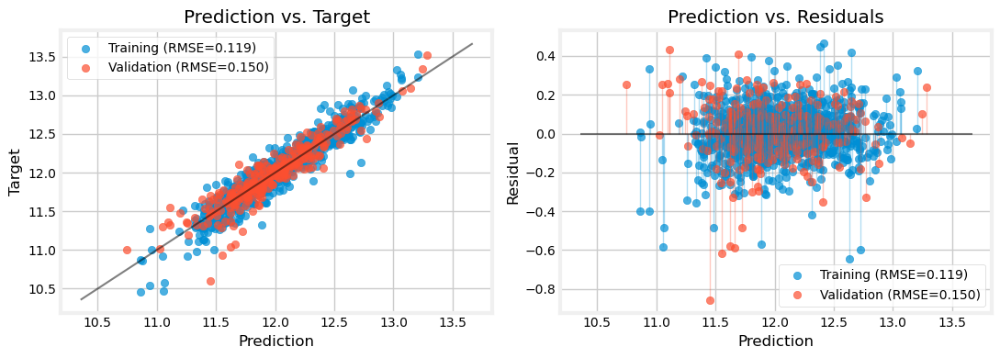



..................................................

Elapsed time: 0.03 minutes
..................................................



Time: 09:42:43
***************************************************************************
knn_eng , 	CV: True 

***************************************************************************
We will evaluate knn_eng with cross-validation.

 -> Creating instance of `RepeatedKFold`
......Done!
 -> Creating the CV search
......Done!

 -> Fitting the model
......Done!
 -> CV Results:
		best neg_root_mean_squared_error: -0.15444726468974662
		best params: {'model__n_neighbors': 11, 'model__p': 1, 'model__weights': 'distance', 'preprocessor__selector__best_k': 20, 'preprocessor__selector__t_thr': np.float64(0.35015187478882814), 'preprocessor__target_encoder__smoothing': np.float64(88.54809841252437)}
......Done!
 -> Making predictions
......Done!
 -> Creating Regression Reports
......Done!


Regression Report: Training
.........................................

,Value
Explained Variance,0.999955
R2,0.999955
MAE,0.000112
MSE,0.000007
RMSE,0.002631
MedAE,0.000000
MAPE,0.000009




Regression Report: Validation
..................................................


,Value
Explained Variance,0.872646
R2,0.872643
MAE,0.100539
MSE,0.022104
RMSE,0.148673
MedAE,0.069489
MAPE,0.008470



 -> Computing Scores
......Done!
**************************************************
Prediction and Residual Plots:


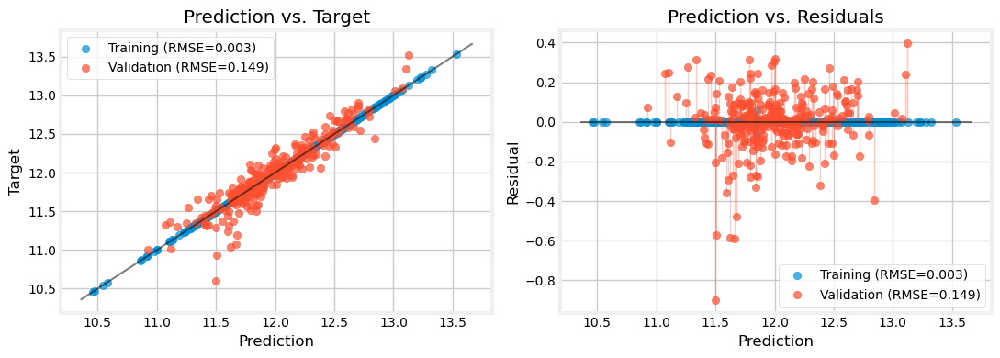



****************************************************************************************************
Performing Permutation Importance:
..................................................
The model's features are:

['TotalBsmtSF', 'OverallQualCond', 'Neighborhood', 'AllBaths', 'TotalSF', 'RemodAge', 'BathsAbvGr', 'GarageCars', '1stFlrSF', 'OverallQual', 'Has_Bsmt', 'Has_Garage']
The most important features are:

	TotalBsmtSF: 0.03999705050710041 +- 0.013870006019808333
	OverallQualCond: 0.036572727304390054 +- 0.004840535790010422
	Neighborhood: 0.03656663238137274 +- 0.0039453754386768744
	AllBaths: 0.03516709561642641 +- 0.006871026898390474
	TotalSF: 0.034101023332018365 +- 0.0017273292397800603
	RemodAge: 0.014884185476918855 +- 0.004925710746220769
	BathsAbvGr: 0.013249148053612348 +- 0.004822595986416672
	GarageCars: 0.012444146239085185 +- 0.0035161057929655407
	1stFlrSF: 0.008742359993751104 +- 0.0020162364256763655
	OverallQual: 0.008634767609932892 +- 0.0031642037284279286
	

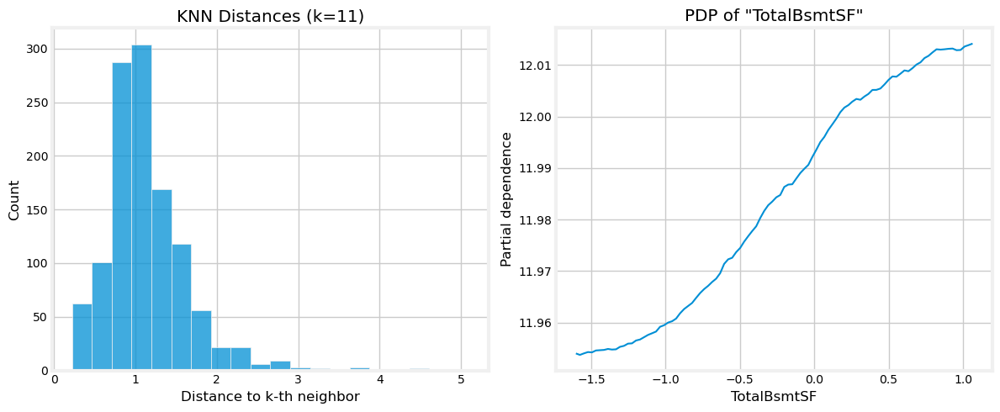

  0%|          | 0/50 [00:00<?, ?it/s]

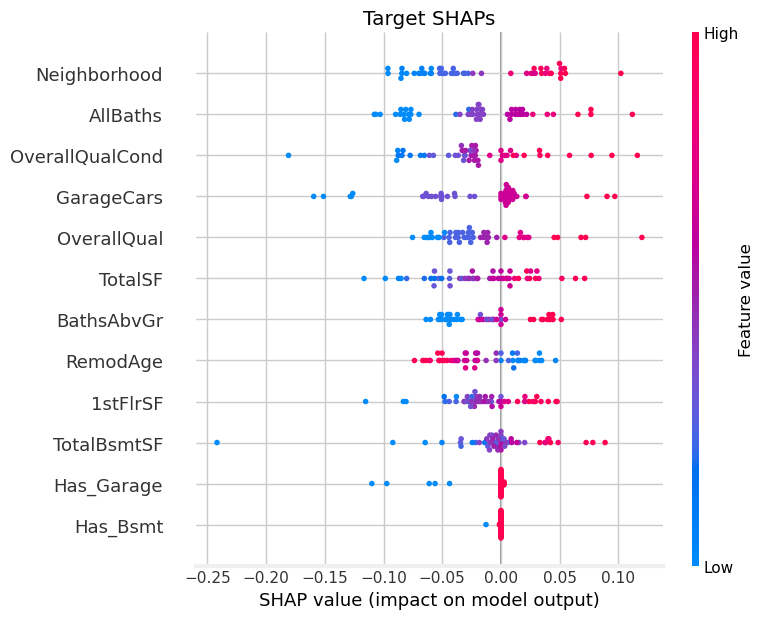

..................................................

Elapsed time: 23.98 minutes
..................................................



Time: 10:06:42
***************************************************************************
knn_clus , 	CV: False 

***************************************************************************
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
We will evaluate model=knn_clus with standard validation.
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::

 -> Fitting the model
......Done!
 -> Making predictions
......Done!
 -> Creating Regression Reports
......Done!


Regression Report: Training
..................................................


,Value
Explained Variance,0.904832
R2,0.904808
MAE,0.086539
MSE,0.014799
RMSE,0.121651
MedAE,0.058295
MAPE,0.007221




Regression Report: Validation
..................................................


,Value
Explained Variance,0.859241
R2,0.859241
MAE,0.106179
MSE,0.024430
RMSE,0.156300
MedAE,0.074870
MAPE,0.008972



 -> Computing Scores
......Done!
**************************************************
Prediction and Residual Plots:


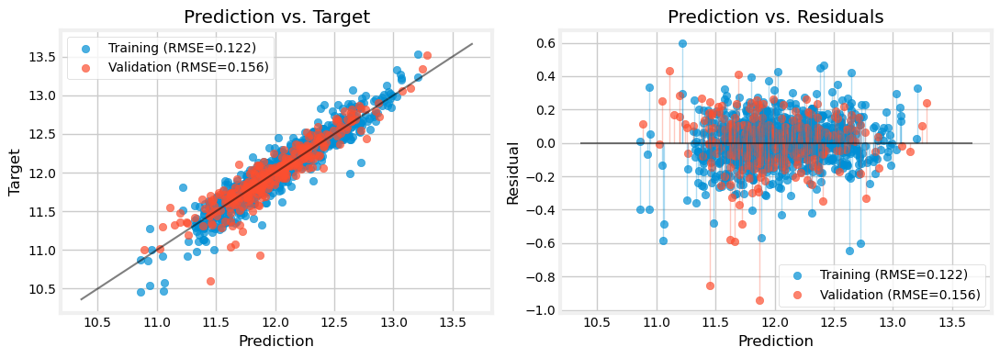



..................................................

Elapsed time: 0.03 minutes
..................................................



Time: 10:06:43
***************************************************************************
knn_clus , 	CV: True 

***************************************************************************
We will evaluate knn_clus with cross-validation.

 -> Creating instance of `RepeatedKFold`
......Done!
 -> Creating the CV search
......Done!

 -> Fitting the model
......Done!
 -> CV Results:
		best neg_root_mean_squared_error: -0.15614059663136123
		best params: {'model__n_neighbors': 7, 'model__p': 1, 'model__weights': 'distance', 'preprocessor__cluster__n_clusters': 5, 'preprocessor__pca__fit_feat_subset': True, 'preprocessor__pca__keep_original_feats': False, 'preprocessor__selector__best_k': 20, 'preprocessor__selector__t_thr': np.float64(0.2842454137244431), 'preprocessor__target_encoder__smoothing': np.float64(12.542881444351057)}
......Done!
 -> Making predi

,Value
Explained Variance,0.999961
R2,0.999961
MAE,0.000153
MSE,0.000006
RMSE,0.002464
MedAE,0.000000
MAPE,0.000013




Regression Report: Validation
..................................................


,Value
Explained Variance,0.857023
R2,0.857009
MAE,0.108425
MSE,0.024817
RMSE,0.157534
MedAE,0.072991
MAPE,0.009132



 -> Computing Scores
......Done!
**************************************************
Prediction and Residual Plots:


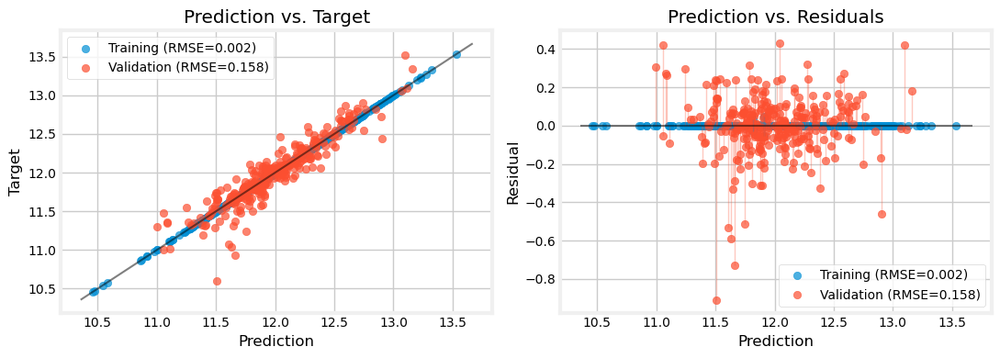



****************************************************************************************************
Performing Permutation Importance:
..................................................
The model's features are:

['pca0', 'pca2', 'AllBaths', 'pca1', 'pca5', 'BathsAbvGr', 'pca9', 'pca6', 'pca3', 'pca7', 'Has_Garage', 'cluster_4', 'cluster_3', 'cluster_1', 'Has_Bsmt', 'pca4', 'pca8', 'cluster_2']
The most important features are:

	pca0: 0.6000375442542463 +- 0.05275947163243539
	pca2: 0.028804552359174163 +- 0.001152742428450618
	AllBaths: 0.023337901128192763 +- 0.004183729528741016
	pca1: 0.014739178031634914 +- 0.0076306991088632755
	pca5: 0.007784204978020371 +- 0.003827542561156218
	BathsAbvGr: 0.00674339480768007 +- 0.00272617731542759
	pca9: 0.00473658140066111 +- 0.0006583100230876134
	pca6: 0.0036354727926505514 +- 0.0018283605401252989
	pca3: 0.0026291933049925166 +- 0.0028884701674288396
	pca7: 0.0018237318067199748 +- 0.0024488778220245386
	Has_Garage: 0.001249910615508831

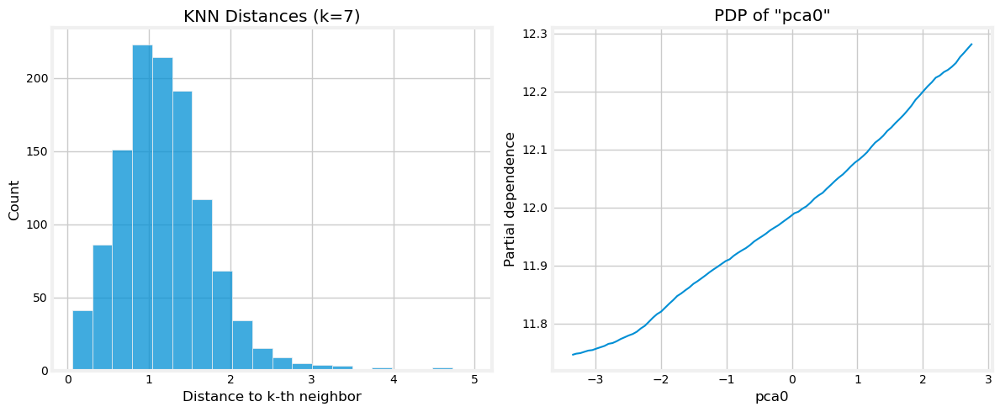

  0%|          | 0/50 [00:00<?, ?it/s]

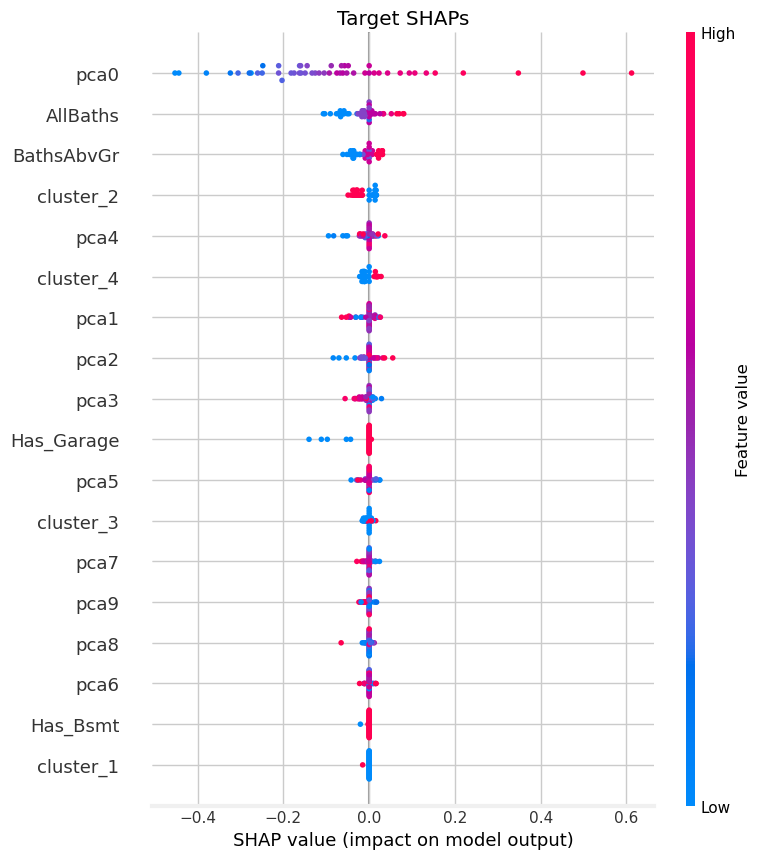

..................................................

Elapsed time: 23.60 minutes
..................................................





In [485]:
model = 'knn'
redoQ = True

for pp in ['raw', 'eng', 'clus']:

    if pp == 'raw':
        continue

    for cvQ in [False, True]:

        print(time.strftime("Time: %H:%M:%S"))
        start = time.time()

        model_name = model+'_'+pp # full model name

        if redoQ and (model_name in search.keys()):
            del search[model_name]

        print("*"*75)
        print(model_name, ", \tCV:", cvQ, "\n")
        print("*"*75)
        
        # # GridSearchCV
        # model_evaluation(model_name, (X_train, X_val, y_train, y_val),
        #                  perform_cv_randomized=(cvQ, False),
        #                  n_splits=5, n_repeats=2,
        #                  verbose=True, plots=True)

        # RandomizedSearchCV
        model_evaluation(model_name, (X_train, X_val, y_train, y_val),
                         perform_cv_randomized=(cvQ, True),
                         n_splits=5, n_repeats=2,
                         n_iter=2000,
                         verbose=True, plots=True)

        print("\n")

        # if cross-validating:
        if cvQ:
            # explaining model
            explain_model(model_name, best_cv[model_name]['pipe'], (X_train, X_val, y_train, y_val), tree_idx=0, random_state=0)

            # saving model
            model_path = "../models/"+model_name+".pkl"
            
            with open(model_path, "wb") as f:
                dill.dump(best_cv[model_name]['pipe'], f)
        
        # done!!
        
        end = time.time()

        print("."*50)
        print(f"\nElapsed time: {(end-start)/60:.2f} minutes")
        print("."*50)

        print("\n\n")

In [486]:
scorecard

,dtr_base_no_cv,dtr_eng_no_cv,dtr_eng_cv,dtr_clus_no_cv,dtr_clus_cv,rfr_eng_no_cv,rfr_eng_cv,rfr_clus_no_cv,rfr_clus_cv,xgbr_eng_no_cv,xgbr_eng_cv,xgbr_clus_no_cv,xgbr_clus_cv,catbr_eng_no_cv,linreg_eng_no_cv,linreg_eng_cv,linreg_clus_no_cv,linreg_clus_cv,lasso_eng_no_cv,lasso_eng_cv,lasso_clus_no_cv,lasso_clus_cv,ridge_eng_no_cv,ridge_eng_cv,ridge_clus_no_cv,ridge_clus_cv,knn_eng_no_cv,knn_eng_cv,knn_clus_no_cv,knn_clus_cv
R2 Score Train,1.000000,0.999955,0.930213,0.999961,0.876380,0.982749,0.982821,0.982524,0.982262,0.998403,0.977811,0.999619,0.938369,0.980469,0.873561,0.885321,0.874522,0.885361,0.000000,0.884538,0.000000,0.880820,0.873315,0.882873,0.874513,0.883009,0.908603,0.999955,0.904808,0.999961
R2 Score Validation,0.673874,0.744735,0.836800,0.769110,0.841059,0.887390,0.890535,0.887616,0.884343,0.875854,0.893753,0.870324,0.885771,0.894647,0.888219,0.898505,0.888482,0.898033,-0.013284,0.899378,-0.013284,0.895605,0.888403,0.897325,0.888441,0.896030,0.870421,0.872643,0.859241,0.857009
RMSE Train,0.000000,0.002631,0.104161,0.002464,0.138631,0.051788,0.051680,0.052124,0.052513,0.015757,0.058734,0.007693,0.097886,0.055104,0.140203,0.133524,0.139669,0.133500,0.394291,0.133979,0.394291,0.136119,0.140340,0.134942,0.139674,0.134863,0.119202,0.002631,0.121651,0.002464
RMSE Validation,0.237910,0.210482,0.168298,0.200181,0.166087,0.139800,0.137834,0.139660,0.141679,0.146786,0.135793,0.150020,0.140802,0.135220,0.139285,0.132722,0.139121,0.133030,0.419358,0.132149,0.419358,0.134604,0.139170,0.133491,0.139146,0.134330,0.149964,0.148673,0.156300,0.157534


#### Engineered Cluster Model: exploration

In the cluster model, checking selected engineering features (from which PCA and clusters are built)

In [487]:
best_cv[model+'_clus']

{'pipe': Pipeline(steps=[('preprocessor',
                  Pipeline(steps=[('cleaning',
                                   Pipeline(steps=[('custom_imputer',
                                                    CustomImputer(groupby_cols={'BsmtCond': ['BsmtExposure',
                                                                                             'BsmtQual'],
                                                                                'BsmtExposure': ['BsmtQual',
                                                                                                 'BsmtCond'],
                                                                                'BsmtFinType2': ['BsmtQual',
                                                                                                 'BsmtCond'],
                                                                                'BsmtQual': ['BsmtCond',
                                                                                   

In [488]:
best_cv[model+'_clus']['params']

{'model__n_neighbors': 7,
 'model__p': 1,
 'model__weights': 'distance',
 'preprocessor__cluster__n_clusters': 5,
 'preprocessor__pca__fit_feat_subset': True,
 'preprocessor__pca__keep_original_feats': False,
 'preprocessor__selector__best_k': 20,
 'preprocessor__selector__t_thr': np.float64(0.2842454137244431),
 'preprocessor__target_encoder__smoothing': np.float64(12.542881444351057)}

In [489]:
best_cv[model+'_clus']['pipe'].steps

[('preprocessor',
  Pipeline(steps=[('cleaning',
                   Pipeline(steps=[('custom_imputer',
                                    CustomImputer(groupby_cols={'BsmtCond': ['BsmtExposure',
                                                                             'BsmtQual'],
                                                                'BsmtExposure': ['BsmtQual',
                                                                                 'BsmtCond'],
                                                                'BsmtFinType2': ['BsmtQual',
                                                                                 'BsmtCond'],
                                                                'BsmtQual': ['BsmtCond',
                                                                             'BsmtExposure'],
                                                                'Exterior1st': 'Foundation',
                                                                

In [490]:
best_preproc = best_cv[model+'_clus']['pipe'].steps[0][1] # the best preprocessor
best_feats = best_preproc[:-3] # all the preprocessor steps, except for PCA, KMeans clustering, and OHE
best_feats.transform(X_train)

,TotalSF,OverallQual,Neighborhood,OverallQualCond,GarageCars,BathsAbvGr,YearBuilt,AllBaths,TotalBsmtSF,1stFlrSF,KitchenQual,ExterQual,Has_Garage,Has_Bsmt
921,0.822593,-0.5,-1.164791,0.0,-2.0,1.0,-1.574468,3.0,0.474238,0.311465,0.0,0.0,0,1
520,-1.637012,-1.0,-1.282342,-0.7,-2.0,0.0,-1.574468,0.0,-14.082269,-0.975073,0.0,0.0,0,0
401,0.120837,0.5,0.269133,0.0,0.0,0.0,0.659574,0.0,0.534128,0.373991,1.0,1.0,1,1
280,0.276629,0.5,0.172457,0.7,0.0,0.5,0.319149,0.5,-0.451321,0.142984,1.0,1.0,1,1
1401,-0.064737,0.0,0.209886,-0.5,0.0,0.5,0.638298,1.5,-0.372238,-0.509924,0.0,0.0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
715,-0.083251,0.0,0.158983,-0.5,0.0,0.0,0.000000,0.0,0.110991,0.437880,0.0,0.0,1,1
905,-0.408079,-0.5,-0.719550,-1.0,-1.0,-1.0,-0.425532,0.0,0.095638,-0.069767,0.0,0.0,1,1
1096,-0.503985,0.0,-1.162882,0.7,-2.0,-0.5,-1.276596,-0.5,-0.787573,-0.746216,1.0,0.0,0,1
235,-1.319293,0.0,-0.641125,-1.7,-1.0,-0.5,-0.063830,-0.5,-1.494787,-1.744221,0.0,0.0,1,1


In [491]:
best_preproc

,steps,"[('cleaning', ...), ('feature_engineer', ...), ...]"
,transform_input,None
,memory,None
,verbose,False
,steps,"[('custom_imputer', ...), ('rules_based_imputer', ...), ...]"
,transform_input,None
,memory,None
,verbose,False
,strategies,"{'Alley': 'NA', 'Electrical': 'mode', 'Exterior1st': 'group_mode', 'Exterior2nd': 'group_mode', ...}"
,groupby_cols,"{'BsmtCond': ['BsmtExposure', 'BsmtQual'], 'BsmtExposure': ['BsmtQual', 'BsmtCond'], 'BsmtFinType2': ['BsmtQual', 'BsmtCond'], 'BsmtQual': ['BsmtCond', 'BsmtExposure'], ...}"
,rules,"[{'column': 'MasVnrArea', 'condition': <function <la...x73b6680662a0>, 'value': 0.0}, {'column': 'MasVnrType', 'condition': <function <la...x73b668066660>, 'value': 'NA'}, ...]"


In [492]:
del best_preproc, best_feats

#### Cleanup

In [493]:
Out.clear()

for name in dir():
    if name.startswith('_') and name[1:].isdigit():
        del globals()[name]

### Model 9: `MLPRegressor`

In [494]:
model = 'mlp'

for pp in ['raw', 'eng', 'clus']:

    if pp == 'raw':
        continue

    model_name = model+'_'+pp # full model name

    preproc_pipe = clone(final_preproc[pp]) # preprocessing  pipeline

    pipe[model_name] =\
        Pipeline(steps=[('preprocessor', preproc_pipe),
                        ('model', MLPRegressor(max_iter=10_000,
                                               random_state=0))])

    pipe[model_name+'_no_cv'] =\
        Pipeline(steps=[('preprocessor', preproc_pipe),
                        ('model', MLPRegressor(max_iter=10_000,
                                               random_state=0))])

    # defining the hyperparameter grid
    # basic:
    param_grid[model_name] = {'preprocessor__target_encoder__smoothing':
                                  uniform(loc=1, scale=99),
                              'preprocessor__selector__best_k':
                                  list(range(10, 40, 10)),
                              'preprocessor__selector__t_thr':
                                  uniform(loc=0.1, scale=0.8)
                             }
    # if clustering:
    if pp == 'clus':
        param_grid[model_name]['preprocessor__pca__fit_feat_subset'] =\
                        [True]
        param_grid[model_name]['preprocessor__pca__keep_original_feats'] =\
            [False]
        param_grid[model_name]['preprocessor__cluster__n_clusters'] =\
            list(range(3,7))

    # proper to the model:
    param_grid[model_name]['model__hidden_layer_sizes'] =\
        np.arange(20, 110, 20)
    param_grid[model_name]['model__alpha'] =\
        loguniform(1.e-5, 0.1)
    param_grid[model_name]['model__learning_rate_init'] =\
        loguniform(1.e-4, 0.1)

Time: 10:30:20
***************************************************************************
mlp_eng , 	CV: False 

***************************************************************************
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
We will evaluate model=mlp_eng with standard validation.
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::

 -> Fitting the model
......Done!
 -> Making predictions
......Done!
 -> Creating Regression Reports
......Done!


Regression Report: Training
..................................................


,Value
Explained Variance,0.814523
R2,0.814484
MAE,0.122426
MSE,0.028841
RMSE,0.169828
MedAE,0.090625
MAPE,0.010238




Regression Report: Validation
..................................................


,Value
Explained Variance,0.787414
R2,0.787413
MAE,0.137184
MSE,0.036896
RMSE,0.192082
MedAE,0.103914
MAPE,0.011568



 -> Computing Scores
......Done!
**************************************************
Prediction and Residual Plots:


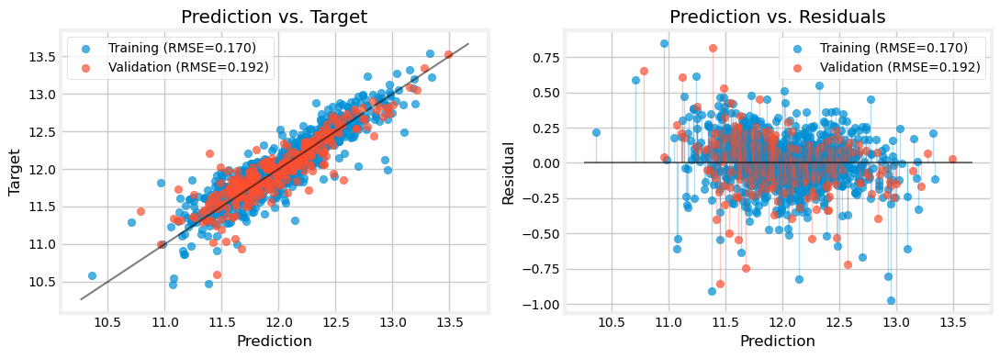



..................................................

Elapsed time: 0.03 minutes
..................................................



Time: 10:30:22
***************************************************************************
mlp_eng , 	CV: True 

***************************************************************************
We will evaluate mlp_eng with cross-validation.

 -> Creating instance of `RepeatedKFold`
......Done!
 -> Creating the CV search
......Done!

 -> Fitting the model
......Done!
 -> CV Results:
		best neg_root_mean_squared_error: -0.17563821414765032
		best params: {'model__alpha': np.float64(0.0165076670777374), 'model__hidden_layer_sizes': np.int64(20), 'model__learning_rate_init': np.float64(0.09814163052909278), 'preprocessor__selector__best_k': 20, 'preprocessor__selector__t_thr': np.float64(0.10180555418874465), 'preprocessor__target_encoder__smoothing': np.float64(87.08543208647757)}
......Done!
 -> Making predictions
......Done!
 -> Creating Regression Reports
.

,Value
Explained Variance,0.864503
R2,0.849407
MAE,0.109104
MSE,0.023412
RMSE,0.153010
MedAE,0.081276
MAPE,0.009128




Regression Report: Validation
..................................................


,Value
Explained Variance,0.855590
R2,0.851955
MAE,0.113948
MSE,0.025694
RMSE,0.160294
MedAE,0.086008
MAPE,0.009642



 -> Computing Scores
......Done!
**************************************************
Prediction and Residual Plots:


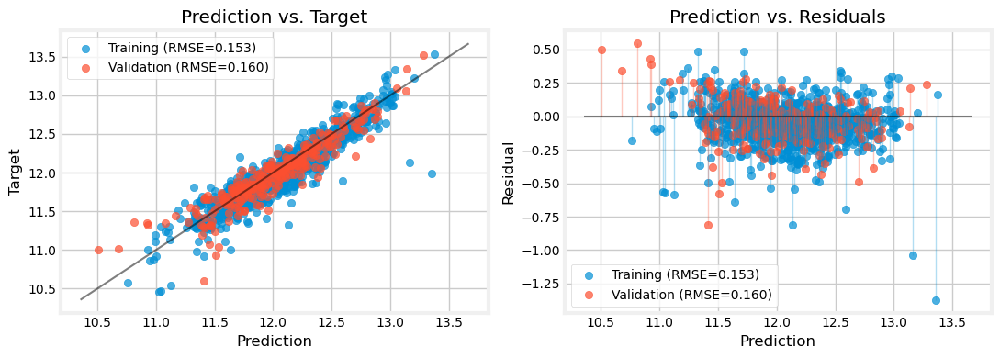



****************************************************************************************************
Performing Permutation Importance:
..................................................
The model's features are:

['GarageArea', 'Has_Garage', 'Has_Bsmt', 'TotalBsmtSF', '1and2FlrSF', 'Neighborhood', 'OverallQualCond', 'TotalSF', 'AllBaths', 'BathsAbvGr', 'BsmtQual', '1stFlrSF', 'GarageCars', 'OverallQual', 'AllRooms', 'HouseAge', 'ExterQual', 'YearBuilt', 'RemodAge', 'KitchenQual']
The most important features are:

	GarageArea: 8.856627231870714 +- 0.630373301008374
	Has_Garage: 8.368634922598835 +- 0.4347514021485308
	Has_Bsmt: 2.2281683674269357 +- 0.22809625175021306
	TotalBsmtSF: 1.6593659405191143 +- 0.19370597429654032
	1and2FlrSF: 0.3504525268347943 +- 0.018774064614185217
	Neighborhood: 0.12899823968481738 +- 0.011456825709165654
	OverallQualCond: 0.10811532511104446 +- 0.011098771450946857
	TotalSF: 0.07906368249848746 +- 0.0075560454933610325
	AllBaths: 0.030040961637087825 

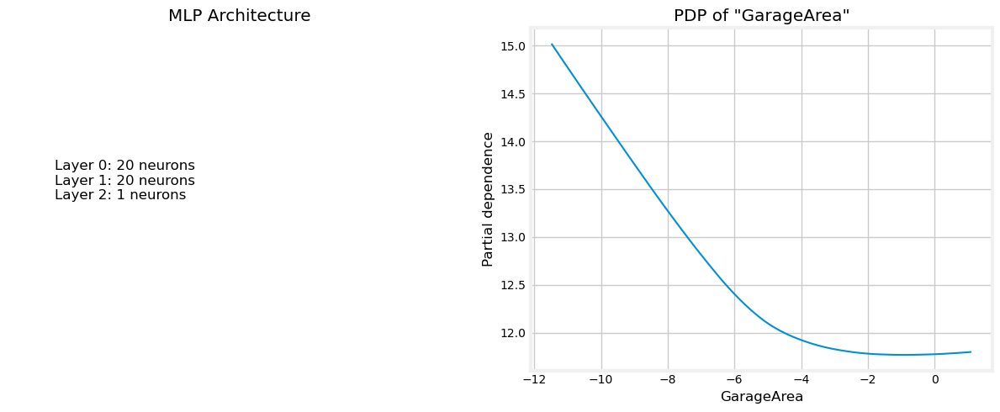

  0%|          | 0/50 [00:00<?, ?it/s]

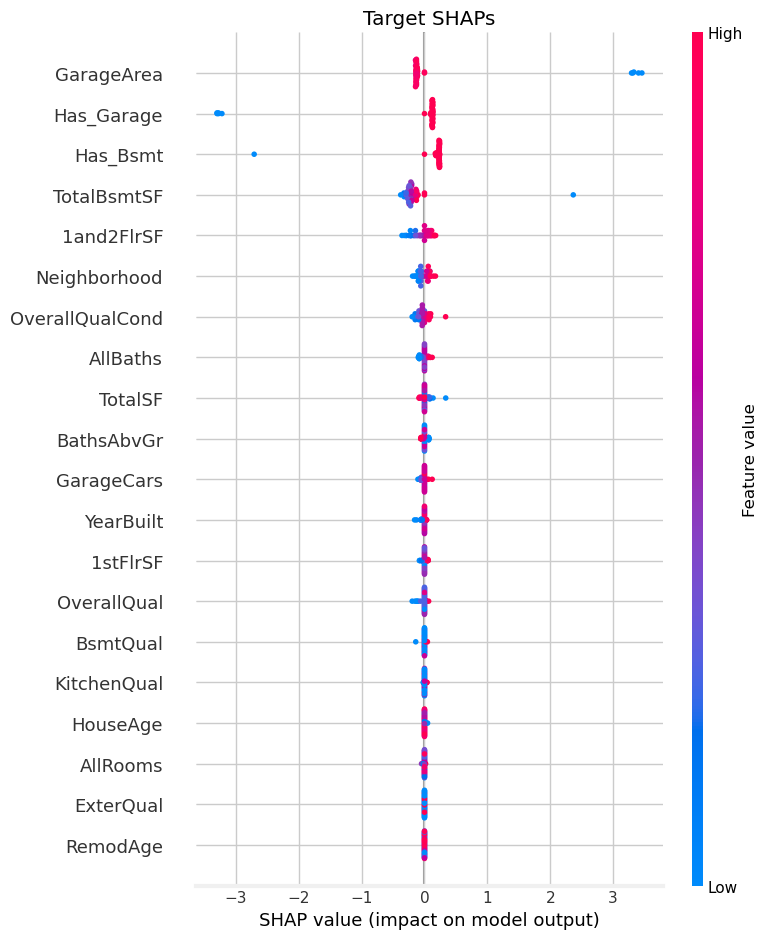

..................................................

Elapsed time: 44.97 minutes
..................................................



Time: 11:15:20
***************************************************************************
mlp_clus , 	CV: False 

***************************************************************************
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
We will evaluate model=mlp_clus with standard validation.
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::

 -> Fitting the model
......Done!
 -> Making predictions
......Done!
 -> Creating Regression Reports
......Done!


Regression Report: Training
..................................................


,Value
Explained Variance,0.813890
R2,0.813874
MAE,0.123275
MSE,0.028936
RMSE,0.170107
MedAE,0.088307
MAPE,0.010286




Regression Report: Validation
..................................................


,Value
Explained Variance,0.737512
R2,0.736705
MAE,0.157393
MSE,0.045696
RMSE,0.213767
MedAE,0.115641
MAPE,0.013258



 -> Computing Scores
......Done!
**************************************************
Prediction and Residual Plots:


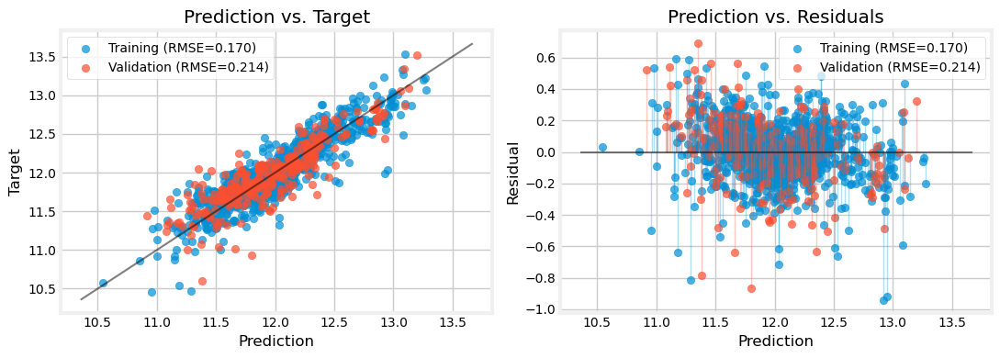



..................................................

Elapsed time: 0.05 minutes
..................................................



Time: 11:15:23
***************************************************************************
mlp_clus , 	CV: True 

***************************************************************************
We will evaluate mlp_clus with cross-validation.

 -> Creating instance of `RepeatedKFold`
......Done!
 -> Creating the CV search
......Done!

 -> Fitting the model
......Done!
 -> CV Results:
		best neg_root_mean_squared_error: -0.18357935430784603
		best params: {'model__alpha': np.float64(0.0012463077086854455), 'model__hidden_layer_sizes': np.int64(40), 'model__learning_rate_init': np.float64(0.033684734815999276), 'preprocessor__cluster__n_clusters': 3, 'preprocessor__pca__fit_feat_subset': True, 'preprocessor__pca__keep_original_feats': False, 'preprocessor__selector__best_k': 20, 'preprocessor__selector__t_thr': np.float64(0.18913792536497445), 'preprocessor__

,Value
Explained Variance,0.863663
R2,0.858467
MAE,0.106490
MSE,0.022003
RMSE,0.148336
MedAE,0.074880
MAPE,0.008947




Regression Report: Validation
..................................................


,Value
Explained Variance,0.828671
R2,0.825078
MAE,0.115218
MSE,0.030359
RMSE,0.174237
MedAE,0.081484
MAPE,0.009750



 -> Computing Scores
......Done!
**************************************************
Prediction and Residual Plots:


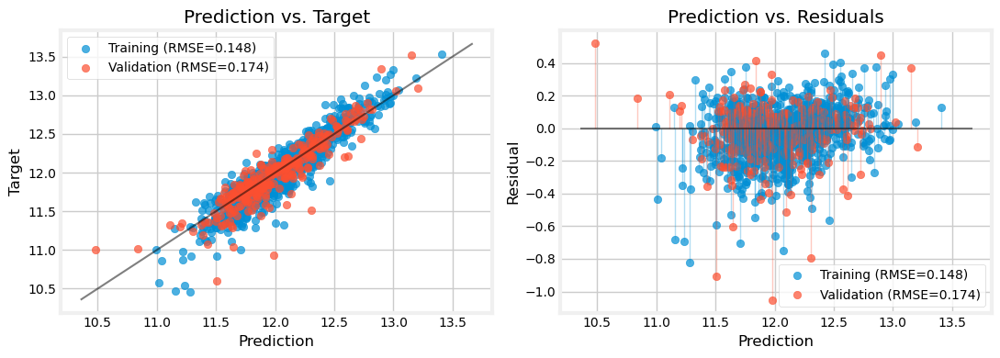



****************************************************************************************************
Performing Permutation Importance:
..................................................
The model's features are:

['Has_Garage', 'pca3', 'pca0', 'cluster_2', 'Has_Bsmt', 'pca1', 'pca10', 'pca12', 'pca11', 'pca9', 'pca5', 'cluster_1', 'pca7', 'pca8', 'pca4', 'pca2', 'pca6', 'AllBaths', 'BathsAbvGr']
The most important features are:

	Has_Garage: 6.02784184143082 +- 0.37527619199110396
	pca3: 3.073970057783277 +- 0.2812852033195674
	pca0: 2.823376694133782 +- 0.09519191202663001
	cluster_2: 2.811665126445464 +- 0.36037976329084326
	Has_Bsmt: 2.1949791662830975 +- 0.3052837694235221
	pca1: 1.7998820464673593 +- 0.18589727152071933
	pca10: 1.614583946891423 +- 0.2517573245966292
	pca12: 0.46712851404602806 +- 0.07345473416134413
	pca11: 0.45434794841067916 +- 0.04891218969268584
	pca9: 0.34517296681983567 +- 0.05476719808827251
	pca5: 0.3240745630568443 +- 0.05399849956507279
	cluster_1: 0

/home/mbuenabad/miniforge3/envs/ml_env/lib/python3.12/site-packages/sklearn/inspection/_partial_dependence.py:717: FutureWarning: The column 'Has_Garage' contains integer data. Partial dependence plots are not supported for integer data: this can lead to implicit rounding with NumPy arrays or even errors with newer pandas versions. Please convert numerical featuresto floating point dtypes ahead of time to avoid problems. This will raise ValueError in scikit-learn 1.9.
  warnings.warn(


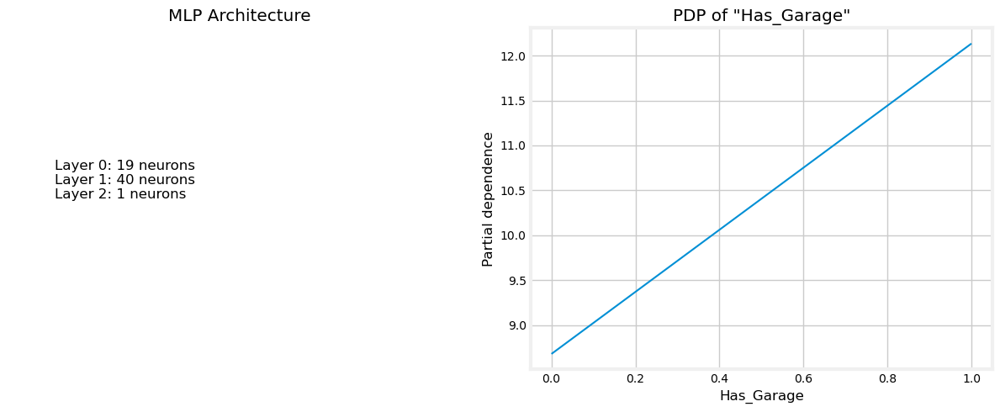

  0%|          | 0/50 [00:00<?, ?it/s]

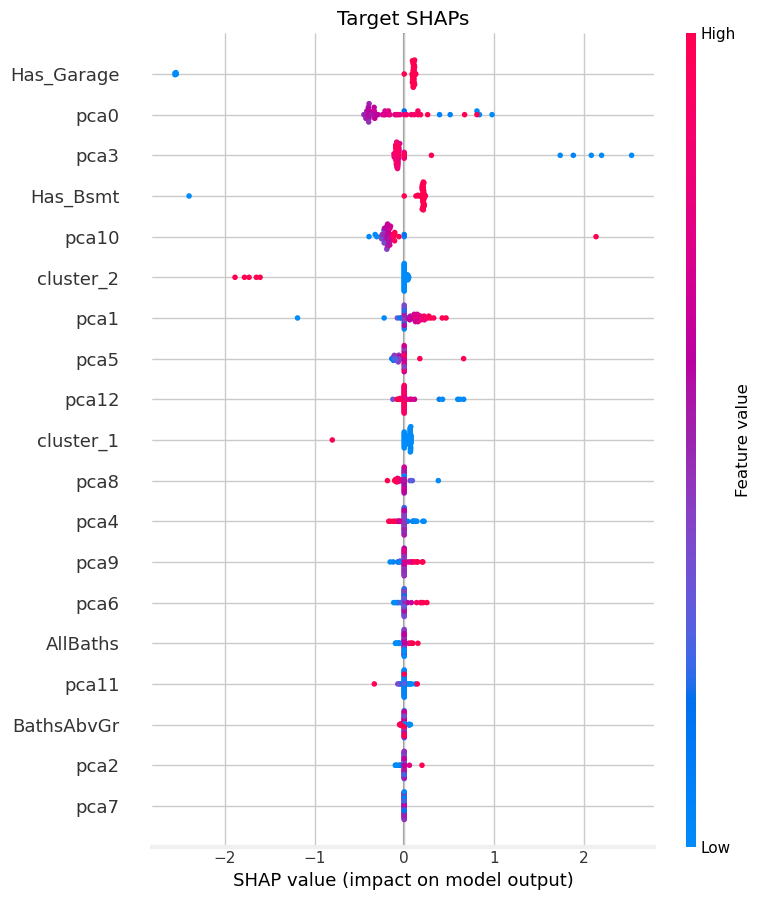

..................................................

Elapsed time: 60.05 minutes
..................................................





In [495]:
model = 'mlp'
redoQ = True

for pp in ['raw', 'eng', 'clus']:

    if pp == 'raw':
        continue
    
    for cvQ in [False, True]:

        print(time.strftime("Time: %H:%M:%S"))
        start = time.time()

        model_name = model+'_'+pp # full model name

        if redoQ and (model_name in search.keys()):
            del search[model_name]

        print("*"*75)
        print(model_name, ", \tCV:", cvQ, "\n")
        print("*"*75)
        
        # # GridSearchCV
        # model_evaluation(model_name, (X_train, X_val, y_train, y_val),
        #                  perform_cv_randomized=(cvQ, False),
        #                  n_splits=5, n_repeats=2,
        #                  verbose=True, plots=True)

        # RandomizedSearchCV
        model_evaluation(model_name, (X_train, X_val, y_train, y_val),
                         perform_cv_randomized=(cvQ, True),
                         n_splits=5, n_repeats=2,
                         n_iter=2000,
                         verbose=True, plots=True)

        print("\n")

        # if cross-validating:
        if cvQ:
            # explaining model
            explain_model(model_name, best_cv[model_name]['pipe'], (X_train, X_val, y_train, y_val), tree_idx=0, random_state=0)

            # saving model
            model_path = "../models/"+model_name+".pkl"
            
            with open(model_path, "wb") as f:
                dill.dump(best_cv[model_name]['pipe'], f)
        
        # done!!
        
        end = time.time()

        print("."*50)
        print(f"\nElapsed time: {(end-start)/60:.2f} minutes")
        print("."*50)

        print("\n\n")

In [496]:
scorecard

,dtr_base_no_cv,dtr_eng_no_cv,dtr_eng_cv,dtr_clus_no_cv,dtr_clus_cv,rfr_eng_no_cv,rfr_eng_cv,rfr_clus_no_cv,rfr_clus_cv,xgbr_eng_no_cv,xgbr_eng_cv,xgbr_clus_no_cv,xgbr_clus_cv,catbr_eng_no_cv,linreg_eng_no_cv,linreg_eng_cv,linreg_clus_no_cv,linreg_clus_cv,lasso_eng_no_cv,lasso_eng_cv,lasso_clus_no_cv,lasso_clus_cv,ridge_eng_no_cv,ridge_eng_cv,ridge_clus_no_cv,ridge_clus_cv,knn_eng_no_cv,knn_eng_cv,knn_clus_no_cv,knn_clus_cv,mlp_eng_no_cv,mlp_eng_cv,mlp_clus_no_cv,mlp_clus_cv
R2 Score Train,1.000000,0.999955,0.930213,0.999961,0.876380,0.982749,0.982821,0.982524,0.982262,0.998403,0.977811,0.999619,0.938369,0.980469,0.873561,0.885321,0.874522,0.885361,0.000000,0.884538,0.000000,0.880820,0.873315,0.882873,0.874513,0.883009,0.908603,0.999955,0.904808,0.999961,0.814484,0.849407,0.813874,0.858467
R2 Score Validation,0.673874,0.744735,0.836800,0.769110,0.841059,0.887390,0.890535,0.887616,0.884343,0.875854,0.893753,0.870324,0.885771,0.894647,0.888219,0.898505,0.888482,0.898033,-0.013284,0.899378,-0.013284,0.895605,0.888403,0.897325,0.888441,0.896030,0.870421,0.872643,0.859241,0.857009,0.787413,0.851955,0.736705,0.825078
RMSE Train,0.000000,0.002631,0.104161,0.002464,0.138631,0.051788,0.051680,0.052124,0.052513,0.015757,0.058734,0.007693,0.097886,0.055104,0.140203,0.133524,0.139669,0.133500,0.394291,0.133979,0.394291,0.136119,0.140340,0.134942,0.139674,0.134863,0.119202,0.002631,0.121651,0.002464,0.169828,0.153010,0.170107,0.148336
RMSE Validation,0.237910,0.210482,0.168298,0.200181,0.166087,0.139800,0.137834,0.139660,0.141679,0.146786,0.135793,0.150020,0.140802,0.135220,0.139285,0.132722,0.139121,0.133030,0.419358,0.132149,0.419358,0.134604,0.139170,0.133491,0.139146,0.134330,0.149964,0.148673,0.156300,0.157534,0.192082,0.160294,0.213767,0.174237


#### Engineered Cluster Model: exploration

In the cluster model, checking selected engineering features (from which PCA and clusters are built)

In [497]:
best_cv[model+'_clus']

{'pipe': Pipeline(steps=[('preprocessor',
                  Pipeline(steps=[('cleaning',
                                   Pipeline(steps=[('custom_imputer',
                                                    CustomImputer(groupby_cols={'BsmtCond': ['BsmtExposure',
                                                                                             'BsmtQual'],
                                                                                'BsmtExposure': ['BsmtQual',
                                                                                                 'BsmtCond'],
                                                                                'BsmtFinType2': ['BsmtQual',
                                                                                                 'BsmtCond'],
                                                                                'BsmtQual': ['BsmtCond',
                                                                                   

In [498]:
best_cv[model+'_clus']['params']

{'model__alpha': np.float64(0.0012463077086854455),
 'model__hidden_layer_sizes': np.int64(40),
 'model__learning_rate_init': np.float64(0.033684734815999276),
 'preprocessor__cluster__n_clusters': 3,
 'preprocessor__pca__fit_feat_subset': True,
 'preprocessor__pca__keep_original_feats': False,
 'preprocessor__selector__best_k': 20,
 'preprocessor__selector__t_thr': np.float64(0.18913792536497445),
 'preprocessor__target_encoder__smoothing': np.float64(37.126629780571385)}

In [499]:
best_cv[model+'_clus']['pipe'].steps

[('preprocessor',
  Pipeline(steps=[('cleaning',
                   Pipeline(steps=[('custom_imputer',
                                    CustomImputer(groupby_cols={'BsmtCond': ['BsmtExposure',
                                                                             'BsmtQual'],
                                                                'BsmtExposure': ['BsmtQual',
                                                                                 'BsmtCond'],
                                                                'BsmtFinType2': ['BsmtQual',
                                                                                 'BsmtCond'],
                                                                'BsmtQual': ['BsmtCond',
                                                                             'BsmtExposure'],
                                                                'Exterior1st': 'Foundation',
                                                                

In [500]:
best_preproc = best_cv[model+'_clus']['pipe'].steps[0][1] # the best preprocessor
best_feats = best_preproc[:-3] # all the preprocessor steps, except for PCA, KMeans clustering, and OHE
best_feats.transform(X_train)

,TotalSF,OverallQual,Neighborhood,OverallQualCond,GarageCars,GarageArea,BathsAbvGr,YearBuilt,TotalBsmtSF,1stFlrSF,AllBaths,KitchenQual,ExterQual,BsmtQual,GarageAge,Has_Garage,Has_Bsmt
921,0.822593,-0.5,-1.036860,0.0,-2.0,-11.484445,1.0,-1.574468,0.474238,0.311465,3.0,0.0,0.0,-1.0,2.212047,0,1
520,-1.637012,-1.0,-1.153374,-0.7,-2.0,-11.484445,0.0,-1.574468,-14.082269,-0.975073,0.0,0.0,0.0,-4.0,2.212047,0,0
401,0.120837,0.5,0.224082,0.0,0.0,-0.338266,0.0,0.659574,0.534128,0.373991,0.0,1.0,1.0,0.0,-1.453435,1,1
280,0.276629,0.5,0.086510,0.7,0.0,0.335169,0.5,0.319149,-0.451321,0.142984,0.5,1.0,1.0,0.0,-0.259602,1,1
1401,-0.064737,0.0,0.109030,-0.5,0.0,-0.347564,0.5,0.638298,-0.372238,-0.509924,1.5,0.0,0.0,-1.0,-0.967537,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
715,-0.083251,0.0,0.067302,-0.5,0.0,-0.007748,0.0,0.000000,0.110991,0.437880,0.0,0.0,0.0,0.0,0.079295,1,1
905,-0.408079,-0.5,-0.775918,-1.0,-1.0,-0.999541,-1.0,-0.425532,0.095638,-0.069767,0.0,0.0,0.0,-1.0,0.322980,1,1
1096,-0.503985,0.0,-1.305436,0.7,-2.0,-11.484445,-0.5,-1.276596,-0.787573,-0.746216,-0.5,1.0,0.0,-1.0,2.211783,0,1
235,-1.319293,0.0,-0.944365,-1.7,-1.0,-1.108558,-0.5,-0.063830,-1.494787,-1.744221,-0.5,0.0,0.0,-1.0,0.107966,1,1


In [501]:
best_preproc

,steps,"[('cleaning', ...), ('feature_engineer', ...), ...]"
,transform_input,None
,memory,None
,verbose,False
,steps,"[('custom_imputer', ...), ('rules_based_imputer', ...), ...]"
,transform_input,None
,memory,None
,verbose,False
,strategies,"{'Alley': 'NA', 'Electrical': 'mode', 'Exterior1st': 'group_mode', 'Exterior2nd': 'group_mode', ...}"
,groupby_cols,"{'BsmtCond': ['BsmtExposure', 'BsmtQual'], 'BsmtExposure': ['BsmtQual', 'BsmtCond'], 'BsmtFinType2': ['BsmtQual', 'BsmtCond'], 'BsmtQual': ['BsmtCond', 'BsmtExposure'], ...}"
,rules,"[{'column': 'MasVnrArea', 'condition': <function <la...x73b6680662a0>, 'value': 0.0}, {'column': 'MasVnrType', 'condition': <function <la...x73b668066660>, 'value': 'NA'}, ...]"


In [502]:
del best_preproc, best_feats

#### Cleanup

In [503]:
Out.clear()

for name in dir():
    if name.startswith('_') and name[1:].isdigit():
        del globals()[name]

### Model 10: `SVR`/`LinearSVR`

In [504]:
model = 'svr'

for pp in ['raw', 'eng', 'clus']:

    if pp == 'raw':
        continue

    model_name = model+'_'+pp # full model name

    preproc_pipe = clone(final_preproc[pp]) # preprocessing  pipeline

    pipe[model_name] =\
        Pipeline(steps=[('preprocessor', preproc_pipe),
                        # ('model', LinearSVR(max_iter=100_000,
                                            # tol=1.e-2,
                                            # random_state=0))])
                        ('model', SVR(tol=0.005))])

    pipe[model_name+'_no_cv'] =\
        Pipeline(steps=[('preprocessor', preproc_pipe),
                        # ('model', LinearSVR(max_iter=100_000,
                        #                     tol=1.e-2,
                        #                     random_state=0))])
                        ('model', SVR(tol=0.005))])

    # defining the hyperparameter grid
    # basic:
    param_grid[model_name] = {'preprocessor__target_encoder__smoothing':
                                  uniform(loc=1, scale=99),
                              'preprocessor__selector__best_k':
                                  list(range(10, 40, 10)),
                              'preprocessor__selector__t_thr':
                                  uniform(loc=0.1, scale=0.8)
                             }
    # if clustering:
    if pp == 'clus':
        param_grid[model_name]['preprocessor__pca__fit_feat_subset'] =\
                        [True]
        param_grid[model_name]['preprocessor__pca__keep_original_feats'] =\
            [False]
        param_grid[model_name]['preprocessor__cluster__n_clusters'] =\
            list(range(3,7))

    # proper to the model:
    param_grid[model_name]['model__C'] =\
        loguniform(1e-3, 1e3)
    param_grid[model_name]['model__epsilon'] =\
        loguniform(1e-3, 10)

    if isinstance(pipe[model_name].steps[-1][1], SVR):
        # param_grid[model_name]['model__gamma'] = ['scale', 'auto']
        param_grid[model_name]['model__gamma'] = loguniform(1e-3, 10)

Time: 12:15:27
***************************************************************************
svr_eng , 	CV: False 

***************************************************************************
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
We will evaluate model=svr_eng with standard validation.
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::

 -> Fitting the model
......Done!
 -> Making predictions
......Done!
 -> Creating Regression Reports
......Done!


Regression Report: Training
..................................................


,Value
Explained Variance,0.919993
R2,0.919967
MAE,0.080810
MSE,0.012442
RMSE,0.111545
MedAE,0.065278
MAPE,0.006739




Regression Report: Validation
..................................................


,Value
Explained Variance,0.892062
R2,0.891774
MAE,0.097722
MSE,0.018783
RMSE,0.137052
MedAE,0.074553
MAPE,0.008232



 -> Computing Scores
......Done!
**************************************************
Prediction and Residual Plots:


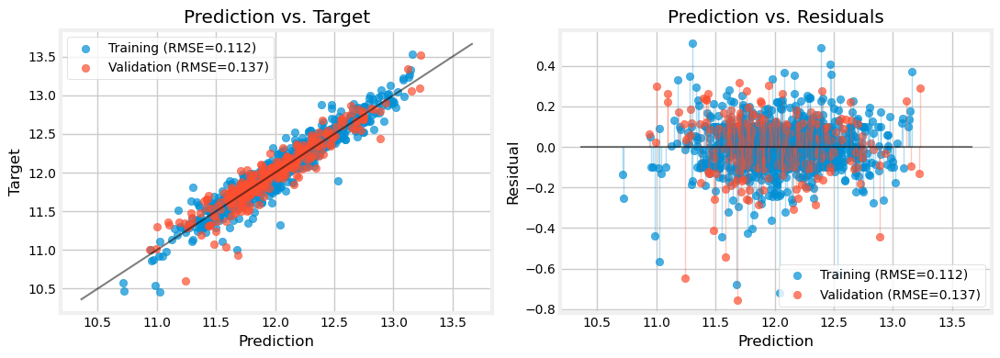



..................................................

Elapsed time: 0.04 minutes
..................................................



Time: 12:15:29
***************************************************************************
svr_eng , 	CV: True 

***************************************************************************
We will evaluate svr_eng with cross-validation.

 -> Creating instance of `RepeatedKFold`
......Done!
 -> Creating the CV search
......Done!

 -> Fitting the model
......Done!
 -> CV Results:
		best neg_root_mean_squared_error: -0.13205717180187765
		best params: {'model__C': np.float64(0.6743964654397515), 'model__epsilon': np.float64(0.032712866579415224), 'model__gamma': np.float64(0.012191827792494753), 'preprocessor__selector__best_k': 30, 'preprocessor__selector__t_thr': np.float64(0.1294281545121513), 'preprocessor__target_encoder__smoothing': np.float64(65.19980845951154)}
......Done!
 -> Making predictions
......Done!
 -> Creating Regression Reports
......Don

,Value
Explained Variance,0.909119
R2,0.908985
MAE,0.078687
MSE,0.014150
RMSE,0.118953
MedAE,0.050224
MAPE,0.006578




Regression Report: Validation
..................................................


,Value
Explained Variance,0.899012
R2,0.898964
MAE,0.086996
MSE,0.017535
RMSE,0.132421
MedAE,0.058025
MAPE,0.007330



 -> Computing Scores
......Done!
**************************************************
Prediction and Residual Plots:


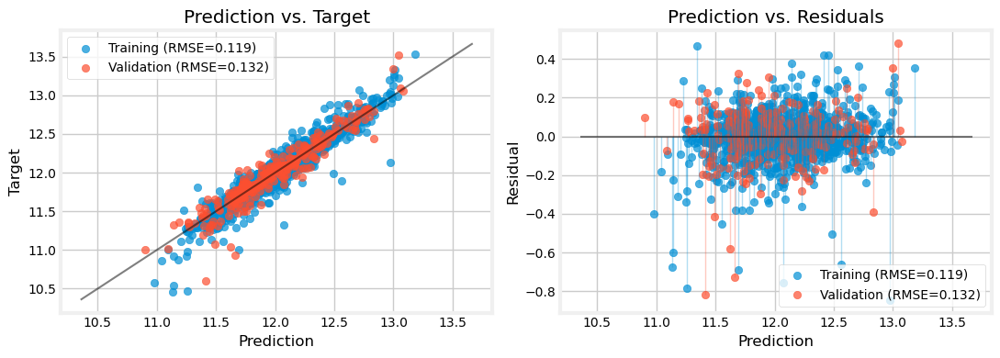



****************************************************************************************************
Performing Permutation Importance:
..................................................
The model's features are:

['OverallQualCond', '1and2FlrSF', 'TotalSF', 'GarageArea', 'AllBaths', 'Neighborhood', 'TotalBsmtSF', 'YearBuilt', 'GarageAge', '1stFlrSF', 'BsmtQual', 'MSSubClass', 'GarageCars', 'KitchenQual', 'FireplaceQu', 'RemodAge', 'LotFrontage', 'OverallQual', 'GarageFinish', 'FullBath', 'ExterQual', 'GarageType_1', '2ndFlrSF', 'BathsAbvGr', 'AllRooms', 'GarageType_4', 'GarageType_5', 'GarageType_3', 'Has_Bsmt', 'Has_2ndFlr', 'Has_Garage', 'GarageType_6', 'GarageType_2']
The most important features are:

	OverallQualCond: 0.07683313497060835 +- 0.007897832382916838
	1and2FlrSF: 0.06886009135555844 +- 0.007373127637255077
	TotalSF: 0.05948051875714637 +- 0.007300164078050766
	GarageArea: 0.04773484575532907 +- 0.013373494458445906
	AllBaths: 0.037448474968355926 +- 0.0037007893211832

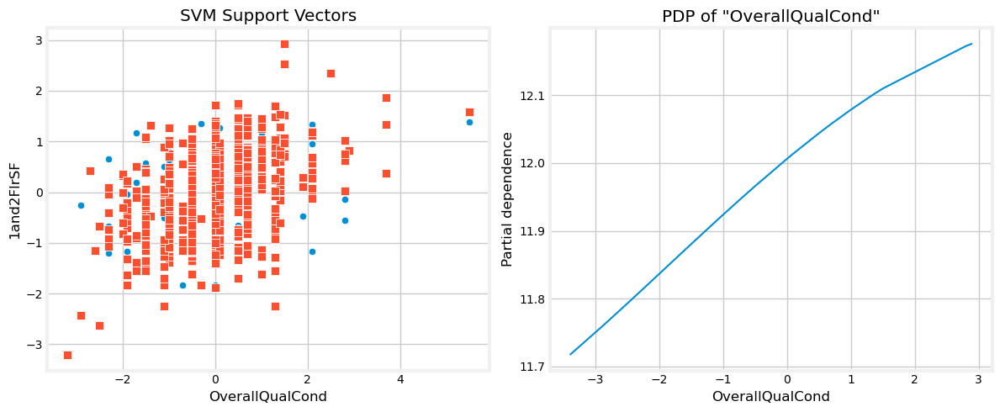

  0%|          | 0/50 [00:00<?, ?it/s]

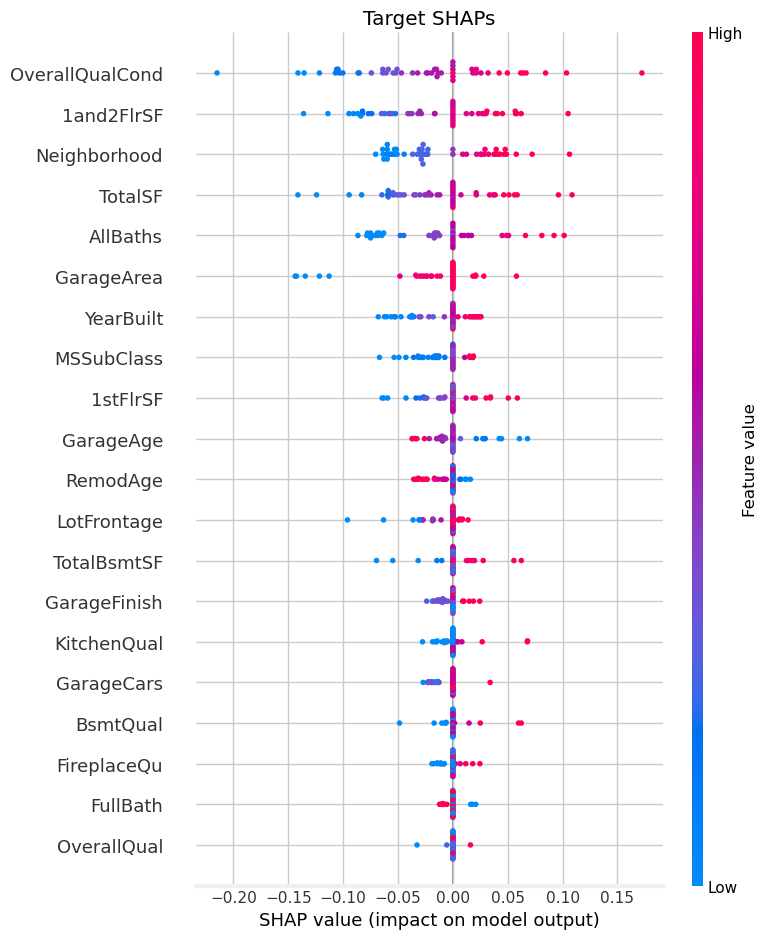

..................................................

Elapsed time: 28.09 minutes
..................................................



Time: 12:43:34
***************************************************************************
svr_clus , 	CV: False 

***************************************************************************
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
We will evaluate model=svr_clus with standard validation.
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::

 -> Fitting the model
......Done!
 -> Making predictions
......Done!
 -> Creating Regression Reports
......Done!


Regression Report: Training
..................................................


,Value
Explained Variance,0.921575
R2,0.921573
MAE,0.080232
MSE,0.012193
RMSE,0.110420
MedAE,0.065228
MAPE,0.006693




Regression Report: Validation
..................................................


,Value
Explained Variance,0.889349
R2,0.889083
MAE,0.098448
MSE,0.019250
RMSE,0.138745
MedAE,0.077934
MAPE,0.008294



 -> Computing Scores
......Done!
**************************************************
Prediction and Residual Plots:


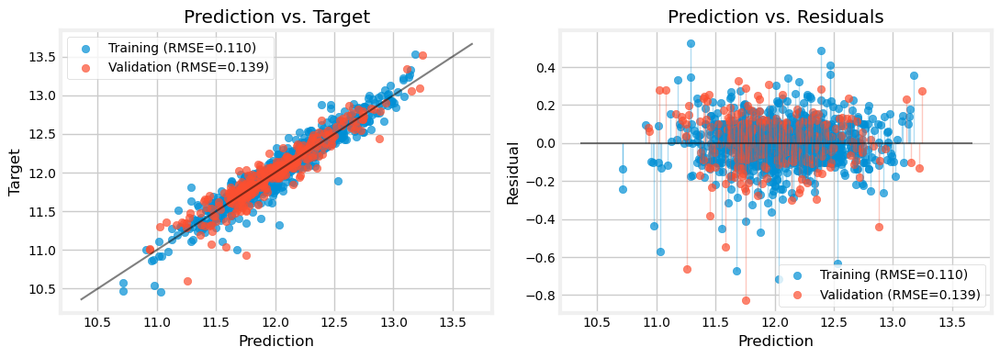



..................................................

Elapsed time: 0.04 minutes
..................................................



Time: 12:43:37
***************************************************************************
svr_clus , 	CV: True 

***************************************************************************
We will evaluate svr_clus with cross-validation.

 -> Creating instance of `RepeatedKFold`
......Done!
 -> Creating the CV search
......Done!

 -> Fitting the model


In [ ]:
model = 'svr'
redoQ = True

for pp in ['raw', 'eng', 'clus']:

    if pp == 'raw':
        continue
    
    for cvQ in [False, True]:

        print(time.strftime("Time: %H:%M:%S"))
        start = time.time()

        model_name = model+'_'+pp # full model name

        if redoQ and (model_name in search.keys()):
            del search[model_name]

        print("*"*75)
        print(model_name, ", \tCV:", cvQ, "\n")
        print("*"*75)
        
        # # GridSearchCV
        # model_evaluation(model_name, (X_train, X_val, y_train, y_val),
        #                  perform_cv_randomized=(cvQ, False),
        #                  n_splits=5, n_repeats=2,
        #                  verbose=True, plots=True)

        # RandomizedSearchCV
        model_evaluation(model_name, (X_train, X_val, y_train, y_val),
                         perform_cv_randomized=(cvQ, True),
                         n_splits=5, n_repeats=2,
                         n_iter=2000,
                         verbose=True, plots=True)

        print("\n")

        # if cross-validating:
        if cvQ:
            # explaining model
            explain_model(model_name, best_cv[model_name]['pipe'], (X_train, X_val, y_train, y_val), tree_idx=0, random_state=0)

            # saving model
            model_path = "../models/"+model_name+".pkl"
            
            with open(model_path, "wb") as f:
                dill.dump(best_cv[model_name]['pipe'], f)
        
        # done!!
        
        end = time.time()

        print("."*50)
        print(f"\nElapsed time: {(end-start)/60:.2f} minutes")
        print("."*50)

        print("\n\n")

In [515]:
scorecard

,dtr_base_no_cv,dtr_eng_no_cv,dtr_eng_cv,dtr_clus_no_cv,dtr_clus_cv,rfr_eng_no_cv,rfr_eng_cv,rfr_clus_no_cv,rfr_clus_cv,xgbr_eng_no_cv,xgbr_eng_cv,xgbr_clus_no_cv,xgbr_clus_cv,catbr_eng_no_cv,linreg_eng_no_cv,linreg_eng_cv,linreg_clus_no_cv,linreg_clus_cv,lasso_eng_no_cv,lasso_eng_cv,lasso_clus_no_cv,lasso_clus_cv,ridge_eng_no_cv,ridge_eng_cv,ridge_clus_no_cv,ridge_clus_cv,knn_eng_no_cv,knn_eng_cv,knn_clus_no_cv,knn_clus_cv,mlp_eng_no_cv,mlp_eng_cv,mlp_clus_no_cv,mlp_clus_cv,svr_eng_no_cv,svr_eng_cv,svr_clus_no_cv,svr_clus_cv
R2 Score Train,1.000000,0.999955,0.930213,0.999961,0.876380,0.982749,0.982821,0.982524,0.982262,0.998403,0.977811,0.999619,0.938369,0.980469,0.873561,0.885321,0.874522,0.885361,0.000000,0.884538,0.000000,0.880820,0.873315,0.882873,0.874513,0.883009,0.908603,0.999955,0.904808,0.999961,0.814484,0.849407,0.813874,0.858467,0.919967,0.908985,0.921573,0.915232
R2 Score Validation,0.673874,0.744735,0.836800,0.769110,0.841059,0.887390,0.890535,0.887616,0.884343,0.875854,0.893753,0.870324,0.885771,0.894647,0.888219,0.898505,0.888482,0.898033,-0.013284,0.899378,-0.013284,0.895605,0.888403,0.897325,0.888441,0.896030,0.870421,0.872643,0.859241,0.857009,0.787413,0.851955,0.736705,0.825078,0.891774,0.898964,0.889083,0.899027
RMSE Train,0.000000,0.002631,0.104161,0.002464,0.138631,0.051788,0.051680,0.052124,0.052513,0.015757,0.058734,0.007693,0.097886,0.055104,0.140203,0.133524,0.139669,0.133500,0.394291,0.133979,0.394291,0.136119,0.140340,0.134942,0.139674,0.134863,0.119202,0.002631,0.121651,0.002464,0.169828,0.153010,0.170107,0.148336,0.111545,0.118953,0.110420,0.114798
RMSE Validation,0.237910,0.210482,0.168298,0.200181,0.166087,0.139800,0.137834,0.139660,0.141679,0.146786,0.135793,0.150020,0.140802,0.135220,0.139285,0.132722,0.139121,0.133030,0.419358,0.132149,0.419358,0.134604,0.139170,0.133491,0.139146,0.134330,0.149964,0.148673,0.156300,0.157534,0.192082,0.160294,0.213767,0.174237,0.137052,0.132421,0.138745,0.132380


#### Engineered Cluster Model: exploration

In the cluster model, checking selected engineering features (from which PCA and clusters are built)

In [516]:
best_cv[model+'_clus']

{'pipe': Pipeline(steps=[('preprocessor',
                  Pipeline(steps=[('cleaning',
                                   Pipeline(steps=[('custom_imputer',
                                                    CustomImputer(groupby_cols={'BsmtCond': ['BsmtExposure',
                                                                                             'BsmtQual'],
                                                                                'BsmtExposure': ['BsmtQual',
                                                                                                 'BsmtCond'],
                                                                                'BsmtFinType2': ['BsmtQual',
                                                                                                 'BsmtCond'],
                                                                                'BsmtQual': ['BsmtCond',
                                                                                   

In [517]:
best_cv[model+'_clus']['params']

{'model__C': np.float64(0.776078107234565),
 'model__epsilon': np.float64(0.06550513459344416),
 'model__gamma': np.float64(0.01508325885512207),
 'preprocessor__cluster__n_clusters': 4,
 'preprocessor__pca__fit_feat_subset': True,
 'preprocessor__pca__keep_original_feats': False,
 'preprocessor__selector__best_k': 30,
 'preprocessor__selector__t_thr': np.float64(0.10431807930625175),
 'preprocessor__target_encoder__smoothing': np.float64(33.315606759705915)}

In [518]:
best_cv[model+'_clus']['pipe'].steps

[('preprocessor',
  Pipeline(steps=[('cleaning',
                   Pipeline(steps=[('custom_imputer',
                                    CustomImputer(groupby_cols={'BsmtCond': ['BsmtExposure',
                                                                             'BsmtQual'],
                                                                'BsmtExposure': ['BsmtQual',
                                                                                 'BsmtCond'],
                                                                'BsmtFinType2': ['BsmtQual',
                                                                                 'BsmtCond'],
                                                                'BsmtQual': ['BsmtCond',
                                                                             'BsmtExposure'],
                                                                'Exterior1st': 'Foundation',
                                                                

In [519]:
best_preproc = best_cv[model+'_clus']['pipe'].steps[0][1] # the best preprocessor
best_feats = best_preproc[:-3] # all the preprocessor steps, except for PCA, KMeans clustering, and OHE
best_feats.transform(X_train)

,TotalSF,OverallQual,1and2FlrSF,Neighborhood,OverallQualCond,GarageCars,AllRooms,GarageArea,YearBuilt,BathsAbvGr,TotalBsmtSF,1stFlrSF,AllBaths,HouseAge,ExterQual,KitchenQual,BsmtQual,GarageAge,RemodAge,FullBath,GarageFinish,MSSubClass,GarageType,FireplaceQu,Foundation,LotFrontage,Has_Garage,Has_Bsmt
921,0.822593,-0.5,0.883605,-1.049372,0.0,-2.0,1.833333,-11.484445,-1.574468,1.0,0.474238,0.311465,3.0,0.589245,0.0,0.0,-1.0,2.212047,-0.250000,0.0,-2.0,-0.829201,6,-0.50,1,-0.152242,0,1
520,-1.637012,-1.0,-0.269679,-1.167809,-0.7,-2.0,0.166667,-11.484445,-1.574468,0.0,-14.082269,-0.975073,0.0,0.589245,0.0,0.0,-4.0,2.212047,-0.166667,0.0,-2.0,-0.720093,6,-0.50,0,-0.535329,0,0
401,0.120837,0.5,-0.242979,0.226057,0.0,0.0,-0.166667,-0.338266,0.659574,0.0,0.534128,0.373991,0.0,-1.484627,1.0,1.0,0.0,-1.453435,-0.361111,0.0,1.0,-0.036395,1,0.50,2,-0.257516,1,1
280,0.276629,0.5,0.656817,0.086136,0.7,0.0,0.333333,0.335169,0.319149,0.5,-0.451321,0.142984,0.5,-0.316879,1.0,1.0,0.0,-0.259602,0.111111,0.0,1.0,1.140092,1,0.25,1,0.550685,1,1
1401,-0.064737,0.0,0.182014,0.111852,-0.5,0.0,1.000000,-0.347564,0.638298,0.5,-0.372238,-0.509924,1.5,-1.009346,0.0,0.0,-1.0,-0.967537,-0.277778,0.0,1.0,1.104893,1,0.25,2,-0.421564,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
715,-0.083251,0.0,-0.177629,0.069622,-0.5,0.0,0.166667,-0.007748,0.000000,0.0,0.110991,0.437880,0.0,0.014612,0.0,0.0,0.0,0.079295,0.583333,0.0,0.0,0.008392,1,0.25,1,0.376507,1,1
905,-0.408079,-0.5,-0.696887,-0.773943,-1.0,-1.0,-0.166667,-0.999541,-0.425532,-1.0,0.095638,-0.069767,0.0,0.252972,0.0,0.0,-1.0,0.322980,1.166667,-1.0,0.0,0.008392,1,-0.50,1,0.464671,1,1
1096,-0.503985,0.0,-0.169596,-1.286901,0.7,-2.0,0.000000,-11.484445,-1.276596,-0.5,-0.787573,-0.746216,-0.5,0.512449,0.0,1.0,-1.0,2.211783,-0.361111,-1.0,-2.0,-0.279068,6,-0.50,2,-0.535329,0,1
235,-1.319293,0.0,-0.858025,-0.919081,-1.7,-1.0,-0.666667,-1.108558,-0.063830,-0.5,-1.494787,-1.744221,-0.5,0.042657,0.0,0.0,-1.0,0.107966,0.638889,-1.0,-1.0,-0.878675,5,-0.50,1,-4.131663,1,1


In [520]:
best_preproc

,steps,"[('cleaning', ...), ('feature_engineer', ...), ...]"
,transform_input,None
,memory,None
,verbose,False
,steps,"[('custom_imputer', ...), ('rules_based_imputer', ...), ...]"
,transform_input,None
,memory,None
,verbose,False
,strategies,"{'Alley': 'NA', 'Electrical': 'mode', 'Exterior1st': 'group_mode', 'Exterior2nd': 'group_mode', ...}"
,groupby_cols,"{'BsmtCond': ['BsmtExposure', 'BsmtQual'], 'BsmtExposure': ['BsmtQual', 'BsmtCond'], 'BsmtFinType2': ['BsmtQual', 'BsmtCond'], 'BsmtQual': ['BsmtCond', 'BsmtExposure'], ...}"
,rules,"[{'column': 'MasVnrArea', 'condition': <function <la...x73b6680662a0>, 'value': 0.0}, {'column': 'MasVnrType', 'condition': <function <la...x73b668066660>, 'value': 'NA'}, ...]"


In [521]:
del best_preproc, best_feats

#### Cleanup

In [522]:
Out.clear()

for name in dir():
    if name.startswith('_') and name[1:].isdigit():
        del globals()[name]

### Saving scorecard

We now save the scorecard of individual models.

In [552]:
scorecard

,dtr_base_no_cv,dtr_eng_no_cv,dtr_eng_cv,dtr_clus_no_cv,dtr_clus_cv,rfr_eng_no_cv,rfr_eng_cv,rfr_clus_no_cv,rfr_clus_cv,xgbr_eng_no_cv,xgbr_eng_cv,xgbr_clus_no_cv,xgbr_clus_cv,catbr_eng_no_cv,linreg_eng_no_cv,linreg_eng_cv,linreg_clus_no_cv,linreg_clus_cv,lasso_eng_no_cv,lasso_eng_cv,lasso_clus_no_cv,lasso_clus_cv,ridge_eng_no_cv,ridge_eng_cv,ridge_clus_no_cv,ridge_clus_cv,knn_eng_no_cv,knn_eng_cv,knn_clus_no_cv,knn_clus_cv,mlp_eng_no_cv,mlp_eng_cv,mlp_clus_no_cv,mlp_clus_cv,svr_eng_no_cv,svr_eng_cv,svr_clus_no_cv,svr_clus_cv,catbr_eng_cv,catbr_clus_no_cv,catbr_clus_cv
R2 Score Train,1.000000,0.999955,0.930213,0.999961,0.876380,0.982749,0.982821,0.982524,0.982262,0.998403,0.977811,0.999619,0.938369,0.980425,0.873561,0.885321,0.874522,0.885361,0.000000,0.884538,0.000000,0.880820,0.873315,0.882873,0.874513,0.883009,0.908603,0.999955,0.904808,0.999961,0.814484,0.849407,0.813874,0.858467,0.919967,0.908985,0.921573,0.915232,0.977340,0.985819,0.970693
R2 Score Validation,0.673874,0.744735,0.836800,0.769110,0.841059,0.887390,0.890535,0.887616,0.884343,0.875854,0.893753,0.870324,0.885771,0.892259,0.888219,0.898505,0.888482,0.898033,-0.013284,0.899378,-0.013284,0.895605,0.888403,0.897325,0.888441,0.896030,0.870421,0.872643,0.859241,0.857009,0.787413,0.851955,0.736705,0.825078,0.891774,0.898964,0.889083,0.899027,0.900858,0.889230,0.892062
RMSE Train,0.000000,0.002631,0.104161,0.002464,0.138631,0.051788,0.051680,0.052124,0.052513,0.015757,0.058734,0.007693,0.097886,0.055165,0.140203,0.133524,0.139669,0.133500,0.394291,0.133979,0.394291,0.136119,0.140340,0.134942,0.139674,0.134863,0.119202,0.002631,0.121651,0.002464,0.169828,0.153010,0.170107,0.148336,0.111545,0.118953,0.110420,0.114798,0.059353,0.046953,0.067500
RMSE Validation,0.237910,0.210482,0.168298,0.200181,0.166087,0.139800,0.137834,0.139660,0.141679,0.146786,0.135793,0.150020,0.140802,0.136744,0.139285,0.132722,0.139121,0.133030,0.419358,0.132149,0.419358,0.134604,0.139170,0.133491,0.139146,0.134330,0.149964,0.148673,0.156300,0.157534,0.192082,0.160294,0.213767,0.174237,0.137052,0.132421,0.138745,0.132380,0.131174,0.138653,0.136870


In [553]:
scorecard.to_csv("../models/scorecard_1model.csv")

In [554]:
scorecard.T.loc[[idx for idx in scorecard.T.index if '_no_cv' not in idx],:].sort_values(by='RMSE Validation')

,R2 Score Train,R2 Score Validation,RMSE Train,RMSE Validation
catbr_eng_cv,0.977340,0.900858,0.059353,0.131174
lasso_eng_cv,0.884538,0.899378,0.133979,0.132149
svr_clus_cv,0.915232,0.899027,0.114798,0.132380
svr_eng_cv,0.908985,0.898964,0.118953,0.132421
linreg_eng_cv,0.885321,0.898505,0.133524,0.132722
linreg_clus_cv,0.885361,0.898033,0.133500,0.133030
ridge_eng_cv,0.882873,0.897325,0.134942,0.133491
ridge_clus_cv,0.883009,0.896030,0.134863,0.134330
lasso_clus_cv,0.880820,0.895605,0.136119,0.134604
xgbr_eng_cv,0.977811,0.893753,0.058734,0.135793


## 8. Ensemble Models

In this section we create two mixed models: a stacked model with N previously fitted estimators, and a two-stage refressor hybrid model, where the second model fits the residuals of the first.

### Loading Modules

In [81]:
from sklearn.base import RegressorMixin
from sklearn.model_selection import check_cv
from sklearn.linear_model import LassoCV, RidgeCV

### Preamble

Path to models:

In [82]:
models_directory = "../models/"

A scorecard for the hybrid models:

In [625]:
# Create a score dataframe
mixed_scorecard = pd.DataFrame(index = ['R2 Score Train',
                                        'R2 Score Validation',
                                        'RMSE Train',
                                        'RMSE Validation'])

### Model 11: `StackedRegressor`

#### Defining the Stacked Model

In [115]:
class StackedRegressor(BaseEstimator, TransformerMixin, RegressorMixin):
    """
    A scikit-learn-compatible stacking regressor using pre-fitted base estimators.

    This meta-regressor combines the predictions from multiple pre-fitted pipelines (typically full preprocessing + model) and fits a final estimator on top, using out-of-fold predictions from the base estimators if a cross-validation strategy is provided.

    Parameters
    ----------
    estimators : list of (str, estimator)
        A list of name–estimator pairs. Each estimator must already be fitted (e.g., full pipeline including preprocessing and final regressor).
    final_estimator : estimator object
        A scikit-learn compatible regressor that learns from the base estimators' predictions. Will be cloned before fitting.
    passthrough : bool, default=False
        If True, the original features `X` are concatenated with the base estimator predictions before being passed to the `final_estimator`.
    cv : int, cross-validation generator, or iterable, default=None
        Cross-validation strategy to compute out-of-fold predictions from the base estimators. If None, uses full-data predictions directly.

    Attributes
    ----------
    final_estimator_ : estimator
        The fitted final regressor trained on out-of-fold predictions (and possibly `X`).

    Notes
    -----
    - All base estimators are assumed to be pre-fitted. This is useful in contexts where models are expensive to retrain or built externally.
    - Cross-validation ensures predictions used to train the `final_estimator` are unbiased.
    - This design supports stacking on top of pipelines with preprocessing steps.
    - Predictions are returned in the same order as the input.

    Examples
    --------
    >>> stack = StackedRegressor(
    ...     estimators=[('rf', rf_pipeline), ('xgb', xgb_pipeline)],
    ...     final_estimator=LinearRegression(),
    ...     passthrough=True,
    ...     cv=5
    ... )
    >>> stack.fit(X_train, y_train)
    >>> preds = stack.predict(X_test)
    """

    def __init__(self, estimators, final_estimator, passthrough=False, cv=None):
        self.estimators = estimators
        self.final_estimator = final_estimator
        self.passthrough = passthrough
        self.cv = cv

    def fit(self, X, y=None):
        X_df = pd.DataFrame(X)
        y = pd.Series(y, index=X_df.index)  # Ensure y is a Series

        # Ensure all base estimators are pre-fitted
        for name, est in self.estimators:
            check_is_fitted(est)

        # If CV specified, generate out-of-fold predictions
        if self.cv is not None:
            # Prepare CV splitter and compute splits once
            cv = check_cv(self.cv, y, classifier=False)
            splits = list(cv.split(X_df, y))

            # DataFrame to hold OOF preds
            oof_preds = pd.DataFrame(index=X_df.index)

            # Loop once per estimator, but reuse the same splits
            for name, est in self.estimators:
                preds = pd.Series(index=X_df.index, dtype=float)
                for train_idx, test_idx in splits:
                    X_test = X_df.iloc[test_idx]
                    preds.iloc[test_idx] = est.predict(X_test)
                oof_preds[name] = preds

            # Combine features
            if self.passthrough:
                feats = pd.concat([X_df.reset_index(drop=True), oof_preds.reset_index(drop=True)], axis=1)
            else:
                feats = oof_preds

            # Fit final_estimator on full OOF matrix
            self.final_estimator_ = clone(self.final_estimator)
            self.final_estimator_.fit(feats, y)

        else:
            # No CV: use full-data predictions as features
            preds = self._get_base_predictions(X_df)
            if self.passthrough:
                feats = pd.concat([X_df.reset_index(drop=True), preds.reset_index(drop=True)], axis=1)
            else:
                feats = preds
            self.final_estimator_ = clone(self.final_estimator)
            self.final_estimator_.fit(feats, y)

        return self

    def _get_base_predictions(self, X):
        """Get predictions from each pre-fitted base estimator as DataFrame."""
        X_df = pd.DataFrame(X)
        cols = {}
        for name, est in self.estimators:
            cols[name] = est.predict(X_df)
        return pd.DataFrame(cols, index=X_df.index)

    def transform(self, X):
        X_df = pd.DataFrame(X)
        base_preds = self._get_base_predictions(X_df)
        if self.passthrough:
            return pd.concat([X_df.reset_index(drop=True), base_preds.reset_index(drop=True)], axis=1)
        return base_preds

    def predict(self, X):
        feats = self.transform(X)
        return self.final_estimator_.predict(feats)

#### Preparing Pipeline

Let us begin by importing the scorecard of single estimator models:

In [651]:
scorecardT = pd.read_csv(models_directory+"scorecard_1model.csv", index_col=0).T

scorecardT = scorecardT.loc[[idx for idx in scorecardT.index if 'no_cv' not in idx],:]

scorecardT = scorecardT.sort_values(by='RMSE Validation')

scorecardT

,R2 Score Train,R2 Score Validation,RMSE Train,RMSE Validation
catbr_eng_cv,0.977340,0.900858,0.059353,0.131174
lasso_eng_cv,0.884538,0.899378,0.133979,0.132149
svr_clus_cv,0.915232,0.899027,0.114798,0.132380
svr_eng_cv,0.908985,0.898964,0.118953,0.132421
linreg_eng_cv,0.885321,0.898505,0.133524,0.132722
linreg_clus_cv,0.885361,0.898033,0.133500,0.133030
ridge_eng_cv,0.882873,0.897325,0.134942,0.133491
ridge_clus_cv,0.883009,0.896030,0.134863,0.134330
lasso_clus_cv,0.880820,0.895605,0.136119,0.134604
xgbr_eng_cv,0.977811,0.893753,0.058734,0.135793


Now, let us select the two best performing prefitted models:

In [652]:
# prefitted_models = scorecardT.index.to_list()[:2]
# prefitted_models = [model_name.removesuffix("_cv") for model_name in prefitted_models]

# prefitted_models

Or just choose whatever we want:

In [653]:
prefitted_models = ['catbr_eng', 'xgbr_eng']

Let us now import them, and add them to our `estimators` list:

In [654]:
estimators = []

for filename in os.listdir(models_directory):
    model_path = os.path.join(models_directory, filename)

    model = model_path.removesuffix('.pkl').removeprefix('../models/')

    if model not in prefitted_models:
        continue

    else:
        with open(model_path, "rb") as f:
            estimators.append((model, dill.load(f)))

We are ready to define the final pipeline:

In [661]:
stacked_model_name = 'stacked_lasso_catbr-xgbr'

if 'linreg_' in stacked_model_name:
    fe = LinearRegression(fit_intercept=True)
elif 'lasso_' in stacked_model_name:
    fe = LassoCV(fit_intercept=True)
elif 'ridge_' in stacked_model_name:
    fe = RidgeCV(fit_intercept=True)

stacked_model = StackedRegressor(estimators=estimators,
                                 final_estimator=fe,
                                 passthrough=False,
                                 cv=5)

pipe[stacked_model_name+'_no_cv'] = Pipeline(steps=[("model", stacked_model)])

del stacked_model, fe

In [662]:
pipe[stacked_model_name+'_no_cv'].steps[-1][1]

,estimators,"[('xgbr_eng', ...), ('catbr_eng', ...)]"
,final_estimator,LassoCV()
,passthrough,False
,cv,5
,eps,0.001
,n_alphas,'deprecated'
,alphas,'warn'
,fit_intercept,True
,precompute,'auto'
,max_iter,1000
,tol,0.0001


#### Fitting the Stacked Model

Time: 15:26:41
***************************************************************************
stacked_lasso_catbr-xgbr 

***************************************************************************
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
We will evaluate model=stacked_lasso_catbr-xgbr with standard validation.
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::

 -> Fitting the model
......Done!
 -> Making predictions
......Done!
 -> Creating Regression Reports
......Done!


Regression Report: Training
..................................................


,Value
Explained Variance,0.978665
R2,0.978656
MAE,0.042871
MSE,0.003318
RMSE,0.057604
MedAE,0.033858
MAPE,0.003571




Regression Report: Validation
..................................................


,Value
Explained Variance,0.902756
R2,0.902742
MAE,0.086835
MSE,0.016880
RMSE,0.129922
MedAE,0.064036
MAPE,0.007308



 -> Computing Scores
......Done!
**************************************************
Prediction and Residual Plots:


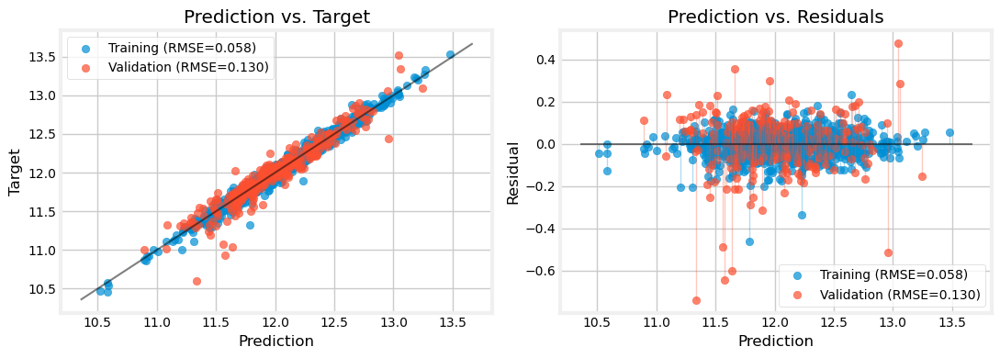



..................................................

Elapsed time: 0.03 minutes
..................................................





In [663]:
stacked_model_name

print(time.strftime("Time: %H:%M:%S"))
start = time.time()

print("*"*75)
print(stacked_model_name, "\n")
print("*"*75)

model_evaluation(stacked_model_name,
                 (X_train, X_val, y_train, y_val),
                 perform_cv_randomized=(False, False),
                 verbose=True, plots=True,
                 scorecard=mixed_scorecard)

print("\n")

end = time.time()

print("."*50)
print(f"\nElapsed time: {(end-start)/60:.2f} minutes")
print("."*50)

print("\n\n")

The coefficients of the Linear Regressor:

In [664]:
display(pipe[stacked_model_name+'_no_cv'].transform(X_train))

print(pipe[stacked_model_name+'_no_cv'].steps[-1][1].final_estimator_.coef_)

,xgbr_eng,catbr_eng
921,11.907022,11.909518
520,11.522702,11.567165
401,12.135092,12.138642
280,12.266923,12.316108
1401,12.122647,12.118215
...,...,...
715,11.959935,11.969090
905,11.769417,11.771765
1096,11.735326,11.725174
235,11.324544,11.327691


[0.26638852 0.74710309]


In [665]:
mixed_scorecard.T.sort_values(by='RMSE Validation')

,R2 Score Train,R2 Score Validation,RMSE Train,RMSE Validation
stacked_lasso_catbr-xgbr_no_cv,0.978656,0.902742,0.057604,0.129922


#### Saving the Stacked Model

In [666]:
# saving model
model_path = models_directory+stacked_model_name+".pkl"

with open(model_path, "wb") as f:
    dill.dump(pipe[stacked_model_name+'_no_cv'], f)

### Model 12: `TwoStageRegressor` (Residual Fitting)

#### Defining the Hybrid Regressor

In [116]:
class TwoStageRegressor(BaseEstimator, RegressorMixin):
    """
    A two-stage regressor that fits the second estimator on residuals of the first.

    Parameters
    ----------
    first_estimator : estimator object
        The primary regressor to fit first.
    second_estimator : estimator object
        The regressor to fit on residuals of the first.
    """

    def __init__(self, first_estimator, second_estimator):
        self.first_estimator = first_estimator
        self.second_estimator = second_estimator

    def fit(self, X, y):
        X_df = pd.DataFrame(X)
        y = pd.Series(y, index=X_df.index)  # Ensure y is Series
        self.first_ = clone(self.first_estimator)
        self.first_.fit(X_df, y)
        residuals = y - pd.Series(self.first_.predict(X_df), index=X_df.index)
        self.second_ = clone(self.second_estimator)
        self.second_.fit(X_df, residuals)
        return self

    def predict(self, X):
        X_df = pd.DataFrame(X)
        pred1 = self.first_.predict(X_df)
        pred2 = self.second_.predict(X_df)
        return pred1 + pred2

#### Preparing Pipeline

We shall use `Lasso` as the first stage, and `XGBoostRegressor` as the second.

In [668]:
model = '2stage_lasso-xgbr'

for pp in ['raw', 'eng', 'clus']:

    if pp == 'raw':
        continue

    model_name = model+'_'+pp # full model name

    preproc_pipe = clone(final_preproc[pp]) # preprocessing  pipeline

    # xgbr
    pipe[model_name] =\
        Pipeline(steps=[('preprocessor', preproc_pipe),
                        ('model', TwoStageRegressor(
                            first_estimator=Lasso(fit_intercept=True),
                            second_estimator=XGBRegressor())
                         )]
                 )

    # defining the hyperparameter grid
    # basic:
    param_grid[model_name] = {'preprocessor__target_encoder__smoothing':\
                                  uniform(loc=1, scale=99),
                              'preprocessor__selector__best_k':\
                                  list(range(10, 40, 10)),
                              'preprocessor__selector__t_thr':\
                                  uniform(loc=0.1, scale=0.8)
                             }
    # if clustering:
    if pp == 'clus':
        param_grid[model_name]['preprocessor__pca__fit_feat_subset'] =\
                        [True]
        param_grid[model_name]['preprocessor__pca__keep_original_feats'] =\
            [False]
        param_grid[model_name]['preprocessor__cluster__n_clusters'] =\
            list(range(3,7))

    # proper to the model:
    param_grid[model_name]['model__first_estimator__alpha'] =\
        loguniform(1e-4, 10.)
    # xgbr
    param_grid[model_name]['model__second_estimator__n_estimators'] =\
        [100*i for i in range(1, 11)]
    param_grid[model_name]['model__second_estimator__learning_rate'] =\
        loguniform(1.e-2, 0.5)
    param_grid[model_name]['model__second_estimator__max_depth'] =\
        list(range(3,11))

#### Fitting the Hybrid Model

Time: 15:27:01
***************************************************************************
2stage_lasso-xgbr_eng , 	CV: True 

***************************************************************************
We will evaluate 2stage_lasso-xgbr_eng with cross-validation.

 -> Creating instance of `RepeatedKFold`
......Done!
 -> Creating the CV search
......Done!

 -> Fitting the model


/home/mbuenabad/miniforge3/envs/ml_env/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.709e-02, tolerance: 1.494e-02
  model = cd_fast.enet_coordinate_descent(
/home/mbuenabad/miniforge3/envs/ml_env/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.495e-02, tolerance: 1.428e-02
  model = cd_fast.enet_coordinate_descent(
/home/mbuenabad/miniforge3/envs/ml_env/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the featu

......Done!
 -> CV Results:
		best neg_root_mean_squared_error: -0.139110564516917
		best params: {'model__first_estimator__alpha': np.float64(4.13718958397413), 'model__second_estimator__learning_rate': np.float64(0.06880513431567901), 'model__second_estimator__max_depth': 4, 'model__second_estimator__n_estimators': 400, 'preprocessor__selector__best_k': 30, 'preprocessor__selector__t_thr': np.float64(0.1817460058821972), 'preprocessor__target_encoder__smoothing': np.float64(60.25117736620161)}
......Done!
 -> Making predictions
......Done!
 -> Creating Regression Reports
......Done!


Regression Report: Training
..................................................


,Value
Explained Variance,0.987546
R2,0.987546
MAE,0.032487
MSE,0.001936
RMSE,0.044002
MedAE,0.023558
MAPE,0.002704




Regression Report: Validation
..................................................


,Value
Explained Variance,0.891410
R2,0.891125
MAE,0.093427
MSE,0.018896
RMSE,0.137462
MedAE,0.067970
MAPE,0.007848



 -> Computing Scores
......Done!
**************************************************
Prediction and Residual Plots:


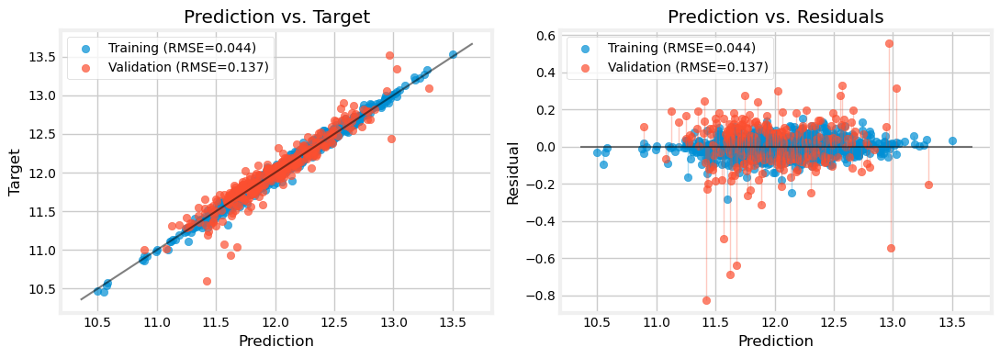



..................................................

Elapsed time: 34.31 minutes
..................................................



Time: 16:01:19
***************************************************************************
2stage_lasso-xgbr_clus , 	CV: True 

***************************************************************************
We will evaluate 2stage_lasso-xgbr_clus with cross-validation.

 -> Creating instance of `RepeatedKFold`
......Done!
 -> Creating the CV search
......Done!

 -> Fitting the model


/home/mbuenabad/miniforge3/envs/ml_env/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.948e-02, tolerance: 1.394e-02
  model = cd_fast.enet_coordinate_descent(
/home/mbuenabad/miniforge3/envs/ml_env/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.903e-02, tolerance: 1.494e-02
  model = cd_fast.enet_coordinate_descent(
/home/mbuenabad/miniforge3/envs/ml_env/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the featu

......Done!
 -> CV Results:
		best neg_root_mean_squared_error: -0.142773958269085
		best params: {'model__first_estimator__alpha': np.float64(0.05976824963572212), 'model__second_estimator__learning_rate': np.float64(0.04700777917932611), 'model__second_estimator__max_depth': 5, 'model__second_estimator__n_estimators': 800, 'preprocessor__cluster__n_clusters': 6, 'preprocessor__pca__fit_feat_subset': True, 'preprocessor__pca__keep_original_feats': False, 'preprocessor__selector__best_k': 20, 'preprocessor__selector__t_thr': np.float64(0.19513355371681085), 'preprocessor__target_encoder__smoothing': np.float64(42.3363808986888)}
......Done!
 -> Making predictions
......Done!
 -> Creating Regression Reports
......Done!


Regression Report: Training
..................................................


,Value
Explained Variance,0.999241
R2,0.999241
MAE,0.007843
MSE,0.000118
RMSE,0.010861
MedAE,0.005536
MAPE,0.000653




Regression Report: Validation
..................................................


,Value
Explained Variance,0.874421
R2,0.874339
MAE,0.103744
MSE,0.021809
RMSE,0.147679
MedAE,0.072483
MAPE,0.008741



 -> Computing Scores
......Done!
**************************************************
Prediction and Residual Plots:


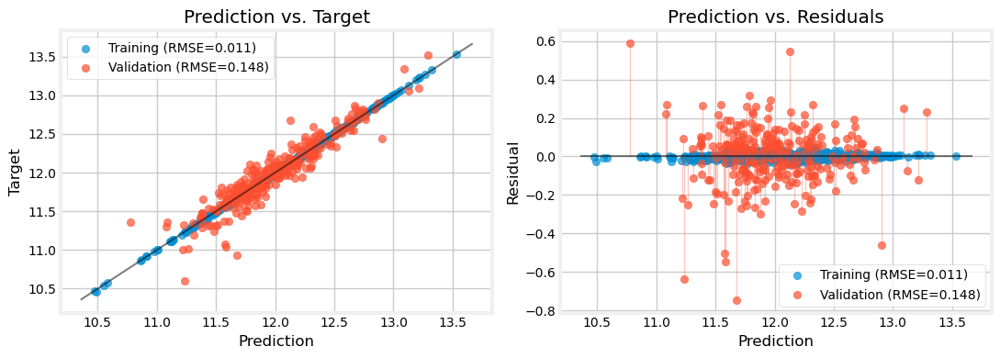



..................................................

Elapsed time: 39.24 minutes
..................................................





In [669]:
model = '2stage_lasso-xgbr'
redoQ = True

for pp in ['raw', 'eng', 'clus']:

    if pp == 'raw':
        continue
    
    print(time.strftime("Time: %H:%M:%S"))
    start = time.time()

    model_name = model+'_'+pp # full model name

    if redoQ and (model_name in search.keys()):
        del search[model_name]

    print("*"*75)
    print(model_name, ", \tCV:", True, "\n")
    print("*"*75)

    # RandomizedSearchCV
    model_evaluation(model_name, (X_train, X_val, y_train, y_val),
                     perform_cv_randomized=(True, True),
                     n_splits=5, n_repeats=2,
                     n_iter=2000,
                     verbose=True, plots=True,
                     scorecard=mixed_scorecard)

    print("\n")

    # saving model
    model_path = "../models/"+model_name+".pkl"
            
    with open(model_path, "wb") as f:
        dill.dump(best_cv[model_name]['pipe'], f)
    # done!
        
    end = time.time()

    print("."*50)
    print(f"\nElapsed time: {(end-start)/60:.2f} minutes")
    print("."*50)

    print("\n\n")

In [670]:
model = '2stage_lasso-catbr'

for pp in ['raw', 'eng', 'clus']:

    if pp == 'raw':
        continue

    model_name = model+'_'+pp # full model name

    preproc_pipe = clone(final_preproc[pp]) # preprocessing  pipeline

    # catbr
    pipe[model_name] =\
        Pipeline(steps=[('preprocessor', preproc_pipe),
                        ('model', TwoStageRegressor(
                            first_estimator=Lasso(fit_intercept=True),
                            second_estimator=CatBoostRegressor(random_state=0,
                                                thread_count=1,
                                                verbose=False,
                                                allow_writing_files=False))
                         )]
                 )

    # defining the hyperparameter grid
    # basic:
    param_grid[model_name] = {'preprocessor__target_encoder__smoothing':\
                                  uniform(loc=1, scale=99),
                              'preprocessor__selector__best_k':\
                                  list(range(10, 40, 10)),
                              'preprocessor__selector__t_thr':\
                                  uniform(loc=0.1, scale=0.8)
                             }
    # if clustering:
    if pp == 'clus':
        param_grid[model_name]['preprocessor__pca__fit_feat_subset'] =\
                        [True]
        param_grid[model_name]['preprocessor__pca__keep_original_feats'] =\
            [False]
        param_grid[model_name]['preprocessor__cluster__n_clusters'] =\
            list(range(3,7))

    # proper to the model:
    param_grid[model_name]['model__first_estimator__alpha'] =\
        loguniform(1e-4, 10.)
    # catbr
    param_grid[model_name]['model__second_estimator__iterations'] =\
        [100*i for i in range(1, 11)]
    param_grid[model_name]['model__second_estimator__learning_rate'] =\
        loguniform(1.e-2, 0.5)
    param_grid[model_name]['model__second_estimator__depth'] =\
        list(range(4,11))

Time: 16:40:34
***************************************************************************
2stage_lasso-catbr_eng , 	CV: True 

***************************************************************************
We will evaluate 2stage_lasso-catbr_eng with cross-validation.

 -> Creating instance of `RepeatedKFold`
......Done!
 -> Creating the CV search
......Done!

 -> Fitting the model


/home/mbuenabad/miniforge3/envs/ml_env/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.528e-02, tolerance: 1.494e-02
  model = cd_fast.enet_coordinate_descent(
/home/mbuenabad/miniforge3/envs/ml_env/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.438e-02, tolerance: 1.428e-02
  model = cd_fast.enet_coordinate_descent(
/home/mbuenabad/miniforge3/envs/ml_env/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the featu

......Done!
 -> CV Results:
		best neg_root_mean_squared_error: -0.1307212317260745
		best params: {'model__first_estimator__alpha': np.float64(0.942196670041553), 'model__second_estimator__depth': 7, 'model__second_estimator__iterations': 900, 'model__second_estimator__learning_rate': np.float64(0.013779214897093158), 'preprocessor__selector__best_k': 30, 'preprocessor__selector__t_thr': np.float64(0.11677341630228116), 'preprocessor__target_encoder__smoothing': np.float64(32.33116228614302)}
......Done!
 -> Making predictions
......Done!
 -> Creating Regression Reports
......Done!


Regression Report: Training
..................................................


,Value
Explained Variance,0.959799
R2,0.959798
MAE,0.058023
MSE,0.006250
RMSE,0.079057
MedAE,0.045328
MAPE,0.004834




Regression Report: Validation
..................................................


,Value
Explained Variance,0.902603
R2,0.902505
MAE,0.086089
MSE,0.016921
RMSE,0.130080
MedAE,0.060095
MAPE,0.007246



 -> Computing Scores
......Done!
**************************************************
Prediction and Residual Plots:


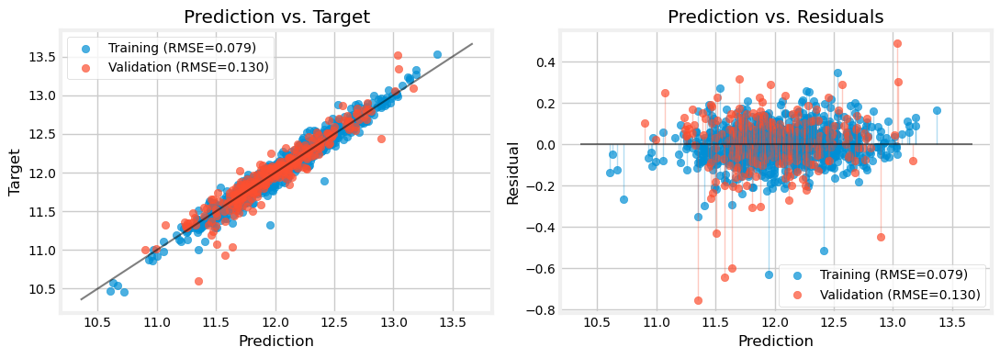



..................................................

Elapsed time: 67.85 minutes
..................................................



Time: 17:48:25
***************************************************************************
2stage_lasso-catbr_clus , 	CV: True 

***************************************************************************
We will evaluate 2stage_lasso-catbr_clus with cross-validation.

 -> Creating instance of `RepeatedKFold`
......Done!
 -> Creating the CV search
......Done!

 -> Fitting the model


/home/mbuenabad/miniforge3/envs/ml_env/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.395e-02, tolerance: 1.494e-02
  model = cd_fast.enet_coordinate_descent(
/home/mbuenabad/miniforge3/envs/ml_env/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.111e-02, tolerance: 1.394e-02
  model = cd_fast.enet_coordinate_descent(
/home/mbuenabad/miniforge3/envs/ml_env/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the featu

In [ ]:
model = '2stage_lasso-catbr'
redoQ = True

for pp in ['raw', 'eng', 'clus']:

    if pp == 'raw':
        continue
    
    print(time.strftime("Time: %H:%M:%S"))
    start = time.time()

    model_name = model+'_'+pp # full model name

    if redoQ and (model_name in search.keys()):
        del search[model_name]

    print("*"*75)
    print(model_name, ", \tCV:", True, "\n")
    print("*"*75)

    # RandomizedSearchCV
    model_evaluation(model_name, (X_train, X_val, y_train, y_val),
                     perform_cv_randomized=(True, True),
                     n_splits=5, n_repeats=2,
                     n_iter=2000,
                     verbose=True, plots=True,
                     scorecard=mixed_scorecard)

    print("\n")

    # saving model
    model_path = "../models/"+model_name+".pkl"
            
    with open(model_path, "wb") as f:
        dill.dump(best_cv[model_name]['pipe'], f)
    # done!
        
    end = time.time()

    print("."*50)
    print(f"\nElapsed time: {(end-start)/60:.2f} minutes")
    print("."*50)

    print("\n\n")

### Final Scorecard

In [678]:
final_scorecard = pd.concat([scorecardT, mixed_scorecard.T], axis=0).sort_values(by='RMSE Validation')

final_scorecard.to_csv("../models/final_scorecard.csv")

In [679]:
final_scorecard

,R2 Score Train,R2 Score Validation,RMSE Train,RMSE Validation
stacked_lasso_catbr-xgbr_no_cv,0.978656,0.902742,0.057604,0.129922
2stage_lasso-catbr_eng_cv,0.959798,0.902505,0.079057,0.130080
catbr_eng_cv,0.977340,0.900858,0.059353,0.131174
lasso_eng_cv,0.884538,0.899378,0.133979,0.132149
svr_clus_cv,0.915232,0.899027,0.114798,0.132380
svr_eng_cv,0.908985,0.898964,0.118953,0.132421
linreg_eng_cv,0.885321,0.898505,0.133524,0.132722
linreg_clus_cv,0.885361,0.898033,0.133500,0.133030
ridge_eng_cv,0.882873,0.897325,0.134942,0.133491
2stage_lasso-catbr_clus_cv,0.963678,0.896244,0.075145,0.134192


#### Cleanup

In [680]:
Out.clear()

for name in dir():
    if name.startswith('_') and name[1:].isdigit():
        del globals()[name]

## 9. Preparing Submission

### Selecting Models

First, let us look at all the models and their scoring:

In [83]:
final_scorecard = pd.read_csv("../models/final_scorecard.csv", index_col=0)

final_scorecard

,R2 Score Train,R2 Score Validation,RMSE Train,RMSE Validation
stacked_lasso_catbr-xgbr_no_cv,0.978656,0.902742,0.057604,0.129922
2stage_lasso-catbr_eng_cv,0.959798,0.902505,0.079057,0.130080
catbr_eng_cv,0.977340,0.900858,0.059353,0.131174
lasso_eng_cv,0.884538,0.899378,0.133979,0.132149
svr_clus_cv,0.915232,0.899027,0.114798,0.132380
svr_eng_cv,0.908985,0.898964,0.118953,0.132421
linreg_eng_cv,0.885321,0.898505,0.133524,0.132722
linreg_clus_cv,0.885361,0.898033,0.133500,0.133030
ridge_eng_cv,0.882873,0.897325,0.134942,0.133491
2stage_lasso-catbr_clus_cv,0.963678,0.896244,0.075145,0.134192


Now, we select the best 5, plut XGBoost (because we will need it for the stracked pipeline):

In [84]:
best_models = final_scorecard.index.to_list()[:5]+['xgbr_eng_cv']

best_models = [name.removesuffix("_cv").removesuffix("_no") for name in best_models]

best_models

['stacked_lasso_catbr-xgbr',
 '2stage_lasso-catbr_eng',
 'catbr_eng',
 'lasso_eng',
 'svr_clus',
 'xgbr_eng']

Now, we create a dictionary of the best hyperparameters found with CV.

**TODO** update this: ensure this is done automatically from _saved_ pre-fitted model parameters, by loading them!

In [125]:
best_params = {}

# catbr_eng
best_params['catbr_eng'] = {'model__depth': 7,
                            'model__iterations': 800,
                            'model__learning_rate': np.float64(0.025264072931726424),
                            'preprocessor__selector__best_k': 30,
                            'preprocessor__selector__t_thr': np.float64(0.12391781365126767),
                            'preprocessor__target_encoder__smoothing': np.float64(70.36588944209954)}

# lasso_eng
best_params['lasso_eng'] = {'model__alpha': np.float64(0.00027515526919431865),
                            'preprocessor__selector__best_k': 30,
                            'preprocessor__selector__t_thr': np.float64(0.15489670585647355),
                            'preprocessor__target_encoder__smoothing': np.float64(77.48761489818165)}

# svr_clus
best_params['svr_clus'] = {'model__C': np.float64(0.776078107234565),
                           'model__epsilon': np.float64(0.06550513459344416),
                           'model__gamma': np.float64(0.01508325885512207),
                           'preprocessor__cluster__n_clusters': 4,
                           'preprocessor__pca__fit_feat_subset': True,
                           'preprocessor__pca__keep_original_feats': False,
                           'preprocessor__selector__best_k': 30,
                           'preprocessor__selector__t_thr': np.float64(0.10431807930625175),
                           'preprocessor__target_encoder__smoothing': np.float64(33.315606759705915)}

# xgbr_eng
best_params['xgbr_eng'] = {'model__learning_rate': np.float64(0.03278807083438927),
                           'model__max_depth': 4,
                           'model__n_estimators': 500,
                           'preprocessor__selector__best_k': 30,
                           'preprocessor__selector__t_thr': np.float64(0.1672373141431871),
                           'preprocessor__target_encoder__smoothing': np.float64(32.512849416265226)}

# 2stage_lasso_catbr_eng
best_params['2stage_lasso-catbr_eng'] = {'model__first_estimator__alpha': np.float64(0.942196670041553),
                                         'model__second_estimator__depth': 7,
                                         'model__second_estimator__iterations': 900,
                                         'model__second_estimator__learning_rate': np.float64(0.013779214897093158),
                                         'preprocessor__selector__best_k': 30,
                                         'preprocessor__selector__t_thr': np.float64(0.11677341630228116),
                                         'preprocessor__target_encoder__smoothing': np.float64(32.33116228614302)}

### Final Fitting & Predicting

First, we prepare the dictionary of predictions.

In [126]:
y_preds = {}

Next, since our final models have multiple nested pipelines, we need to *fully* reconstruct the pipeline for each case, beginning with:

1. The single-model pipelines
2. Then, the stacked pipelines (which will use the single-models)
3. Finally, the 2stage pipelines

In [127]:
stacked_models = [name for name in best_models if ('stacked' in name)]

twostage_models = [name for name in best_models if ('2stage' in name)]

single_models = [name for name in best_models if name not in stacked_models+twostage_models]

We begin with the refitting and predictions of the single-models:

In [132]:
print("WARNING: this has not been automated. The best parameters are loaded by hand. TODO: automate this to recognize the best parameters from the name!")

for model_name in single_models:

    print("*"*50)
    print(time.strftime("Time: %H:%M:%S"))
    start = time.time()
    print("Model:", model_name)

    # selecting the pipeline and hyperparameters of the best single-models
    final_params = best_params[model_name]

    print("Params:\n", final_params, "\n")

    # next, we prepare the pipeline
    
    # first, the preprocessing pipeline:
    if '_eng' in model_name:
        preproc_pipe = clone(final_preproc['eng']) # preprocessing  pipeline
    
    elif '_clus' in model_name:
        preproc_pipe = clone(final_preproc['clus']) # preprocessing  pipeline
    
    else:
        raise ValueError(f"Model {model_name} is neither 'eng' nor 'clus'. Something is wrong!")

    # and next, the model/estimator pipeline
    if 'catbr' in model_name:
        model = CatBoostRegressor(random_state=0,
                                  thread_count=1,
                                  verbose=False,
                                  allow_writing_files=False)
        
    elif 'lasso' in model_name:
        model = Lasso(max_iter=10_000,
                      fit_intercept=True,
                      random_state=0)
        
    elif 'svr' in model_name:
        model = SVR(tol=0.005)
        
    elif 'xgbr' in model_name:
        model = XGBRegressor(random_state=0)
        
    else:
        raise ValueError(f"You have not defined a model estimator for of the kind required by {model_name}. Please add it to this routine!")

    # Creating final pipeline
    final_pipe = Pipeline(steps=[('preprocessor', preproc_pipe),
                                 ('model', model)])

    # Setting up the hyperparameters
    final_pipe.set_params(**final_params)

    # Fitting:
    print("\t... fitting...")
    # on the whole data
    final_pipe.fit(X, y_log)
    print("\t... Done!")

    # saving final model
    model_path = "../models/final_"+model_name+".pkl"
    with open(model_path, "wb") as f:
        dill.dump(final_pipe, f)

    # preparing the final prediction DF
    y_preds[model_name] = pd.DataFrame(1461 + np.arange(0, len(data_test)), columns=['Id'])

    print("\t... predicting...")

    # making the prediction
    y_preds[model_name]['SalePrice'] = np.exp(final_pipe.predict(data_test))

    # saving the prediction
    y_preds[model_name].to_csv(data_path+f"prediction_{model_name}.csv", index=False)

    print("\t... Done!")

    end = time.time()

    print("."*50)
    print(time.strftime("Time: %H:%M:%S"))
    print(f"Elapsed time: {(end-start)/60:.2f} minutes")
    print("."*50)
    print("\n\n")

del model_name, final_params, preproc_pipe, model, final_pipe, start, end

**************************************************
Time: 11:35:41
Model: catbr_eng
Params:
 {'model__depth': 7, 'model__iterations': 800, 'model__learning_rate': np.float64(0.025264072931726424), 'preprocessor__selector__best_k': 30, 'preprocessor__selector__t_thr': np.float64(0.12391781365126767), 'preprocessor__target_encoder__smoothing': np.float64(70.36588944209954)} 

	... fitting...
	... Done!
	... predicting...
	... Done!
..................................................
Time: 11:35:43
Elapsed time: 0.04 minutes
..................................................



**************************************************
Time: 11:35:43
Model: lasso_eng
Params:
 {'model__alpha': np.float64(0.00027515526919431865), 'preprocessor__selector__best_k': 30, 'preprocessor__selector__t_thr': np.float64(0.15489670585647355), 'preprocessor__target_encoder__smoothing': np.float64(77.48761489818165)} 

	... fitting...
	... Done!
	... predicting...
	... Done!
......................................

Now we proceed with the refitting and predictions of the stacked models. First, we load the pre-fitted estimators:

In [133]:
prefitted_models = ['final_catbr_eng', 'final_xgbr_eng']
estimators = []

for filename in os.listdir(models_directory):
    model_path = os.path.join(models_directory, filename)

    model = model_path.removesuffix('.pkl').removeprefix('../models/')

    if model not in prefitted_models:
        continue

    else:
        print(f"Loading {model}.")
        with open(model_path, "rb") as f:
            estimators.append((model, dill.load(f)))

Loading final_catbr_eng.
Loading final_xgbr_eng.


Now, performing the fit:

In [134]:
print("WARNING: this has not been automated. The two weak estimators are picked up by hand. TODO: automate this to recognize the final estimators from the name!")

print("WARNING: this has not been automated. The best parameters are loaded by hand. TODO: automate this to recognize the best parameters from the name!")

for model_name in stacked_models:

    print("*"*50)
    print(time.strftime("Time: %H:%M:%S"))
    start = time.time()
    print("Model:", model_name)

    # next, we prepare the pipeline
    if 'stacked_linreg_' in model_name:
        fe = LinearRegression(fit_intercept=True)
    elif 'stacked_lasso_' in model_name:
        fe = LassoCV(fit_intercept=True)
    elif 'stacked_ridge_' in model_name:
        fe = RidgeCV(fit_intercept=True)

    final_pipe = StackedRegressor(estimators=estimators,
                                  final_estimator=fe,
                                  passthrough=False,
                                  cv=5)
    
    # Fitting:
    print("\t... fitting...")
    # on the whole data
    final_pipe.fit(X, y_log)
    print("\t... Done!")

    # saving final model
    model_path = "../models/final_"+model_name+".pkl"
    with open(model_path, "wb") as f:
        dill.dump(final_pipe, f)

    # preparing the final prediction DF
    y_preds[model_name] = pd.DataFrame(1461 + np.arange(0, len(data_test)), columns=['Id'])

    print("\t... predicting...")

    # making the prediction
    y_preds[model_name]['SalePrice'] = np.exp(final_pipe.predict(data_test))

    # saving the prediction
    y_preds[model_name].to_csv(data_path+f"prediction_{model_name}.csv", index=False)

    print("\t... Done!")

    end = time.time()

    print("."*50)
    print(time.strftime("Time: %H:%M:%S"))
    print(f"Elapsed time: {(end-start)/60:.2f} minutes")
    print("."*50)
    print("\n\n")

del model_name, model_path, fe, final_pipe, start, end

**************************************************
Time: 11:35:46
Model: stacked_lasso_catbr-xgbr
	... fitting...
	... Done!
	... predicting...
	... Done!
..................................................
Time: 11:35:47
Elapsed time: 0.01 minutes
..................................................





Finally, we move on to the refitting and predictions of the 2-stage, boosted models:

In [135]:
print("WARNING: this has not been automated. The best parameters are loaded by hand. TODO: automate this to recognize the best parameters from the name!")

for model_name in twostage_models:

    print("*"*50)
    print(time.strftime("Time: %H:%M:%S"))
    start = time.time()
    print("Model:", model_name)

    # selecting the pipeline and hyperparameters of the best single-models
    final_params = best_params[model_name]

    # next, we prepare the pipeline
    
    # first, the preprocessing pipeline:
    if '_eng' in model_name:
        preproc_pipe = clone(final_preproc['eng']) # preprocessing  pipeline
    
    elif '_clus' in model_name:
        preproc_pipe = clone(final_preproc['clus']) # preprocessing  pipeline
    
    else:
        raise ValueError(f"Model {model_name} is neither 'eng' nor 'clus'. Something is wrong!")

    # next, creating final pipeline
    final_pipe = Pipeline(steps=[('preprocessor', preproc_pipe),
                          ('model', TwoStageRegressor(
                            first_estimator=Lasso(fit_intercept=True),
                            second_estimator=CatBoostRegressor(random_state=0,
                                                thread_count=1,
                                                verbose=False,
                                                allow_writing_files=False))
                           )]
                          )

    # Setting up the hyperparameters
    final_pipe.set_params(**final_params)

    # Fitting:
    print("\t... fitting...")
    # on the whole data
    final_pipe.fit(X, y_log)
    print("\t... Done!")

    # saving final model
    model_path = "../models/final_"+model_name+".pkl"
    with open(model_path, "wb") as f:
        dill.dump(final_pipe, f)

    # preparing the final prediction DF
    y_preds[model_name] = pd.DataFrame(1461 + np.arange(0, len(data_test)), columns=['Id'])

    print("\t... predicting...")

    # making the prediction
    y_preds[model_name]['SalePrice'] = np.exp(final_pipe.predict(data_test))

    # saving the prediction
    y_preds[model_name].to_csv(data_path+f"prediction_{model_name}.csv", index=False)

    print("\t... Done!")

    end = time.time()

    print("."*50)
    print(time.strftime("Time: %H:%M:%S"))
    print(f"Elapsed time: {(end-start)/60:.2f} minutes")
    print("."*50)
    print("\n\n")

del model_name, model_path, final_params, preproc_pipe, model, final_pipe, start, end

**************************************************
Time: 11:35:47
Model: 2stage_lasso-catbr_eng
	... fitting...
	... Done!
	... predicting...
	... Done!
..................................................
Time: 11:35:49
Elapsed time: 0.04 minutes
..................................................





### Predicting and Submitting

In [138]:
for model_name, yp in y_preds.items():
    print(model_name)
    display(yp)
    print("\n")

catbr_eng


,Id,SalePrice
0,1461,121825.976520
1,1462,149044.254825
2,1463,176818.316653
3,1464,184924.308734
4,1465,185220.006386
...,...,...
1454,2915,81906.034296
1455,2916,86102.539806
1456,2917,166045.696822
1457,2918,114044.092397




lasso_eng


,Id,SalePrice
0,1461,109673.795312
1,1462,150535.737632
2,1463,175102.537837
3,1464,198001.408093
4,1465,199018.264780
...,...,...
1454,2915,86263.612186
1455,2916,82229.266363
1456,2917,169583.042341
1457,2918,110682.417287




svr_clus


,Id,SalePrice
0,1461,122601.900542
1,1462,152593.947153
2,1463,175581.066206
3,1464,191306.852070
4,1465,186393.637346
...,...,...
1454,2915,87244.480668
1455,2916,84045.249878
1456,2917,162997.870404
1457,2918,110525.449316




xgbr_eng


,Id,SalePrice
0,1461,120935.718750
1,1462,150807.078125
2,1463,177955.656250
3,1464,180516.359375
4,1465,183570.437500
...,...,...
1454,2915,90852.984375
1455,2916,84750.054688
1456,2917,170602.484375
1457,2918,124742.617188




stacked_lasso_catbr-xgbr


,Id,SalePrice
0,1461,121125.837634
1,1462,150046.683363
2,1463,177855.151936
3,1464,183114.317342
4,1465,184893.625500
...,...,...
1454,2915,85979.122961
1455,2916,84880.527390
1456,2917,168737.426768
1457,2918,119285.936969




2stage_lasso-catbr_eng


,Id,SalePrice
0,1461,121599.457342
1,1462,148943.102281
2,1463,177593.724570
3,1464,185345.622913
4,1465,192039.986811
...,...,...
1454,2915,82773.713157
1455,2916,85438.651805
1456,2917,166391.703892
1457,2918,114655.491834
